##### Single photon analysis
## outdated as of 2025-01-07
Analysis for our first search for photons emitted following an excitation pulse, through $g^{(2)}$ in the future

In [1]:
from matplotlib import pyplot as plt
import matplotlib as mpl
import csv
import numpy as np
import os,sys
import PIL # for reading tif images
import h5py
import datetime as dt
import time
from scipy.optimize import curve_fit
from skimage.filters import threshold_otsu

sys.path.append("..\\")
from h5_data_utilities import * # helper functions for dealing with h5 files

def average_over_measurement(measurements, history):
    iteration = len(history) // measurements
    mean_by_iteration = [np.mean(history[j * measurements:(j + 1) * measurements]) for j in range(iteration)]
    return mean_by_iteration

### collection efficiency and SNR estimate

In [2]:
t_gate_window = 1e-7
FORT_rate = 15000 # Raman scattering at 780
exc_rate = 2000 # excitation light background

# worst case means the laser considered is on during the entire gate window. best case is 0 photons.
print("FORT counts per excitation (worst case):", FORT_rate*t_gate_window)
print("exc counts per excitation (worst case):", exc_rate*t_gate_window)

eta_mirror = 0.1
eta_fiber = 0.7 # conservative guess at how well the photon from the mirror maps to the fiber
eta_filters = 0.8
eta_MM_coupling = 0.95 # coupling to MM fiber to SPCM
eta_SPCM = 0.65 # quantum efficiency of COUNT NIR near 780
eta_sigma = 0.66 # odds of getting a sigma photon
P_detected_photon = eta_mirror*eta_fiber*eta_filters*eta_MM_coupling*eta_SPCM*eta_sigma
print("prob of detecting a photon from the atom:", P_detected_photon)
print("SNR (worst case):", P_detected_photon/(FORT_rate*t_gate_window+exc_rate*t_gate_window))
print("SNR (FORT drop and gating timed correctly):",P_detected_photon/(exc_rate*t_gate_window))

n_measurements = 1000
n_excitation_cycles = 50
loading = 0.5
p_survival = 0.6
OP_fidelity = 0.8
clicks = P_detected_photon*n_measurements*loading*n_excitation_cycles*p_survival*OP_fidelity
print(f"With {loading*n_measurements} atoms loaded, and {n_excitation_cycles} excitation cycles per atom, we expect {clicks} real counts, best case")

FORT counts per excitation (worst case): 0.0015
exc counts per excitation (worst case): 0.00019999999999999998
prob of detecting a photon from the atom: 0.022822799999999997
SNR (worst case): 13.425176470588232
SNR (FORT drop and gating timed correctly): 114.11399999999999
With 500.0 atoms loaded, and 50 excitation cycles per atom, we expect 273.87359999999995 real counts, best case


# 2025.01.07

In [22]:
fnames = get_files_by_criteria(date_filters=["2025-01-05","2025-01-06","2025-01-07"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\22\000021287-GeneralVariableScan_test_exc_microwave_Rabi_scan_over_set_point_excitation.h5, which is corrupt
found 74 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\14\000021247-GeneralVariableScan.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\14\000021248-GeneralVariableScan.h5) scanned over set_point_excitation
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\14\000021248-GeneralVariableScan_excitation_pi_time_scan_over_set_point_excitation.h5) scanned over set_point_excitation
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\15\000021250-GeneralVariableScan.h5) scanned over set_point_excitation
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\15\000021251-GeneralVariableScan.h5) scanned over set_point_excitation
file 5 (C:\Net

## Excitation setpoint scan wtih test_exc_microwave_Rabi_experiment - after bug fix

experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'gate_start_offset_mu': 750, 'n_excitation_cycles':100}
# of iterations:  5
t_excitation_pulse:  1000.0000000000001 ns
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'gate_start_offset_mu': 750, 'n_excitation_cycles':100}
# of iterations:  5
t_excitation_pulse:  1000.0000000000001 ns
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'gate_start_offset_mu': 750, 'n_excitation_cycles':100}
# of iterations:  5
t_excitation_pulse:  1000.0000000000001 ns


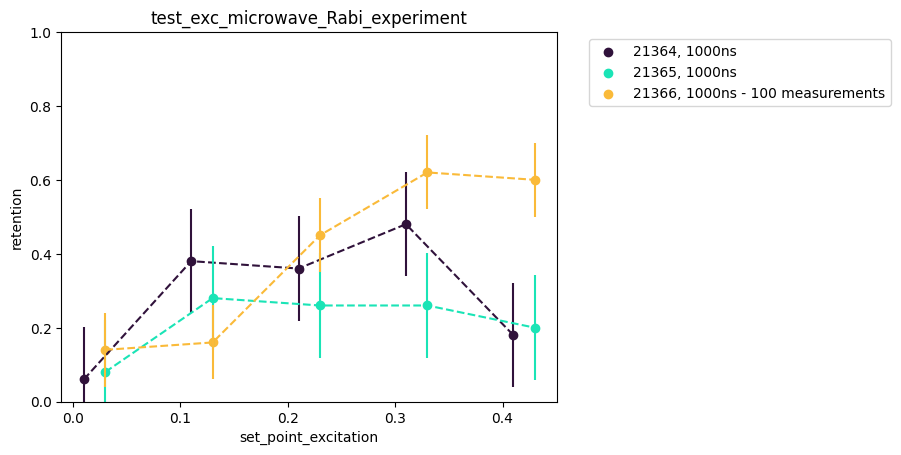

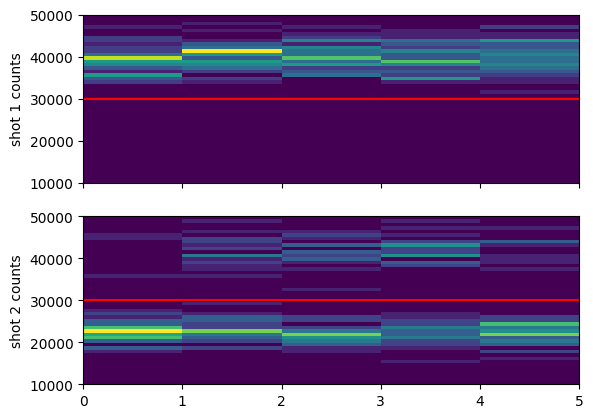

In [23]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

showhist_counts = False 


file_indices = {
#     45: '21320',
#     47: '21323',
#     49: '21326',
#     51: '21334'
# #    53: 'D1 check'
    # 64: '500ns',
    # 66: '500ns',
    68: '1000ns',
    70: '1000ns',
    73: '1000ns - 100 measurements'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    print("t_excitation_pulse: ", t_excitation_pulse*(10**9),"ns")
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


# 2025.01.05

In [5]:
fnames = get_files_by_criteria(date_filters=["2025-01-05","2025-01-06","2025-01-07"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\22\000021287-GeneralVariableScan_test_exc_microwave_Rabi_scan_over_set_point_excitation.h5, which is corrupt
found 55 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\14\000021247-GeneralVariableScan.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\14\000021248-GeneralVariableScan.h5) scanned over set_point_excitation
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\14\000021248-GeneralVariableScan_excitation_pi_time_scan_over_set_point_excitation.h5) scanned over set_point_excitation
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\15\000021250-GeneralVariableScan.h5) scanned over set_point_excitation
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2025-01-05\15\000021251-GeneralVariableScan.h5) scanned over set_point_excitation
file 5 (C:\Net

## Excitation setpoint scan wtih test_exc_microwave_Rabi_experiment - after bug fix

experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  5
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  19
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  11
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  20


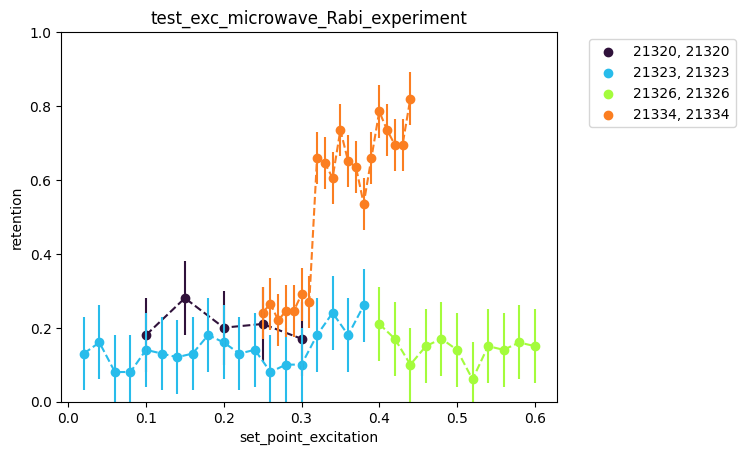

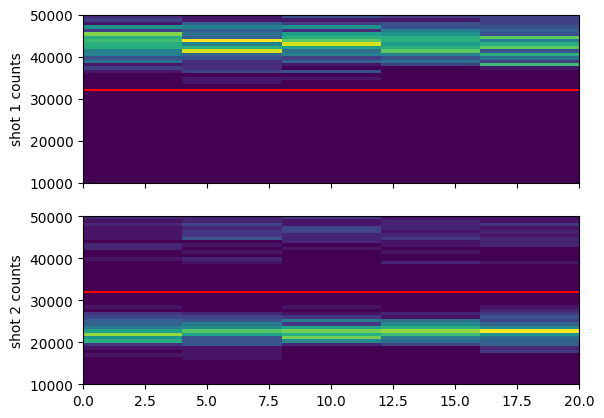

In [9]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

showhist_counts = False 


file_indices = {
    45: '21320',
    47: '21323',
    49: '21326',
    51: '21334'
#    53: 'D1 check'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


## Excitation setpoint scan wtih test_exc_microwave_Rabi_experiment

experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  9
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  9
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  9
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  10
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  3
experiment: test_exc_microwave_Rabi_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  3


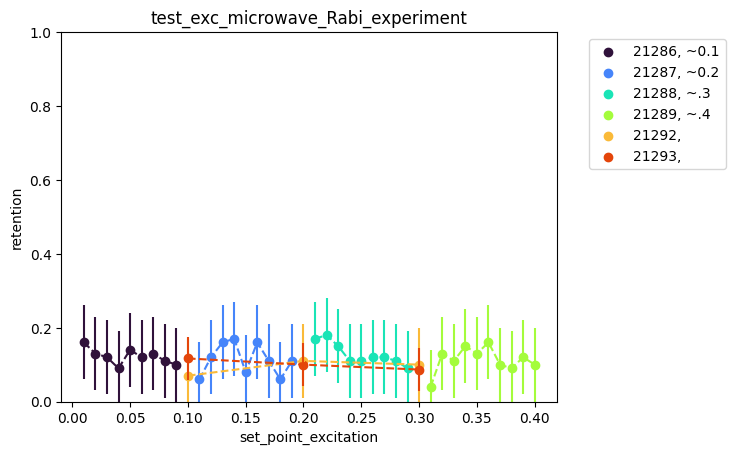

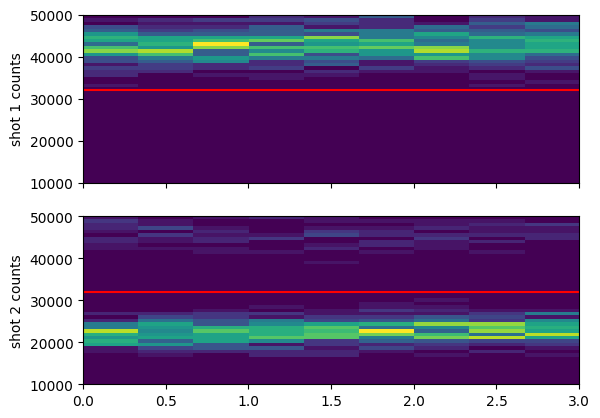

In [152]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

showhist_counts = False 


file_indices = {
    13: '~0.1',
    15: '~0.2',
    17: '~.3',
    22: '~.4',
    25: '',
    27:''
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


## Excitation setpoint scan wtih excitation_pi_time_experiment

experiment: excitation_pi_time_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  4
experiment: excitation_pi_time_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  2
iteration 1, no measurements
experiment: excitation_pi_time_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  10
experiment: excitation_pi_time_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  10
experiment: excitation_pi_time_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True}
# of iterations:  10


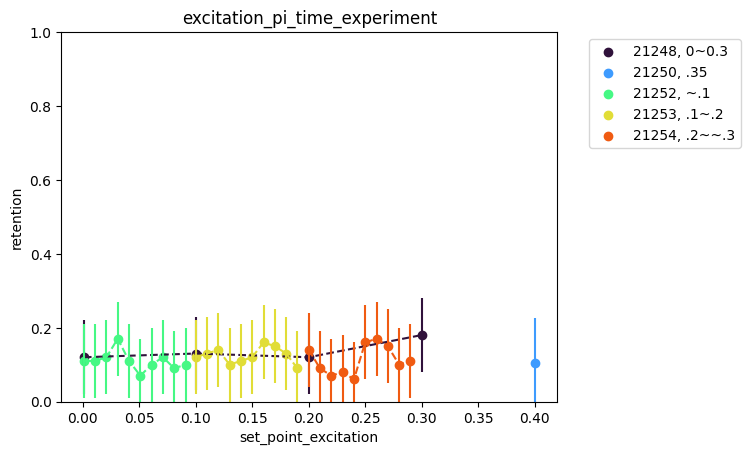

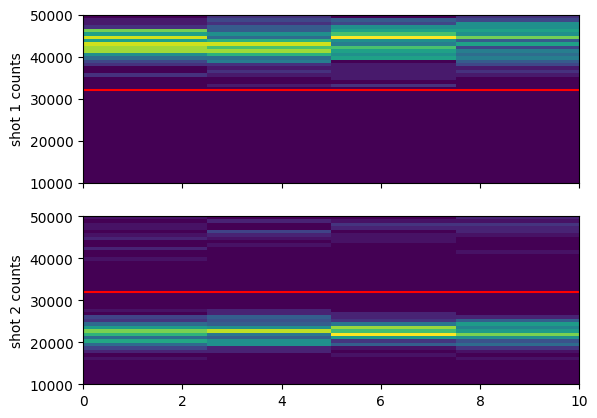

In [134]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

showhist_counts = False 


file_indices = {
    2: '0~0.3',
    3: '.35',
    7: '~.1',
    9: '.1~.2',
     11: '.2~~.3'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


# 2024.12.27

In [107]:
fnames = get_files_by_criteria(date_filters=["2024-12-26"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-26\19\000020916-GeneralVariableScan_single_photon_experiment_atom_load_scan_over_gate_start_offset_mu.h5, which is corrupt
found 3 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-26\15\000020906-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-26\15\000020906-GeneralVariableScan_single_photon_experiment_atom_load_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-26\19\000020916-GeneralVariableScan.h5) scanned over gate_start_offset_mu


## gate_start_offset - .19 excitation setpoint

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'n_measurements': 250,'require_atom_loading_to_advance_in_single_photon_exp': True,'t_recooling':5*ms,'n_excitation_cycles': 200, 'set_point_excitation': .19}
# of iterations:  16


C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


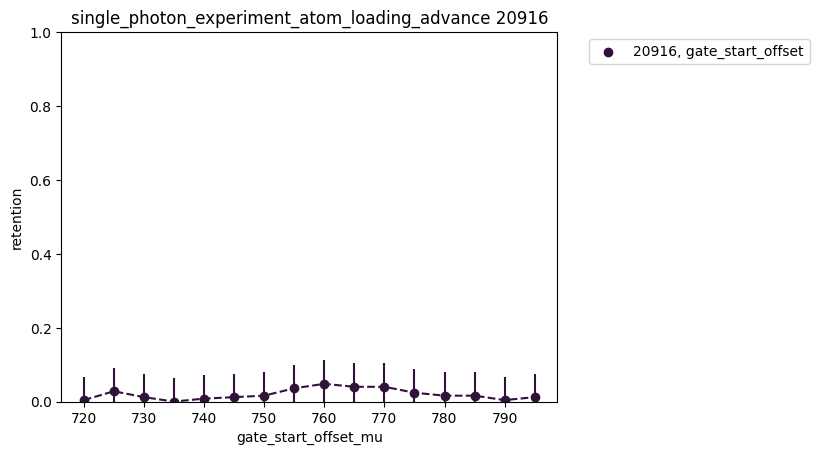

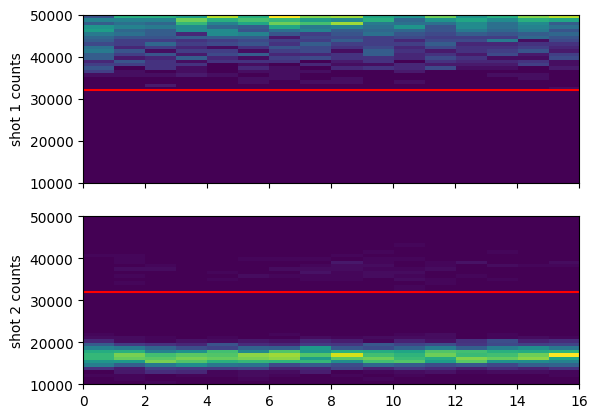

In [111]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

showhist_counts = False 


file_indices = {
    2: 'gate_start_offset'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


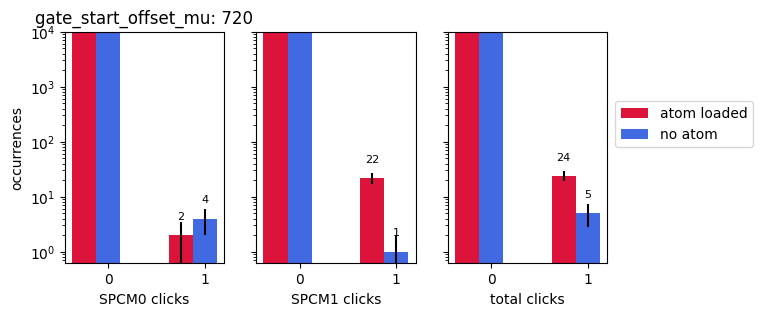

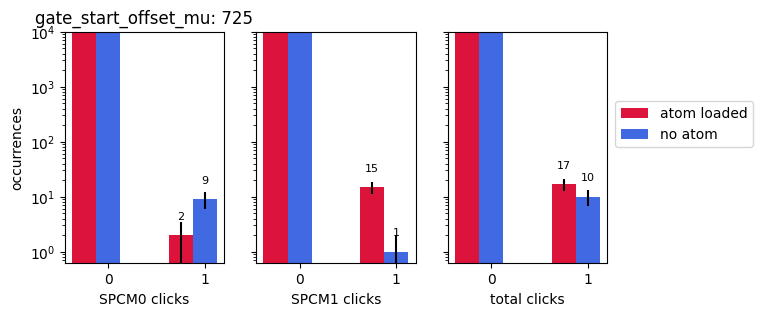

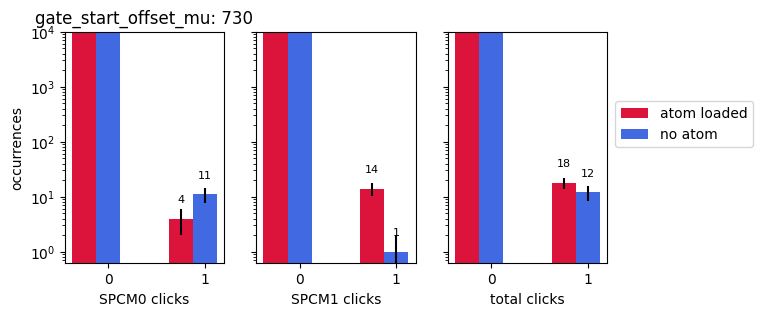

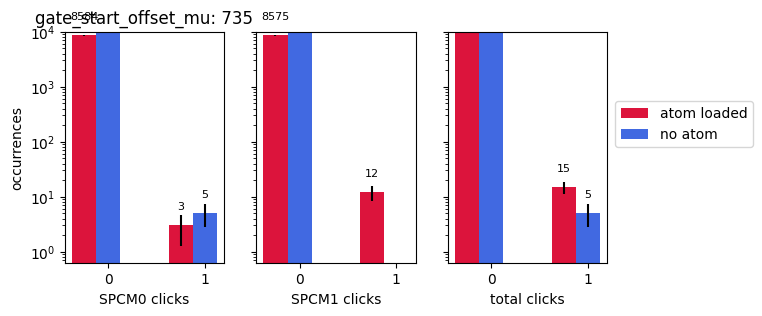

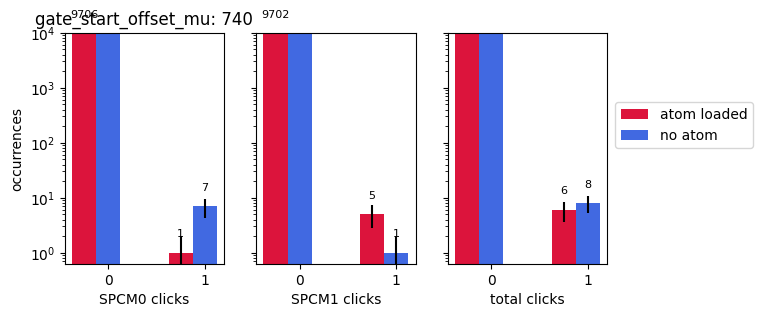

...

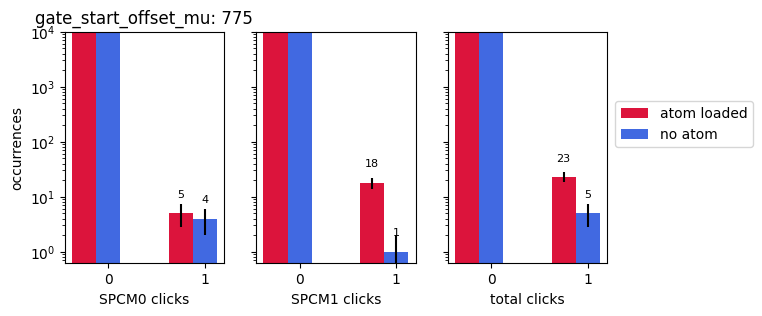

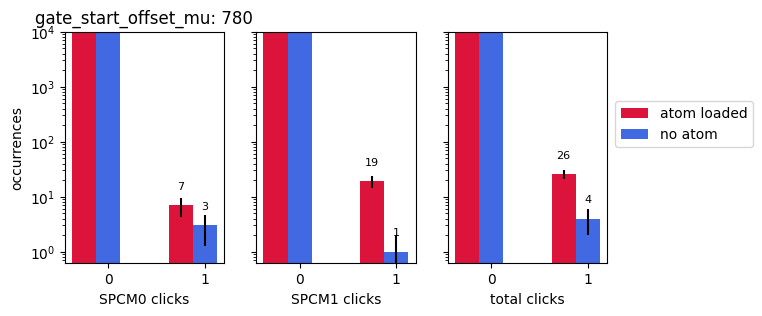

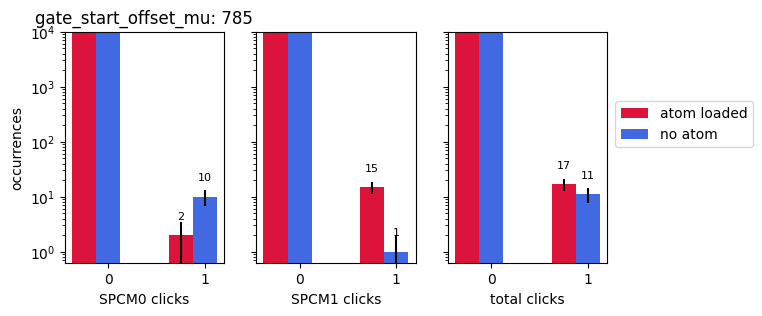

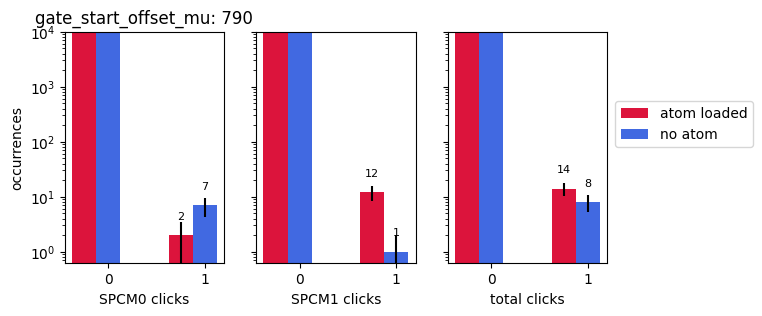

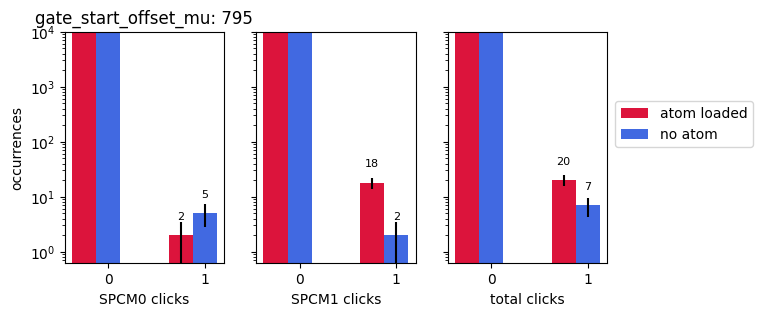

In [110]:
# todo: do not plot bin 0

max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))  #[0,1,...,max_counts+1]
units = 1e-9
unit_label = 'ns'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

atom_loaded_counts_array = np.zeros(iterations)
atom_loaded_fraction = np.zeros(iterations)

for i, var_value in zip(range(iterations),scan_sequence1):

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars


    # iteration
    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    readout_iteration_i = readout_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]

    # iteration => n_measurements => n_excitation_cycle
    
    # # first_shot
    # shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    
    # SPCM0
    photon_counts_with_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts_no_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()
    
    # SPCM1
    photon_counts1_with_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts1_no_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()

    total_mean_photons_per_cycle_with_atom = np.concatenate((photon_counts_with_atom, photon_counts1_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((photon_counts_no_atom, photon_counts1_no_atom))

    # # Ex) False count 
    # if i == 15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #     # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")

    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #     # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("i == 15")
    #     plt.legend()
    

    ##### filtering counts using first shot.
    # this is by iteration => change this to => every cycle

    # for normalization
    atom_loaded_counts = 0
    for val in readout_iteration_i:
        if val > cutoff1:
            atom_loaded_counts += 1

    atom_loaded_counts_array[i] = atom_loaded_counts
    if len(readout_iteration_i) > 0:
        atom_loaded_fraction[i] = atom_loaded_counts / len(readout_iteration_i)
    

    # if i == 10:
    #     print(mean_photons_per_cycle_with_atom)
    #     for j, val1, val2 in zip(range(len(mean_photons_per_cycle_with_atom)), mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom):
    #         if val1 > 0 or val2 >0:
    #             print(j, val1, val2)
    #     print(total_mean_photons_per_cycle_with_atom)
    #     for j, val in zip(range(len(total_mean_photons_per_cycle_with_atom)), total_mean_photons_per_cycle_with_atom):
    #         if val > 0:
    #             print(j, val)
    # iterate over the data from the two SPCMs so we can fill in a subplot for each one


    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[photon_counts_with_atom, photon_counts1_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [photon_counts_no_atom, photon_counts1_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
# plt.show()



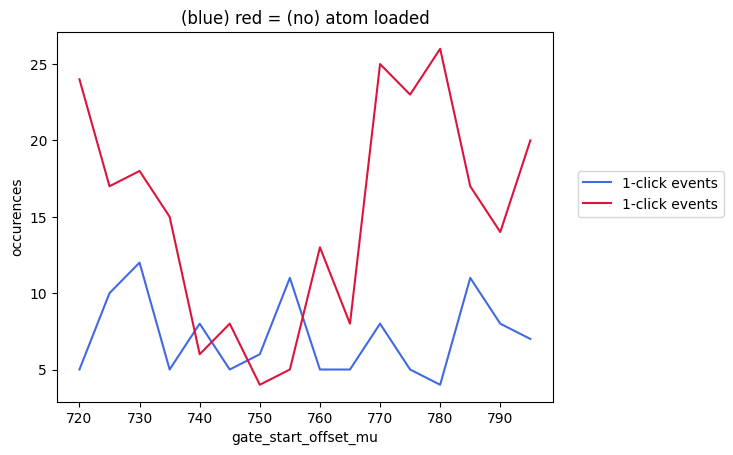

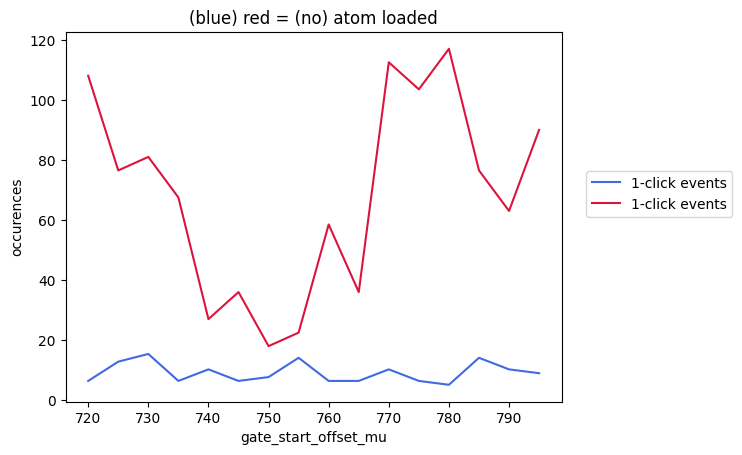

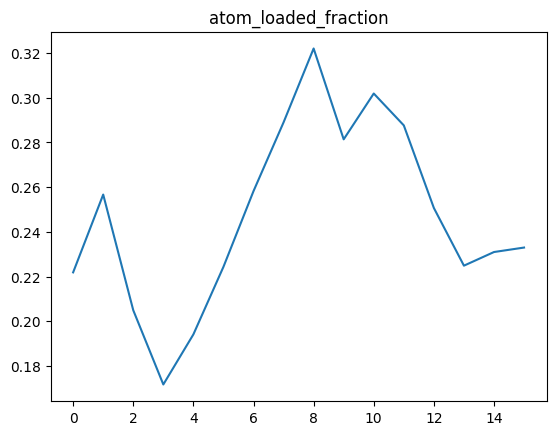

In [100]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()



# atom_loaded fraction taken into account.
counts_data_no_atom_norm = [x / (1-y) for x, y in zip(counts_data_no_atom, atom_loaded_fraction)]
counts_data_with_atom_norm = [x / y for x, y in zip(counts_data_with_atom, atom_loaded_fraction)]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()


plt.plot(atom_loaded_fraction)
plt.title("atom_loaded_fraction")
plt.show()

# 2024.12.25

In [93]:
fnames = get_files_by_criteria(date_filters=["2024-12-26"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 3 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-26\15\000020906-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-26\15\000020906-GeneralVariableScan_single_photon_experiment_atom_load_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-26\19\000020916-GeneralVariableScan_single_photon_experiment_atom_load_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu


## gate_start_offset - n_measurement = 100; somehow it just set to this itself

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'record_every_shot': True,'n_excitation_cycles': 200,'set_point_excitation': 0.19}
# of iterations:  12
iteration 9, no measurements


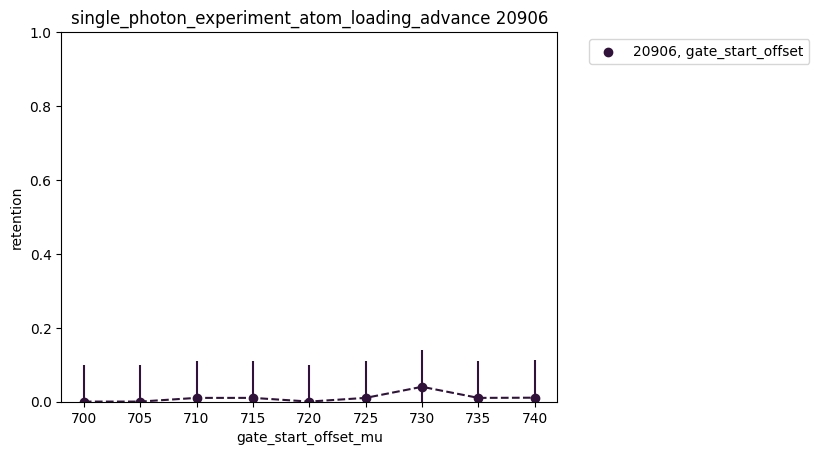

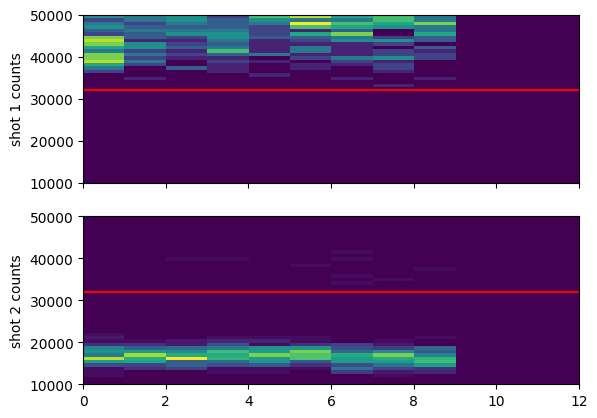

In [80]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

showhist_counts = False 


file_indices = {
    0: 'gate_start_offset'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


C:\Users\QC\AppData\Local\Temp\ipykernel_8756\4044671650.py:114: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')
C:\Users\QC\AppData\Local\Temp\ipykernel_8756\4044671650.py:114: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')
C:\Users\QC\AppData\Local\Temp\ipykernel_8756\4044671650.py:114: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


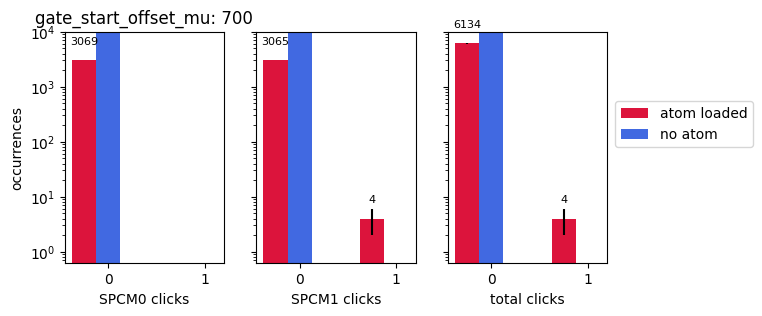

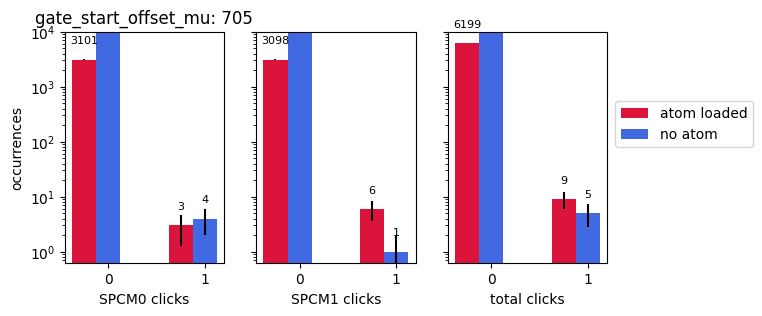

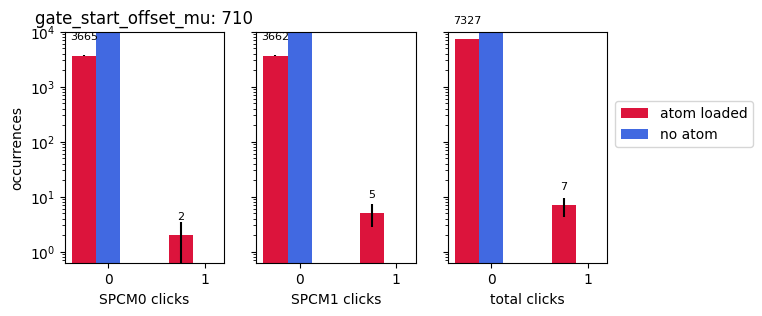

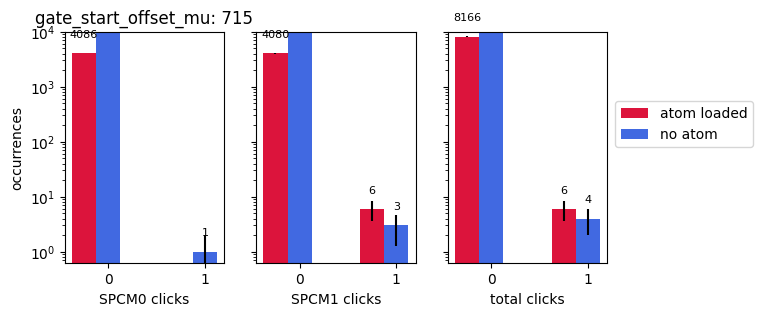

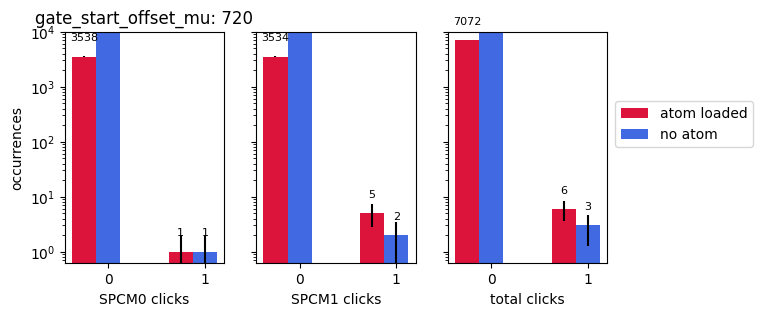

...

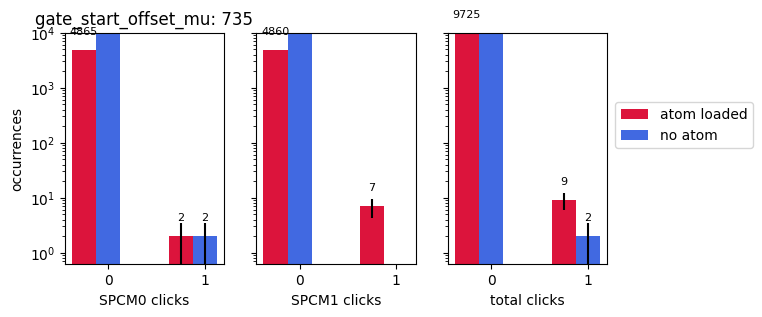

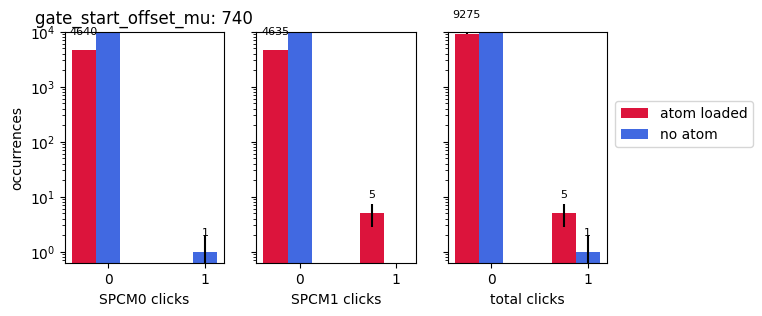

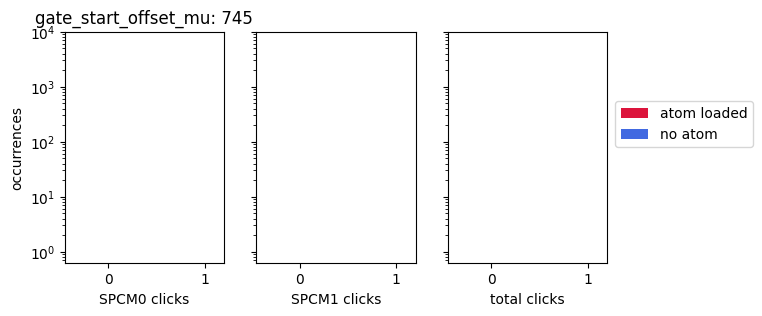

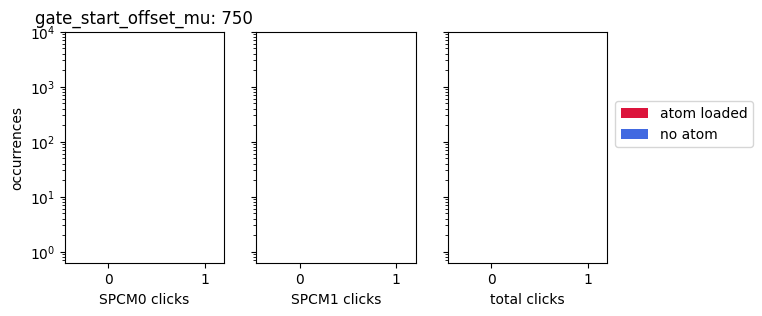

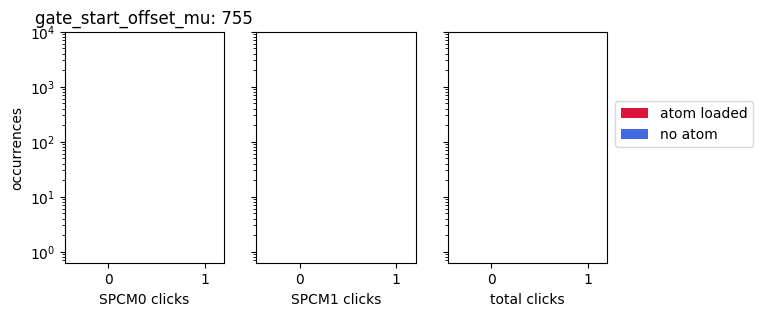

In [72]:
# todo: do not plot bin 0

max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))  #[0,1,...,max_counts+1]
units = 1e-9
unit_label = 'ns'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

atom_loaded_counts_array = np.zeros(iterations)
atom_loaded_fraction = np.zeros(iterations)

for i, var_value in zip(range(iterations),scan_sequence1):

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars


    # iteration
    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    readout_iteration_i = readout_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]

    # iteration => n_measurements => n_excitation_cycle
    
    # # first_shot
    # shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    
    # SPCM0
    photon_counts_with_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts_no_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()
    
    # SPCM1
    photon_counts1_with_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts1_no_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()

    total_mean_photons_per_cycle_with_atom = np.concatenate((photon_counts_with_atom, photon_counts1_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((photon_counts_no_atom, photon_counts1_no_atom))

    # # Ex) False count 
    # if i == 15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #     # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")

    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #     # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("i == 15")
    #     plt.legend()
    

    ##### filtering counts using first shot.
    # this is by iteration => change this to => every cycle

    # for normalization
    atom_loaded_counts = 0
    for val in readout_iteration_i:
        if val > cutoff1:
            atom_loaded_counts += 1

    atom_loaded_counts_array[i] = atom_loaded_counts
    if len(readout_iteration_i) > 0:
        atom_loaded_fraction[i] = atom_loaded_counts / len(readout_iteration_i)
    

    # if i == 10:
    #     print(mean_photons_per_cycle_with_atom)
    #     for j, val1, val2 in zip(range(len(mean_photons_per_cycle_with_atom)), mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom):
    #         if val1 > 0 or val2 >0:
    #             print(j, val1, val2)
    #     print(total_mean_photons_per_cycle_with_atom)
    #     for j, val in zip(range(len(total_mean_photons_per_cycle_with_atom)), total_mean_photons_per_cycle_with_atom):
    #         if val > 0:
    #             print(j, val)
    # iterate over the data from the two SPCMs so we can fill in a subplot for each one

    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[photon_counts_with_atom, photon_counts1_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [photon_counts_no_atom, photon_counts1_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
plt.show()


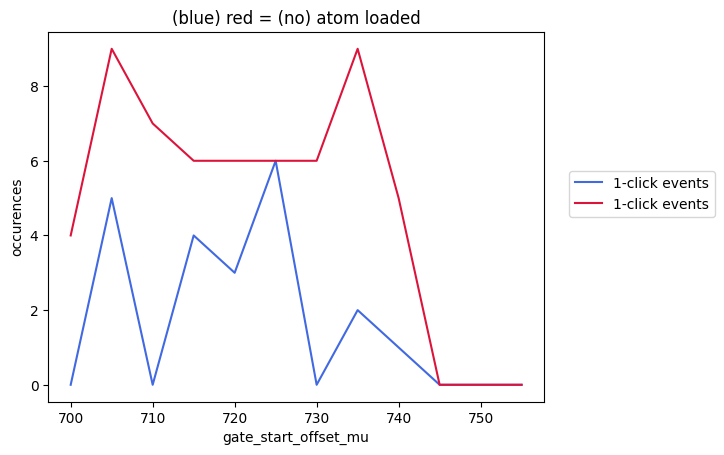

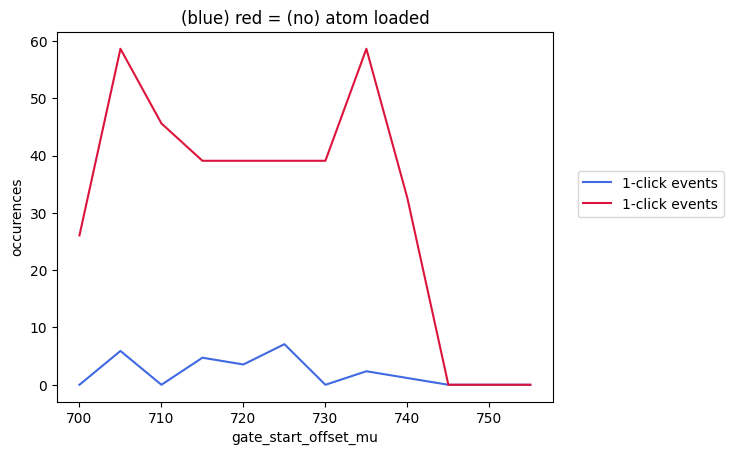

In [81]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()



# atom_loaded fraction taken into account.
counts_data_no_atom_norm = [x / (1-y) for x, y in zip(counts_data_no_atom, atom_loaded_fraction)]
counts_data_with_atom_norm = [x / y for x, y in zip(counts_data_with_atom, atom_loaded_fraction)]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# 2024.12.25

In [83]:
fnames = get_files_by_criteria(date_filters=["2024-12-24", "2024-12-25"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-25\11\000020868-GeneralVariableScan_single_photon_experiment_atom_load_scan_over_set_point_excitation.h5, which is corrupt
found 41 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020830-GeneralVariableScan.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020830-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020831-GeneralVariableScan.h5) scanned over dummy_variable
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020833-GeneralVariableScan.h5) scanned over dummy_variable
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020834-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (C:\Networking Experiment\artiq

## gate_start_offset

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'record_every_shot': True,'n_excitation_cycles': 200,'set_point_excitation': 0.18}
# of iterations:  10


C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


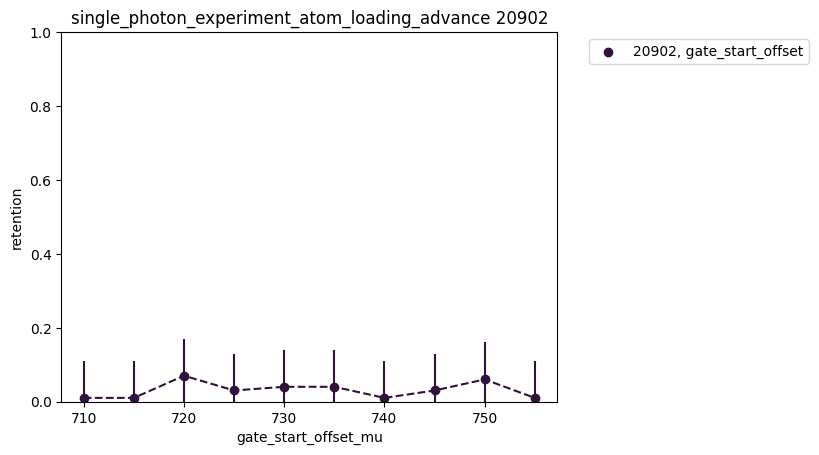

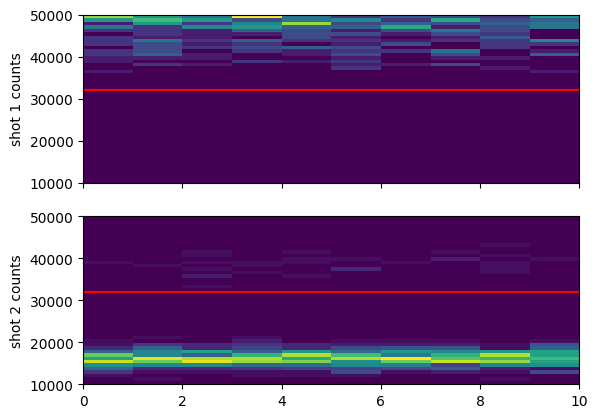

In [47]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

showhist_counts = False 


file_indices = {

    40: 'gate_start_offset'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


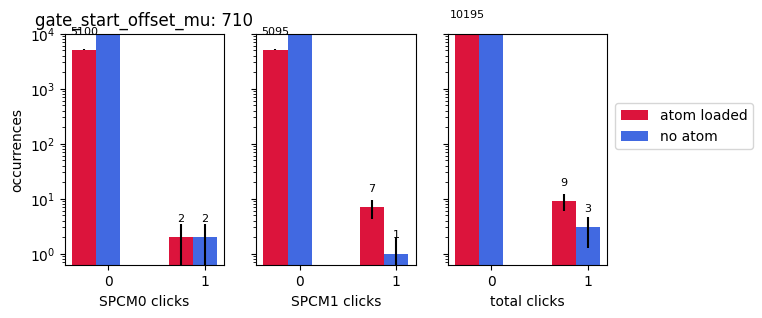

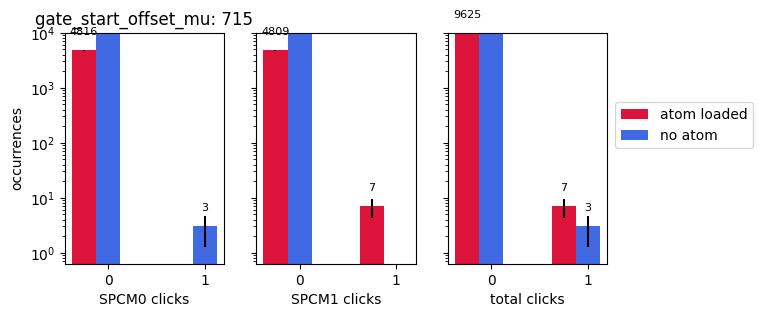

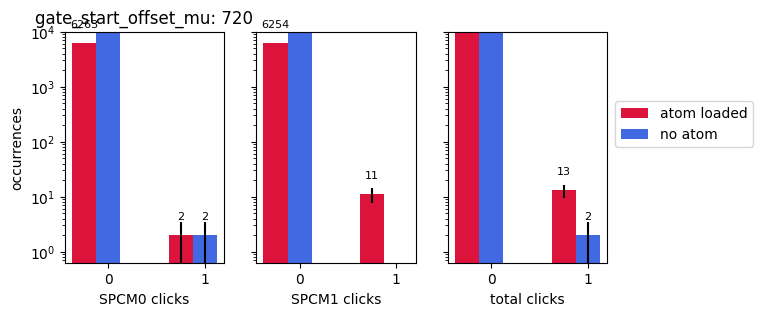

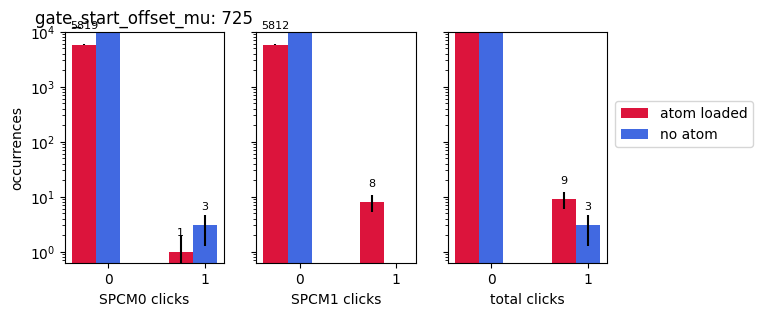

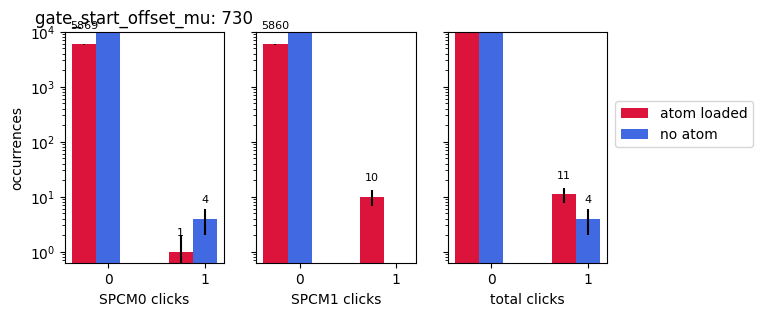

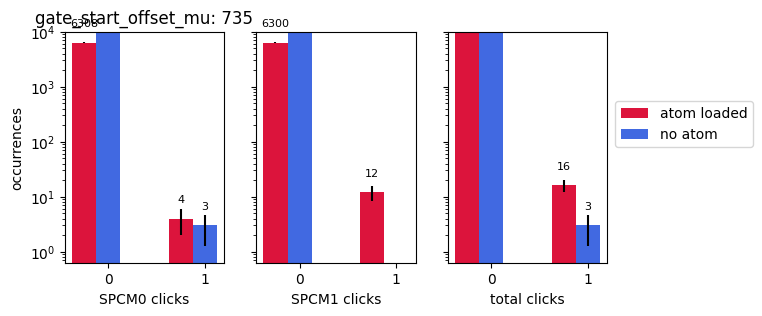

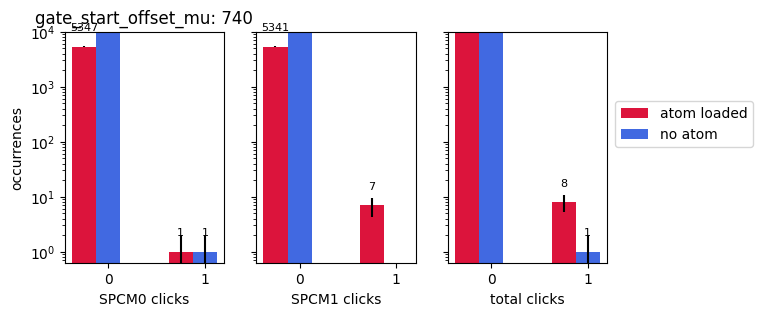

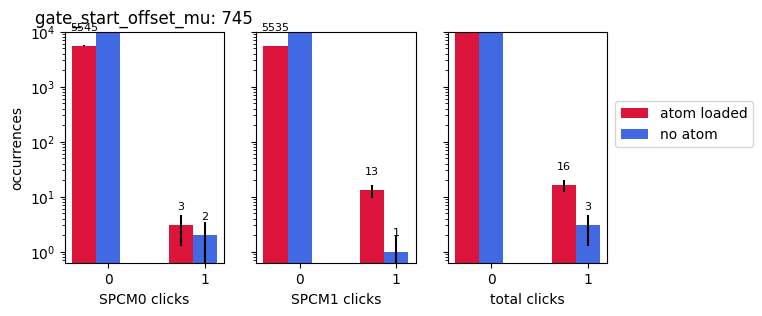

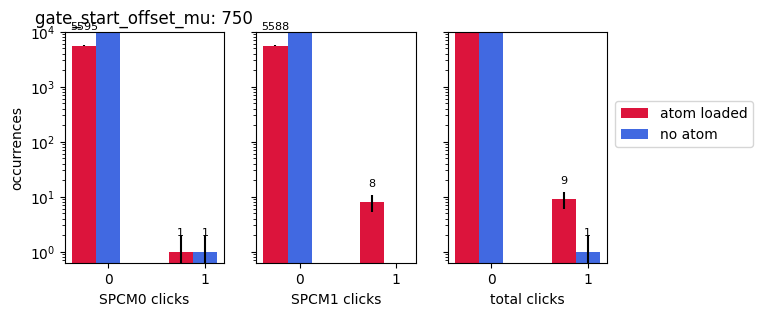

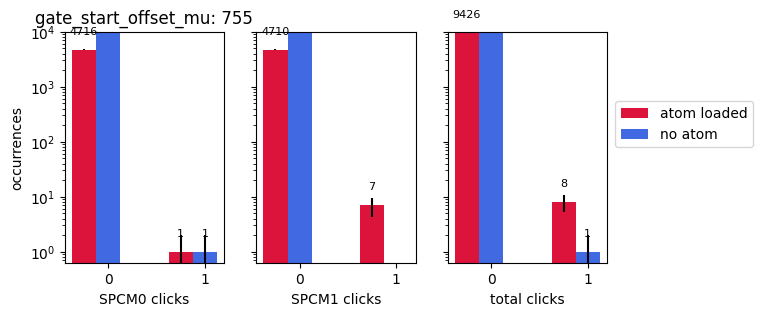

0.18

In [51]:
# todo: do not plot bin 0

max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))  #[0,1,...,max_counts+1]
units = 1e-9
unit_label = 'ns'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

atom_loaded_counts_array = np.zeros(iterations)
atom_loaded_fraction = np.zeros(iterations)

for i, var_value in zip(range(iterations),scan_sequence1):

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars


    # iteration
    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    readout_iteration_i = readout_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]

    # iteration => n_measurements => n_excitation_cycle
    
    # # first_shot
    # shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    
    # SPCM0
    photon_counts_with_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts_no_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()
    
    # SPCM1
    photon_counts1_with_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts1_no_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()

    total_mean_photons_per_cycle_with_atom = np.concatenate((photon_counts_with_atom, photon_counts1_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((photon_counts_no_atom, photon_counts1_no_atom))

    # # Ex) False count 
    # if i == 15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #     # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")

    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #     # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("i == 15")
    #     plt.legend()
    

    ##### filtering counts using first shot.
    # this is by iteration => change this to => every cycle

    # for normalization
    atom_loaded_counts = 0
    for val in readout_iteration_i:
        if val > cutoff1:
            atom_loaded_counts += 1

    atom_loaded_counts_array[i] = atom_loaded_counts
    atom_loaded_fraction[i] = atom_loaded_counts / len(readout_iteration_i)
    

    # if i == 10:
    #     print(mean_photons_per_cycle_with_atom)
    #     for j, val1, val2 in zip(range(len(mean_photons_per_cycle_with_atom)), mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom):
    #         if val1 > 0 or val2 >0:
    #             print(j, val1, val2)
    #     print(total_mean_photons_per_cycle_with_atom)
    #     for j, val in zip(range(len(total_mean_photons_per_cycle_with_atom)), total_mean_photons_per_cycle_with_atom):
    #         if val > 0:
    #             print(j, val)
    # iterate over the data from the two SPCMs so we can fill in a subplot for each one

    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[photon_counts_with_atom, photon_counts1_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [photon_counts_no_atom, photon_counts1_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
plt.show()


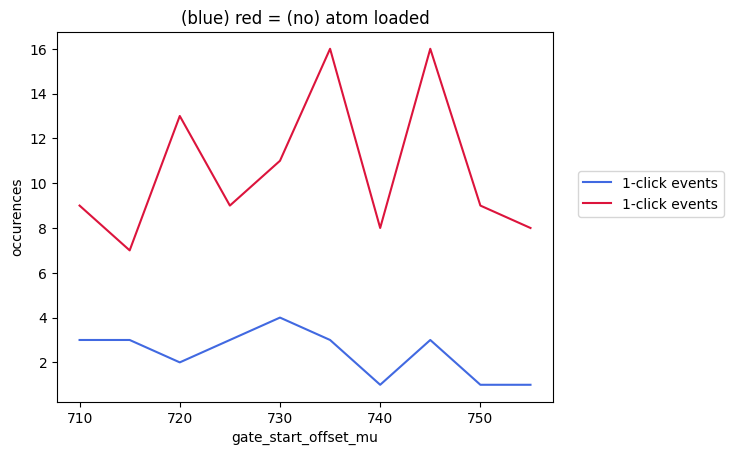

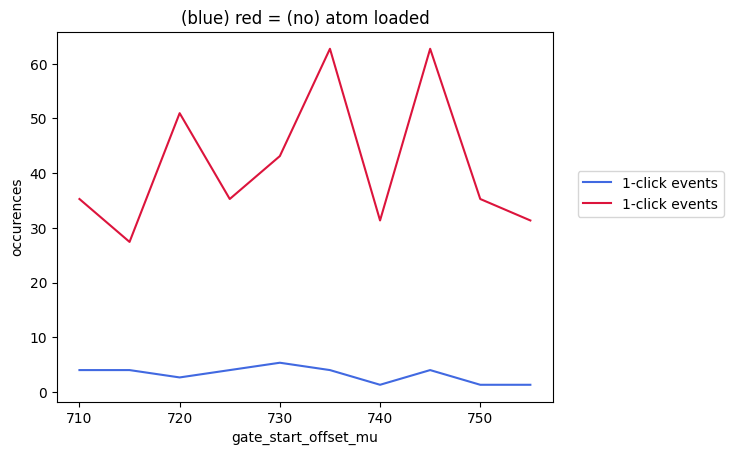

In [56]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()



# atom_loaded fraction taken into account.
counts_data_no_atom_norm = [x / (1-y) for x, y in zip(counts_data_no_atom, atom_loaded_fraction)]
counts_data_with_atom_norm = [x / y for x, y in zip(counts_data_with_atom, atom_loaded_fraction)]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

## excitation setpoint scan - short range scan .18 ~.22

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'record_every_shot': True,'n_excitation_cycles': 200, 'gate_start_offset_mu': 720}
# of iterations:  5


C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


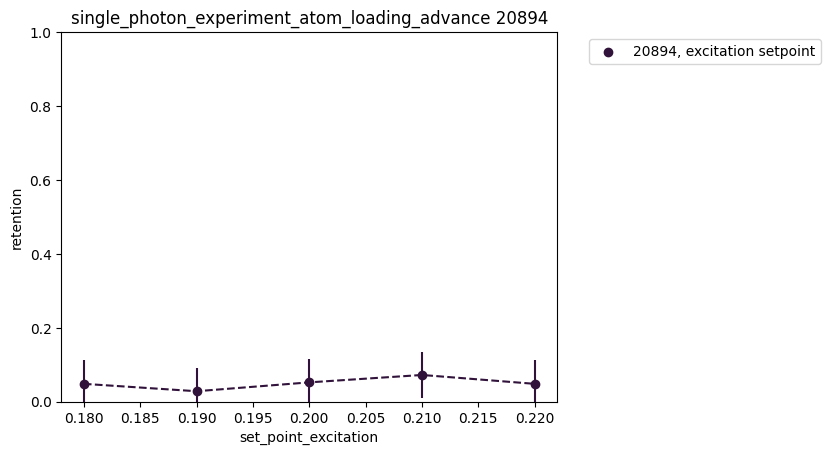

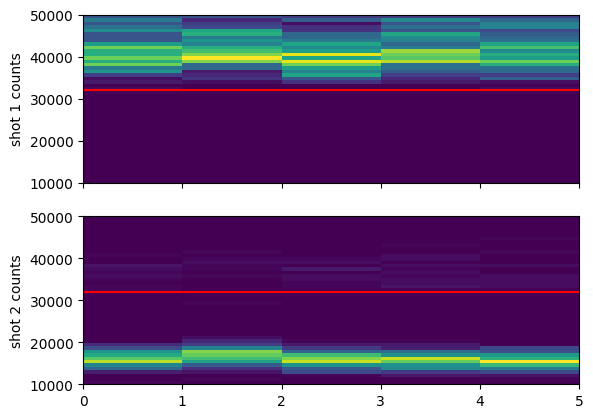

250

In [77]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False


file_indices = {
    # 34: 'excitation setpoint - D1 unlocked at some point',
    37: 'excitation setpoint'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT
n_measurements

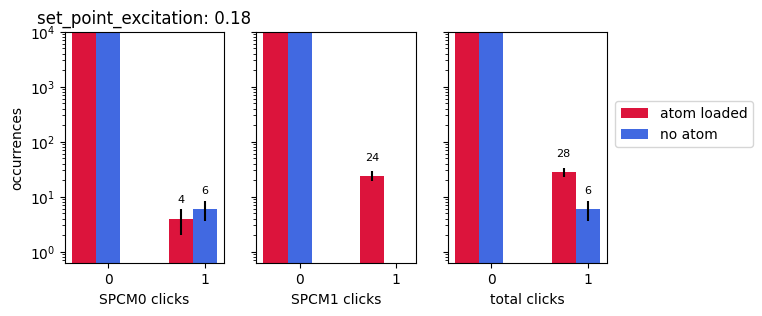

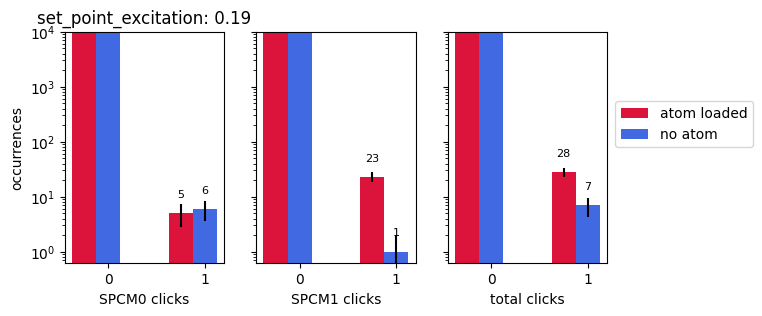

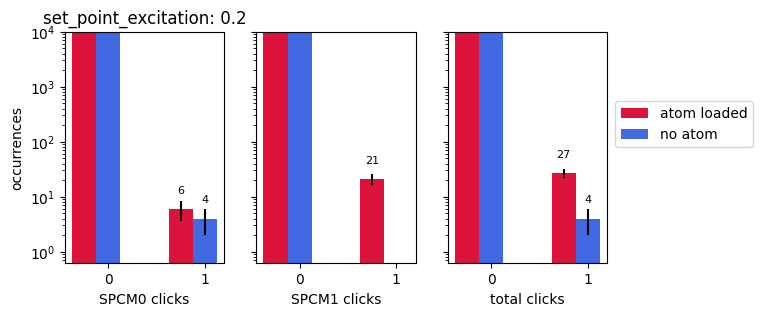

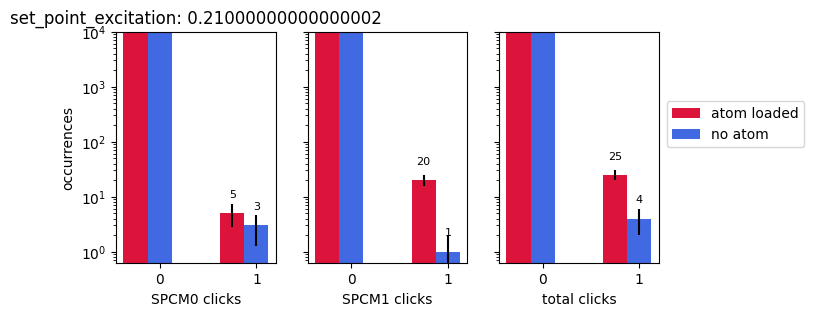

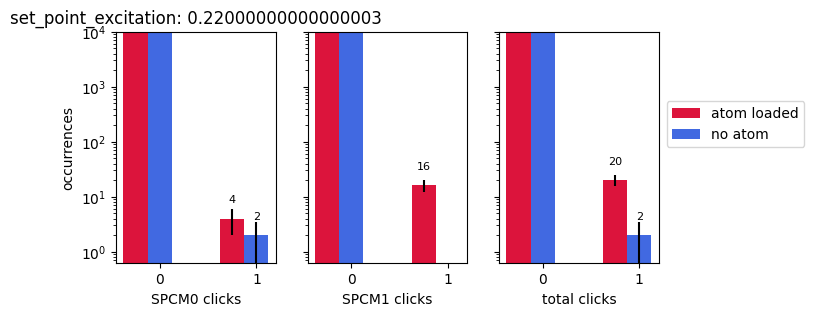

In [60]:
# todo: do not plot bin 0

max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))  #[0,1,...,max_counts+1]
units = 1e-9
unit_label = 'ns'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars


    # iteration
    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    readout_iteration_i = readout_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]

    # iteration => n_measurements => n_excitation_cycle
    
    # # first_shot
    # shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM0
    photon_counts_with_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts_no_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()
    
    # SPCM1
    photon_counts1_with_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts1_no_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()

    total_mean_photons_per_cycle_with_atom = np.concatenate((photon_counts_with_atom, photon_counts1_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((photon_counts_no_atom, photon_counts1_no_atom))

    # # Ex) False count 
    # if i == 15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #     # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")

    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #     # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("i == 15")
    #     plt.legend()
    

    ##### filtering counts using first shot.
    # this is by iteration => change this to => every cycle
    
    # for normalization
    atom_loaded_counts = 0
    for val in readout_iteration_i:
        if val > cutoff1:
            atom_loaded_counts += 1

    atom_loaded_counts_array[i] = atom_loaded_counts
    atom_loaded_fraction[i] = atom_loaded_counts / len(readout_iteration_i)

    # if i == 10:
    #     print(mean_photons_per_cycle_with_atom)
    #     for j, val1, val2 in zip(range(len(mean_photons_per_cycle_with_atom)), mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom):
    #         if val1 > 0 or val2 >0:
    #             print(j, val1, val2)
    #     print(total_mean_photons_per_cycle_with_atom)
    #     for j, val in zip(range(len(total_mean_photons_per_cycle_with_atom)), total_mean_photons_per_cycle_with_atom):
    #         if val > 0:
    #             print(j, val)
    # iterate over the data from the two SPCMs so we can fill in a subplot for each one


    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[photon_counts_with_atom, photon_counts1_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [photon_counts_no_atom, photon_counts1_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
plt.show()


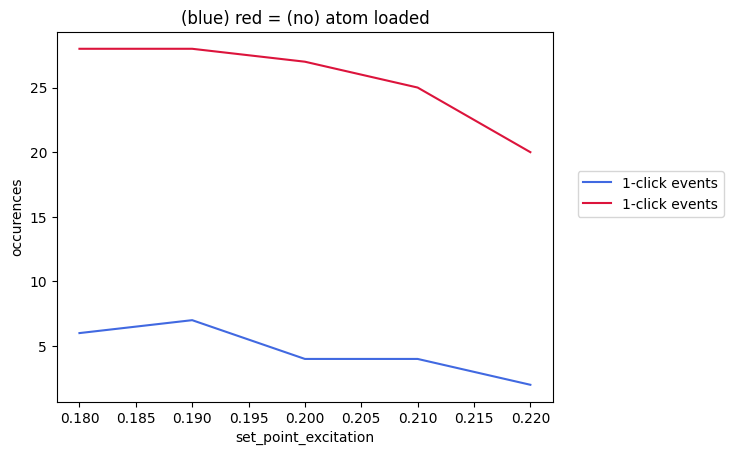

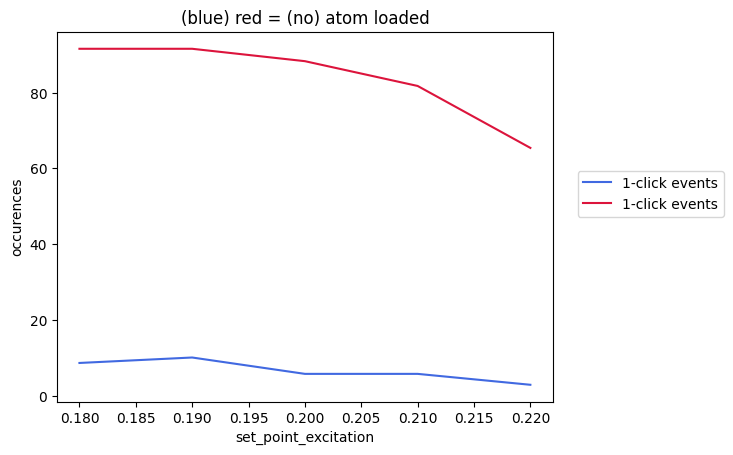

In [61]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# atom_loaded fraction taken into account.
counts_data_no_atom_norm = [x / (1-y) for x, y in zip(counts_data_no_atom, atom_loaded_fraction)]
counts_data_with_atom_norm = [x / y for x, y in zip(counts_data_with_atom, atom_loaded_fraction)]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

In [26]:
counts_data_with_atom

array([[28, 28, 27, 25, 20]], dtype=int64)

## excitation setpoint scan - short range scan .15 ~ .20 - oh no... its corrupt now

C:\Users\QC\AppData\Local\Temp\ipykernel_4300\885248075.py:101: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')
C:\Users\QC\AppData\Local\Temp\ipykernel_4300\885248075.py:101: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')
C:\Users\QC\AppData\Local\Temp\ipykernel_4300\885248075.py:101: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


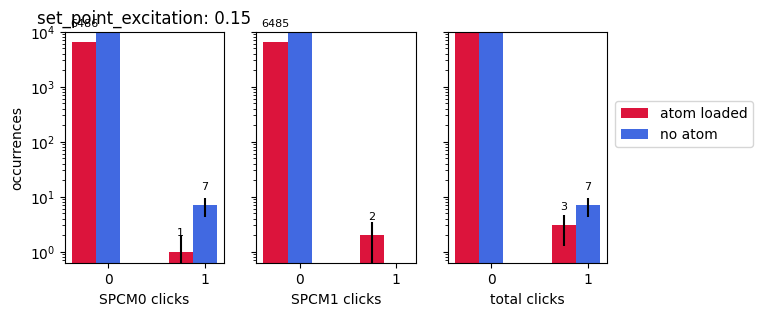

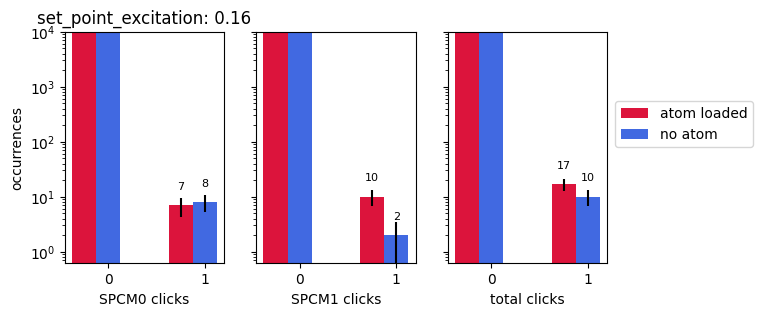

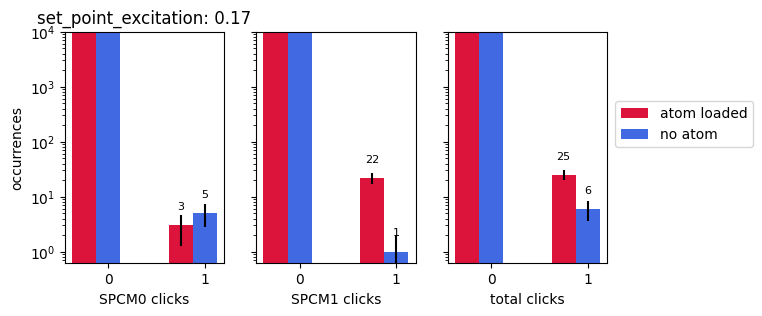

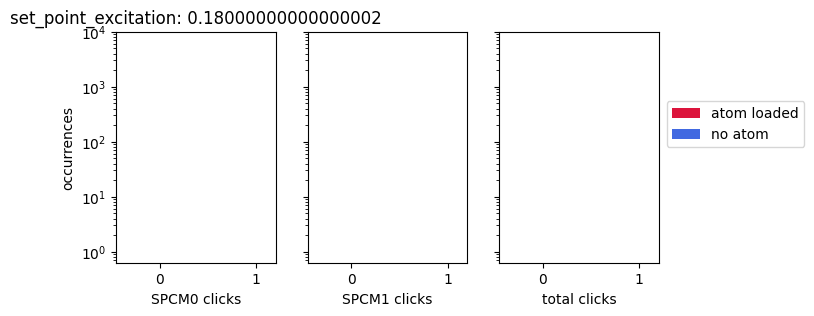

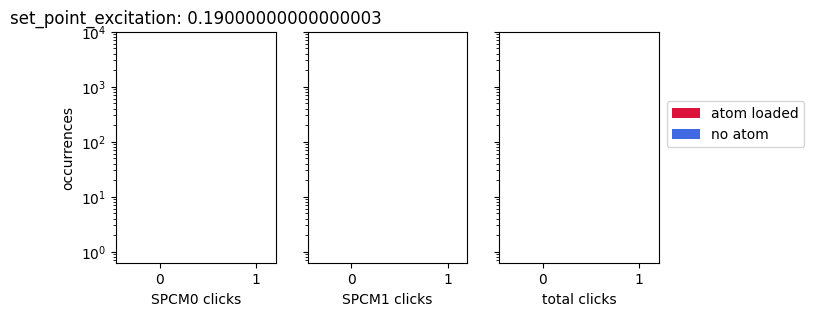

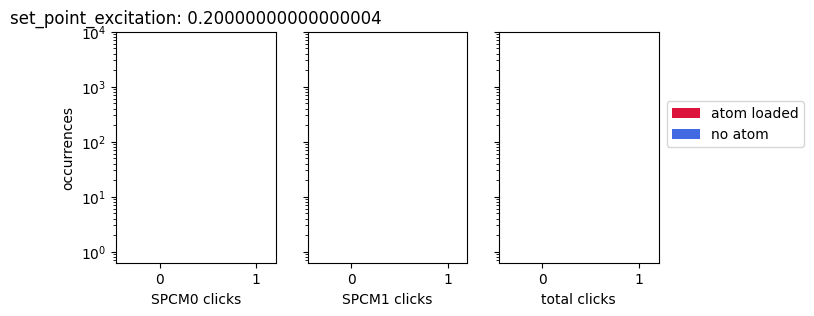

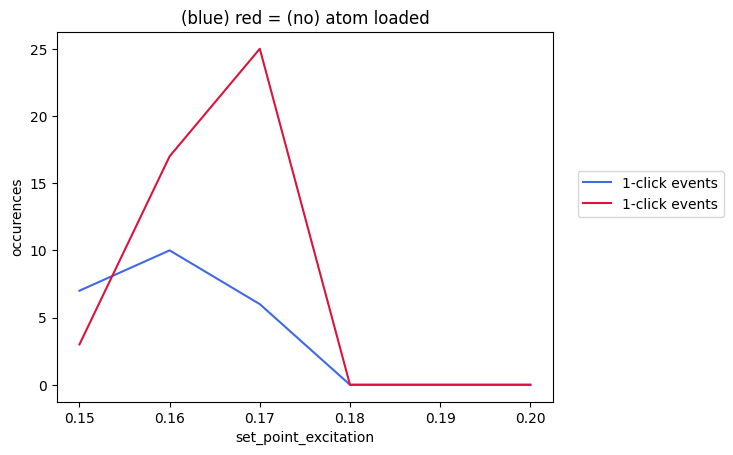

In [41]:
# todo: do not plot bin 0

max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))  #[0,1,...,max_counts+1]
units = 1e-9
unit_label = 'ns'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars


    # iteration
    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    readout_iteration_i = readout_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]

    # iteration => n_measurements => n_excitation_cycle
    
    # # first_shot
    # shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM0
    photon_counts_with_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts_no_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()
    
    # SPCM1
    photon_counts1_with_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts1_no_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()

    total_mean_photons_per_cycle_with_atom = np.concatenate((photon_counts_with_atom, photon_counts1_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((photon_counts_no_atom, photon_counts1_no_atom))

    # # Ex) False count 
    # if i == 15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #     # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")

    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #     # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("i == 15")
    #     plt.legend()
    

    ##### filtering counts using first shot.
    # this is by iteration => change this to => every cycle
    


    # if i == 10:
    #     print(mean_photons_per_cycle_with_atom)
    #     for j, val1, val2 in zip(range(len(mean_photons_per_cycle_with_atom)), mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom):
    #         if val1 > 0 or val2 >0:
    #             print(j, val1, val2)
    #     print(total_mean_photons_per_cycle_with_atom)
    #     for j, val in zip(range(len(total_mean_photons_per_cycle_with_atom)), total_mean_photons_per_cycle_with_atom):
    #         if val > 0:
    #             print(j, val)
    # iterate over the data from the two SPCMs so we can fill in a subplot for each one


    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[photon_counts_with_atom, photon_counts1_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [photon_counts_no_atom, photon_counts1_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
plt.show()


counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()


In [61]:
counts_data_no_atom

array([[ 7, 10,  6,  0,  0,  0]], dtype=int64)

In [62]:
counts_data_with_atom

array([[ 3, 17, 25,  0,  0,  0]], dtype=int64)

(7, 10, 6)

## excitation setpoint scan - short range scan .20~.25

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'record_every_shot': True,'n_excitation_cycles': 200, 'gate_start_offset_mu': 720}
# of iterations:  5


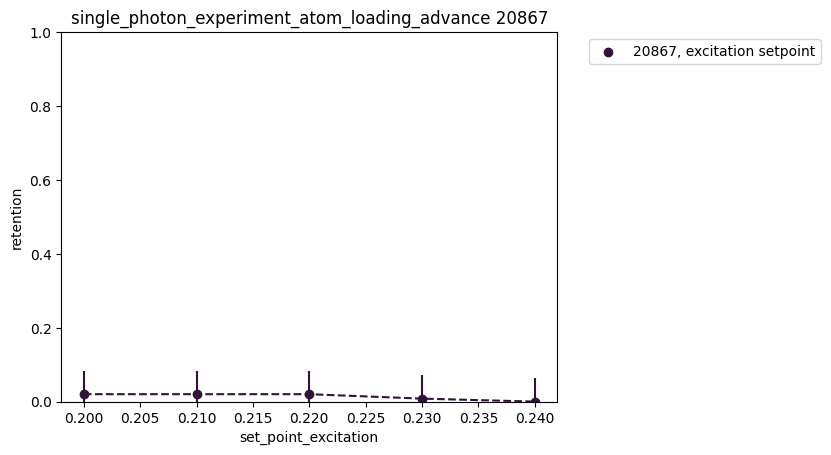

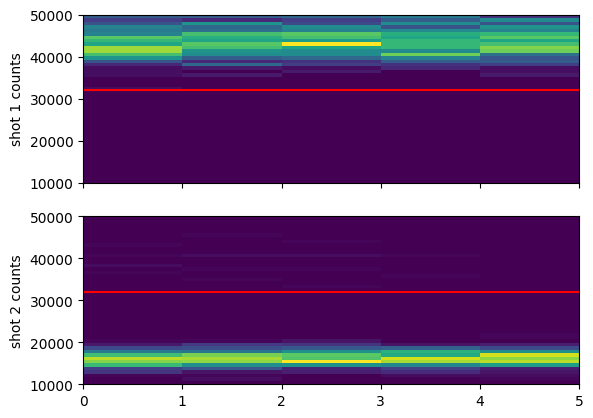

In [63]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False


file_indices = {
    # 34: 'excitation setpoint - D1 unlocked at some point',
    36: 'excitation setpoint'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


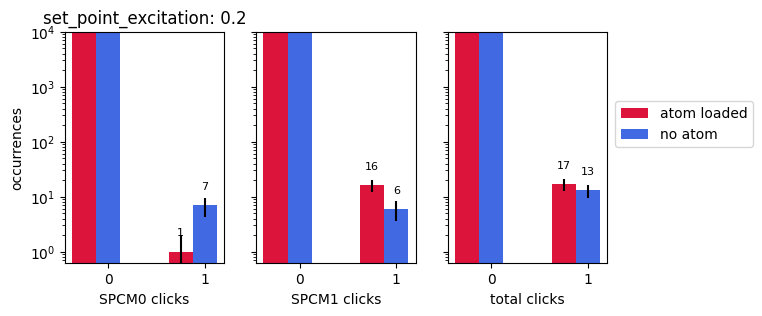

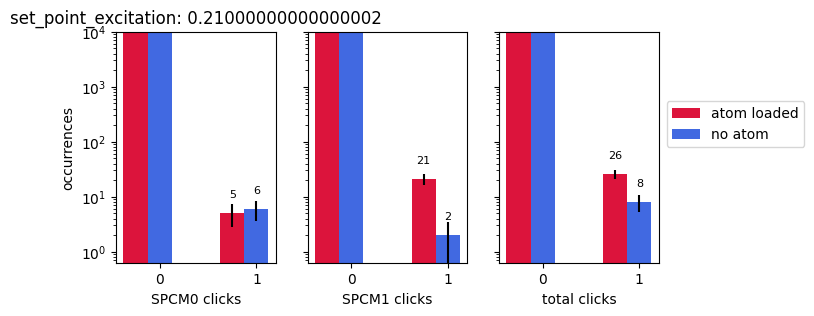

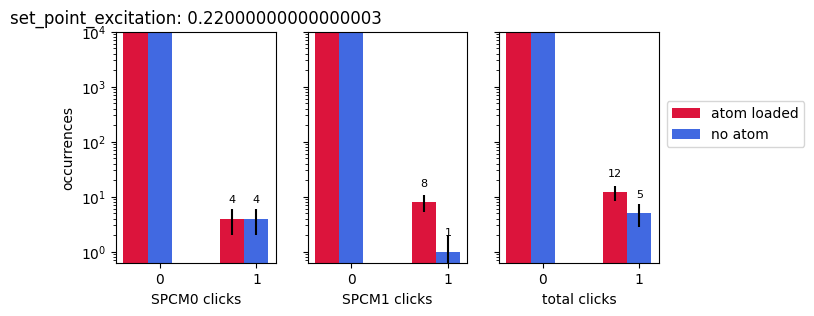

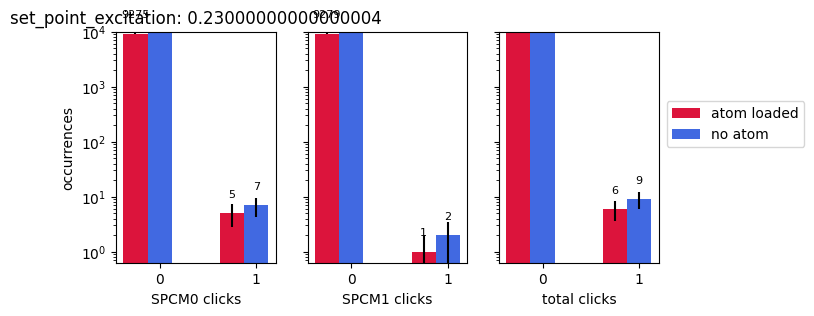

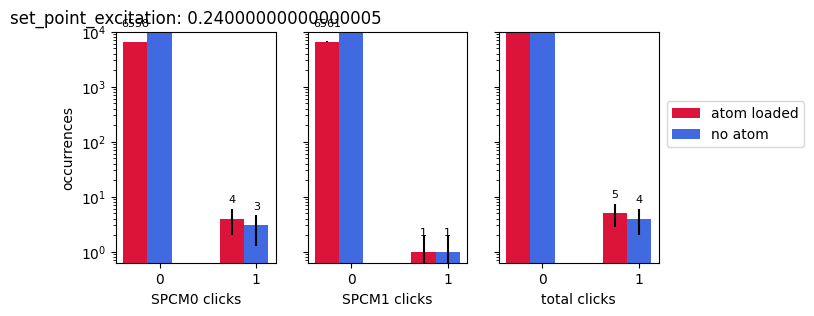

In [64]:
# todo: do not plot bin 0

max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))  #[0,1,...,max_counts+1]
units = 1e-9
unit_label = 'ns'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars


    # iteration
    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    readout_iteration_i = readout_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]

    # iteration => n_measurements => n_excitation_cycle
    
    # # first_shot
    # shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM0
    photon_counts_with_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts_no_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()
    
    # SPCM1
    photon_counts1_with_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts1_no_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()

    total_mean_photons_per_cycle_with_atom = np.concatenate((photon_counts_with_atom, photon_counts1_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((photon_counts_no_atom, photon_counts1_no_atom))

    # # Ex) False count 
    # if i == 15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #     # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")

    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #     # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("i == 15")
    #     plt.legend()
    

    ##### filtering counts using first shot.
    # this is by iteration => change this to => every cycle
    
    # for normalization
    atom_loaded_counts = 0
    for val in readout_iteration_i:
        if val > cutoff1:
            atom_loaded_counts += 1

    atom_loaded_counts_array[i] = atom_loaded_counts
    atom_loaded_fraction[i] = atom_loaded_counts / len(readout_iteration_i)

    # if i == 10:
    #     print(mean_photons_per_cycle_with_atom)
    #     for j, val1, val2 in zip(range(len(mean_photons_per_cycle_with_atom)), mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom):
    #         if val1 > 0 or val2 >0:
    #             print(j, val1, val2)
    #     print(total_mean_photons_per_cycle_with_atom)
    #     for j, val in zip(range(len(total_mean_photons_per_cycle_with_atom)), total_mean_photons_per_cycle_with_atom):
    #         if val > 0:
    #             print(j, val)
    # iterate over the data from the two SPCMs so we can fill in a subplot for each one


    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[photon_counts_with_atom, photon_counts1_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [photon_counts_no_atom, photon_counts1_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
plt.show()


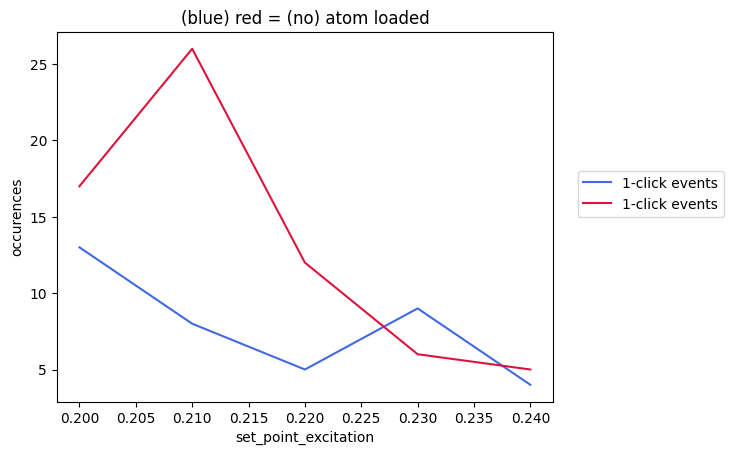

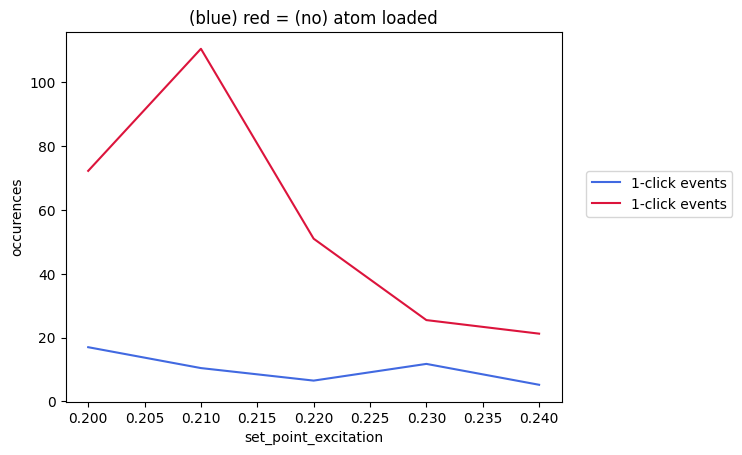

In [65]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()
# atom_loaded fraction taken into account.
counts_data_no_atom_norm = [x / (1-y) for x, y in zip(counts_data_no_atom, atom_loaded_fraction)]
counts_data_with_atom_norm = [x / y for x, y in zip(counts_data_with_atom, atom_loaded_fraction)]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

In [21]:
counts_data_no_atom

array([[13,  8,  5,  9,  4]], dtype=int64)

In [22]:
counts_data_with_atom

array([[17, 26, 12,  6,  5]], dtype=int64)

In [23]:
scan_sequence1

array([0.2 , 0.21, 0.22, 0.23, 0.24])

## excitation setpoint scan - D1 unlocked at some point

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'record_every_shot': True,'n_excitation_cycles': 200, 'set_point_excitation': 0.055}
# of iterations:  24
iteration 21, no measurements


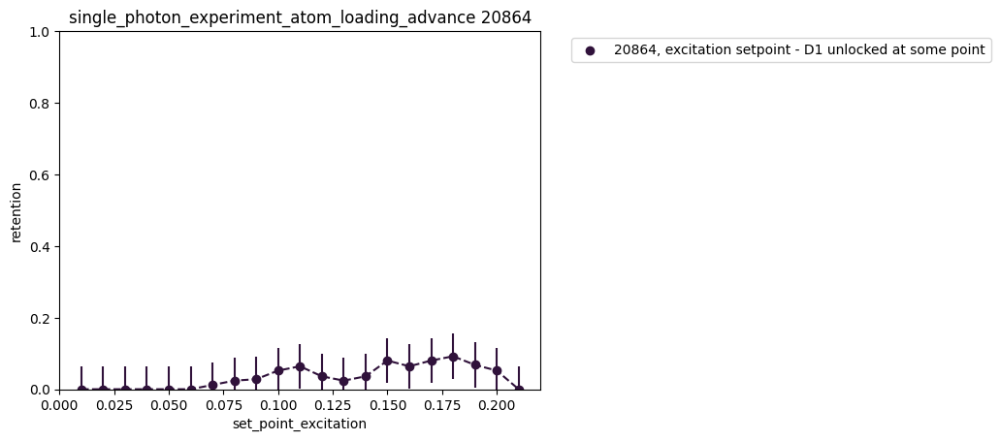

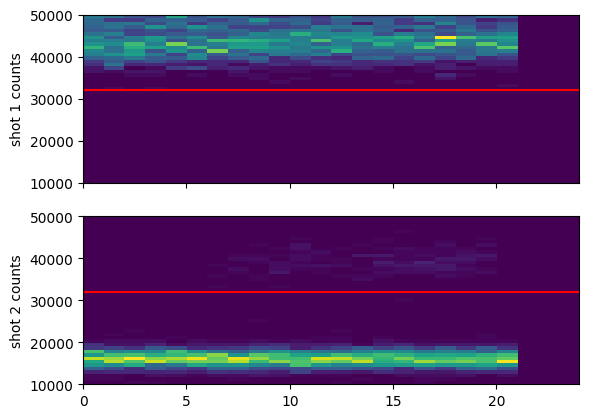

In [84]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False


file_indices = {
    34: 'excitation setpoint - D1 unlocked at some point',
    # 36: 'excitation setpoint'
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


C:\Users\QC\AppData\Local\Temp\ipykernel_8756\2002997539.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)
C:\Users\QC\AppData\Local\Temp\ipykernel_8756\2002997539.py:126: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')
C:\Users\QC\AppData\Local\Temp\ipykernel_8756\2002997539.py:126: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')
C:\Users\QC\AppData\Local\Temp\ipykernel_8756\2002997539.py:126: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


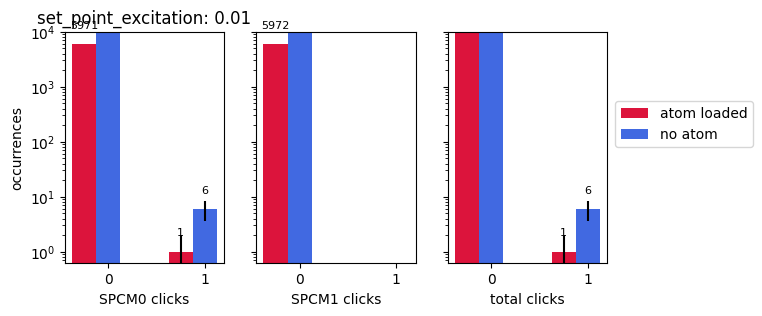

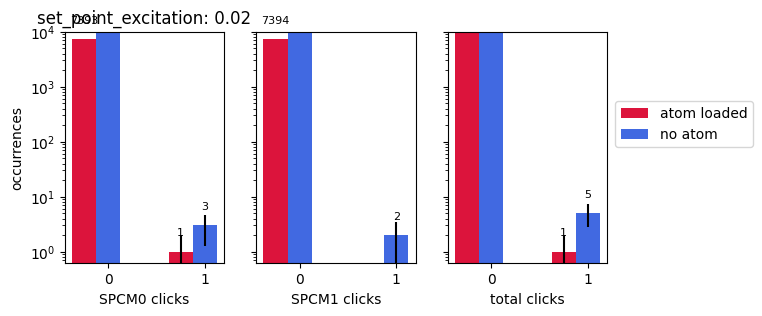

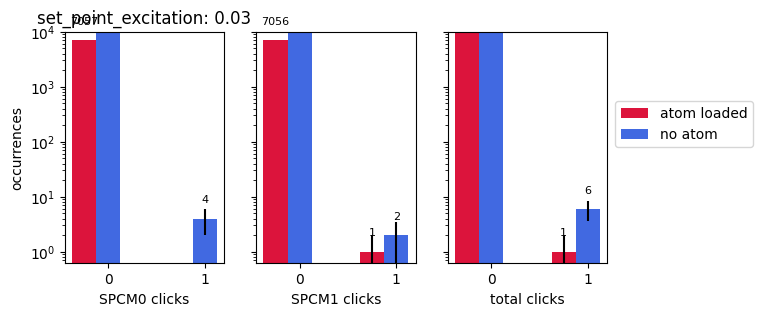

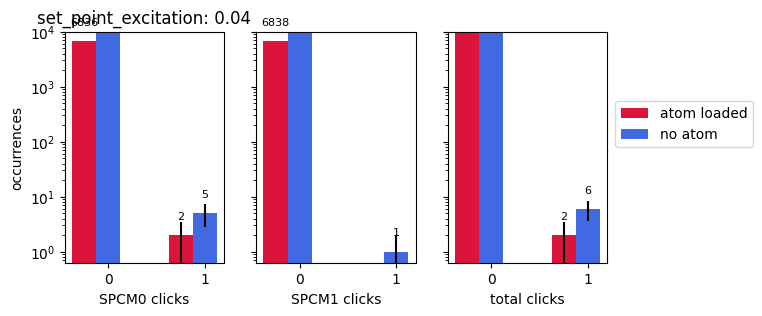

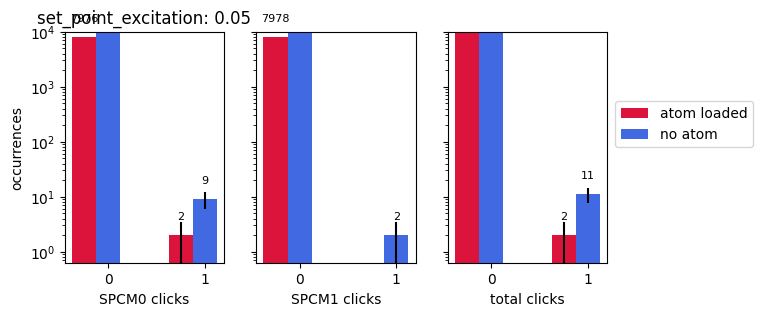

...

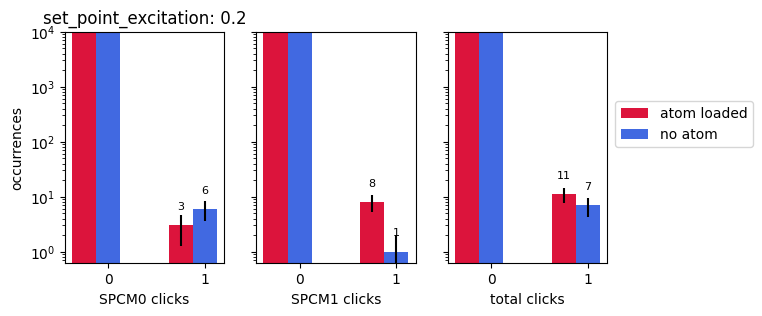

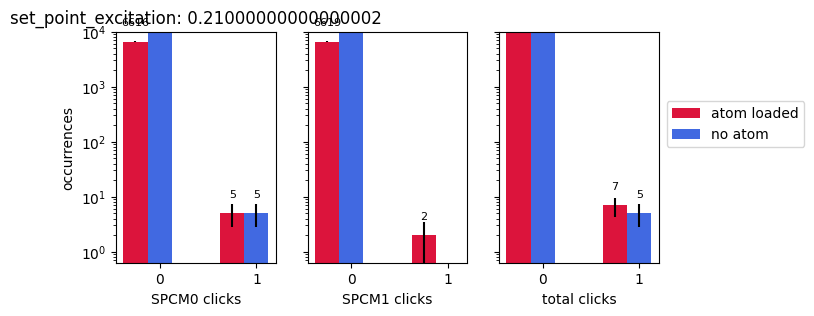

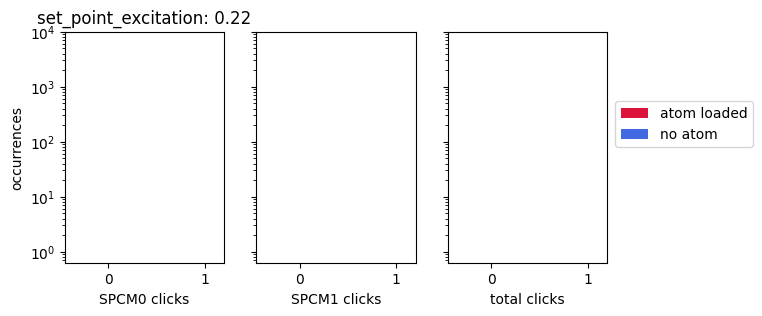

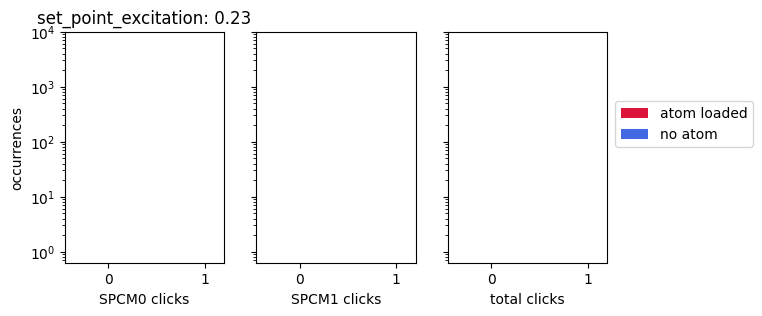

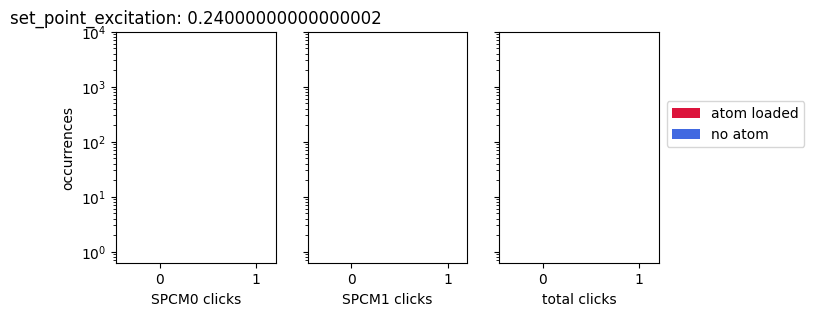

In [88]:
# todo: do not plot bin 0

max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))  #[0,1,...,max_counts+1]
units = 1e-9
unit_label = 'ns'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

atom_loaded_counts_array= np.zeros(iterations)
atom_loaded_fraction = np.zeros(iterations)

for i, var_value in zip(range(iterations),scan_sequence1):

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars


    # iteration
    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    readout_iteration_i = readout_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]

    # iteration => n_measurements => n_excitation_cycle
    
    # # first_shot
    # shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM0
    photon_counts_with_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts_no_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()
    
    # SPCM1
    photon_counts1_with_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts1_no_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()

    total_mean_photons_per_cycle_with_atom = np.concatenate((photon_counts_with_atom, photon_counts1_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((photon_counts_no_atom, photon_counts1_no_atom))

    # # Ex) False count 
    # if i == 15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #     # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")

    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #     # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("i == 15")
    #     plt.legend()

    # if i ==15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #         # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")
    
    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #         # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("with atom counts")
    #     plt.legend()


    ##### filtering counts using first shot.
    # this is by iteration => change this to => every cycle
    


    # for normalization
    atom_loaded_counts = 0
    for val in readout_iteration_i:
        if val > cutoff1:
            atom_loaded_counts += 1

    atom_loaded_counts_array[i] = atom_loaded_counts
    if len(readout_iteration_i) > 0:
        atom_loaded_fraction[i] = atom_loaded_counts / len(readout_iteration_i)


    # if i == 10:
    #     print(mean_photons_per_cycle_with_atom)
    #     for j, val1, val2 in zip(range(len(mean_photons_per_cycle_with_atom)), mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom):
    #         if val1 > 0 or val2 >0:
    #             print(j, val1, val2)
    #     print(total_mean_photons_per_cycle_with_atom)
    #     for j, val in zip(range(len(total_mean_photons_per_cycle_with_atom)), total_mean_photons_per_cycle_with_atom):
    #         if val > 0:
    #             print(j, val)
    # iterate over the data from the two SPCMs so we can fill in a subplot for each one


    

    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[photon_counts_with_atom, photon_counts1_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [photon_counts_no_atom, photon_counts1_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
plt.show()


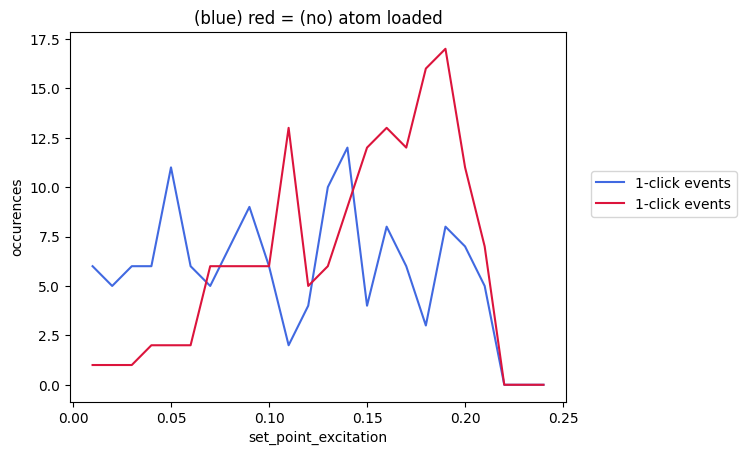

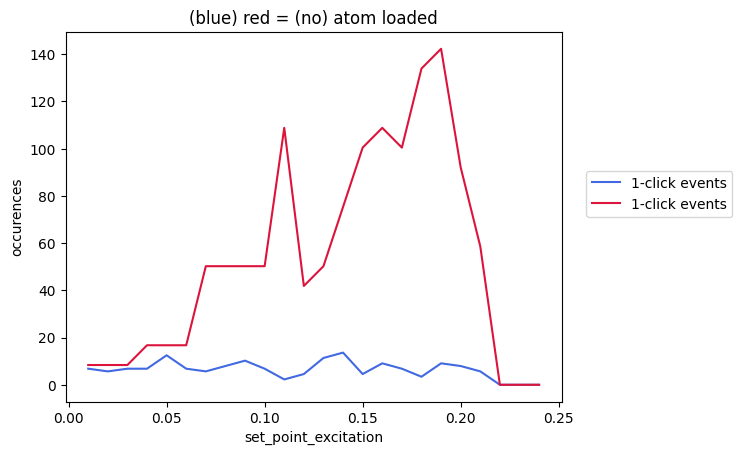

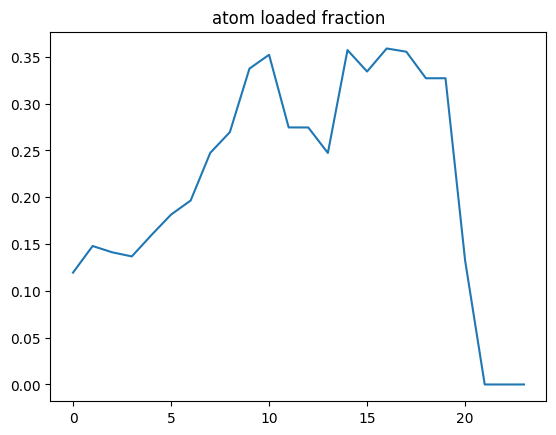

In [92]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# atom_loaded fraction taken into account.
counts_data_no_atom_norm = [x / (1-y) for x, y in zip(counts_data_no_atom, atom_loaded_fraction)]
counts_data_with_atom_norm = [x / y for x, y in zip(counts_data_with_atom, atom_loaded_fraction)]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()


plt.plot(atom_loaded_fraction)
plt.title("atom loaded fraction")
plt.show()

In [91]:
counts_data_no_atom

array([[ 6,  5,  6,  6, 11,  6,  5,  7,  9,  6,  2,  4, 10, 12,  4,  8,
         6,  3,  8,  7,  5,  0,  0,  0]], dtype=int64)

In [16]:
counts_data_with_atom

array([[ 1,  1,  1,  2,  2,  2,  6,  6,  6,  6, 13,  5,  6,  9, 12, 13,
        12, 16, 17, 11,  7,  0,  0,  0]], dtype=int64)

In [17]:
scan_sequence1

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24])

## 34 & 36 Combined Plot

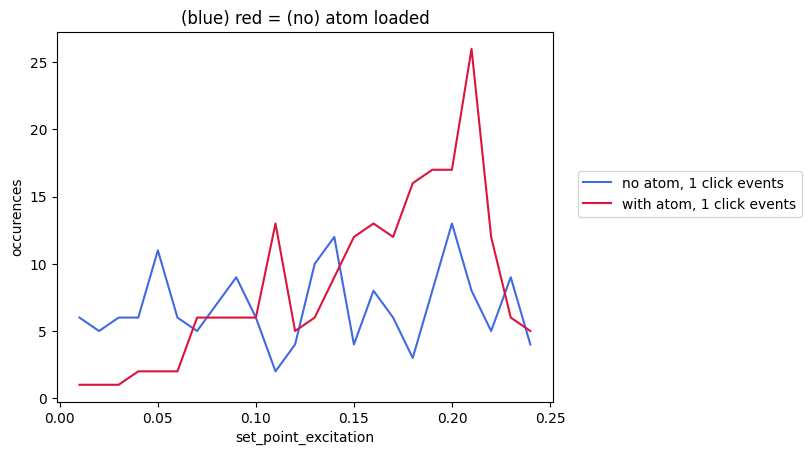

In [34]:
scan_sequence00 = np.array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24])

counts_data_no_atom00 = np.array([[6,  5,  6,  6, 11,  6,  5,  7,  9,  6,  2,  4, 10, 12,  4,  8,
         6,  3,  8, 13,  8,  5,  9,  4]])

counts_data_with_atom00 = np.array([[ 1,  1,  1,  2,  2,  2,  6,  6,  6,  6, 13,  5,  6,  9, 12, 13,
        12, 16, 17, 17, 26, 12,  6,  5]])

linestyles = ['-','--','-.']


plt.plot(scan_sequence00, counts_data_no_atom00[0],label='no atom, 1 click events',ls=linestyles[i],color='royalblue')
plt.plot(scan_sequence00, counts_data_with_atom00[0],label='with atom, 1 click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()


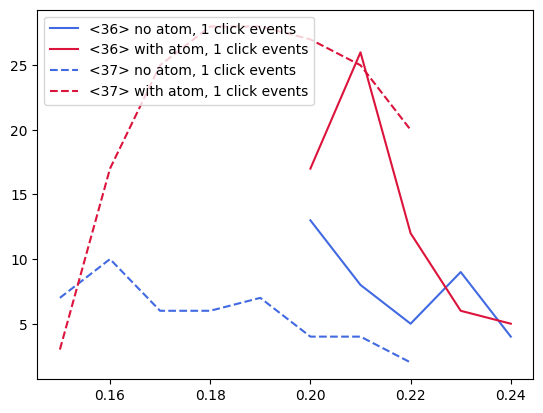

In [38]:
# scab 36: .20 ~ .24
# scan corrupted: .15~.17
# scan 37: .18 ~.22

scan_sequence36 = np.array([0.2 , 0.21, 0.22, 0.23, 0.24])
counts_data_no_atom36 = np.array([[13,  8,  5,  9,  4]])
counts_data_with_atom36 = np.array([[ 17, 26, 12,  6,  5]])
plt.plot(scan_sequence36, counts_data_no_atom36[0],label='<36> no atom, 1 click events',ls = '-', color='royalblue')
plt.plot(scan_sequence36, counts_data_with_atom36[0],label='<36> with atom, 1 click events',ls= '-', color='crimson')

# combined with corrupted file
scan_sequence37 = np.array([.15, .16, .17, 0.18, 0.19, 0.2, 0.21, 0.22])
counts_data_no_atom37 = np.array([[7, 10,  6, 6, 7, 4, 4, 2]]) 
counts_data_with_atom37 = np.array([[3, 17, 25, 28, 28, 27, 25, 20 ]])
plt.plot(scan_sequence37, counts_data_no_atom37[0],label='<37> no atom, 1 click events',ls = '--', color='royalblue')
plt.plot(scan_sequence37, counts_data_with_atom37[0],label='<37> with atom, 1 click events',ls= '--', color='crimson')

plt.legend()
plt.show()

## excitation setpoint scan - merged 

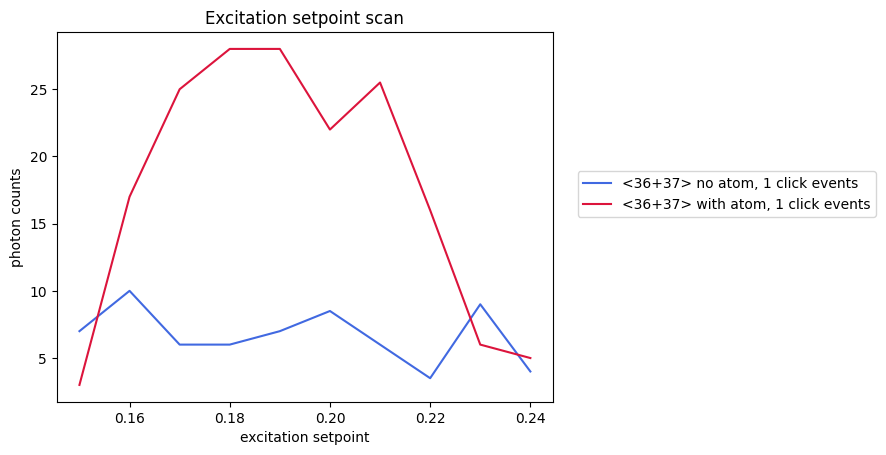

In [41]:
scan_sequence_merged = np.array([0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24])

counts_data_no_atom_merged = np.array([[7, 10,  6, 6, 7, (4+13)/2, (4+8)/2, (2+5)/2, 9, 4]])

counts_data_with_atom_merged = np.array([[3, 17, 25, 28, 28, (27+17)/2, (25+26)/2, (20+12)/2, 6, 5 ]])

plt.plot(scan_sequence_merged, counts_data_no_atom_merged[0],label='<36+37> no atom, 1 click events',ls = '-', color='royalblue')
plt.plot(scan_sequence_merged, counts_data_with_atom_merged[0],label='<36+37> with atom, 1 click events',ls= '-', color='crimson')

plt.title('Excitation setpoint scan')
plt.ylabel('photon counts')
plt.xlabel('excitation setpoint')


plt.legend(loc=(1.05,0.5))
plt.show()

# 2024.12.19 - replotting

In [101]:
fnames = get_files_by_criteria(date_filters=["2024-12-18"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\12\000020527-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\18\000020540-GeneralVariableScan.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\19\000020546-GeneralVariableScan.h5, which is corrupt
found 12 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\09\000020526-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\09\000020526-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\12\000020527-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 3 (C:\Networking Experiment\artiq codes\artiq-mast

## single photon experiment with atom loading advance 
- scan over gate time

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 250, 'set_point_excitation': 0.055}
# of iterations:  7


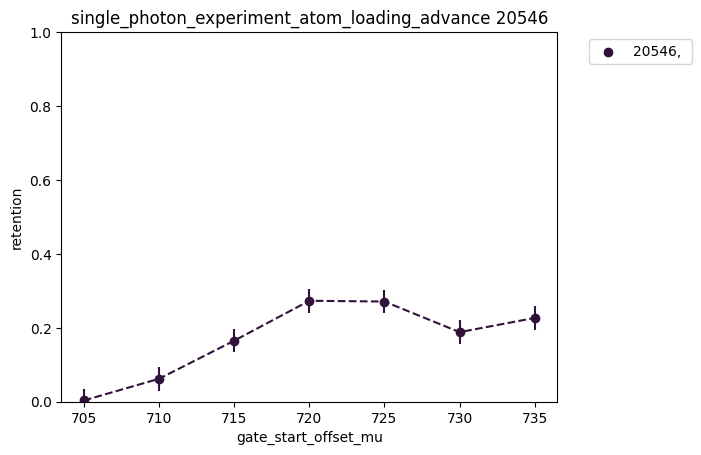

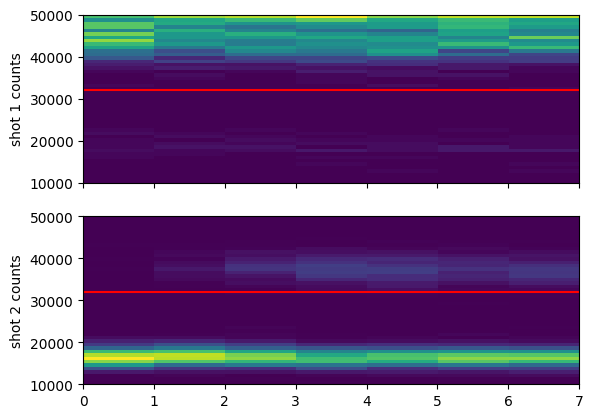

In [102]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

showhist_counts = False 


file_indices = {
    10: ''
} # the files to plot; 


# for plotting
legend_vars =[]  # legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend
xform_and_label = {}
loc='best'
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

# for fitting
fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()


first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''


for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item   # idx - f_item = {f_idx: f_comment}
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)
    print("# of iterations: ", iterations)
    
    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    
    # for plotting 
    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)

    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    
    # get_loading_and_retention
    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)


    ### Necessary to analyze data with 2 scan_sequences
    ### reshaping each array into a 2D array with shape = shape, with order = 'F' which is Fortran-style order
    
    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

    
    # show historam of first_shot and second_shot
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


C:\Users\QC\AppData\Local\Temp\ipykernel_8756\4044671650.py:114: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')
C:\Users\QC\AppData\Local\Temp\ipykernel_8756\4044671650.py:114: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')
C:\Users\QC\AppData\Local\Temp\ipykernel_8756\4044671650.py:114: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


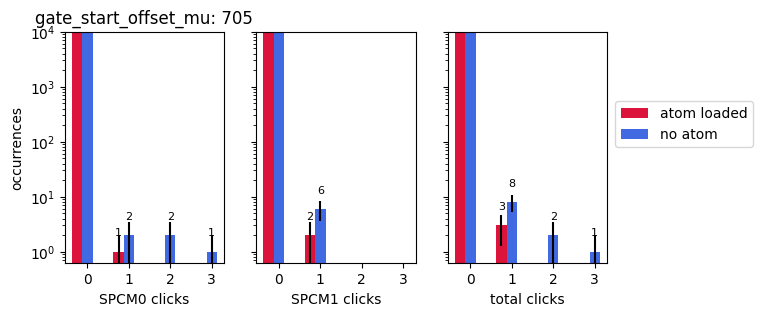

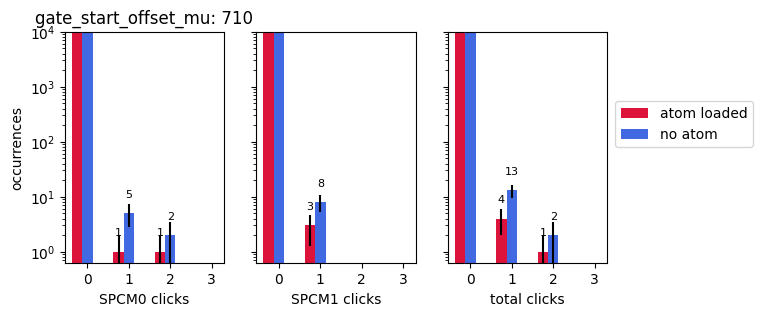

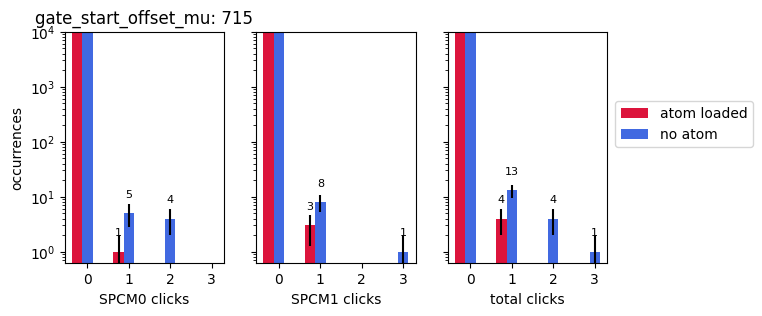

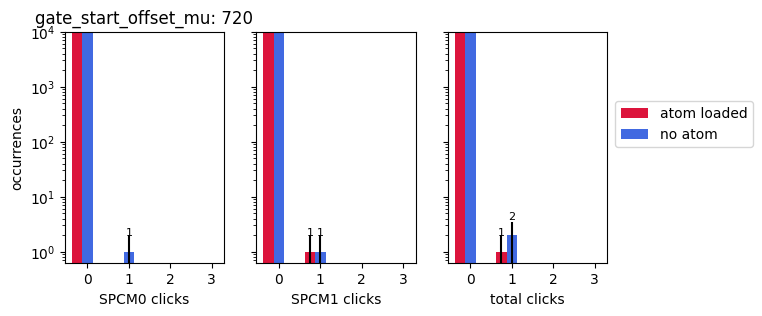

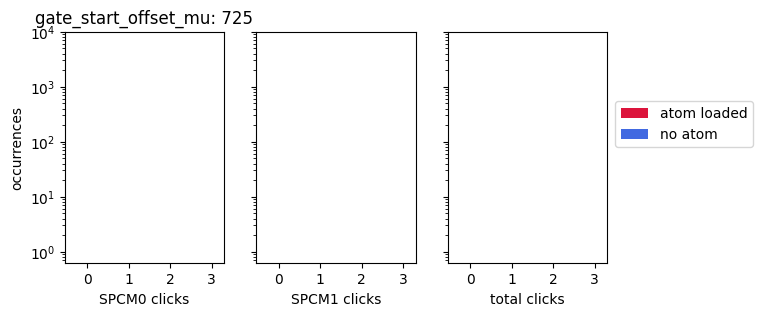

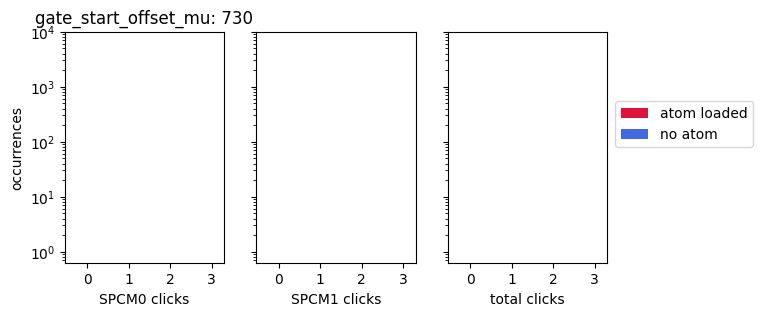

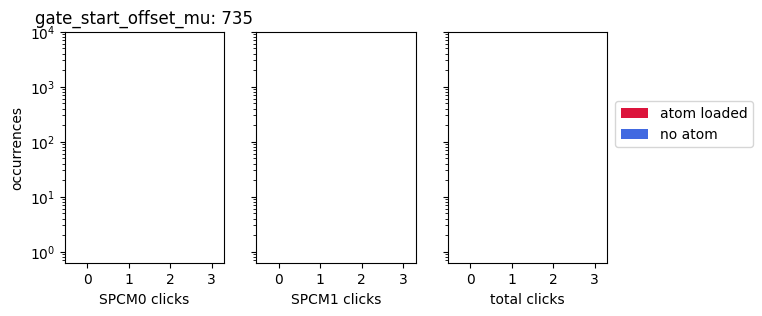

In [103]:
# todo: do not plot bin 0

max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))  #[0,1,...,max_counts+1]
units = 1e-9
unit_label = 'ns'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

atom_loaded_counts_array = np.zeros(iterations)
atom_loaded_fraction = np.zeros(iterations)

for i, var_value in zip(range(iterations),scan_sequence1):

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars


    # iteration
    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]
    readout_iteration_i = readout_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)]

    # iteration => n_measurements => n_excitation_cycle
    
    # # first_shot
    # shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    
    # SPCM0
    photon_counts_with_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts_no_atom = np.array([p for p,s in zip(photons_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()
    
    # SPCM1
    photon_counts1_with_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s > cutoff1]).flatten()
    photon_counts1_no_atom = np.array([p for p,s in zip(photons1_iteration_i, readout_iteration_i) if s <= cutoff1]).flatten()

    total_mean_photons_per_cycle_with_atom = np.concatenate((photon_counts_with_atom, photon_counts1_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((photon_counts_no_atom, photon_counts1_no_atom))

    # # Ex) False count 
    # if i == 15:
    #     plt.plot(photon_counts_with_atom, label = "SPCM0 with atom")
    #     # plt.plot(photon_counts_no_atom, label = "SPCM0 no atom")

    #     plt.plot(photon_counts1_with_atom, label = "SPCM1 with atom")
    #     # plt.plot(photon_counts1_no_atom, label = "SPCM1 no atom")
    #     plt.title("i == 15")
    #     plt.legend()
    

    ##### filtering counts using first shot.
    # this is by iteration => change this to => every cycle

    # for normalization
    atom_loaded_counts = 0
    for val in readout_iteration_i:
        if val > cutoff1:
            atom_loaded_counts += 1

    atom_loaded_counts_array[i] = atom_loaded_counts
    if len(readout_iteration_i) > 0:
        atom_loaded_fraction[i] = atom_loaded_counts / len(readout_iteration_i)
    

    # if i == 10:
    #     print(mean_photons_per_cycle_with_atom)
    #     for j, val1, val2 in zip(range(len(mean_photons_per_cycle_with_atom)), mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom):
    #         if val1 > 0 or val2 >0:
    #             print(j, val1, val2)
    #     print(total_mean_photons_per_cycle_with_atom)
    #     for j, val in zip(range(len(total_mean_photons_per_cycle_with_atom)), total_mean_photons_per_cycle_with_atom):
    #         if val > 0:
    #             print(j, val)
    # iterate over the data from the two SPCMs so we can fill in a subplot for each one

    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[photon_counts_with_atom, photon_counts1_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [photon_counts_no_atom, photon_counts1_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
plt.show()


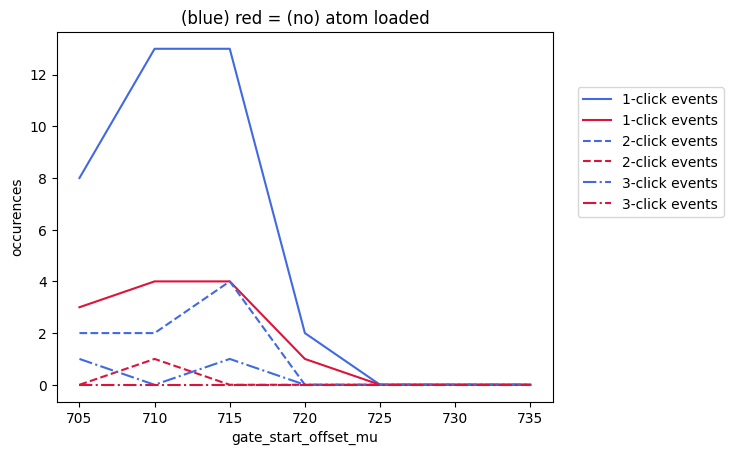

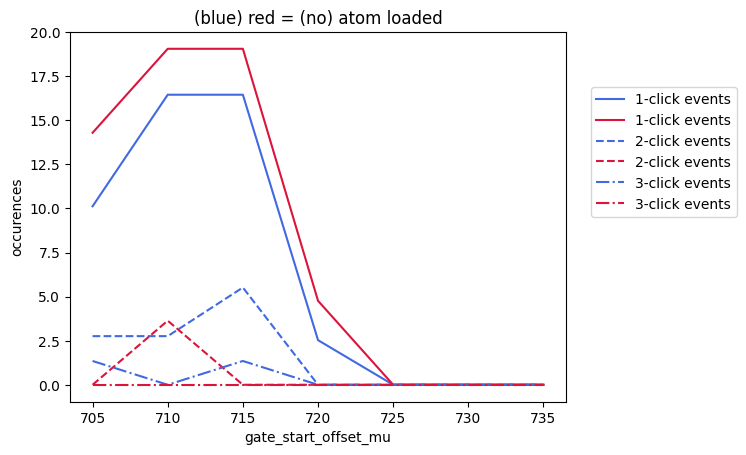

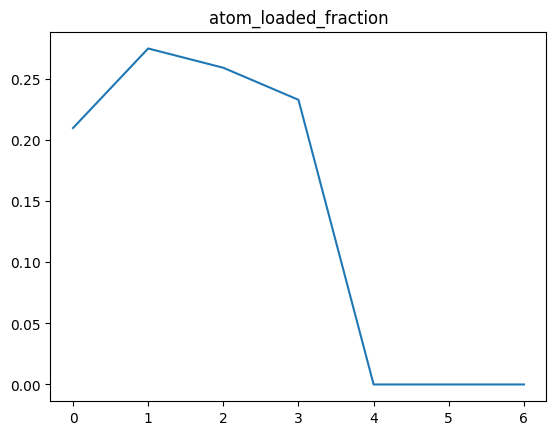

In [104]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()



# atom_loaded fraction taken into account.
counts_data_no_atom_norm = [x / (1-y) for x, y in zip(counts_data_no_atom, atom_loaded_fraction)]
counts_data_with_atom_norm = [x / y for x, y in zip(counts_data_with_atom, atom_loaded_fraction)]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom_norm[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('(blue) red = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()


plt.plot(atom_loaded_fraction)
plt.title("atom_loaded_fraction")
plt.show()

## 2024.12.25

In [94]:
fnames = get_files_by_criteria(date_filters=["2024-12-25"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-25\11\000020868-GeneralVariableScan_single_photon_experiment_atom_load_scan_over_set_point_excitation.h5, which is corrupt
found 4 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-25\10\000020867-GeneralVariableScan.h5) scanned over set_point_excitation
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-25\10\000020867-GeneralVariableScan_single_photon_experiment_atom_load_scan_over_set_point_excitation.h5) scanned over set_point_excitation
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-25\17\000020894-GeneralVariableScan.h5) scanned over set_point_excitation
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-25\17\000020894-GeneralVariableScan_single_photon_experiment_atom_load_scan_over_set_point_excitation.h5) scanned over set_point_excitation


## D1 unlocked during run

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'record_every_shot': True,'n_excitation_cycles': 200, 'gate_start_offset_mu': 720}


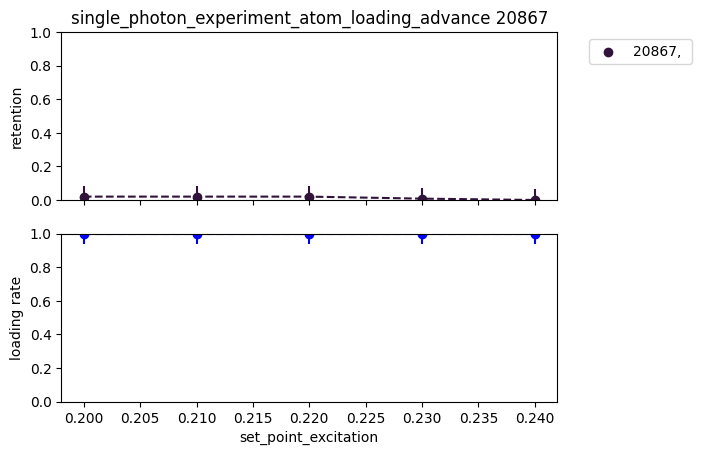

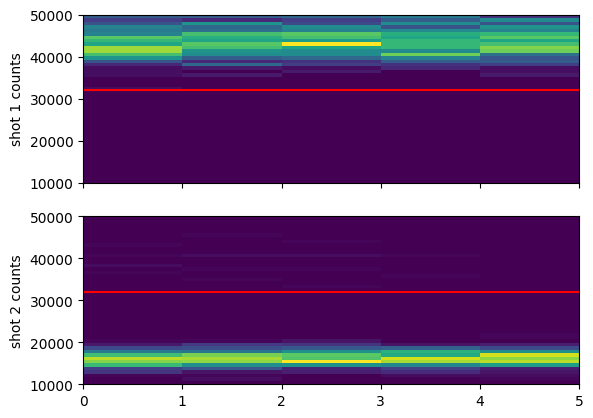

In [89]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

show_beam_power = False

file_indices = {
    0: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


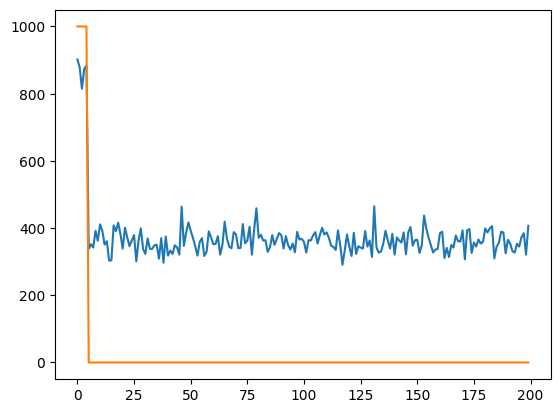

In [90]:
### Readout array PLOT

len(readout_counts[1:])/n_excitation_cycles
readout_array_by_measurement = [0] * n_measurements  # each index will contain n_excitation_cycles number of data
atom_loaded = [0] * n_measurements  # each index will contain n_excitation_cycles number of data: if atom loaded: 1, if not: 0

for i in range(n_measurements):
    readout_array_by_measurement[i] = readout_counts[1+i*n_excitation_cycles:1+(i+1)*n_excitation_cycles]
    atom_loaded[i] = [0] * n_excitation_cycles
    for j in range(n_excitation_cycles):
        if (readout_array_by_measurement[i][j] / t_SPCM_first_shot) >= single_atom_counts_per_s:
            atom_loaded[i][j] = 1000
        else:
            atom_loaded[i][j] = 0
    # plt.plot(readout_array_by_measurement[i])
    # plt.plot(atom_loaded[i])

plt.plot(readout_array_by_measurement[100])
plt.plot(atom_loaded[100])
plt.show()

plt.show()

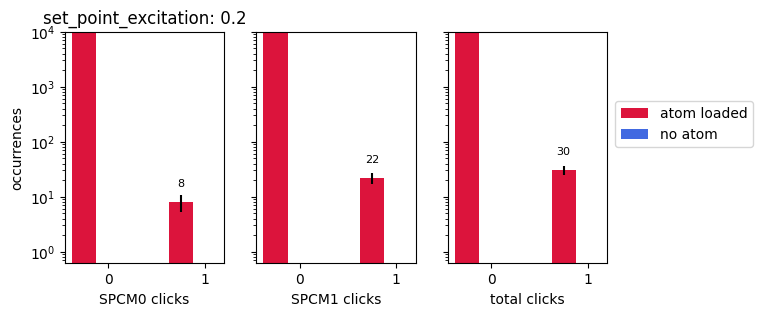

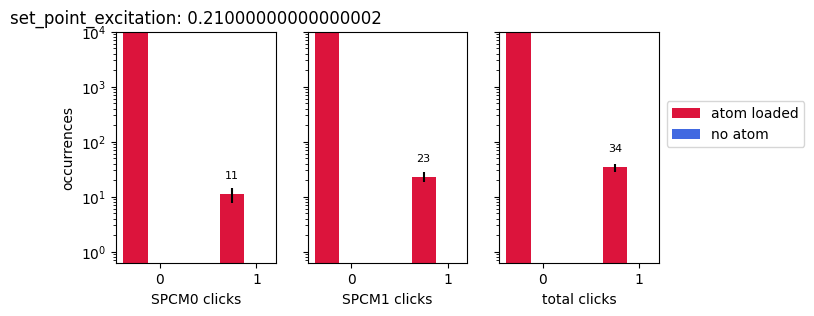

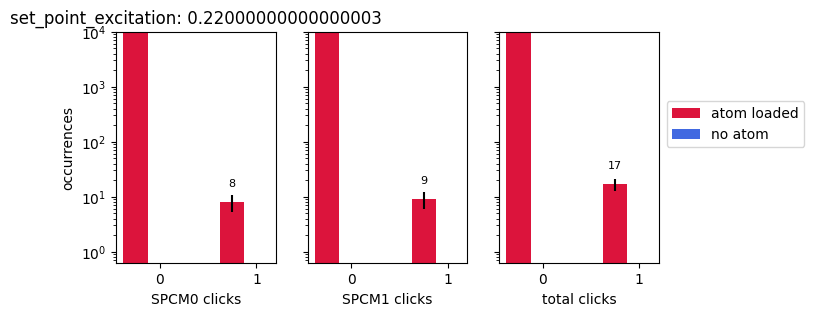

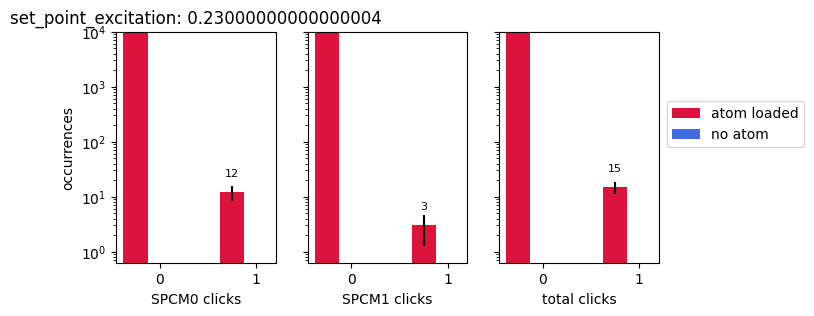

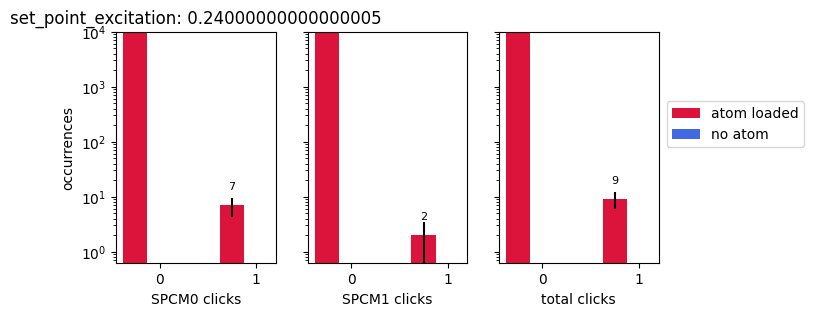

In [91]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



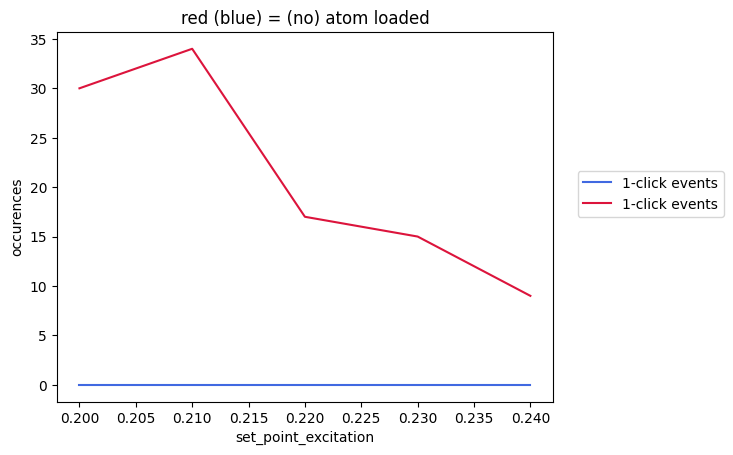

atom loading fraction: 1.00


C:\Users\QC\AppData\Local\Temp\ipykernel_20884\421330645.py:20: RuntimeWarning: invalid value encountered in divide
  plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')


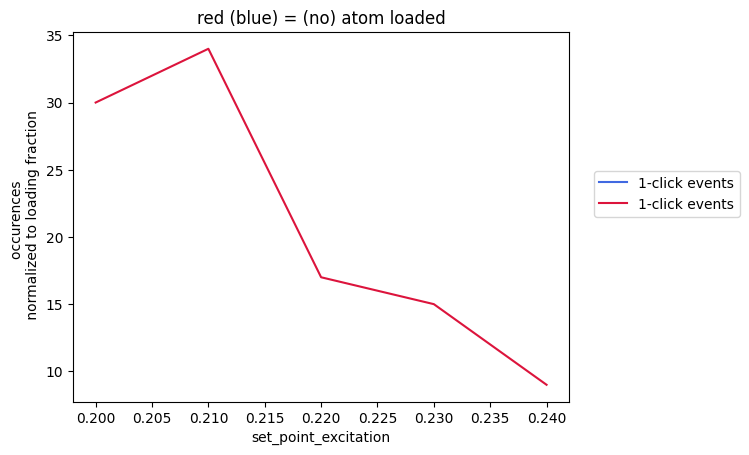

In [93]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

thresh = cutoff1

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)
plt.show()

## 2024.12.24

In [83]:
fnames = get_files_by_criteria(date_filters=["2024-12-24"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 35 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020830-GeneralVariableScan.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020830-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020831-GeneralVariableScan.h5) scanned over dummy_variable
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020833-GeneralVariableScan.h5) scanned over dummy_variable
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\09\000020834-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\10\000020835-GeneralVariableScan.h5) scanned over dummy_variable
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-24\10\000020836-Gene

## D1 unlocked during run

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'record_every_shot': True,'n_excitation_cycles': 200, 'set_point_excitation': 0.055}
iteration 21, no measurements


C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


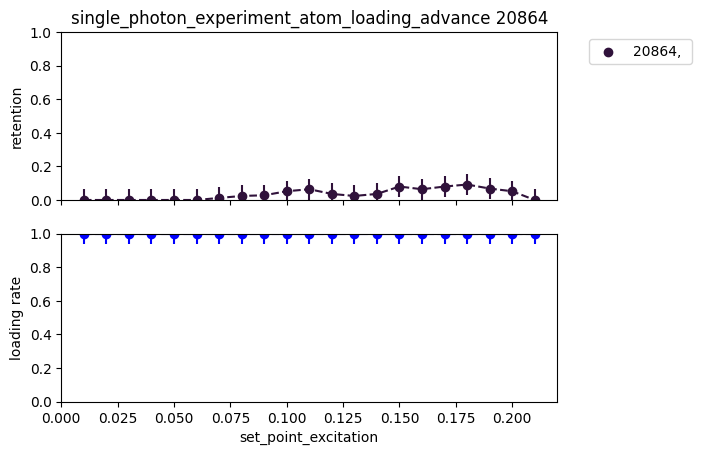

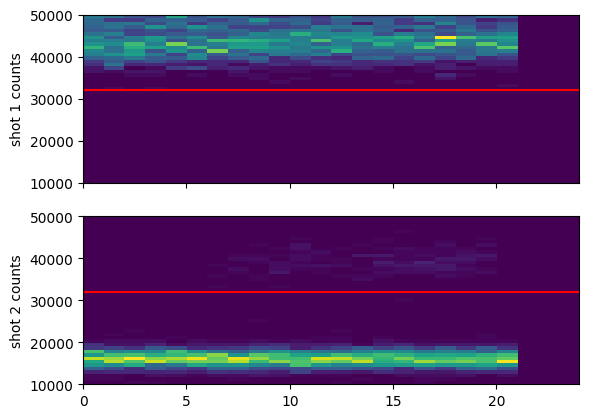

In [87]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = False

show_beam_power = False

file_indices = {
    34: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    else:
        cutoff1 = cutoff2 = single_atom_counts_per_s * t_SPCM_first_shot

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


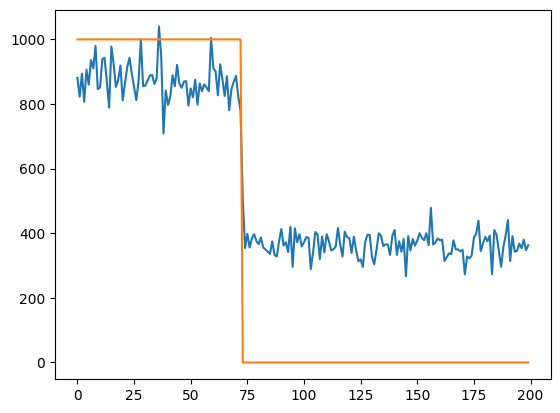

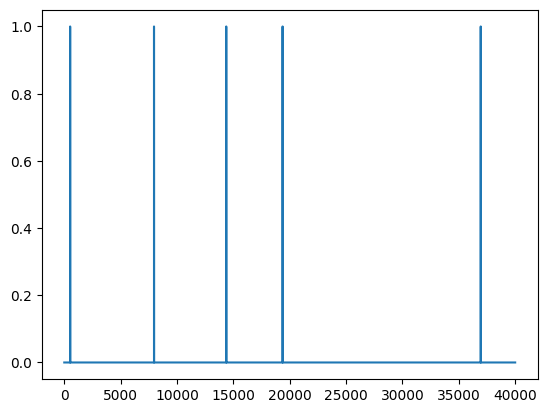

In [82]:
### Readout array PLOT

len(readout_counts[1:])/n_excitation_cycles
readout_array_by_measurement = [0] * n_measurements  # each index will contain n_excitation_cycles number of data
atom_loaded = [0] * n_measurements  # each index will contain n_excitation_cycles number of data: if atom loaded: 1, if not: 0

for i in range(n_measurements):
    readout_array_by_measurement[i] = readout_counts[1+i*n_excitation_cycles:1+(i+1)*n_excitation_cycles]
    atom_loaded[i] = [0] * n_excitation_cycles
    for j in range(n_excitation_cycles):
        if (readout_array_by_measurement[i][j] / t_SPCM_first_shot) >= single_atom_counts_per_s:
            atom_loaded[i][j] = 1000
        else:
            atom_loaded[i][j] = 0
    # plt.plot(readout_array_by_measurement[i])
    # plt.plot(atom_loaded[i])

plt.plot(readout_array_by_measurement[100])
plt.plot(atom_loaded[100])
plt.show()

plt.show()

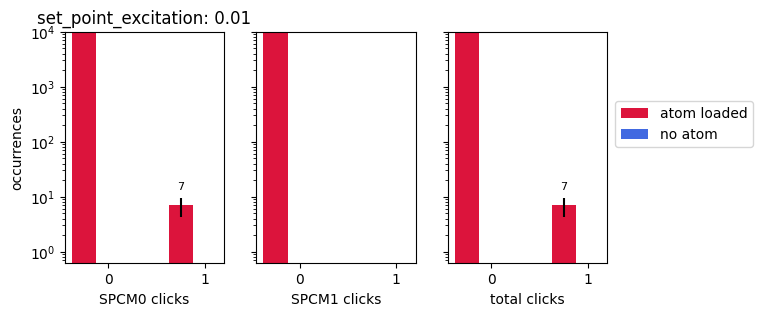

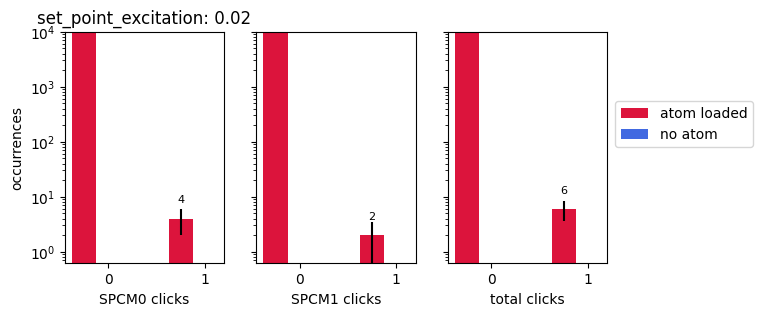

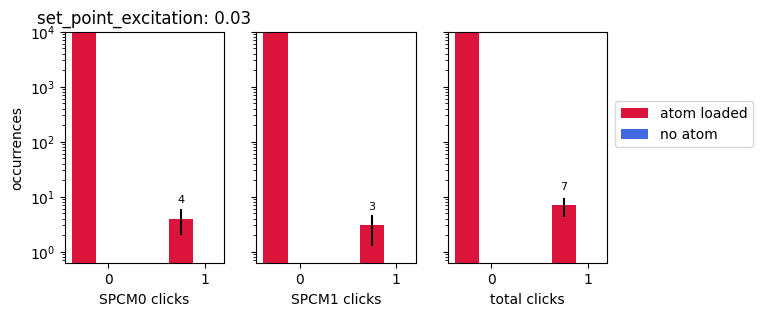

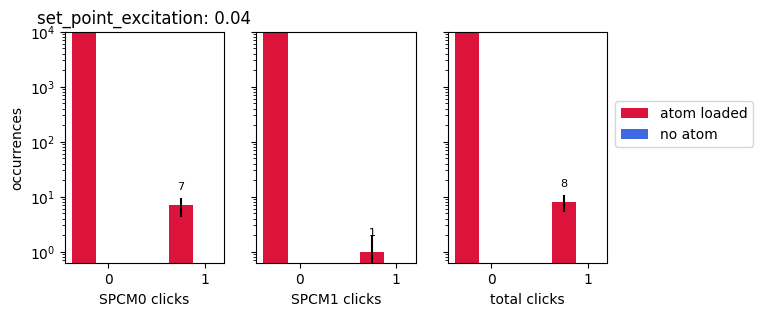

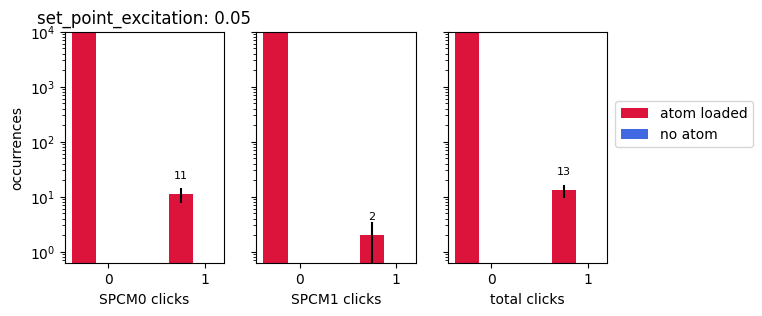

...

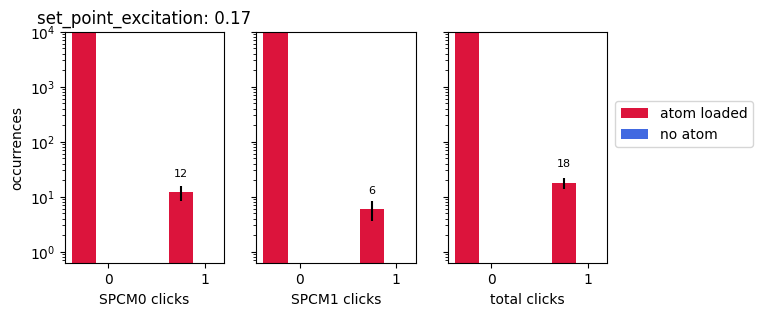

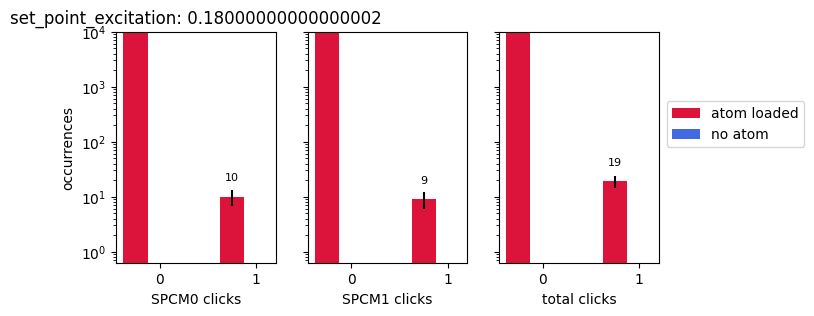

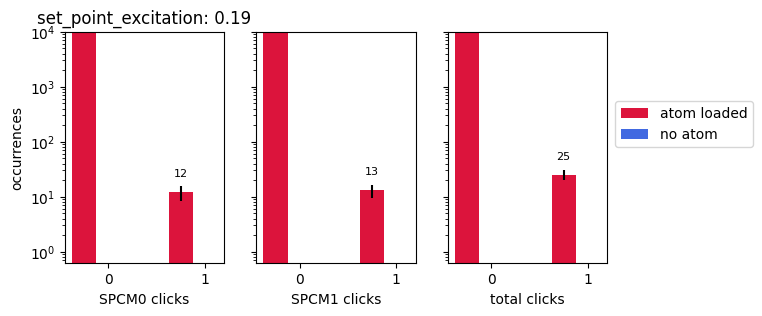

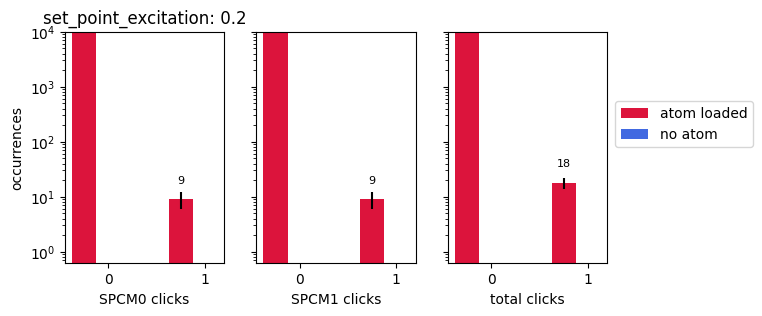

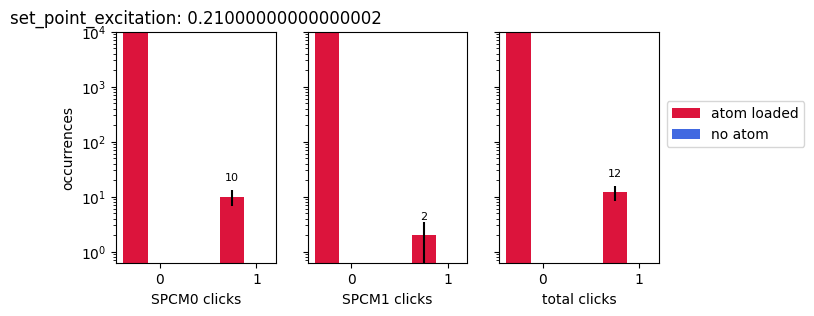

C:\Users\QC\AppData\Local\Temp\ipykernel_20884\3722642778.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


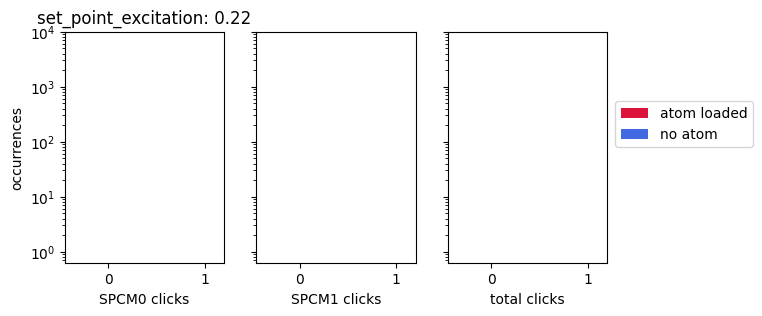

C:\Users\QC\AppData\Local\Temp\ipykernel_20884\3722642778.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


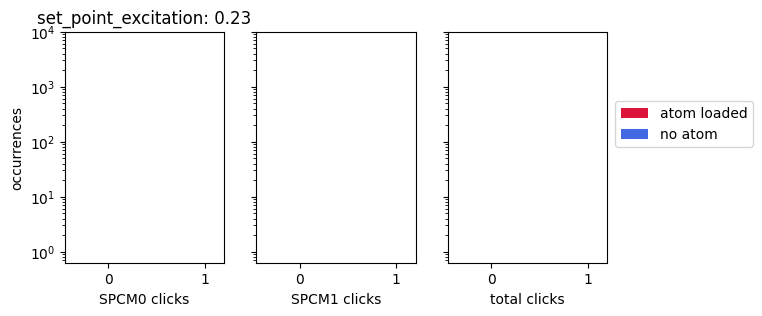

C:\Users\QC\AppData\Local\Temp\ipykernel_20884\3722642778.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


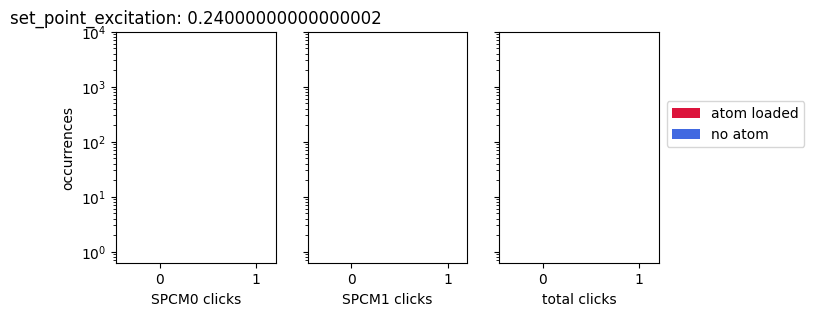

In [85]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



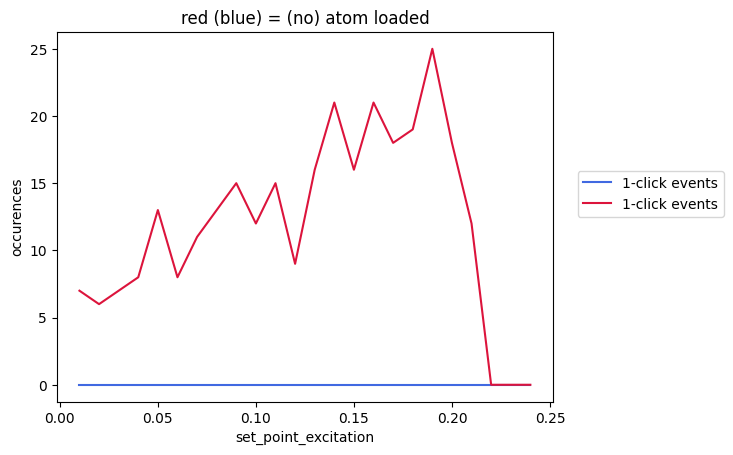

atom loading fraction: 1.00


C:\Users\QC\AppData\Local\Temp\ipykernel_20884\421330645.py:20: RuntimeWarning: invalid value encountered in divide
  plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')


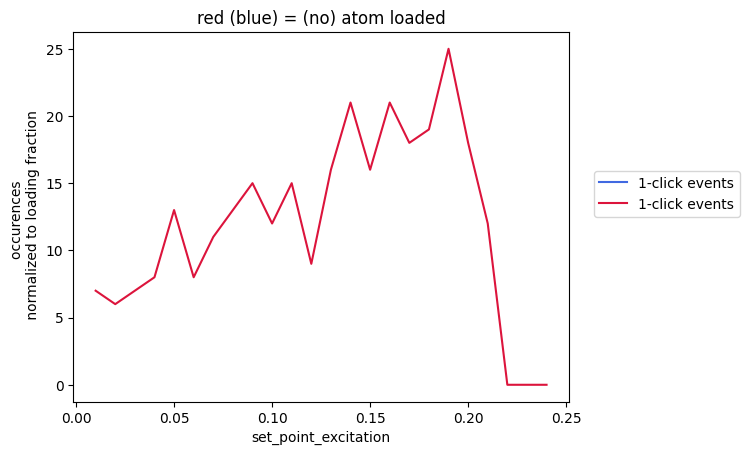

In [86]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

thresh = cutoff1

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)
plt.show()

## 2024.12.19

In [161]:
fnames = get_files_by_criteria(date_filters=["2024-12-19"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 7 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-19\09\000020549-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-19\09\000020550-GeneralVariableScan.h5) scanned over t_microwave_pulse
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-19\09\000020550-GeneralVariableScan_microwave_Rabi_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-19\13\000020553-GeneralVariableScan.h5) scanned over dummy_variable
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-19\14\000020557-GeneralVariableScan.h5) scanned over dummy_variable
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-19\14\000020559-GeneralVariableScan.h5) scanned over dummy_variable
file 6 (C:\Networking Experiment\artiq 

## testing

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance_in_single_photon_exp': True, 'set_point_excitation': 0.055}


C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\QC\.virtualenvs\Networking_Exp_Data-0oRq_J3c\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


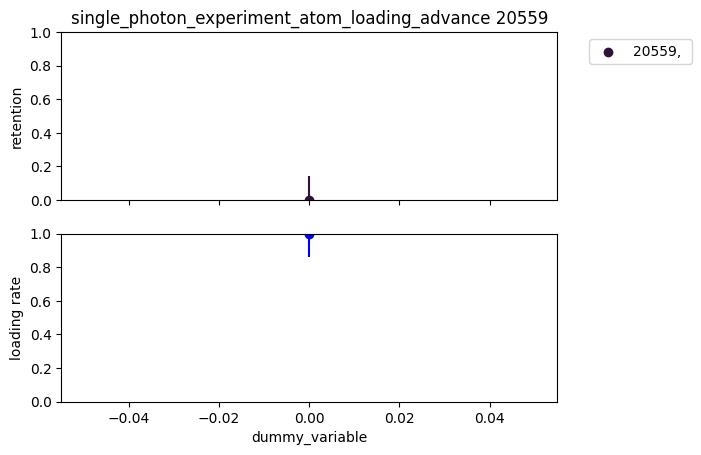

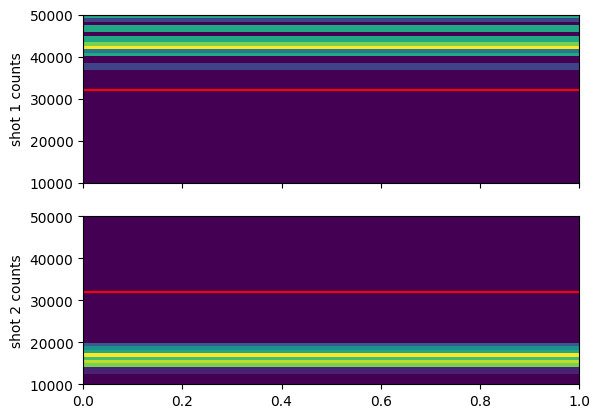

In [162]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False



file_indices = {
    6: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

# cutoff1 = cutoff2 = 36000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = cutoff2 = single_atom_counts_per_s * 0.02


if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


In [163]:
readout_counts


array([0, 0, 0, ..., 0, 0, 0])

## 2024.12.19

In [95]:
fnames = get_files_by_criteria(date_filters=["2024-12-18"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\12\000020527-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\18\000020540-GeneralVariableScan.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\19\000020546-GeneralVariableScan.h5, which is corrupt
found 12 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\09\000020526-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\09\000020526-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\12\000020527-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 3 (C:\Networking Experiment\artiq codes\artiq-mast

## single photon experiment with atom loading advance 
- scan over gate time

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 250, 'set_point_excitation': 0.055}


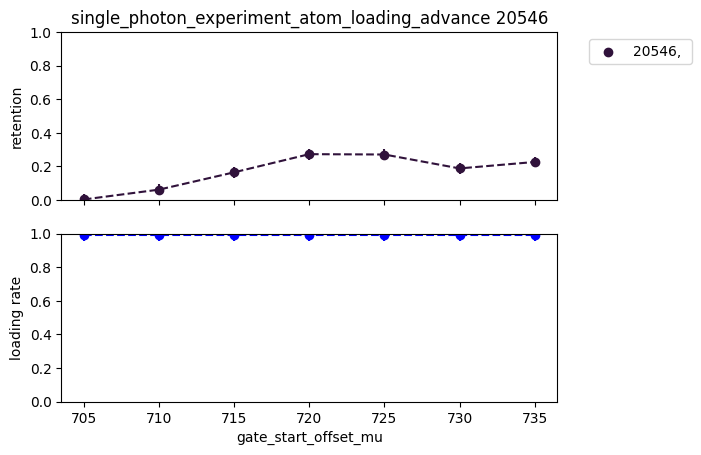

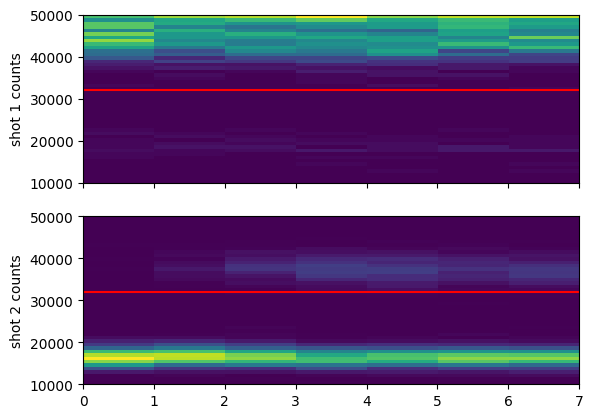

In [155]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False



file_indices = {
    10: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

# cutoff1 = cutoff2 = 36000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = cutoff2 = single_atom_counts_per_s * 0.02


if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


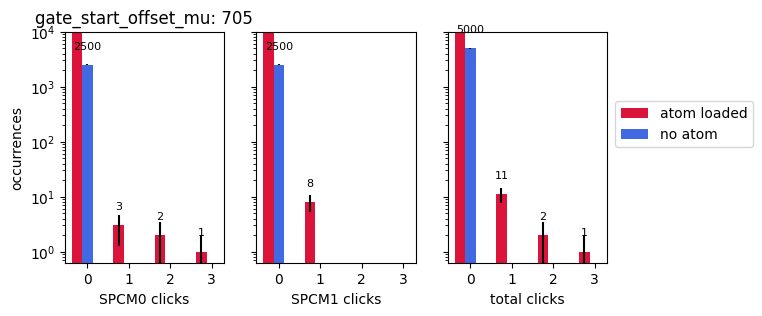

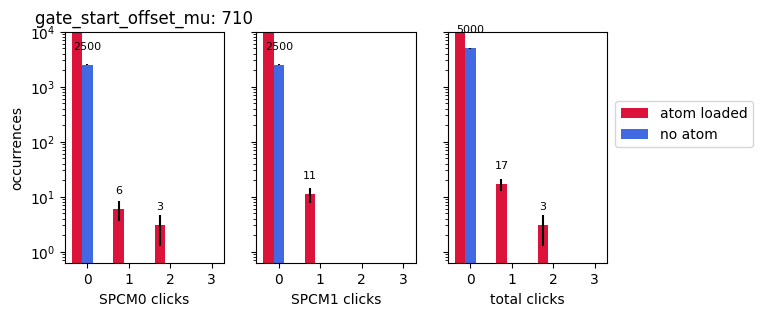

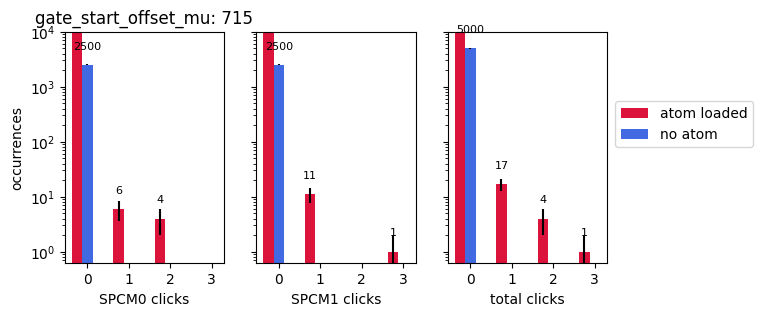

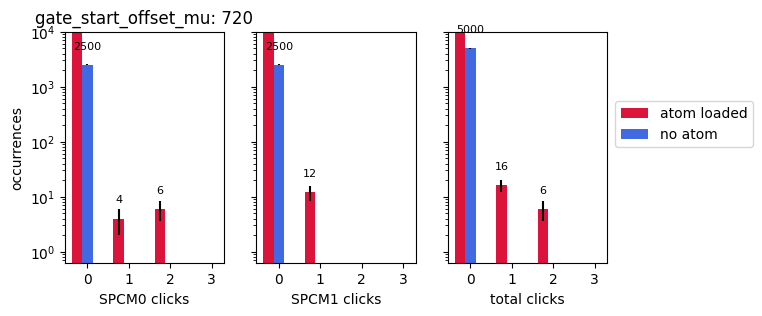

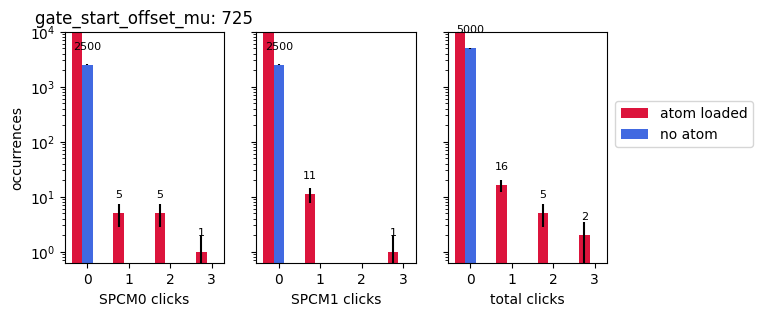

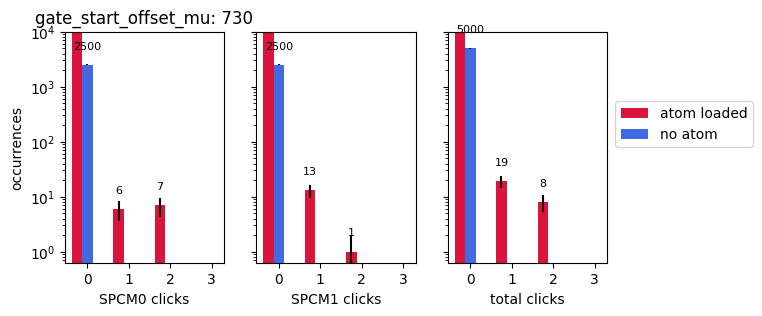

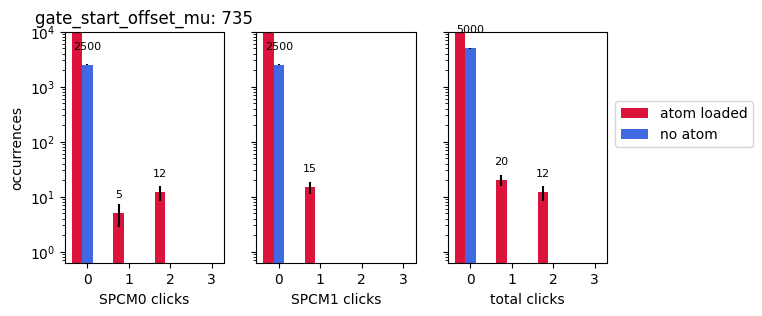

In [156]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



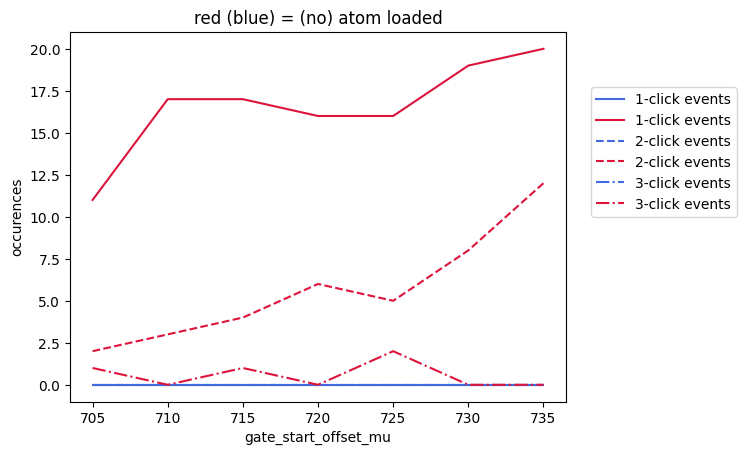

atom loading fraction: 0.64


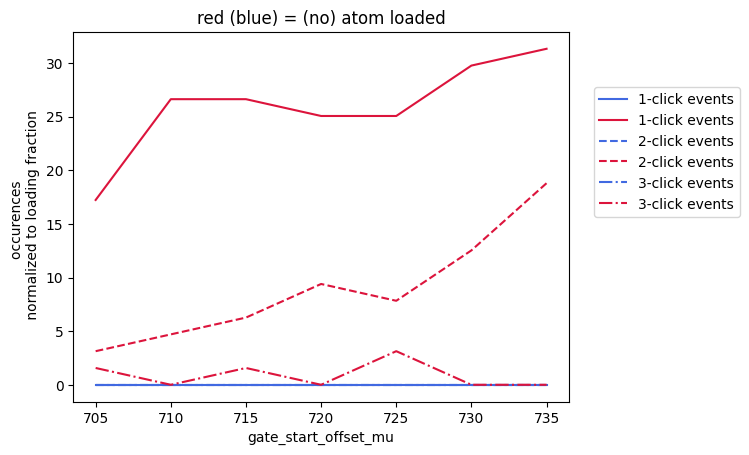

In [157]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)
plt.show()

## 2024.12.18

In [152]:
fnames = get_files_by_criteria(date_filters=["2024-12-18"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\12\000020527-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\18\000020540-GeneralVariableScan.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\19\000020546-GeneralVariableScan.h5, which is corrupt
found 12 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\09\000020526-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\09\000020526-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-18\12\000020527-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 3 (C:\Networking Experiment\artiq codes\artiq-mast

experiment: single_photon_experiment_atom_loading_advance
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 250, 'set_point_excitation': 0.055}


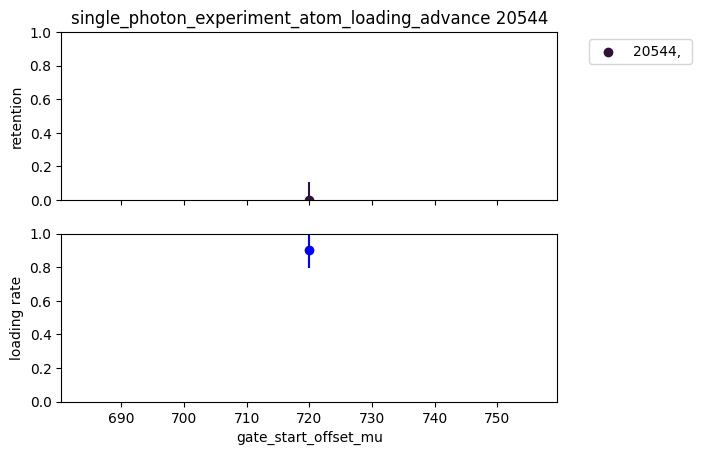

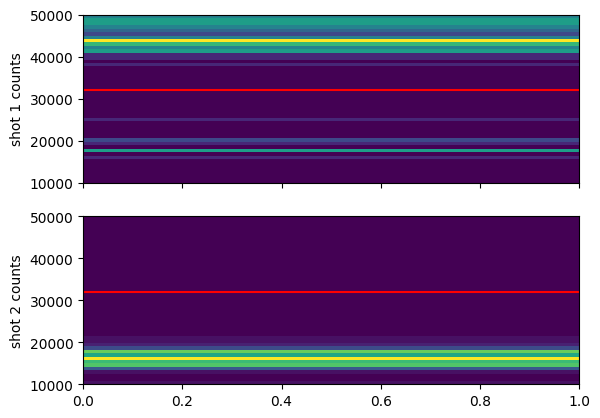

In [149]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False



file_indices = {
    # 1: ''
    # 2: ''
    # 4: ''
    # 6: ''
    # 7: ''
    # 9: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

# cutoff1 = cutoff2 = 36000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
cutoff1 = cutoff2 = single_atom_counts_per_s * 0.02


if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


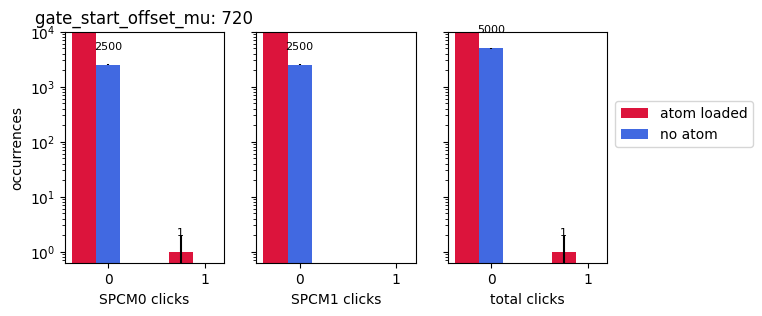

In [150]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



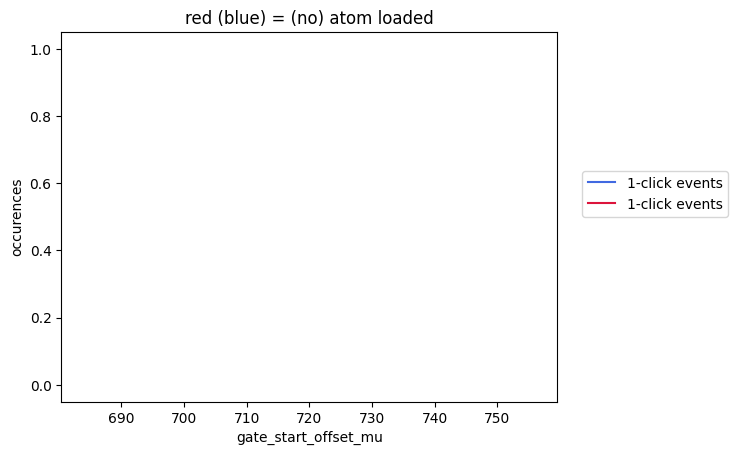

atom loading fraction: 0.44


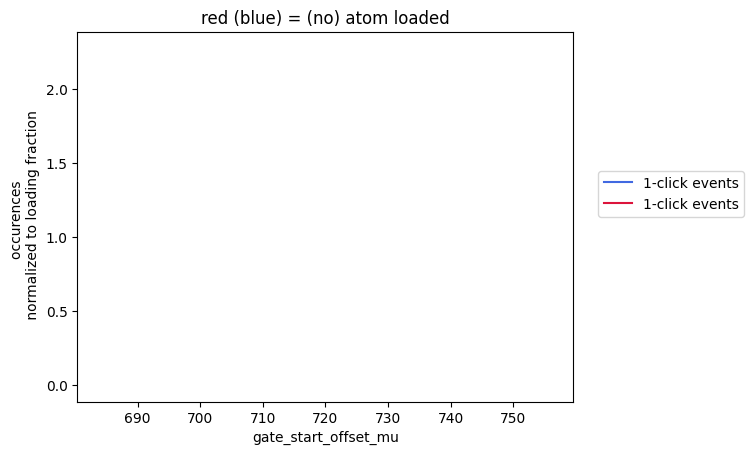

In [151]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)
plt.show()

## 2024.12.17

In [115]:
fnames = get_files_by_criteria(date_filters=["2024-12-17"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-17\09\000020491-GeneralVariableScan.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-17\17\000020507-GeneralVariableScan.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-17\22\000020525-GeneralVariableScan.h5, which is corrupt
found 24 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-17\11\000020500-GeneralVariableScan.h5) scanned over set_point_excitation
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-17\11\000020501-GeneralVariableScan.h5) scanned over set_point_excitation
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-17\11\000020501-GeneralVariableScan_single_photon_scan_over_set_point_excitation.h5) scanned over set_point_excitation
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-17\11\000020502-GeneralVar

## excitation setpoint rescan

experiment: single_photon_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 250, 'gate_start_offset_mu': 720}
threshold_otsu:  549


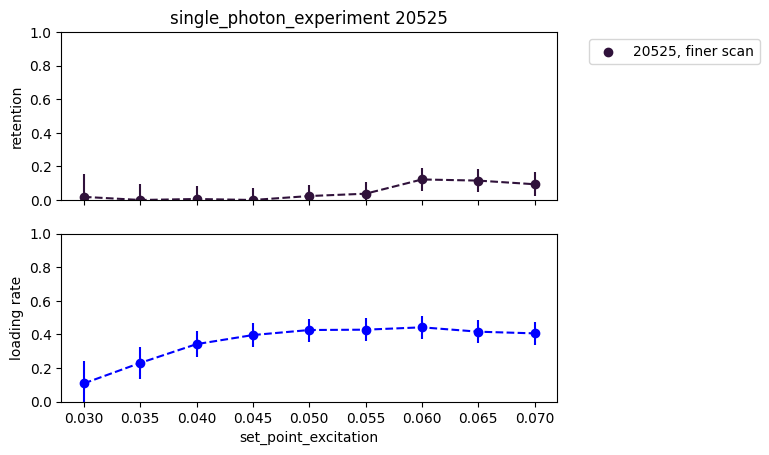

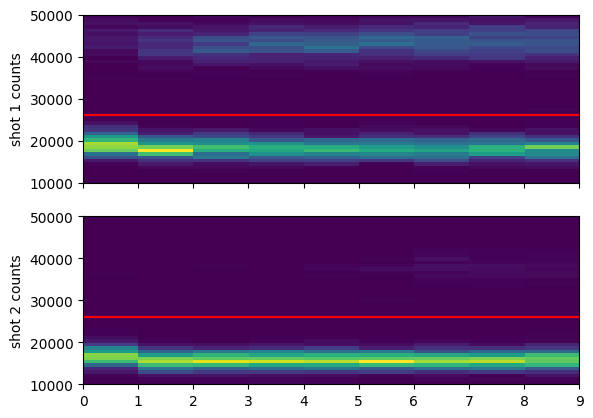

array([-4.87507547, -4.87507547, -9.34219534, ..., -6.51502522,
       -6.51502522, -6.51502522])

In [116]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 8: ''
    23: 'finer scan'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

GRIN1_EXC_monitor
p_excitation_history

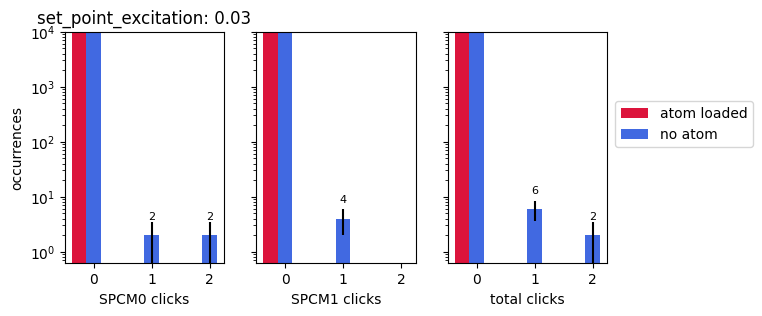

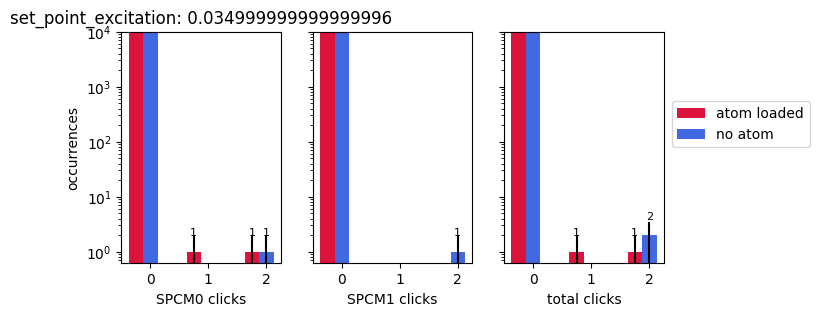

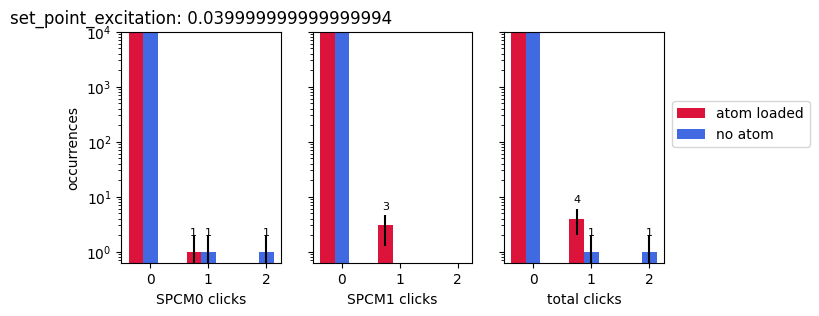

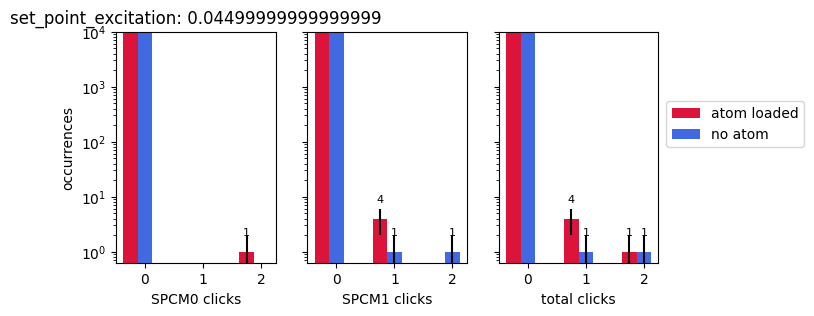

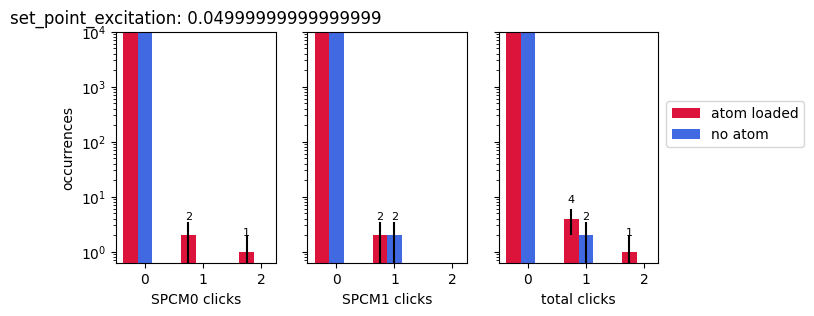

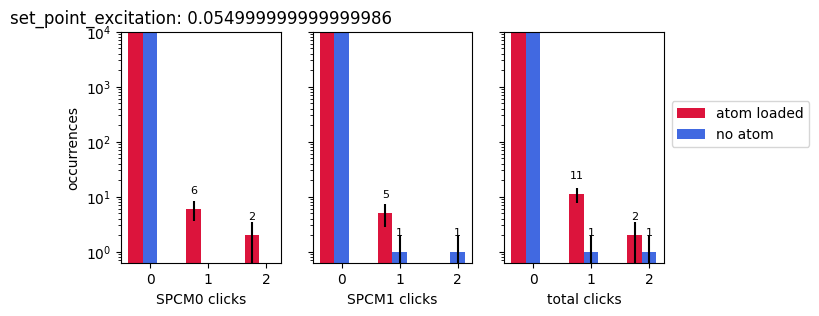

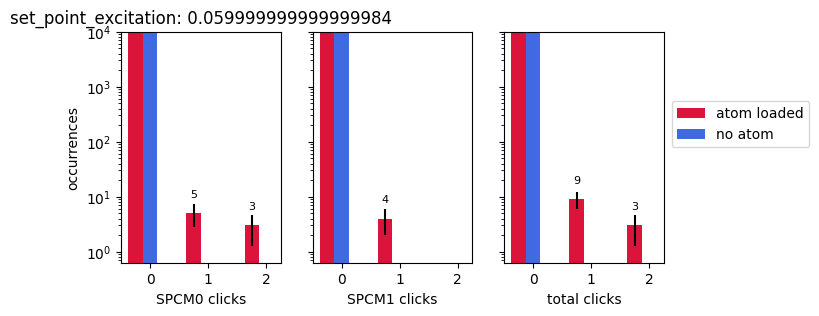

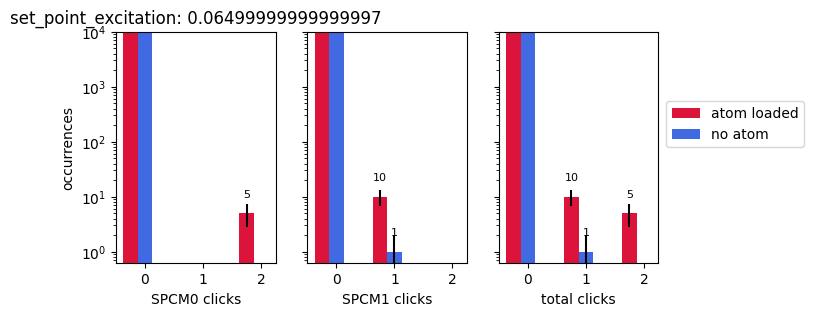

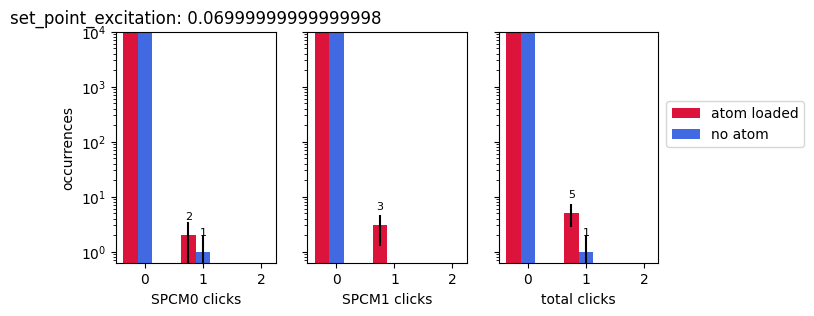

In [117]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



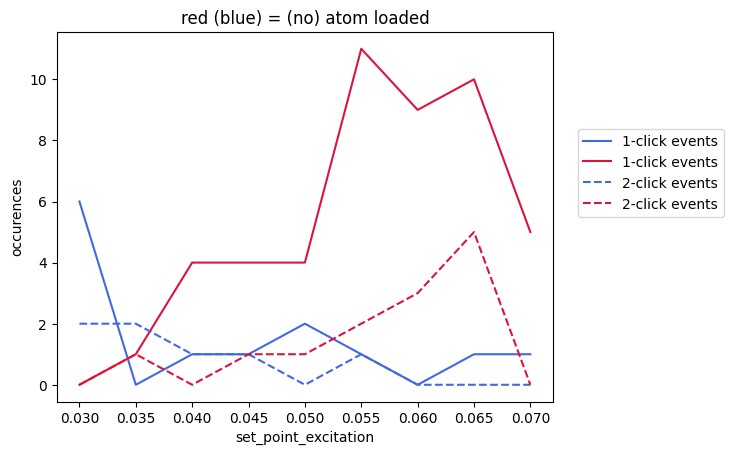

atom loading fraction: 0.35


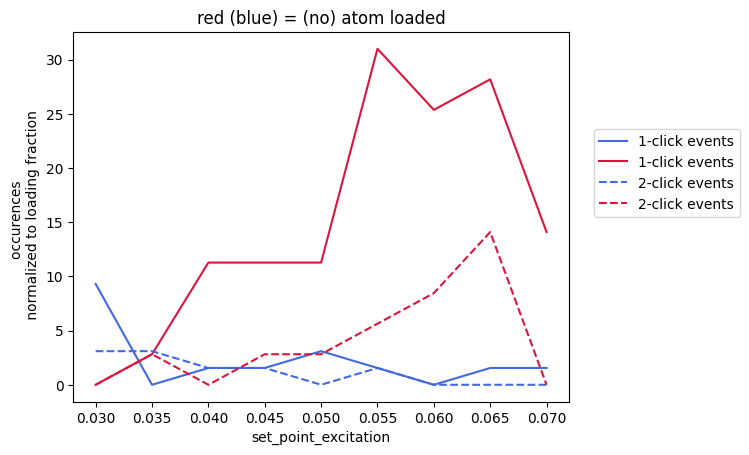

In [118]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)
plt.show()


## 2024.12.14

In [102]:
fnames = get_files_by_criteria(date_filters=["2024-12-13", "2024-12-14"], # only find files from these date directories
                               name_filters=["GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-13\17\000020446-GeneralVariableScan.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-14\20\000020455-GeneralVariableScan_single_photon_scan_over_n_excitation_cycles.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-14\22\000020458-GeneralVariableScan.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-14\22\000020459-GeneralVariableScan.h5, which is corrupt
found 15 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-13\09\000020440-GeneralVariableScan.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-13\09\000020440-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-1

## gate_start_offset

experiment: single_photon_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 250, 'set_point_excitation': 0.1}
threshold_otsu:  538


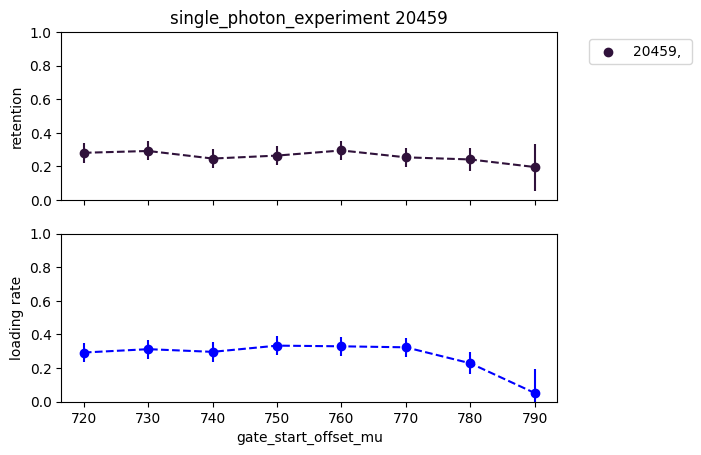

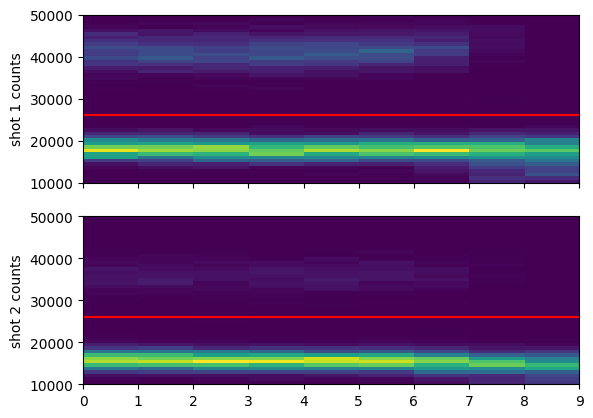

array([-0.56170276, -0.56170276, -1.84675648, ..., -1.41842229,
       -1.43391112, -1.46076585])

In [105]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 3: 'Excitation power'
    # 1: '50 excitation cycles, 20ns pulse, setpoint 0.1',
    # 12: '' # excitation cycle scan up to 200 excitation cycles
    # 13: '' # excitation set point scan - file is now corrupt for some reason
    14: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

GRIN1_EXC_monitor
p_excitation_history

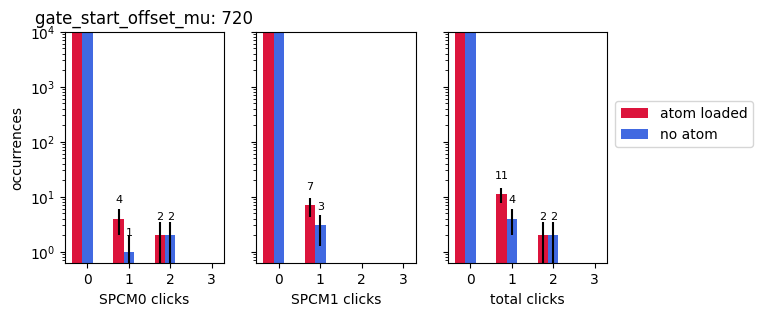

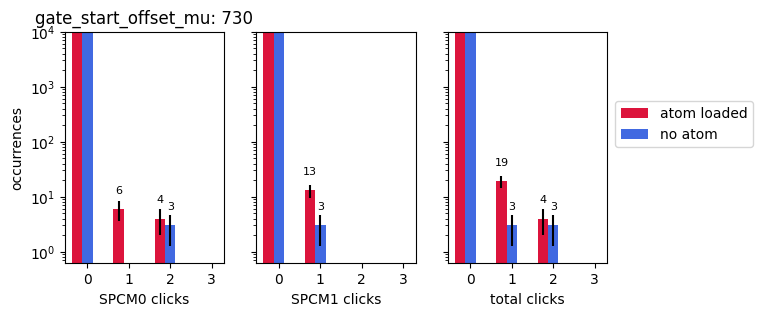

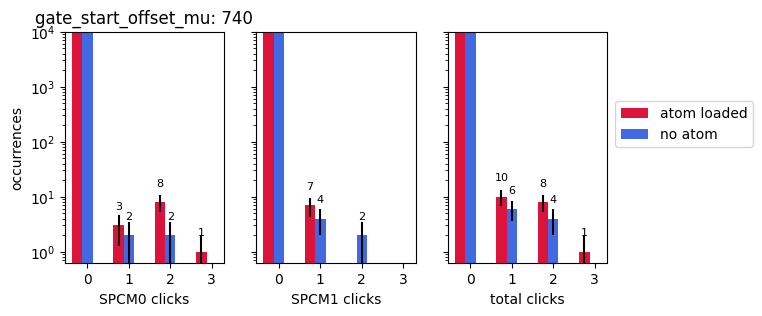

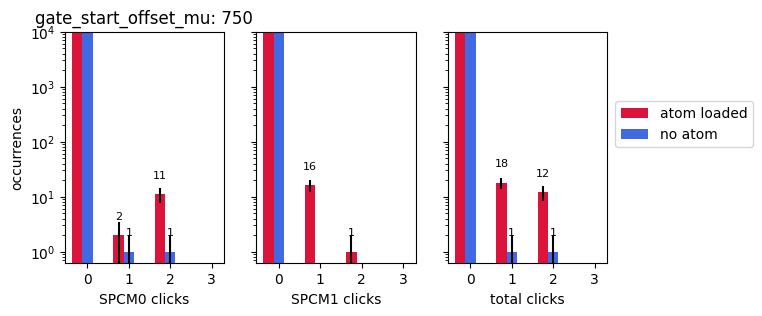

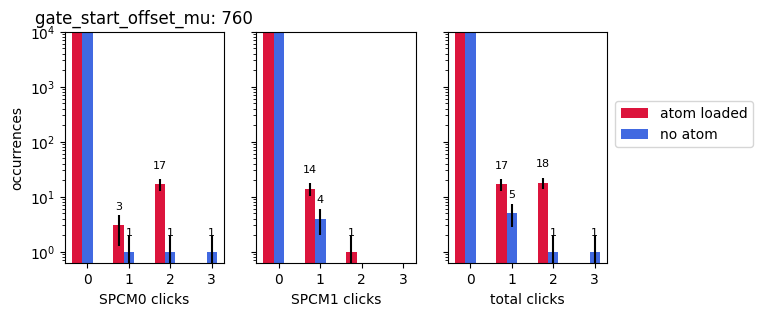

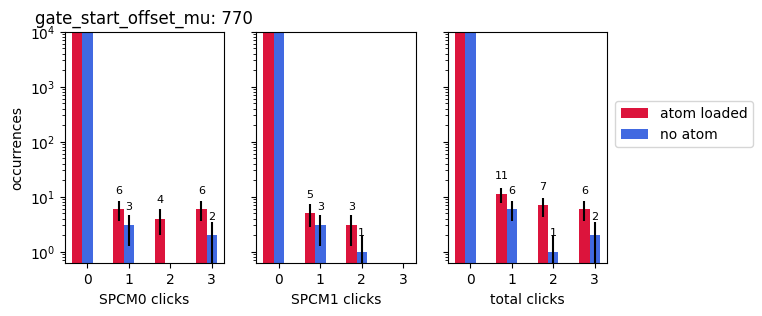

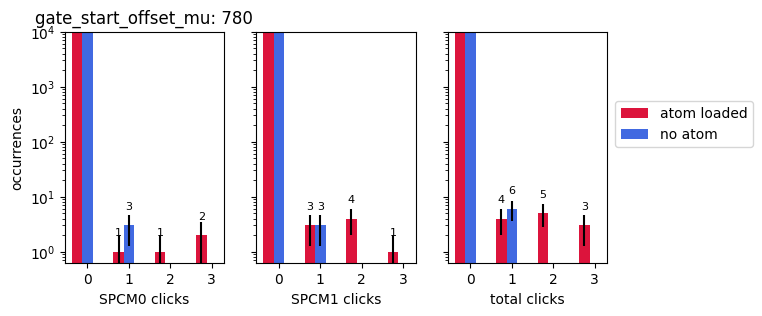

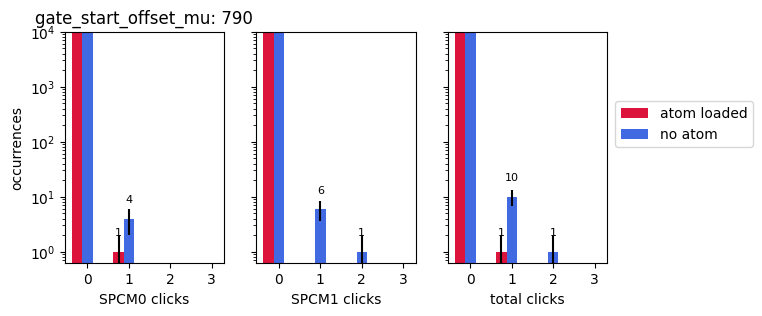

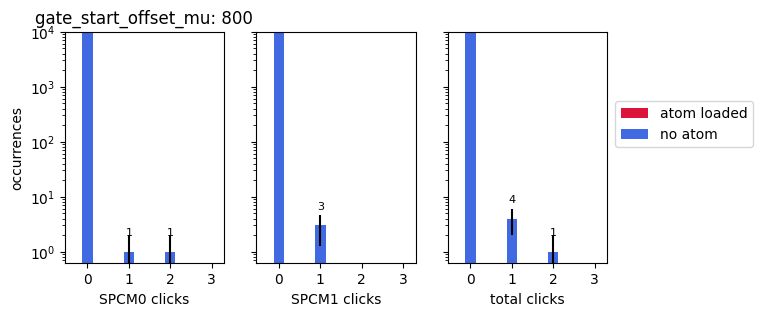

In [107]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



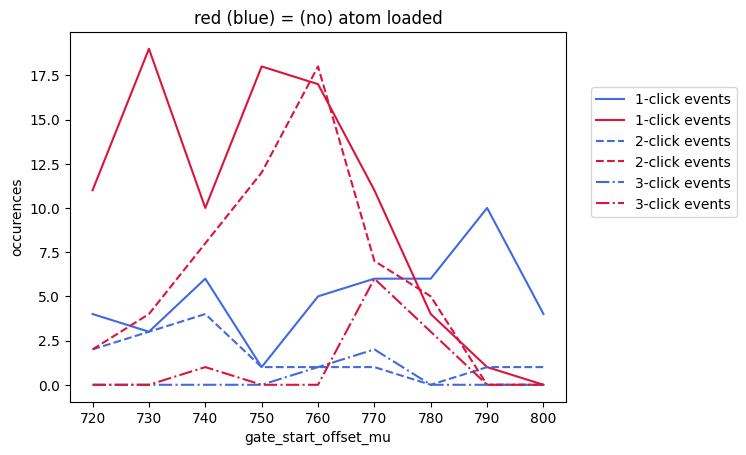

atom loading fraction: 0.24


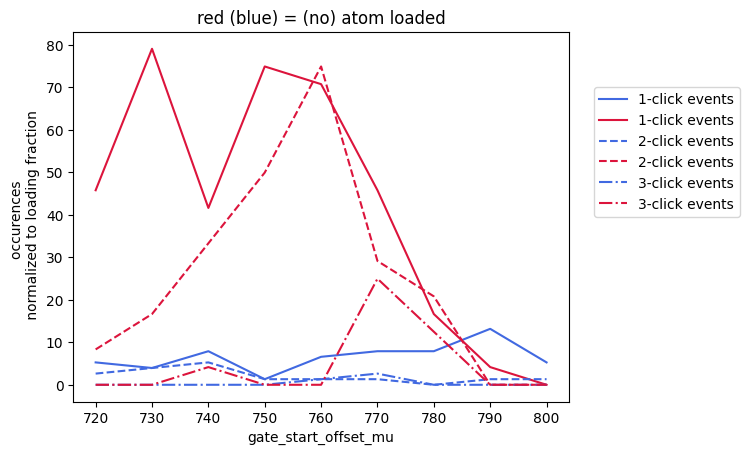

In [108]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)
plt.show()


## Excitation setpoint scan - no longer corrupted

experiment: single_photon_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 250, 'gate_start_offset_mu': 720}
threshold_otsu:  601


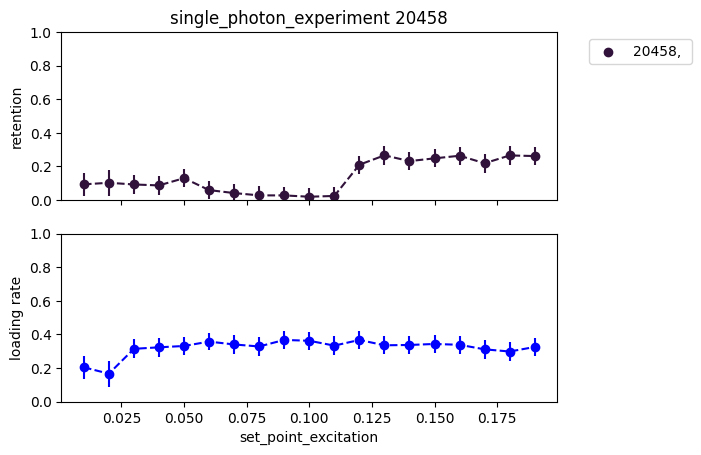

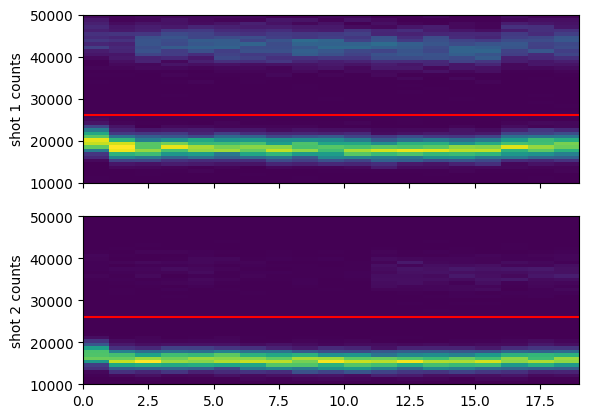

array([ -5.90250908,  -5.90250908, -13.55168194, ...,  -7.31107722,
         1.97863476,  -0.56170276])

In [62]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 3: 'Excitation power'
    # 1: '50 excitation cycles, 20ns pulse, setpoint 0.1',
    # 12: '' # excitation cycle scan up to 200 excitation cycles
    13: '' # excitation set point scan - file is now corrupt for some reason
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

GRIN1_EXC_monitor
p_excitation_history

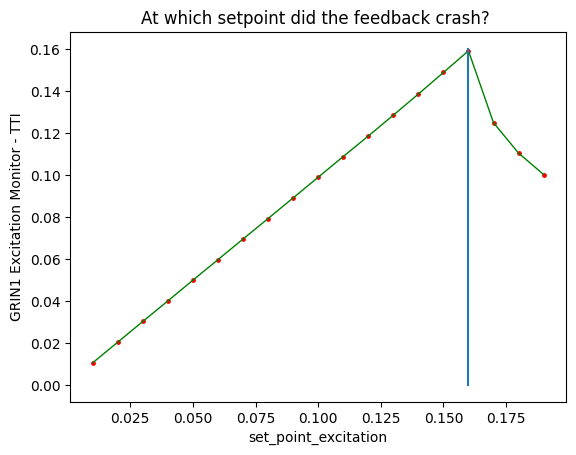

In [91]:
def average_over_measurement(measurements, history):
    iteration = len(history) // measurements
    mean_by_iteration = [np.mean(history[j * measurements:(j + 1) * measurements]) for j in range(iteration)]
    return mean_by_iteration

# GRIN1 EXC RF history
RF_history = locals()['GRIN1_EXC_monitor']
RF_mean_by_iteration = average_over_measurement(n_measurements, RF_history)
# plt.plot(RF_mean_by_iteration[:], label='EXC RF', lw=1) # dBm
plt.scatter(xsteps_xform(scan_sequence1), RF_mean_by_iteration[:], color='red', s=6)
plt.plot(xsteps_xform(scan_sequence1), RF_mean_by_iteration[:], color='green', lw=1)
plt.plot([0.16,.16],[0,0.16])
plt.title("At which setpoint did the feedback crash? ")
plt.ylabel("GRIN1 Excitation Monitor - TTI")
plt.xlabel('set_point_excitation')
plt.show()

In [72]:
xsteps_xform(scan_sequence1)

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19])

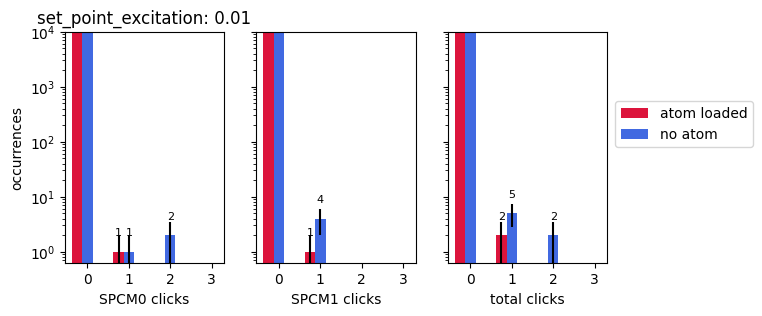

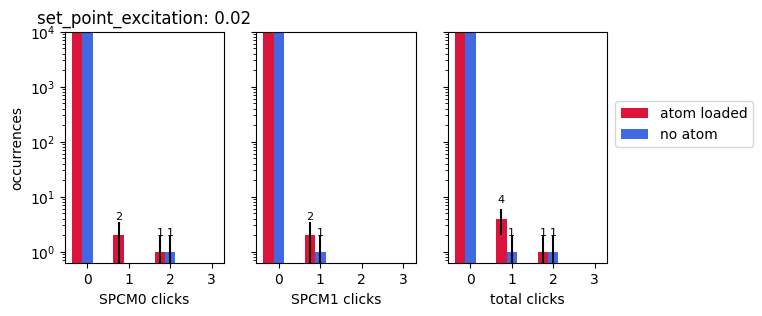

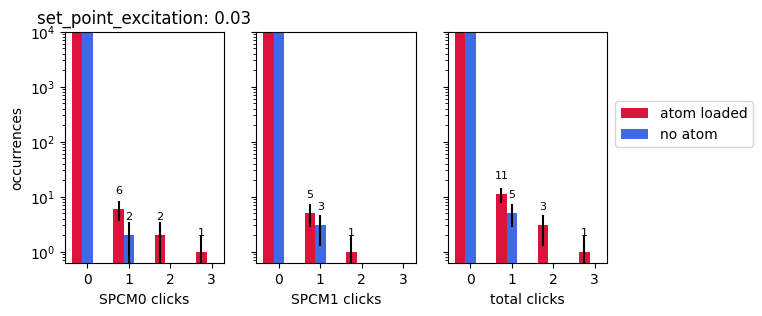

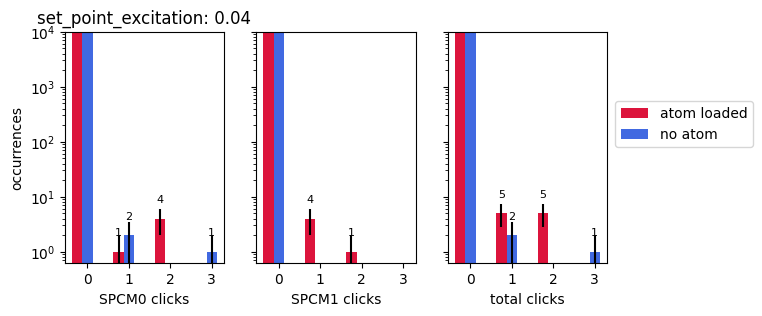

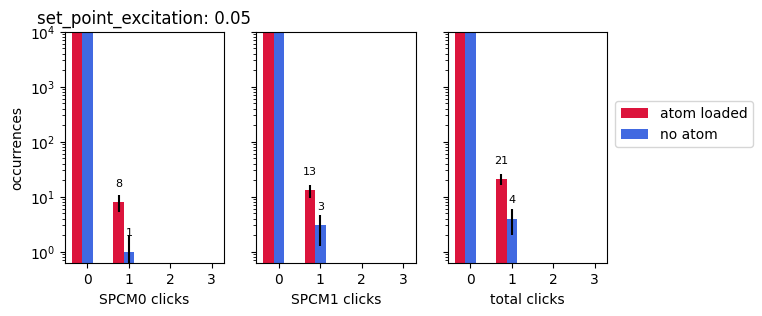

...

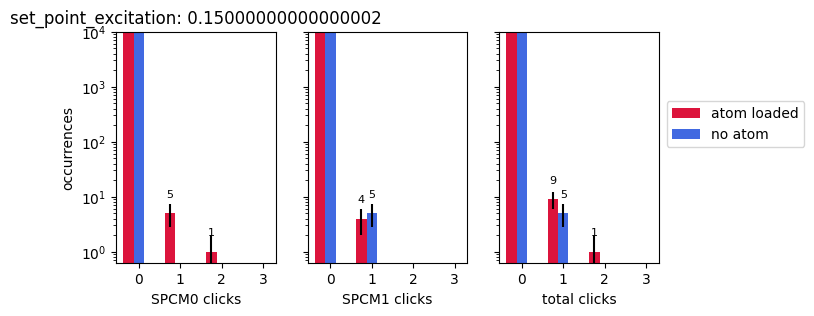

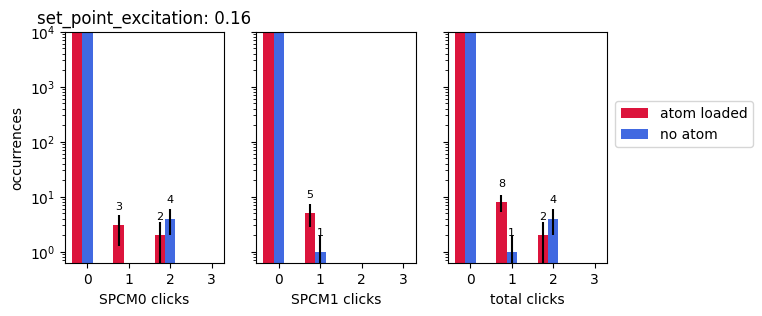

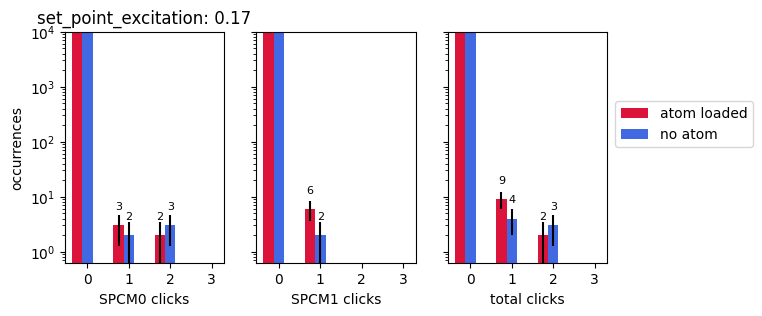

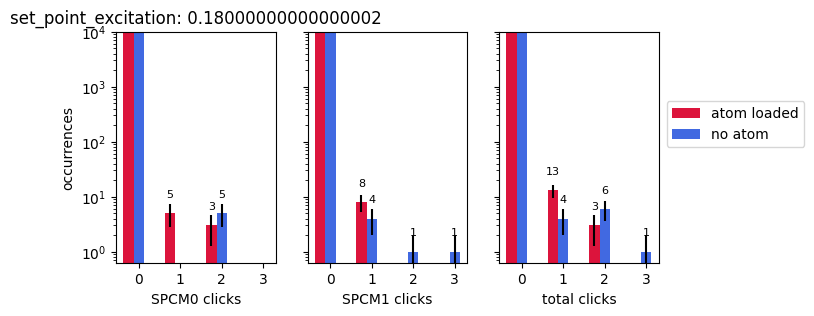

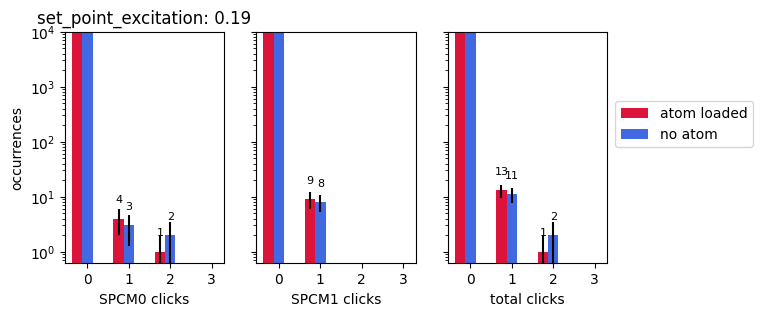

In [92]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        multiplier = 0 # moves the bar offset so that atom/no atom bars aren't overlapping
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



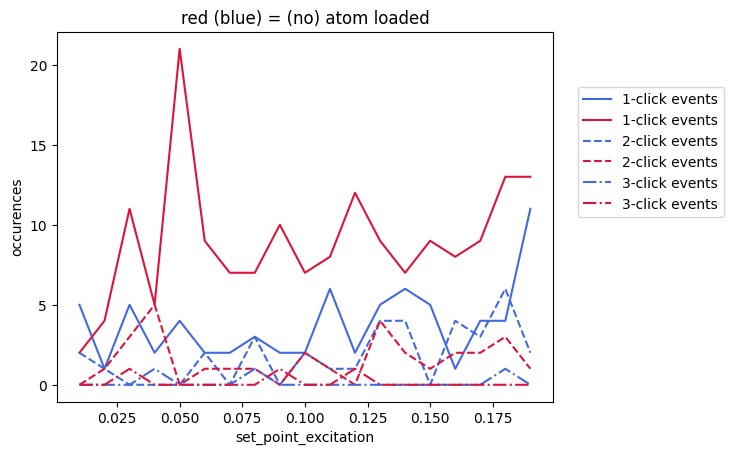

atom loading fraction: 0.32


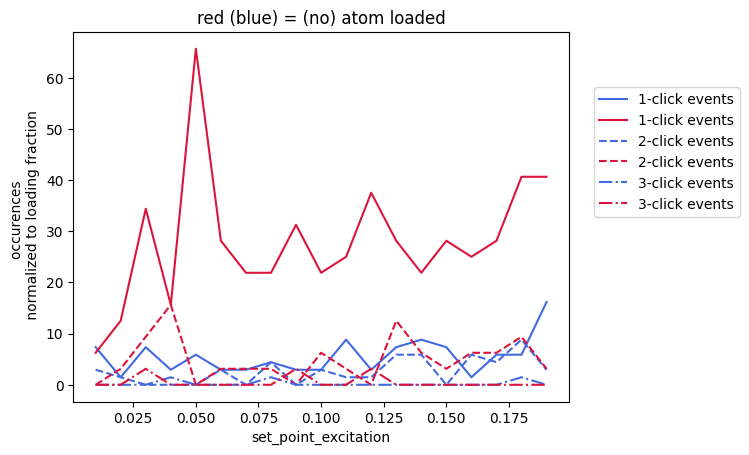

In [101]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)
plt.show()


In [52]:
n_measurements = 1000
mean_excitation_cycles = 98 # from fitting the excitation cycle scan to a decaying exponential
OP_fidelity = 0.9
loading = 0.38 # for the set point=0.05 iteration 
P_photon_collection = 0.02
print("expected number of 1-click events from an atom:")
n_measurements*loading*mean_excitation_cycles*OP_fidelity*P_photon_collection

expected number of 1-click events from an atom:


670.32

In [38]:
n_excitation_cycles

250

In [39]:
n_measurements

1000

## Excitation power

experiment: single_photon_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 50, 'set_point_excitation': 0.1}
threshold_otsu:  562


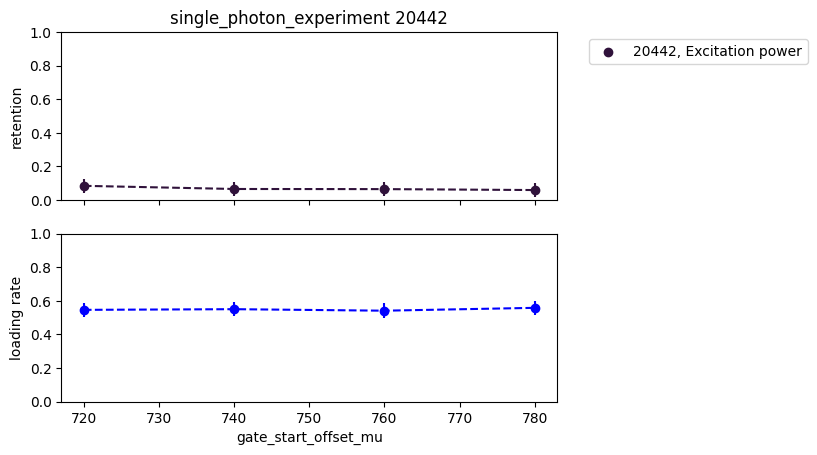

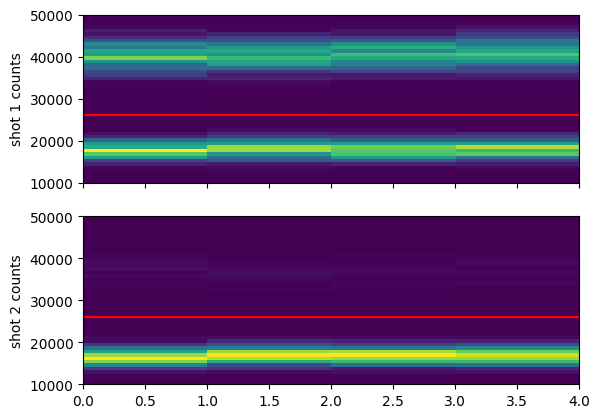

In [103]:
compare = False # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = True
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.



file_indices = {
    3: 'Excitation power'
    # 1: '50 excitation cycles, 20ns pulse, setpoint 0.1',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT



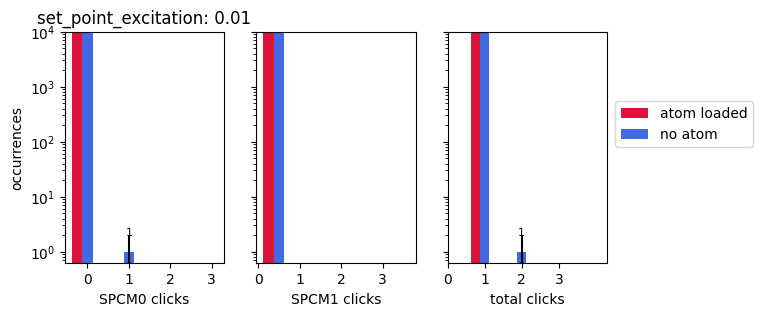

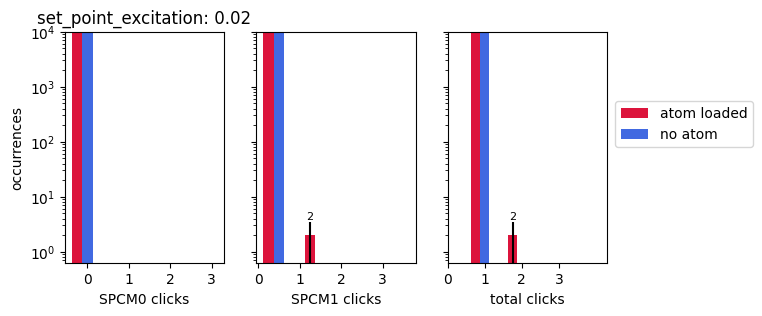

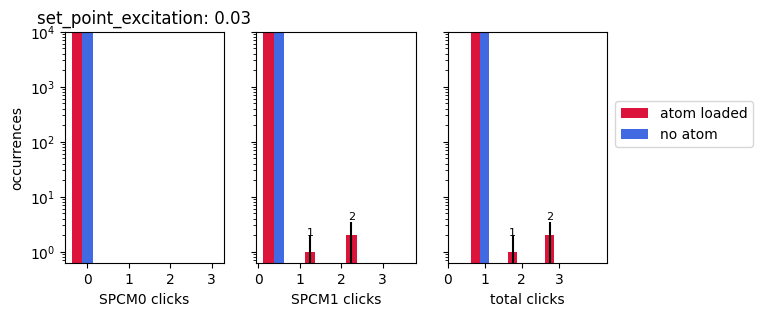

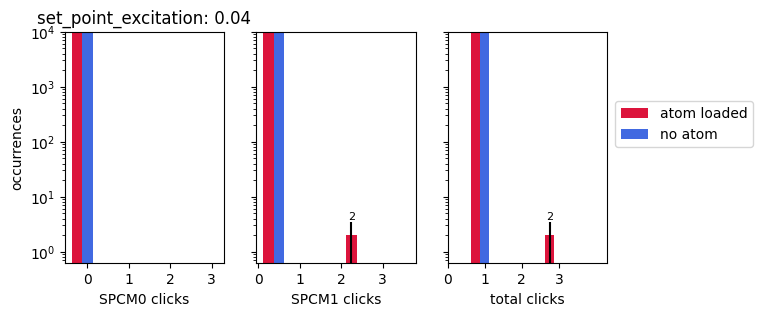

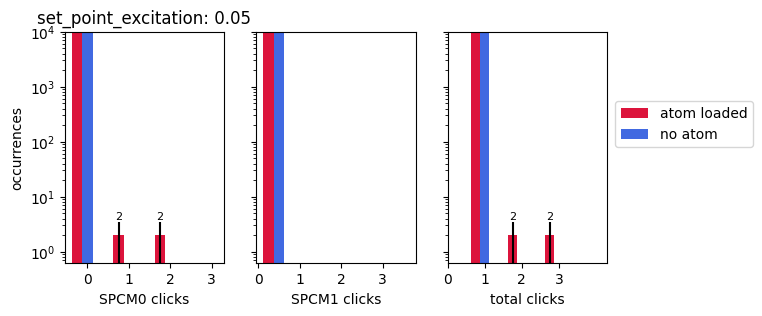

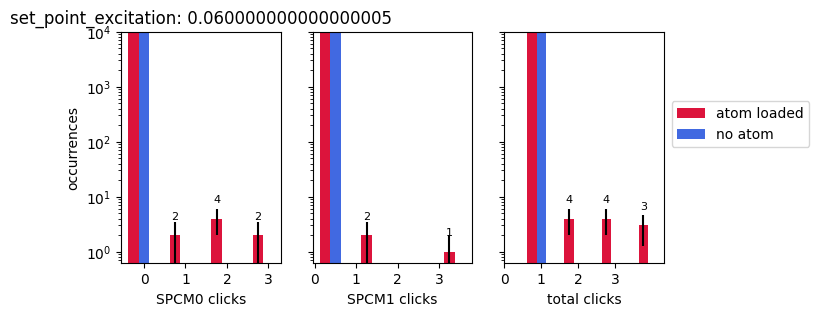

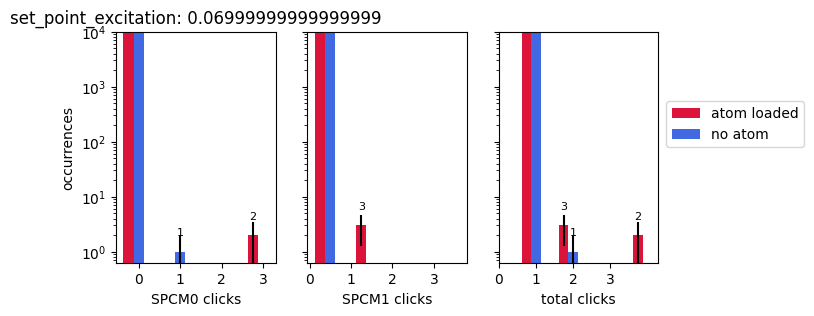

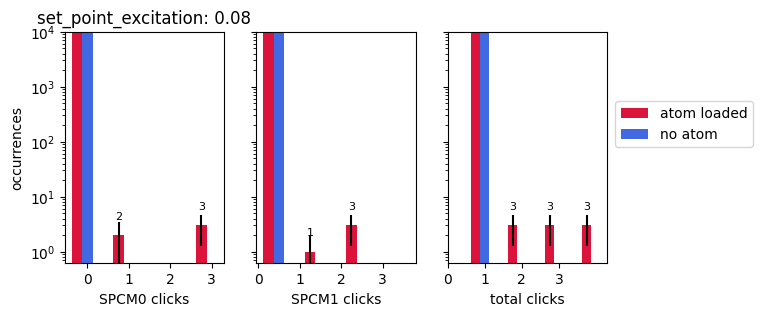

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


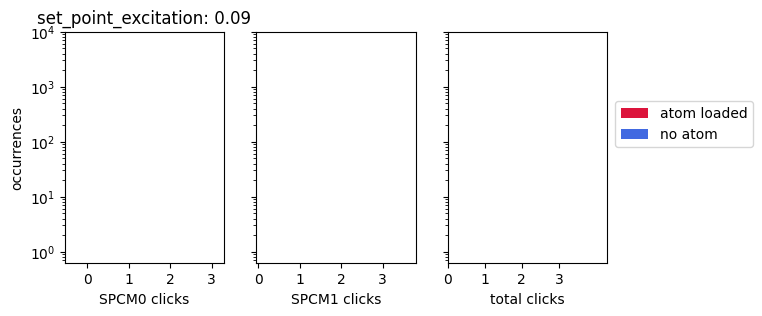

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


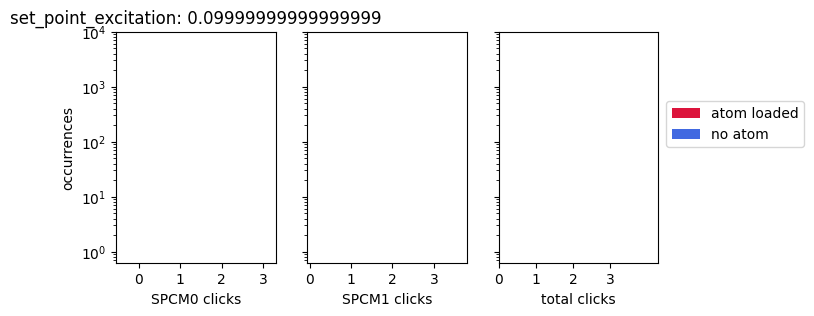

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


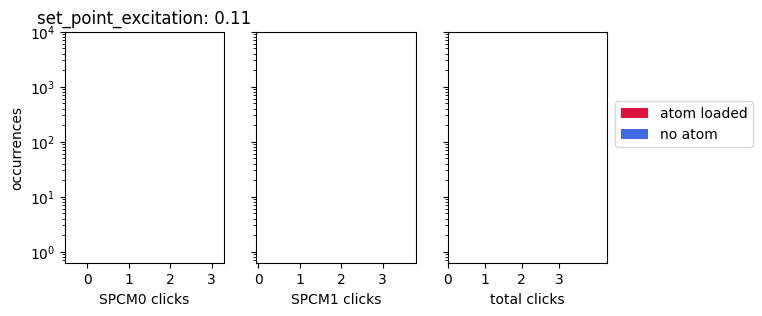

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


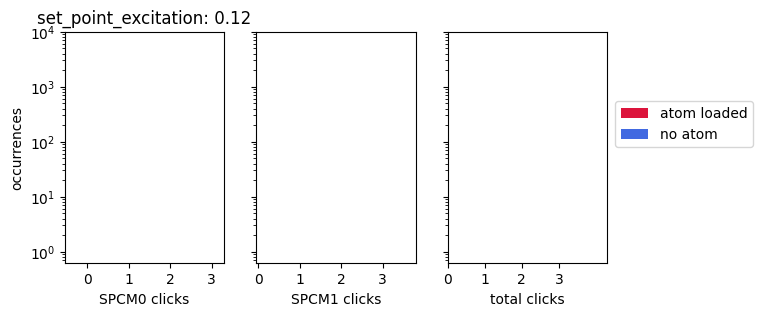

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


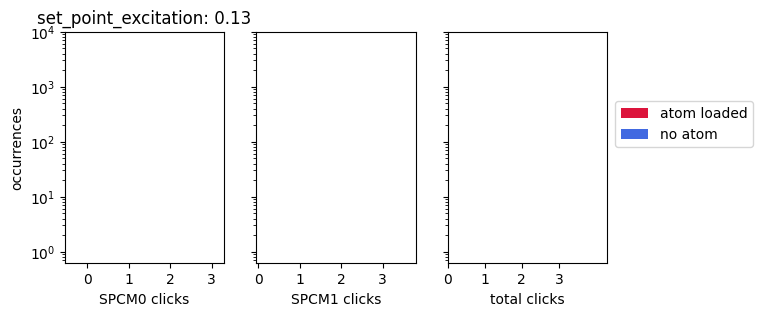

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


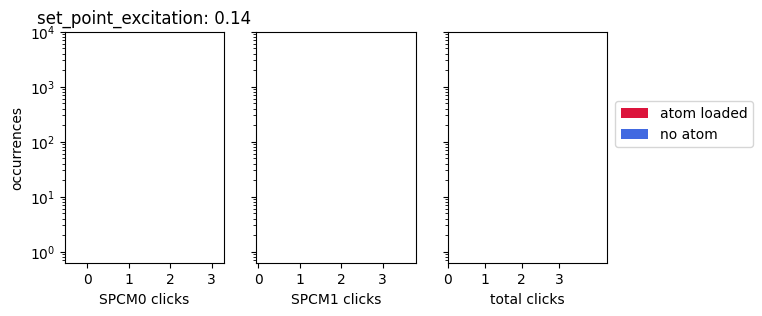

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


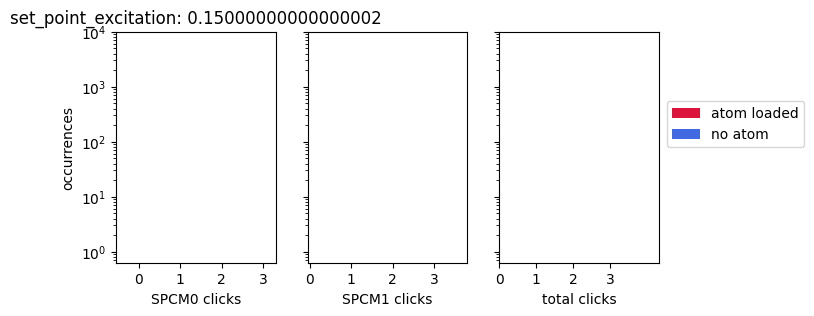

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


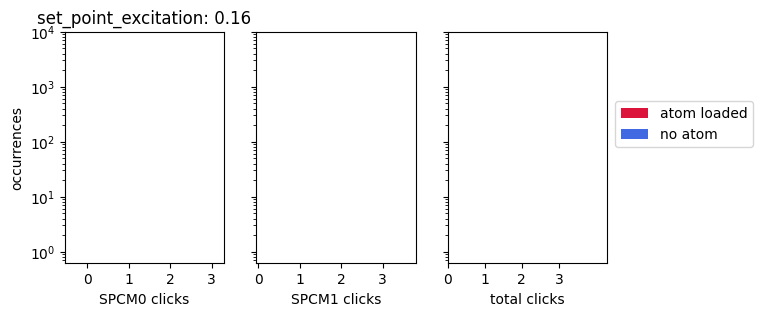

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


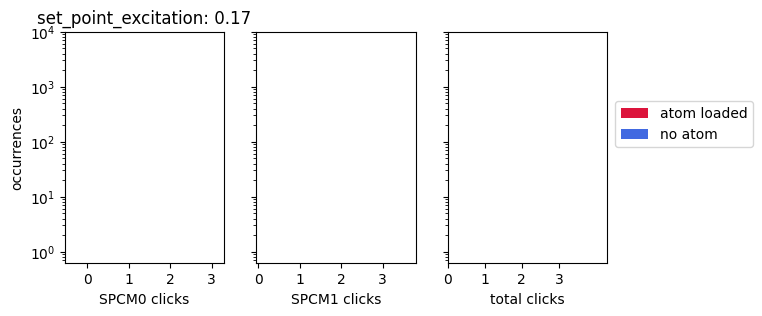

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


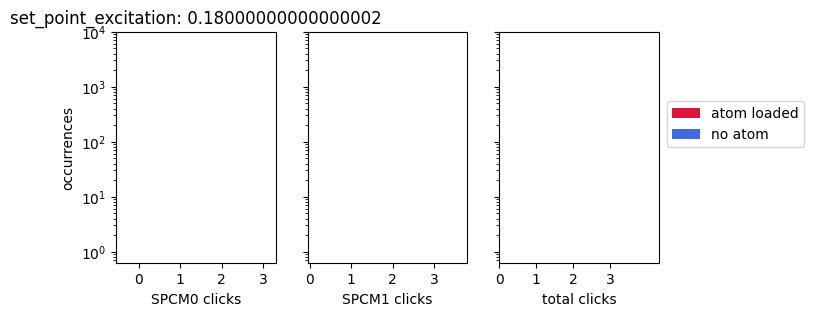

C:\Users\QC\AppData\Local\Temp\ipykernel_30832\3963518208.py:71: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


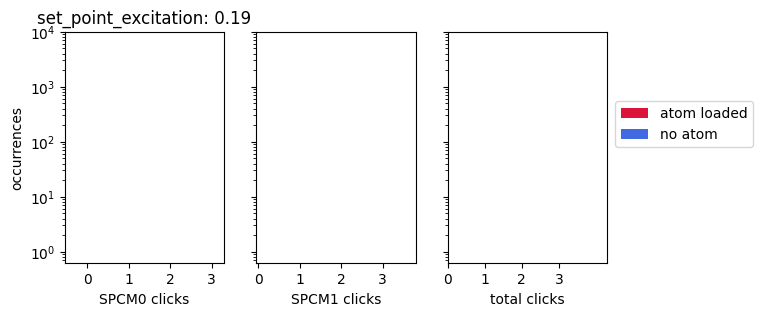

In [6]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



ValueError: x and y must have same first dimension, but have shapes (4,) and (19,)

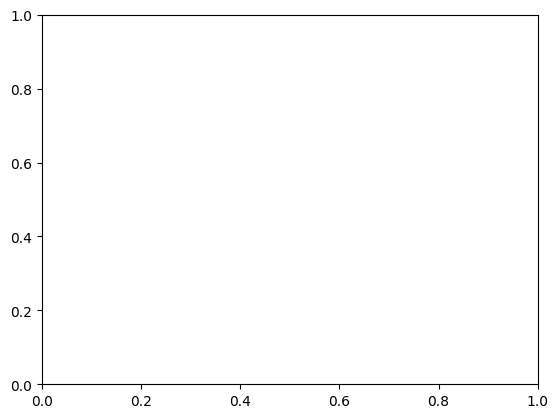

In [104]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## Scan over gate_start

experiment: single_photon_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 50, 'set_point_excitation': 0.1}
threshold_otsu:  594


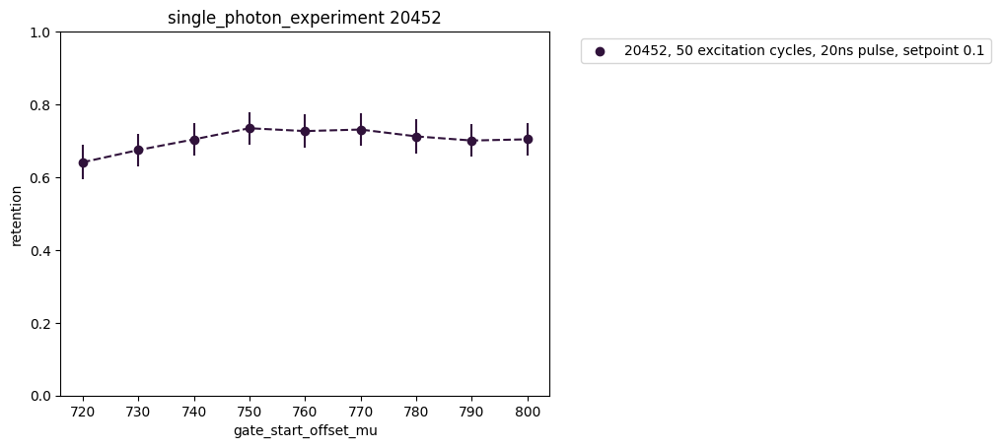

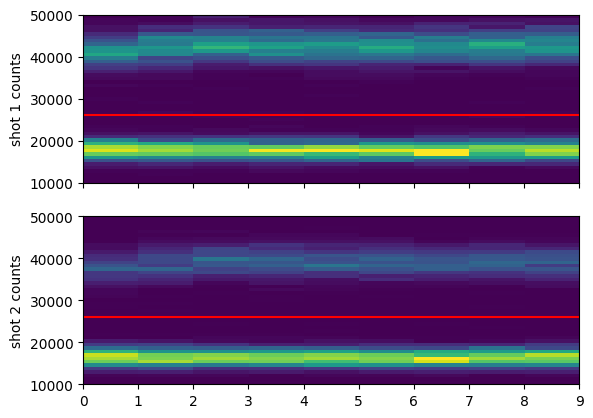

In [10]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.



file_indices = {
    # 0:'30 excitation cycles, 20ns pulse'
    # 1: '50 excitation cycles, 20ns pulse, setpoint 0.1',
    4: '50 excitation cycles, 20ns pulse, setpoint 0.1'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT



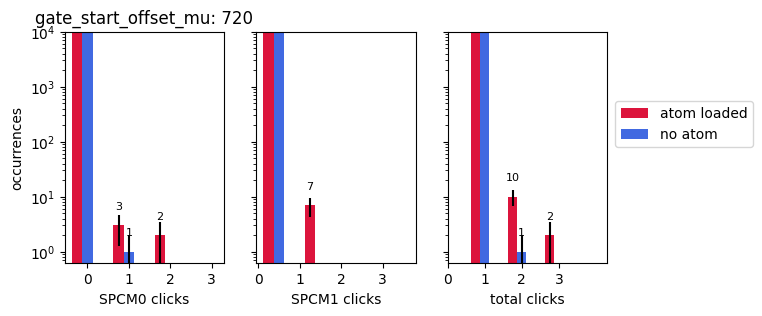

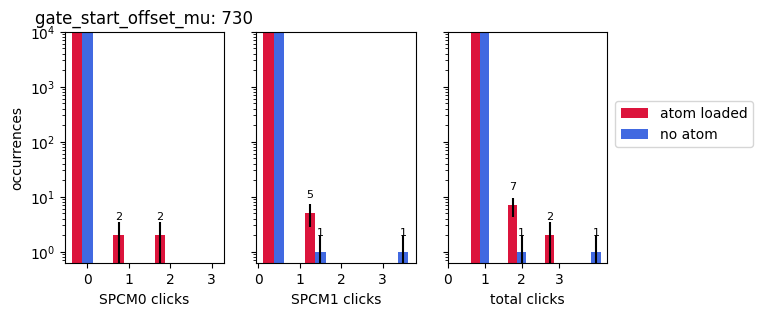

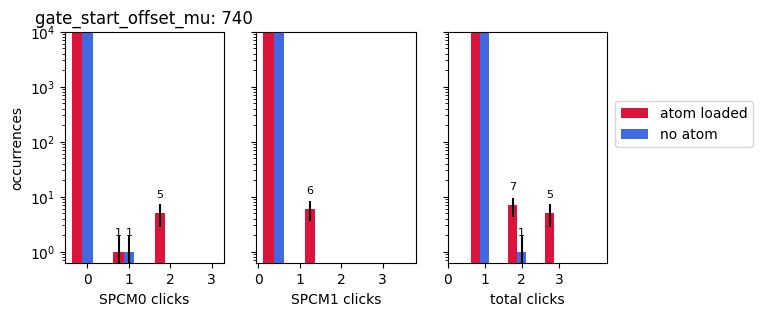

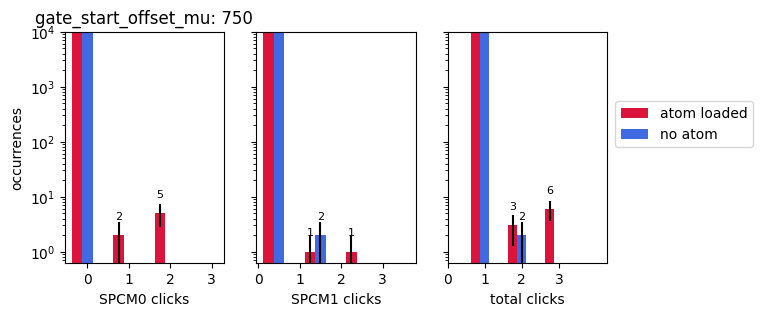

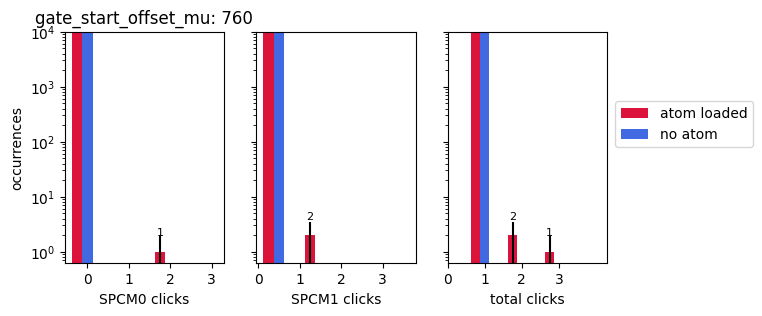

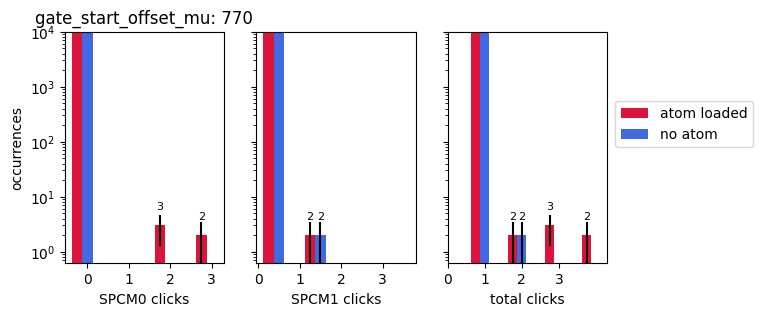

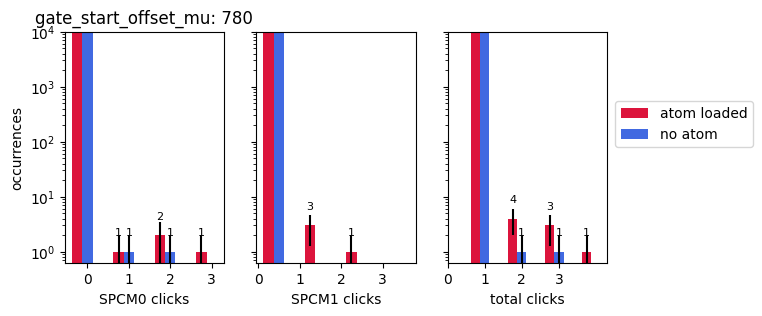

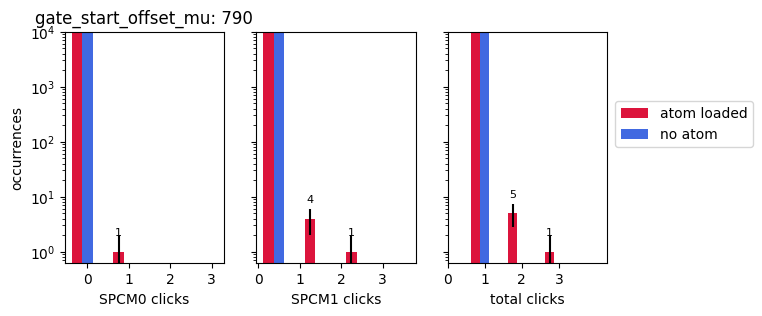

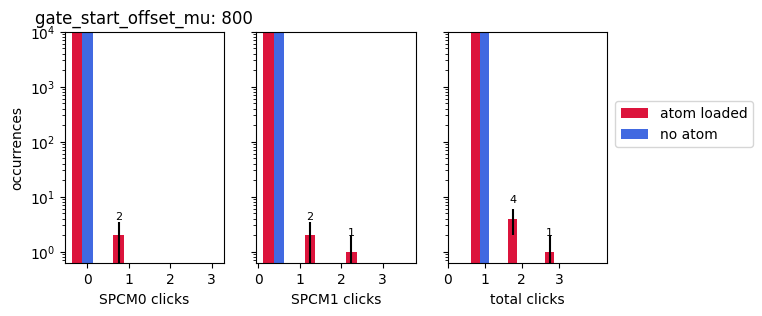

In [11]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



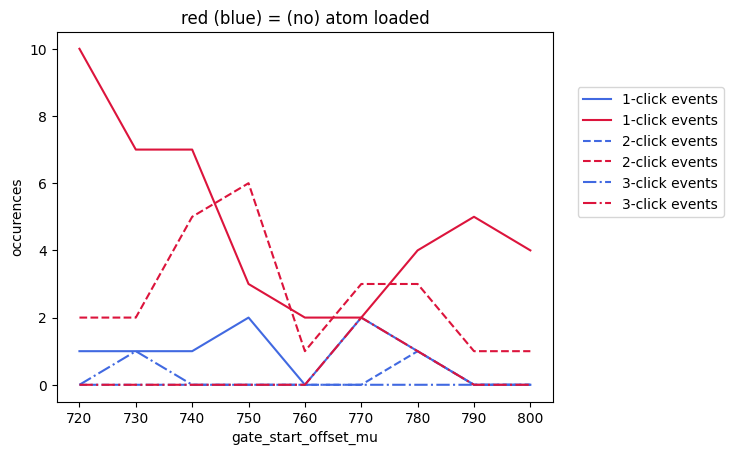

atom loading fraction: 0.49


Text(0.5, 0, 'gate_start_offset_mu')

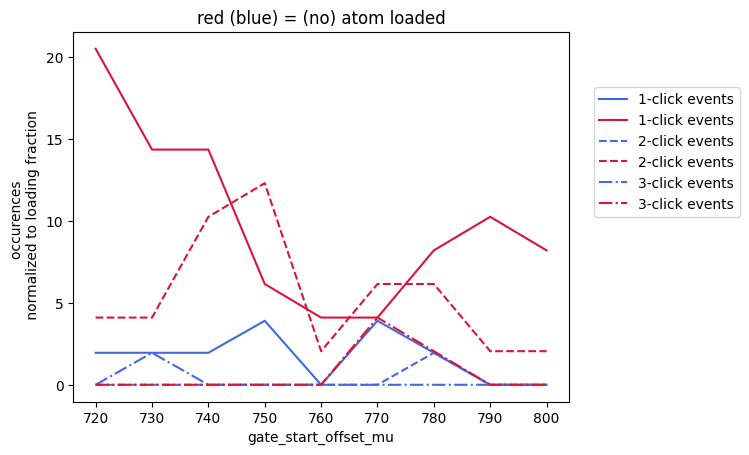

In [12]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## 2024.12.13

In [42]:
fnames = get_files_by_criteria(date_filters=["2024-12-13"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 3 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-13\09\000020440-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-13\09\000020442-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-13\17\000020446-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu


## Scan over gate_start

experiment: single_photon_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms,'n_excitation_cycles': 50, 'set_point_excitation': 0.1}
threshold_otsu:  582


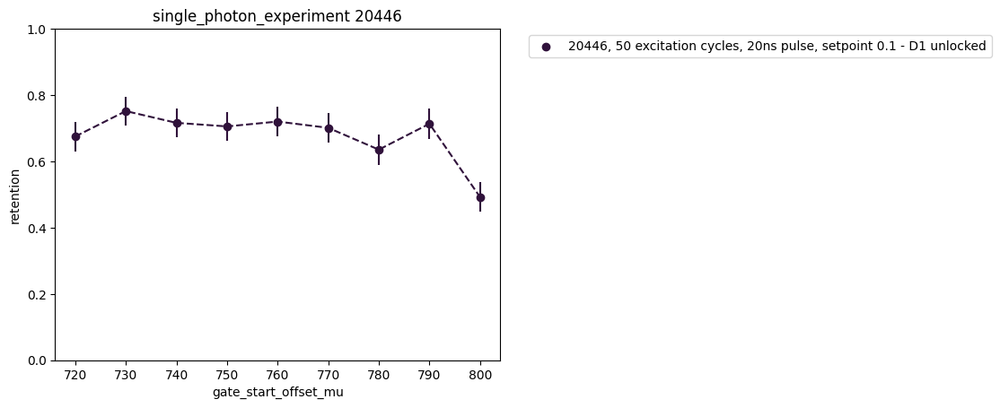

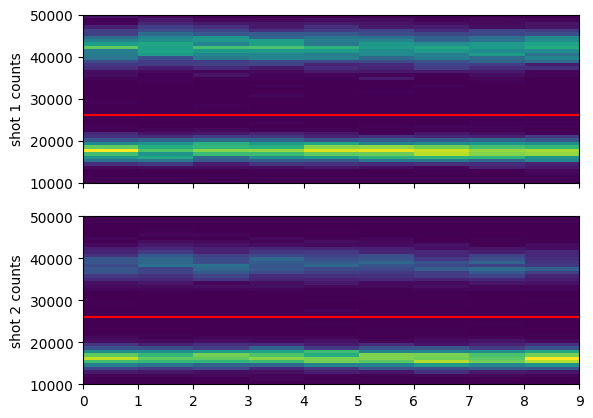

In [49]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.



file_indices = {
    # 0:'30 excitation cycles, 20ns pulse'
    # 1: '50 excitation cycles, 20ns pulse, setpoint 0.1',
    2: '50 excitation cycles, 20ns pulse, setpoint 0.1 - D1 unlocked'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT



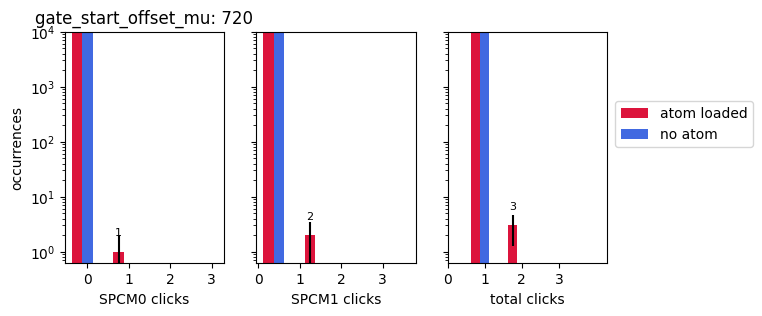

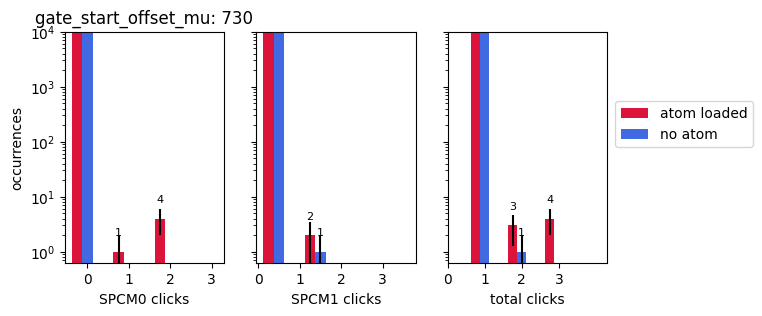

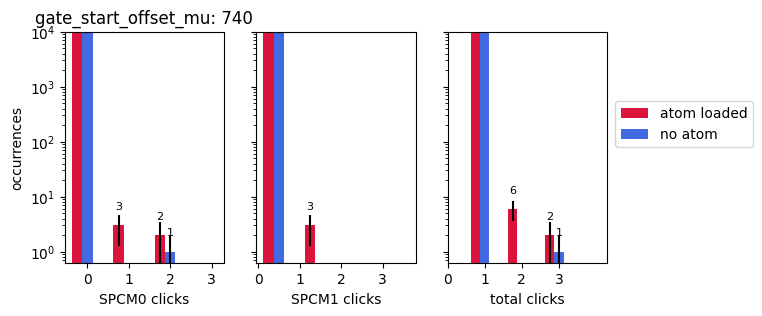

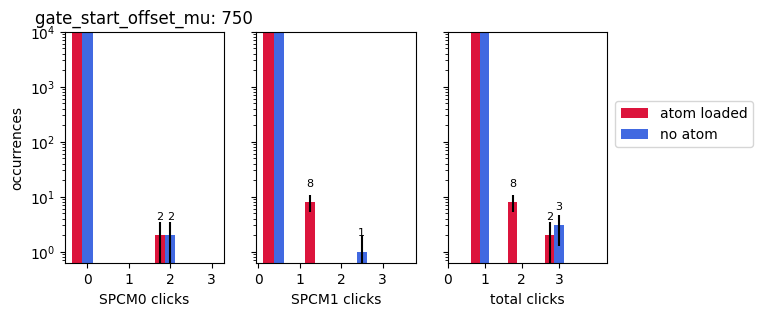

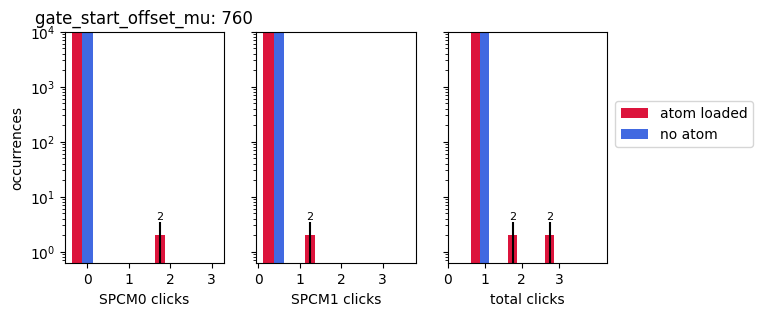

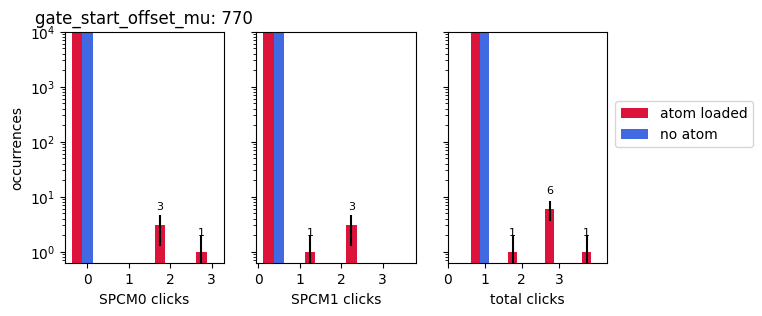

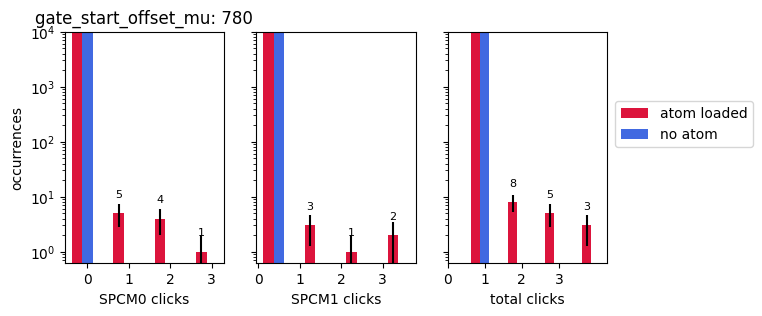

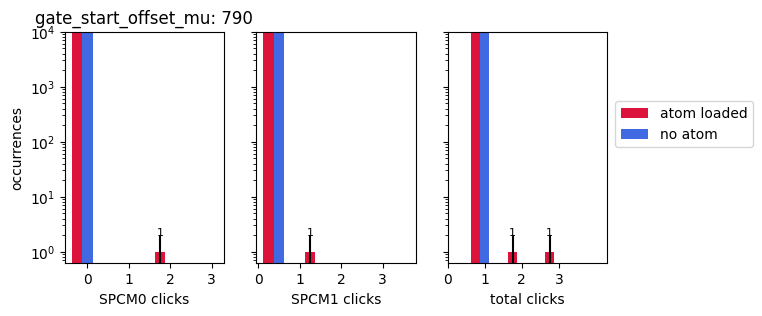

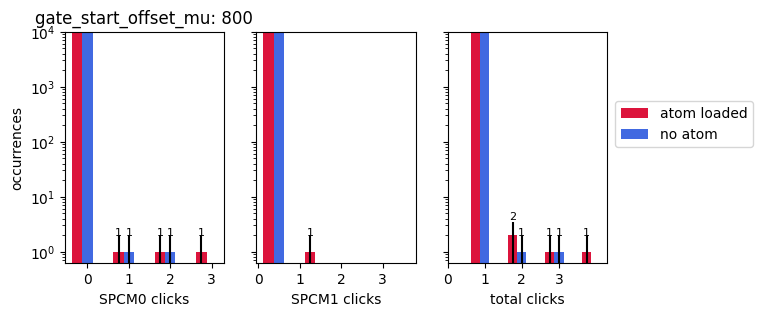

In [47]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



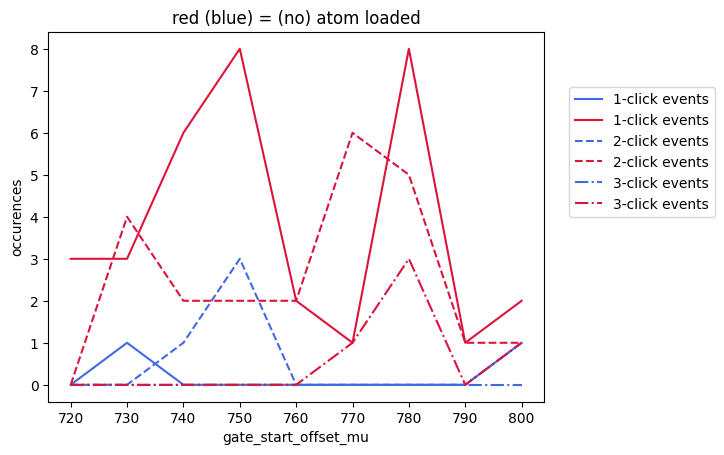

atom loading fraction: 0.51


Text(0.5, 0, 'gate_start_offset_mu')

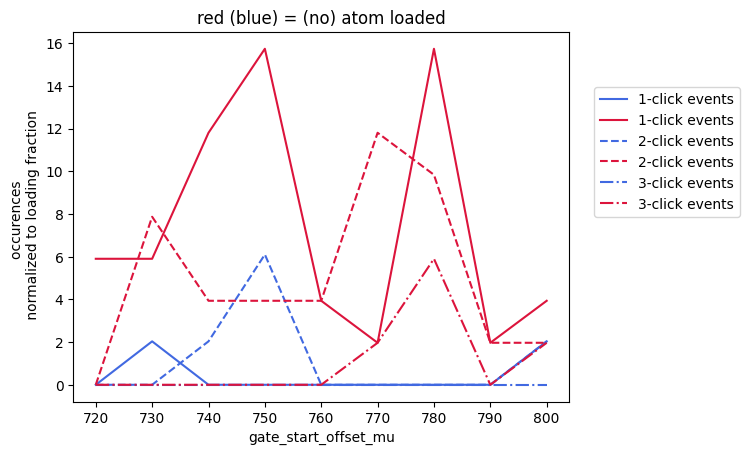

In [45]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## 2024.12.11

In [10]:
fnames = get_files_by_criteria(date_filters=["2024-12-11"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 2 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-11\11\000020285-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-11\12\000020286-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu


## Scan over gate_start

experiment: single_photon_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms, 'n_excitation_cycles': 30}
threshold_otsu:  450


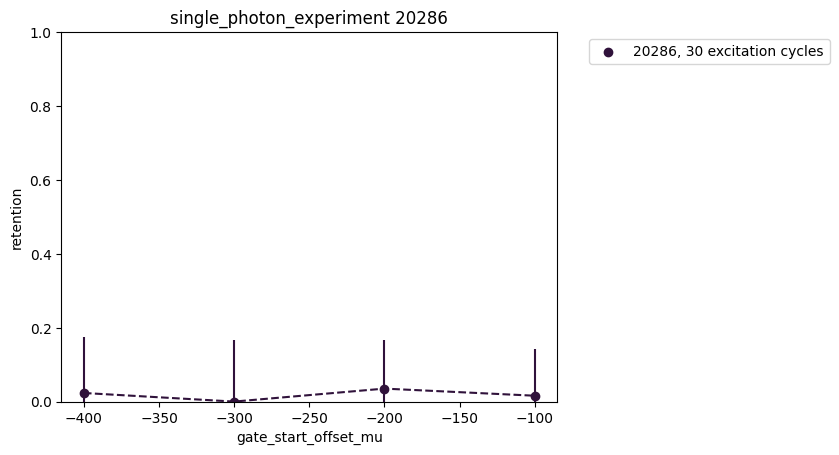

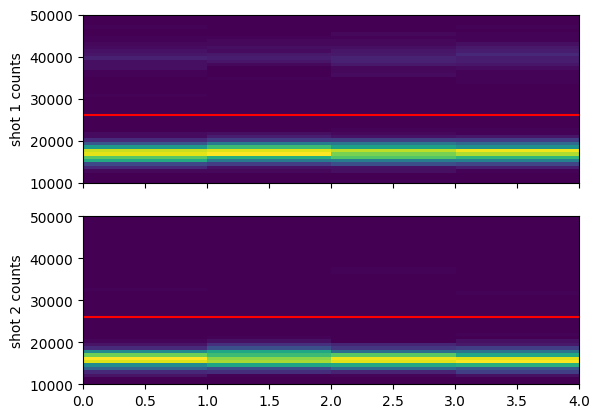

In [17]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.



file_indices = {
    1:'30 excitation cycles'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh )
    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT



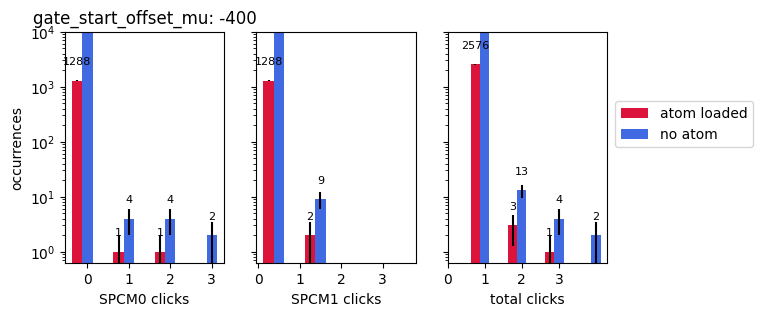

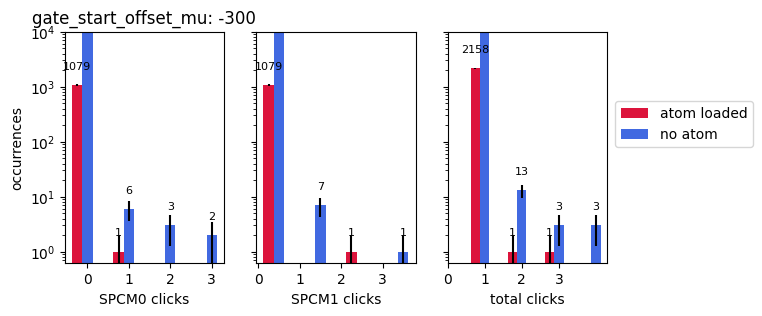

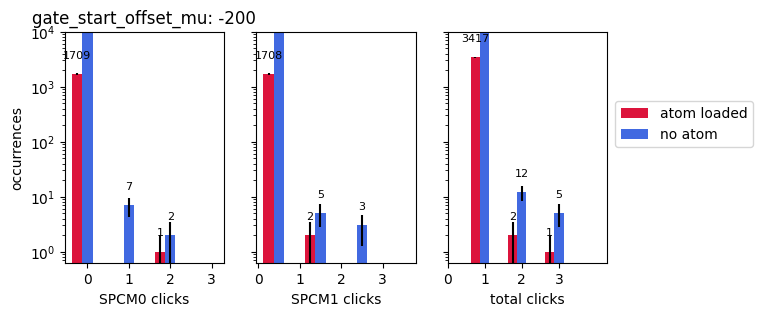

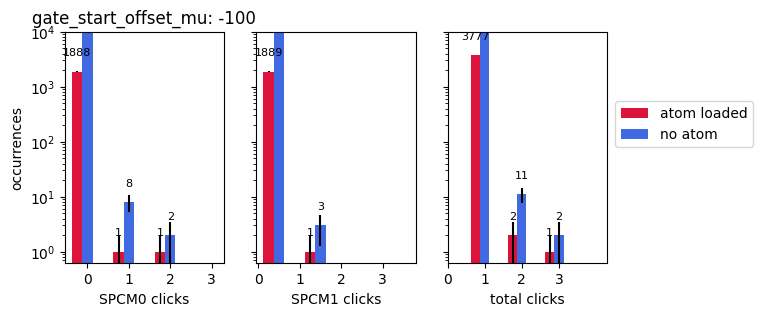

In [18]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()



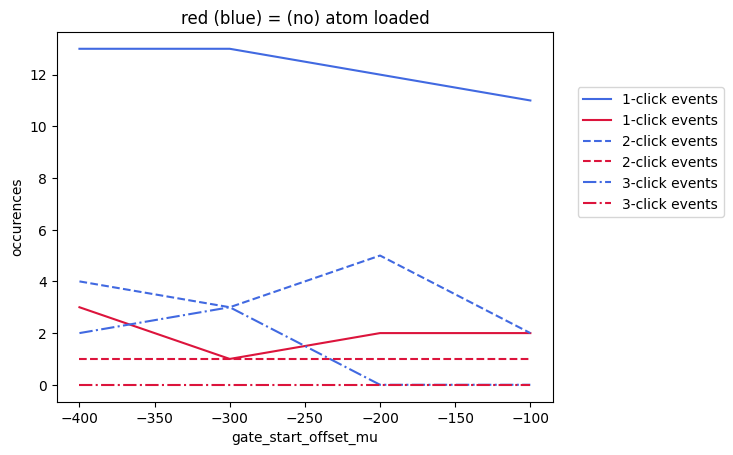

atom loading fraction: 0.10


Text(0.5, 0, 'gate_start_offset_mu')

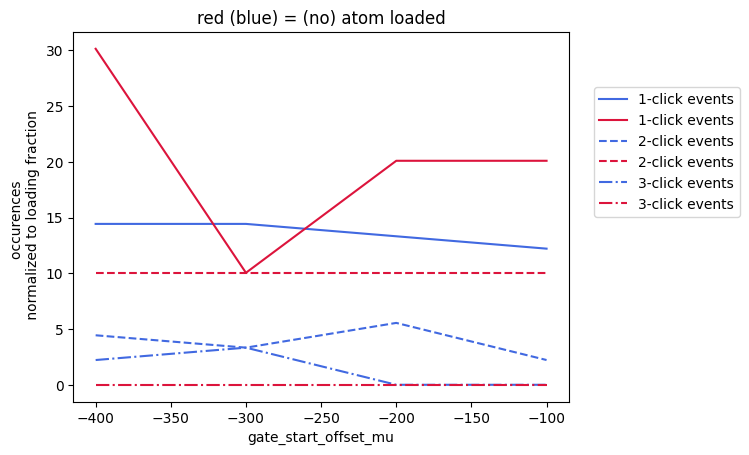

In [19]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## Scan over gate_start

experiment: single_photon_experiment
override: {'dummy_variable':4,'require_atom_loading_to_advance': False,'t_recooling':5*ms, 'n_excitation_cycles': 30}
threshold_otsu:  574


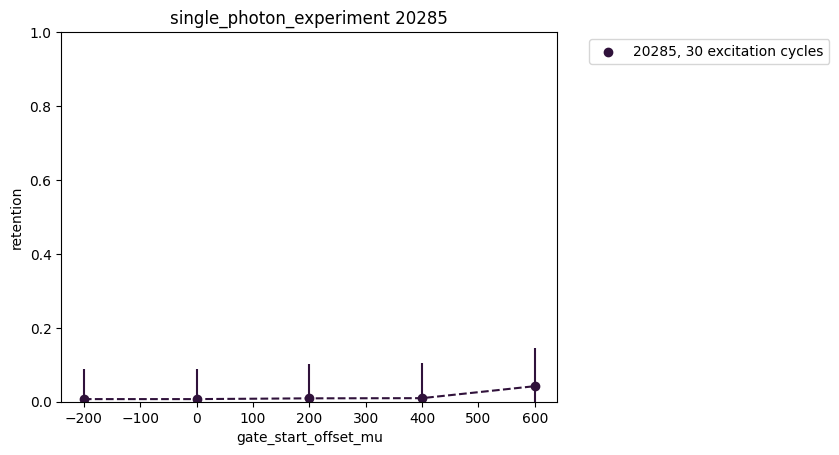

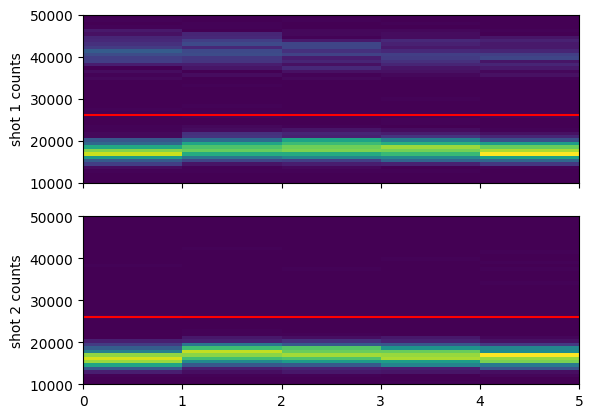

In [20]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.



file_indices = {
    0:'30 excitation cycles'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    if otsu_threshold:
        thresh = threshold_otsu(photocounts)
        print("threshold_otsu: ", thresh)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT



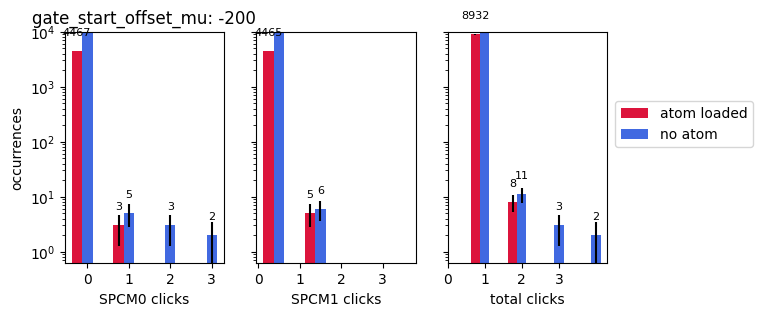

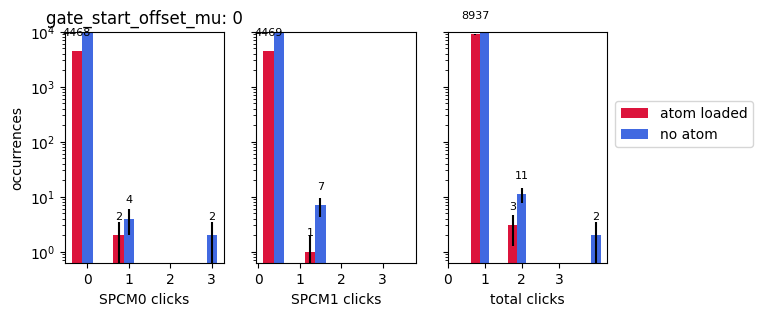

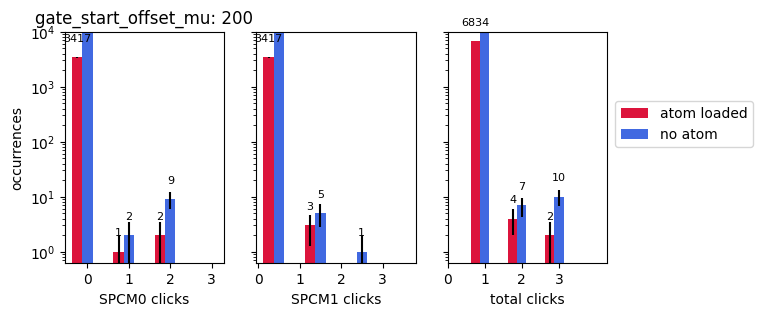

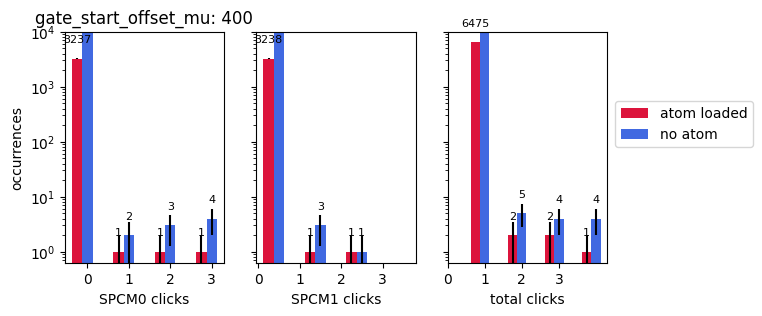

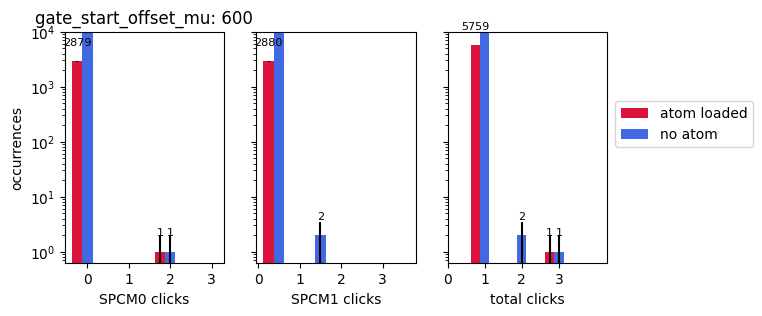

574

In [21]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()

thresh

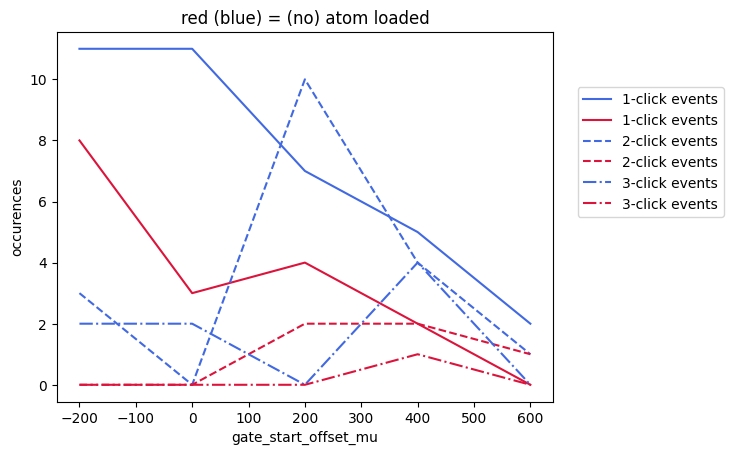

atom loading fraction: 0.25


Text(0.5, 0, 'gate_start_offset_mu')

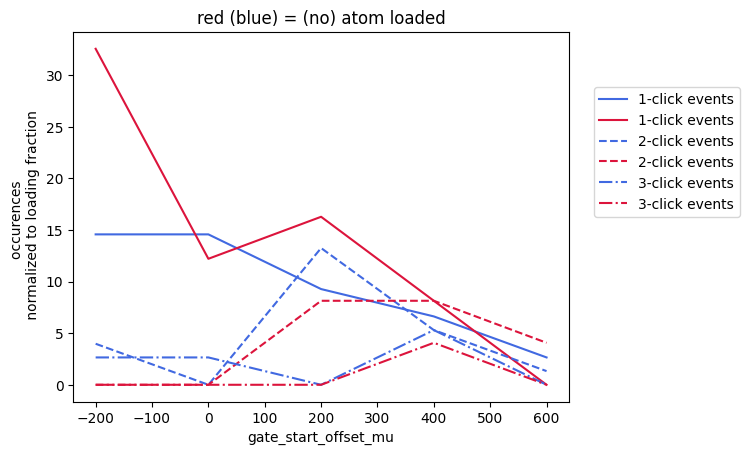

In [22]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## 2024.12.09 ~ 12.10

In [148]:
fnames = get_files_by_criteria(date_filters=["2024-12-08","2024-12-09","2024-12-10"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # if False, only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-09\13\000020192-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5, which is corrupt
skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-09\15\000020211-GeneralVariableScan_single_photon_scan_over_n_excitation_cycles.h5, which is corrupt
found 14 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-08\22\000020177-GeneralVariableScan_single_photon_scan_over_set_point_excitation.h5) scanned over set_point_excitation
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-08\22\000020178-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-09\00\000020179-GeneralVariableScan_single_photon_scan_over_t_recooling.h5) scanned over t_recooling
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-09\03\000

## Scan over gate_start

In [161]:
thresh

547

experiment: single_photon_experiment
override: {'dummy_variable':4,'n_excitation_cycles': 30, 'set_point_excitation':0.085, 't_recooling':5*ms}


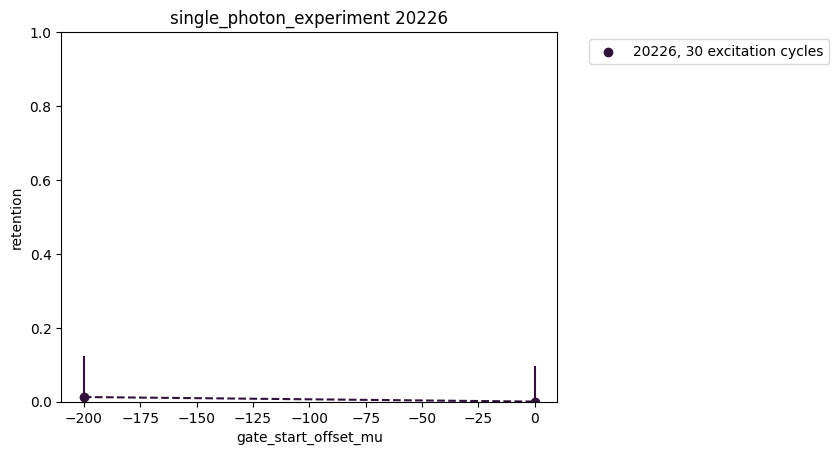

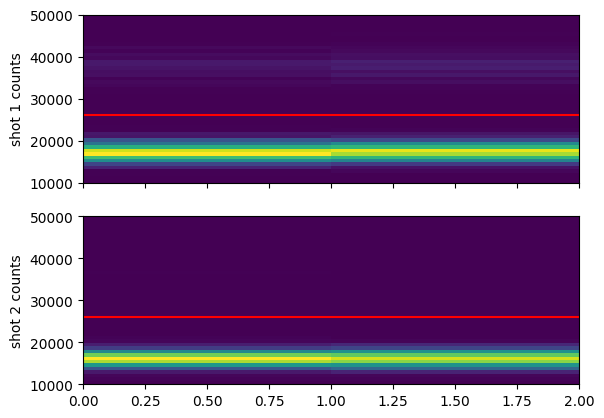

In [171]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

thresh = threshold_otsu(photocounts)

file_indices = {
    # 4: '',
    # 8: ''
    # 11: '',
    13:'30 excitation cycles'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT

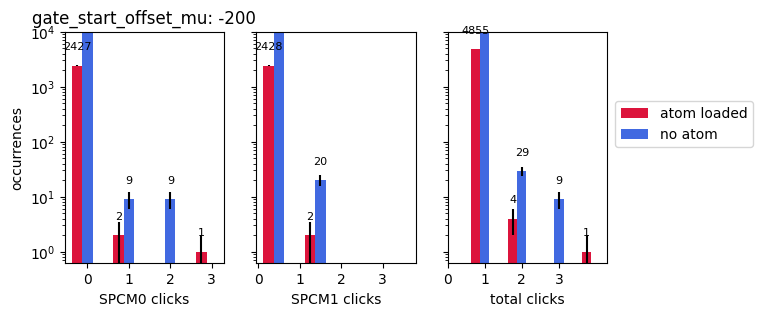

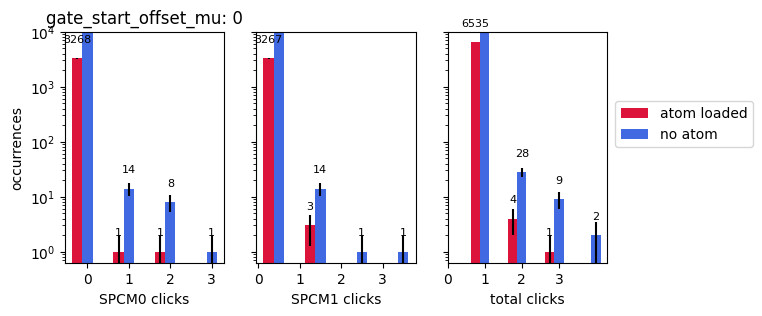

473

In [172]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()

thresh

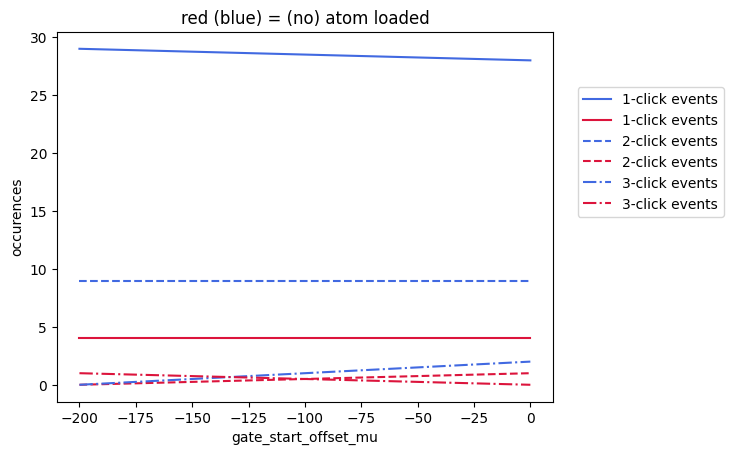

atom loading fraction: 0.10


Text(0.5, 0, 'gate_start_offset_mu')

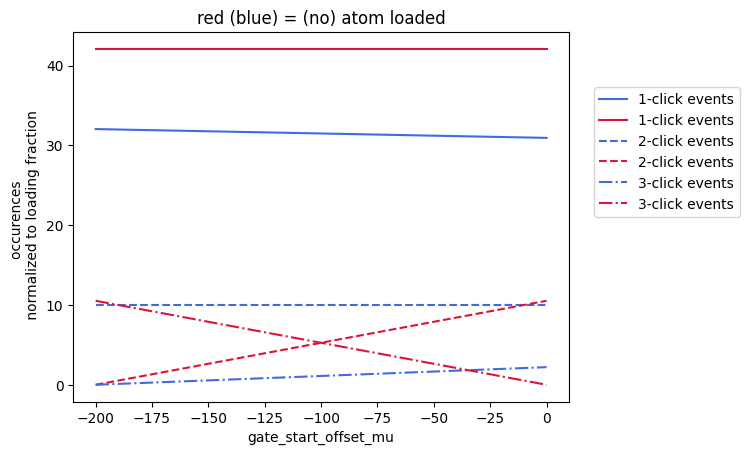

In [173]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## # of Excitation Cycle Scan

experiment: single_photon_experiment
override: {'dummy_variable':4, 'set_point_excitation':0.085, 't_recooling':5*ms}
experiment: single_photon_experiment
override: {'dummy_variable':4, 'set_point_excitation':0.085, 't_recooling':0*ms}


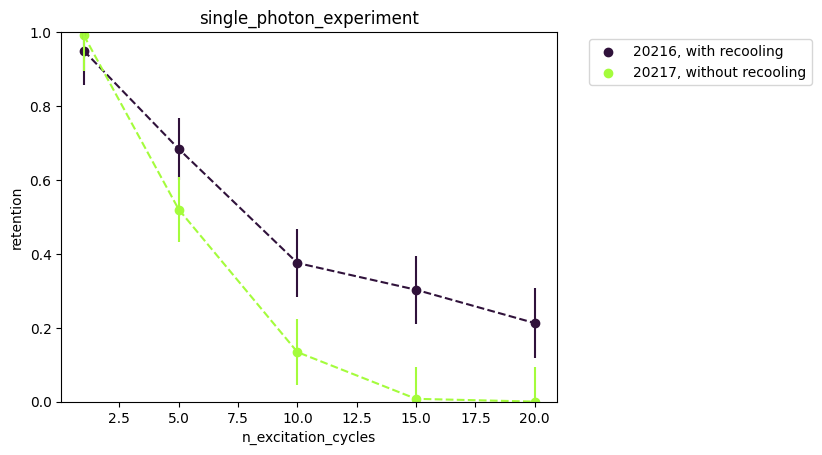

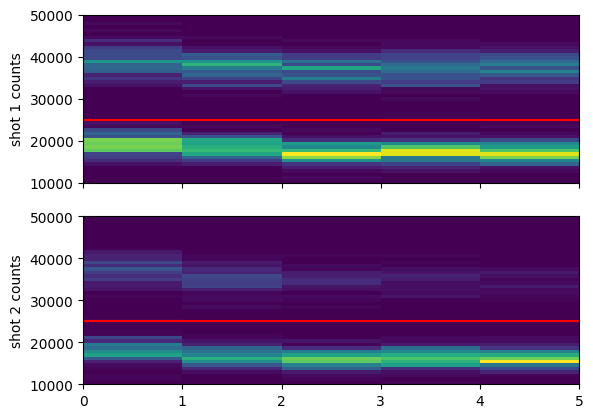

10

In [115]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don't try this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 25000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    6: 'with recooling', # setpoint scan
    7: 'without recooling' # setpoint scan
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT
n_excitation_cycles

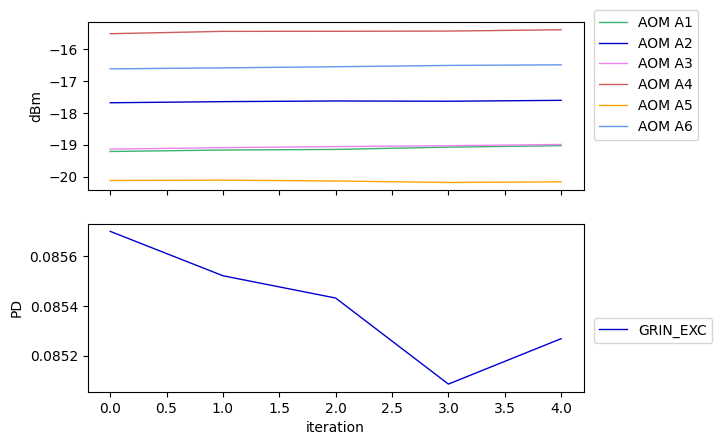

In [98]:
"""AOM RF powers by iteration - averaged over measurements in each iteration"""

fig,axes = plt.subplots(nrows=2,sharex=True)

aom_colors = ['mediumseagreen','mediumblue','violet','indianred','orange','cornflowerblue', 'plum', 'tomato', 'chartreuse']

plot_num = 0

# AOM_RF_POWER: 6
for i in range(6): # this time include the free space beams too
    RF_history = locals()[f'p_AOM_A{i+1}_history']
    RF_mean_by_iteration = average_over_measurement(n_measurements, RF_history)

    axes[plot_num].plot(RF_mean_by_iteration[:], color=aom_colors[i], label=f'AOM A{i+1}', lw=1) # dBm
    axes[plot_num].set_ylabel("dBm")
    
plot_num += 1

# GRIN : 1
FORT_sci_history = locals()['GRIN1_EXC_monitor']
FORT_sci_mean_by_iteration = average_over_measurement(n_measurements, FORT_sci_history)/t_SPCM_first_shot
axes[plot_num].plot(FORT_sci_mean_by_iteration[:], color=aom_colors[plot_num], label='GRIN_EXC', lw=1)
axes[plot_num].set_ylabel("normali")
plot_num += 1

axes[-1].set_xlabel("iteration")

for i,axis in enumerate(axes):
    axis.legend(loc=(1.02, 0.3-i*0.01))

plt.show()

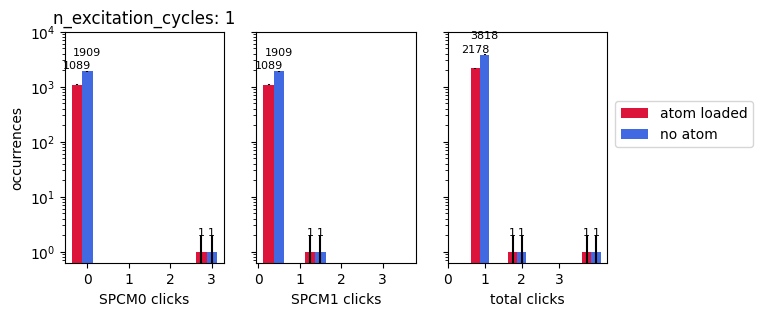

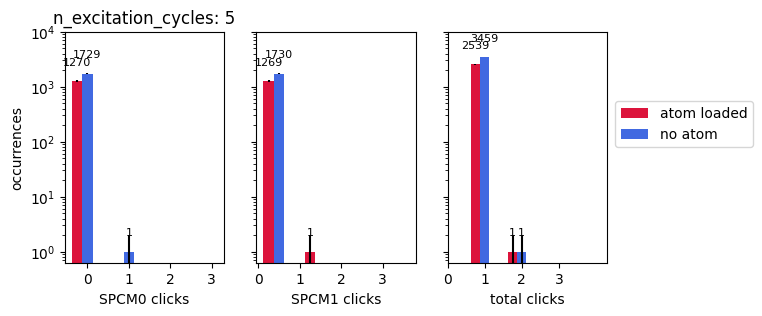

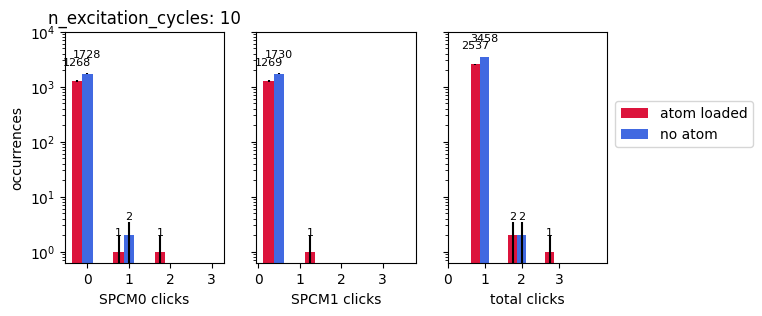

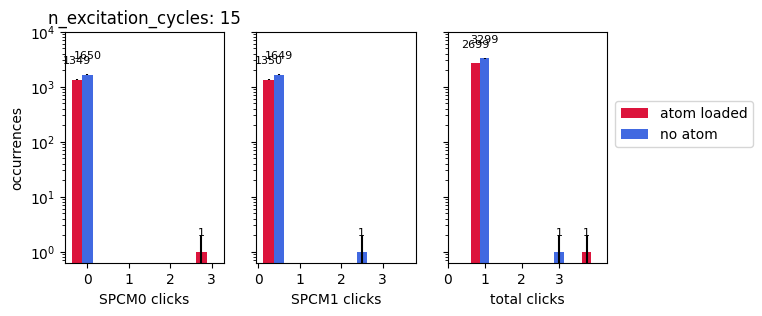

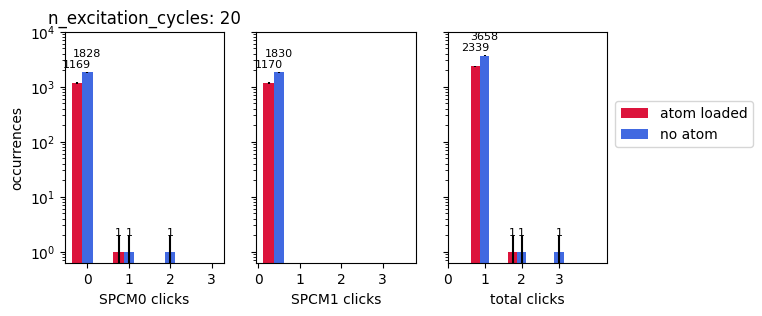

In [116]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()

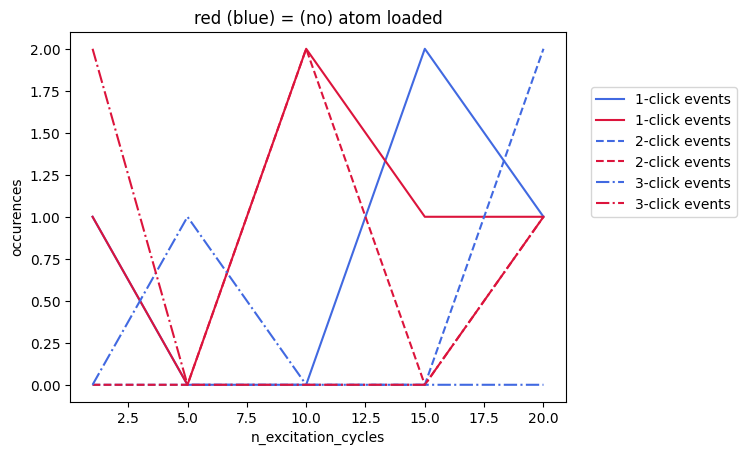

atom loading fraction: 0.41


Text(0.5, 0, 'n_excitation_cycles')

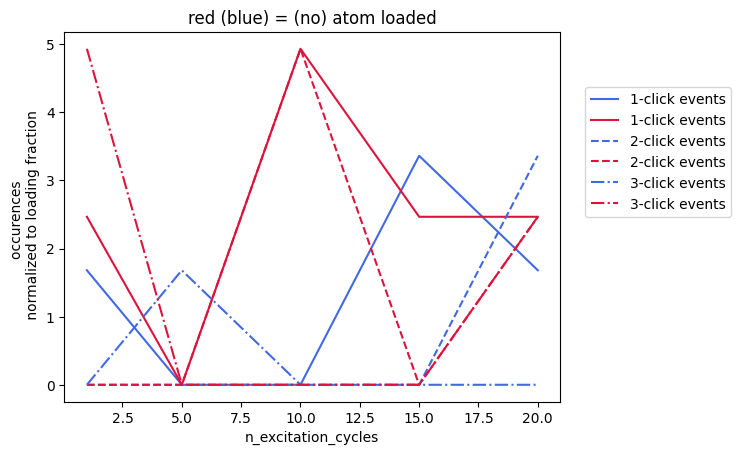

In [100]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## Scan over gate_start

experiment: single_photon_experiment
override: {'dummy_variable':4, 'set_point_excitation':0.085, 't_recooling':5*ms}


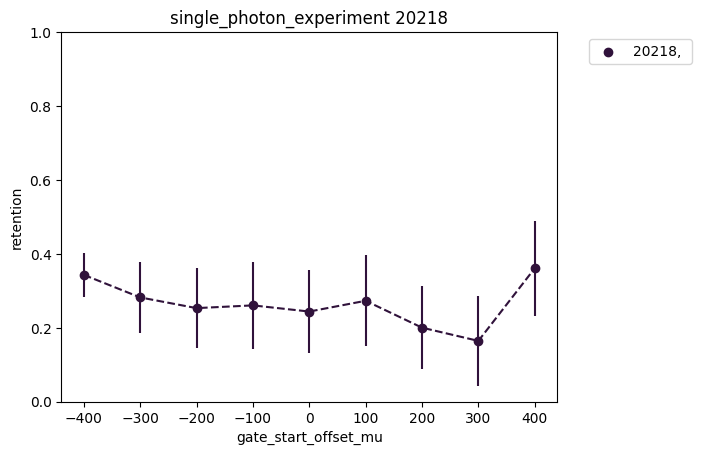

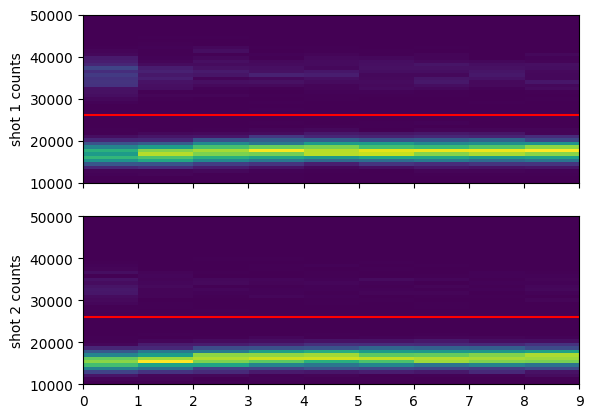

10

In [138]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 26000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 4: '',
    8: '',
    # 10: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT
n_excitation_cycles

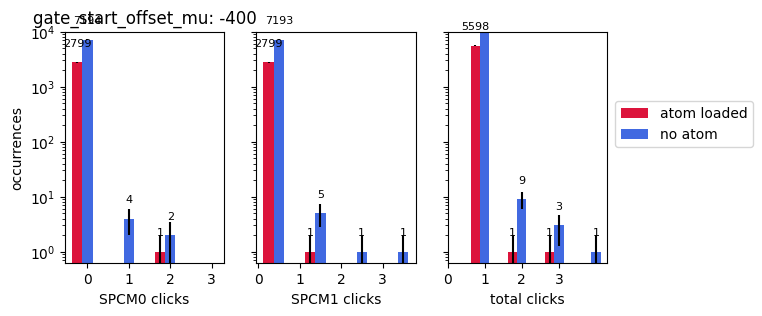

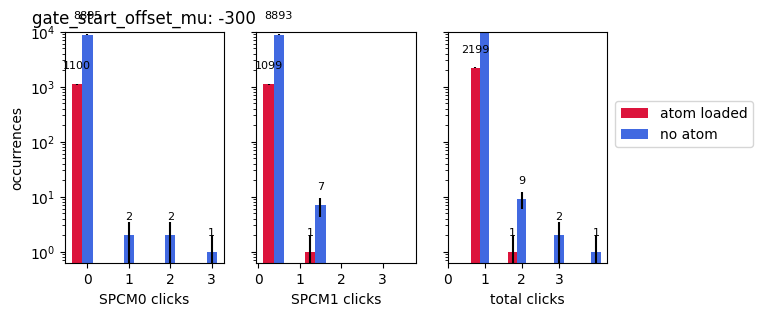

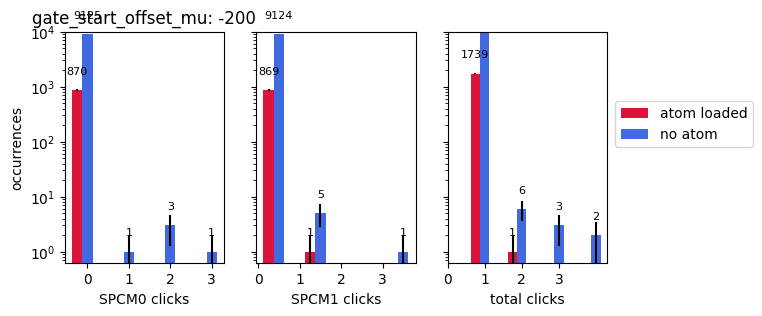

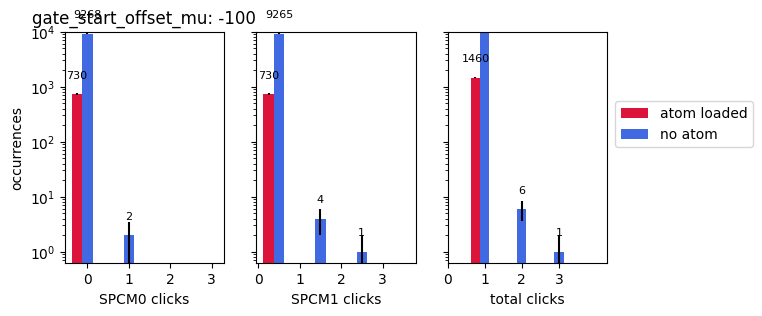

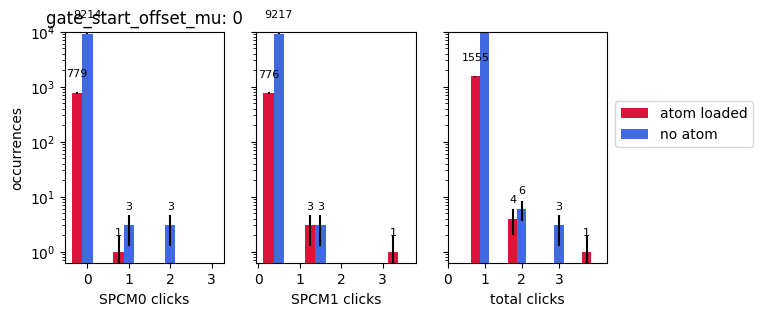

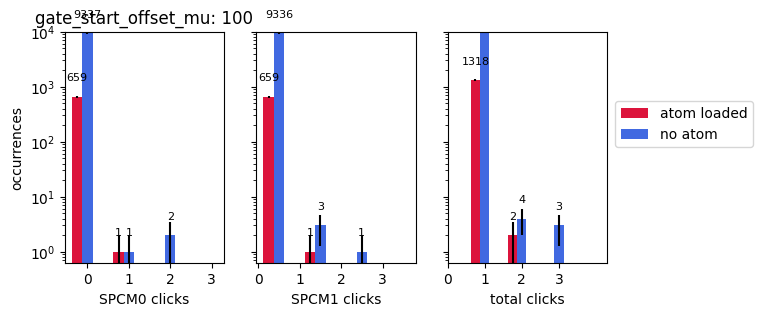

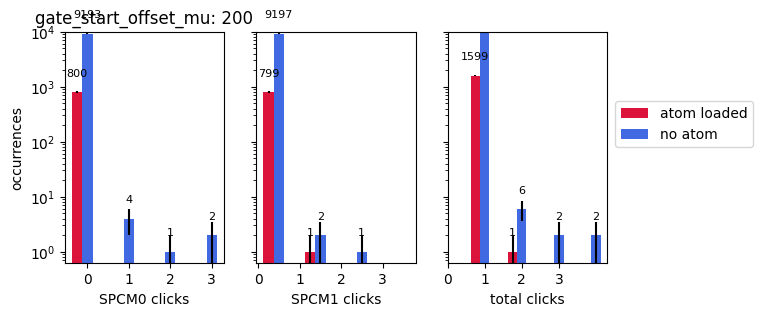

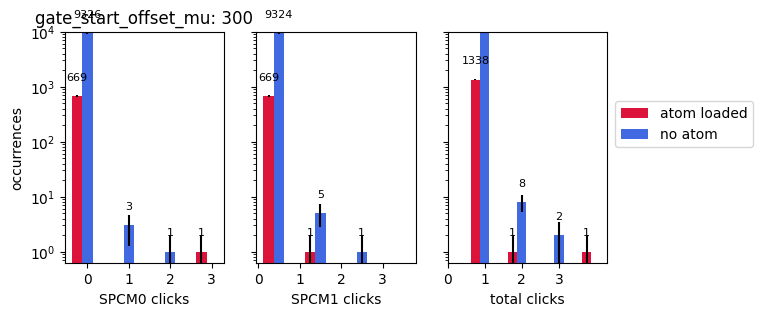

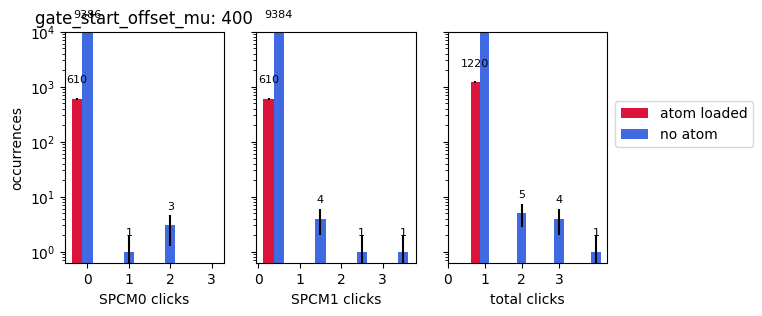

In [139]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()

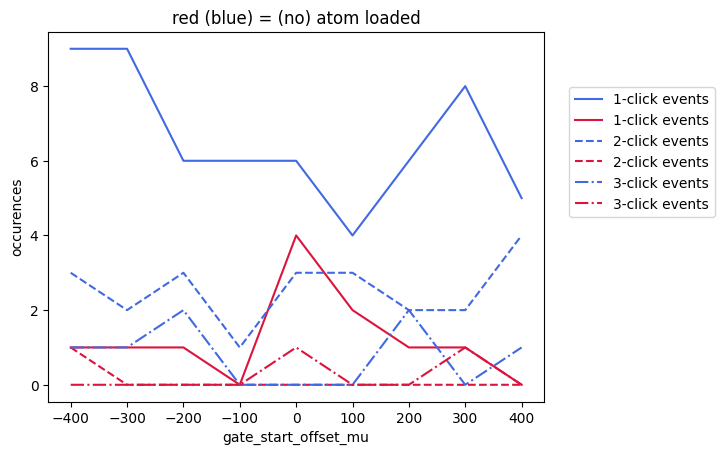

atom loading fraction: 0.10


Text(0.5, 0, 'gate_start_offset_mu')

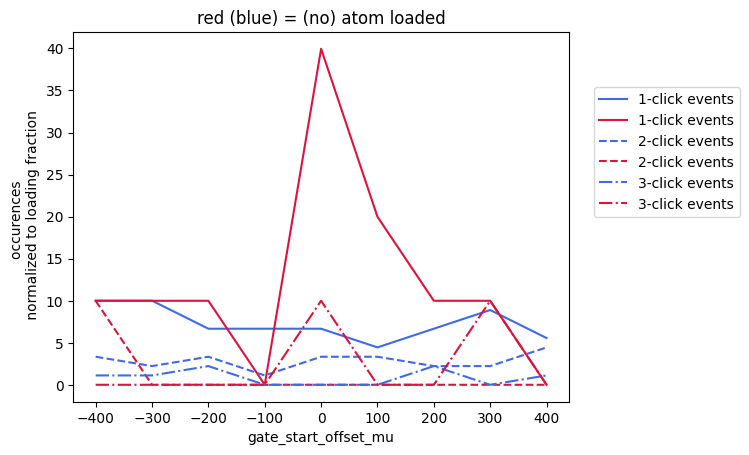

In [140]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## Single photon Scan

experiment: single_photon_experiment
override: {'dummy_variable':4, 'gate_start_offset_mu':-200, 'set_point_excitation':0.1}


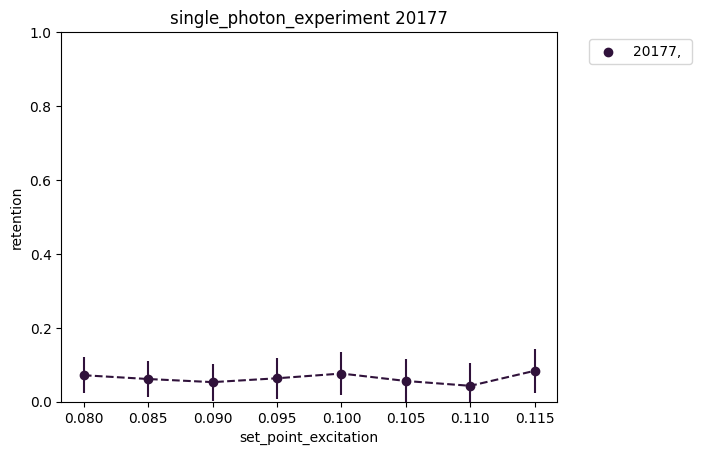

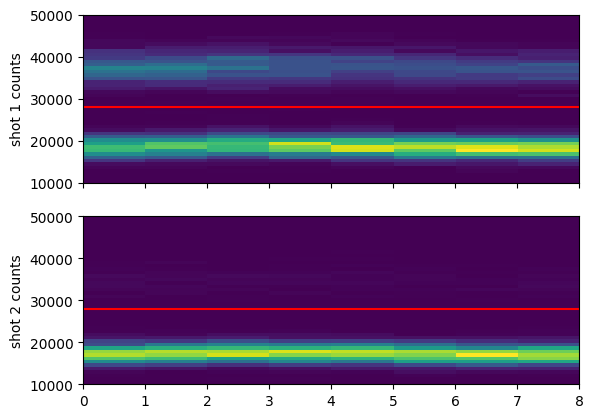

-200

In [48]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 28000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    0: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT
n_excitation_cycles
gate_start_offset_mu

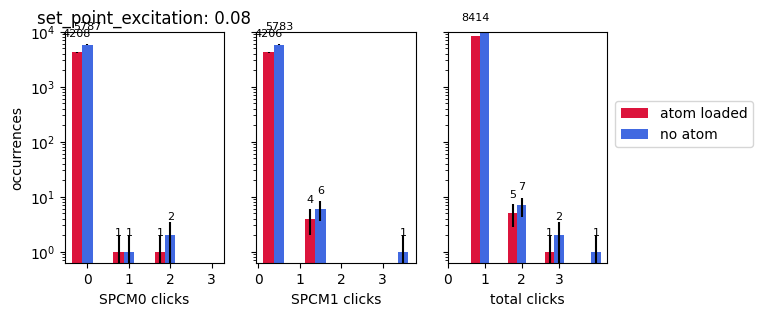

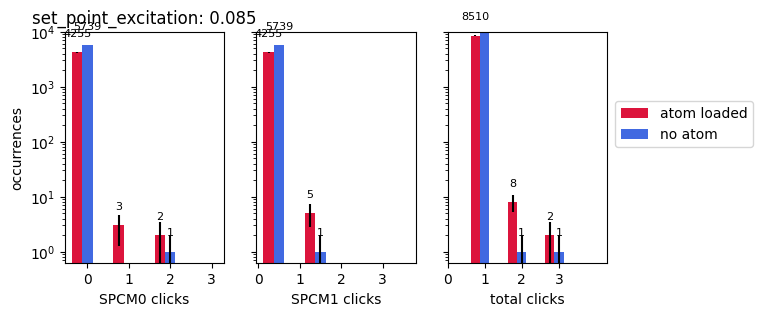

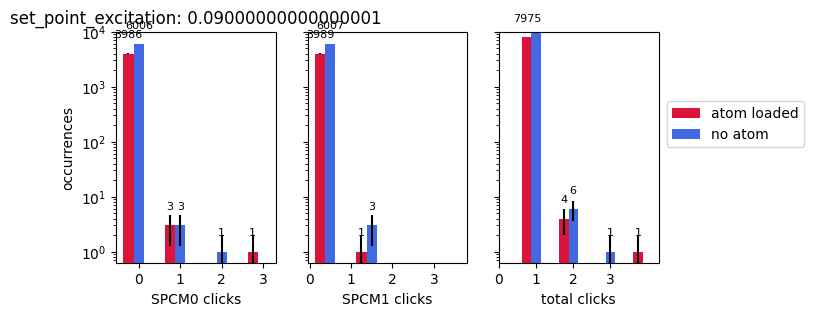

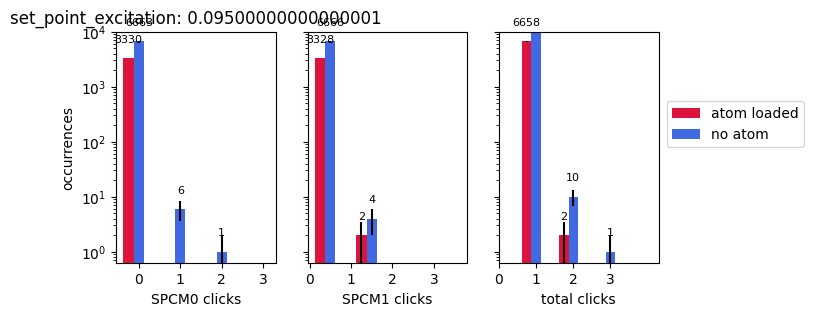

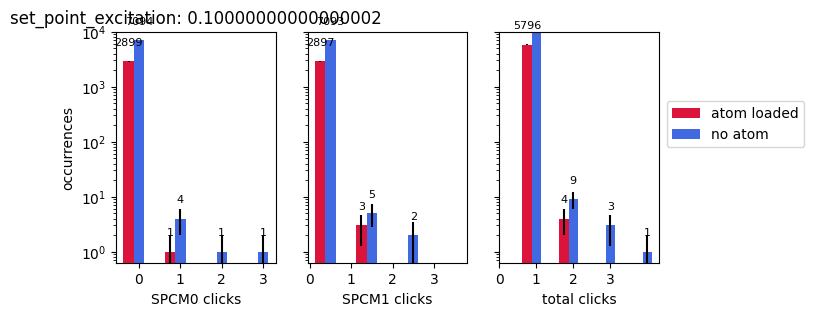

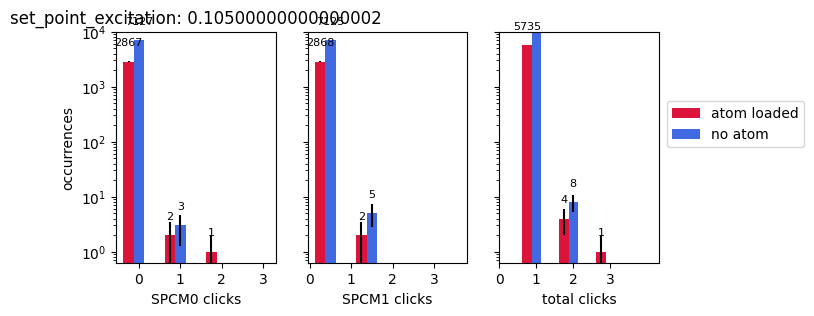

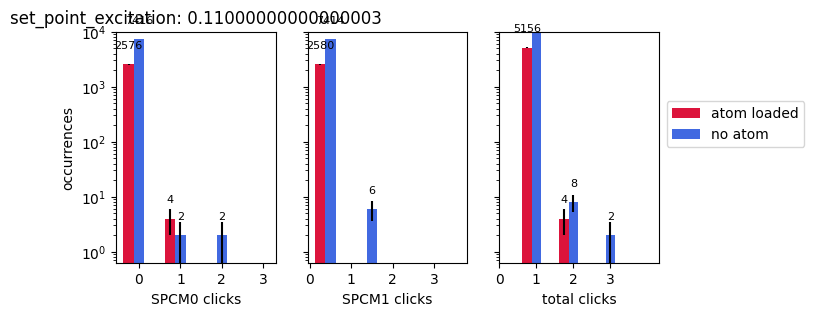

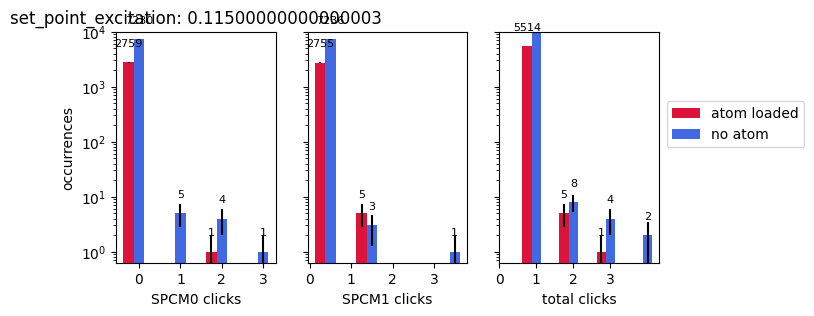

In [49]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()

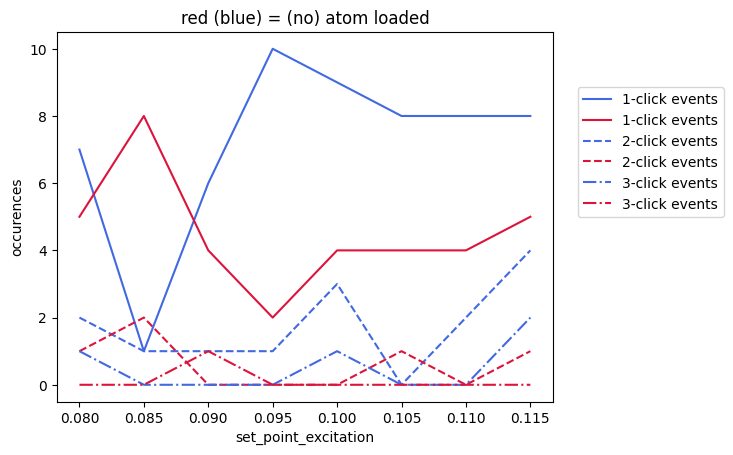

atom loading fraction: 0.34


Text(0.5, 0, 'set_point_excitation')

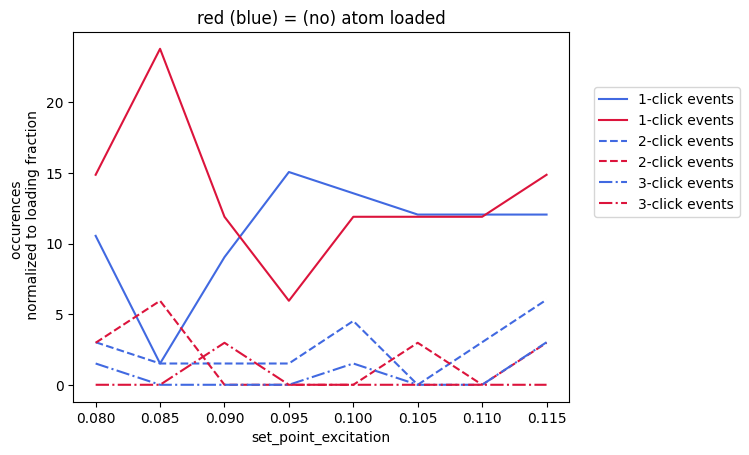

In [50]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

thresh = threshold_otsu(photocounts)


linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## Single photon Scan

experiment: single_photon_experiment
override: {'dummy_variable':4, 'gate_start_offset_mu':-200, 'set_point_excitation':0.1}


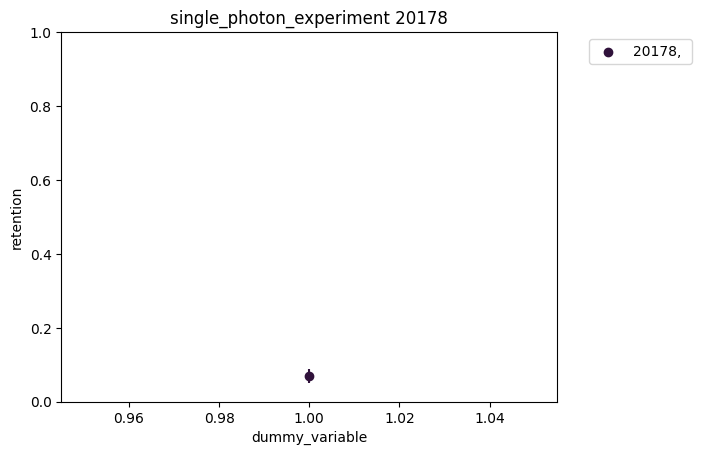

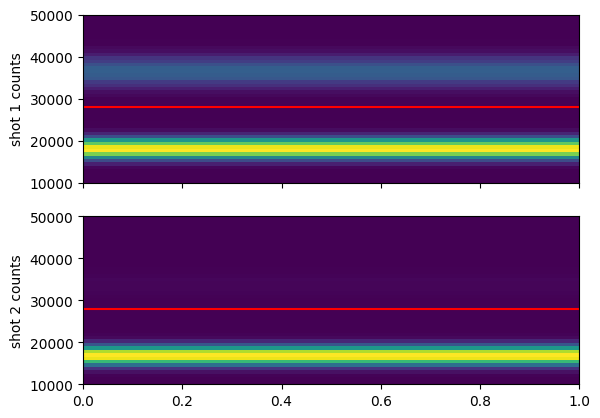

-200

In [46]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = True # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 28000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    1: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT
n_excitation_cycles
gate_start_offset_mu

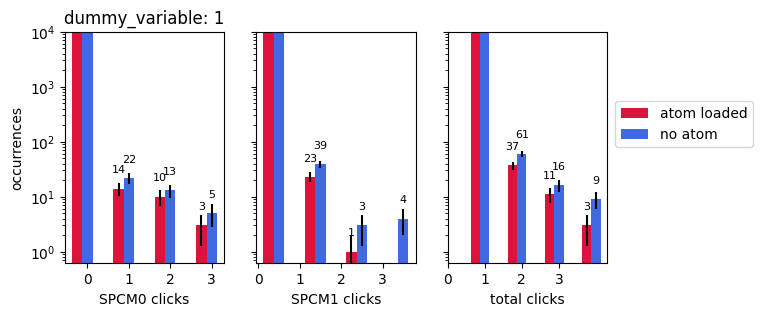

In [47]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()

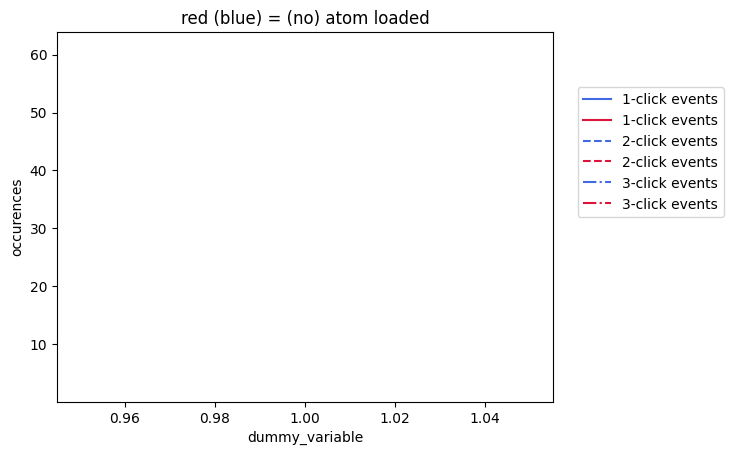

atom loading fraction: 0.31


Text(0.5, 0, 'dummy_variable')

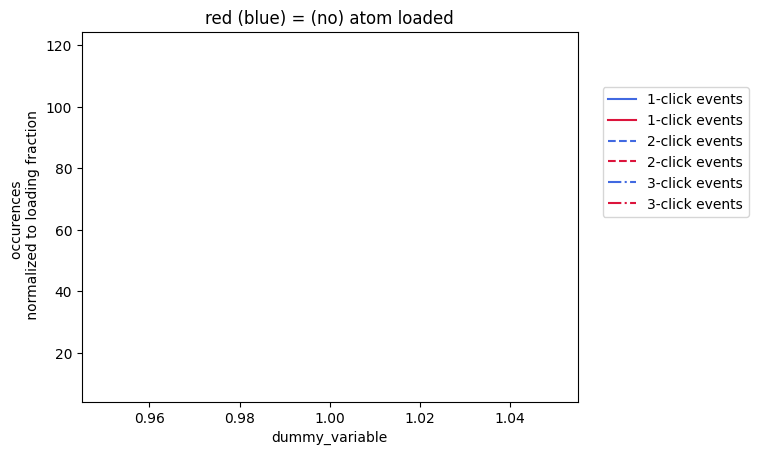

In [44]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

thresh = threshold_otsu(photocounts)


linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

## Recooling Scan

experiment: single_photon_experiment
override: {'dummy_variable':4, 'gate_start_offset_mu':-200, 'set_point_excitation':0.1}


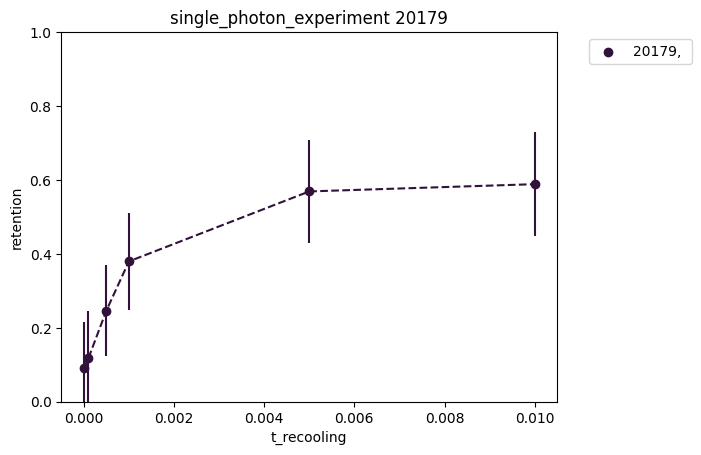

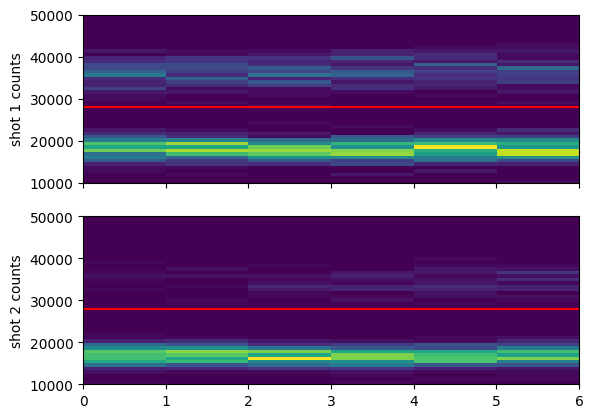

10

In [55]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 28000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    2: '' # setpoint scan
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT
n_excitation_cycles

In [57]:
# recooling
print(retention)
print(scan_sequence1)
print(n_measurements)
print(loading)

[0.09090909 0.11666667 0.24615385 0.37931034 0.56862745 0.58823529]
[0.e+00 1.e-04 5.e-04 1.e-03 5.e-03 1.e-02]
200
[0.33  0.3   0.325 0.29  0.255 0.255]


## # of Excitation Cycle Scan

experiment: single_photon_experiment
override: {'dummy_variable':4, 'gate_start_offset_mu':-200, 'set_point_excitation':0.1}


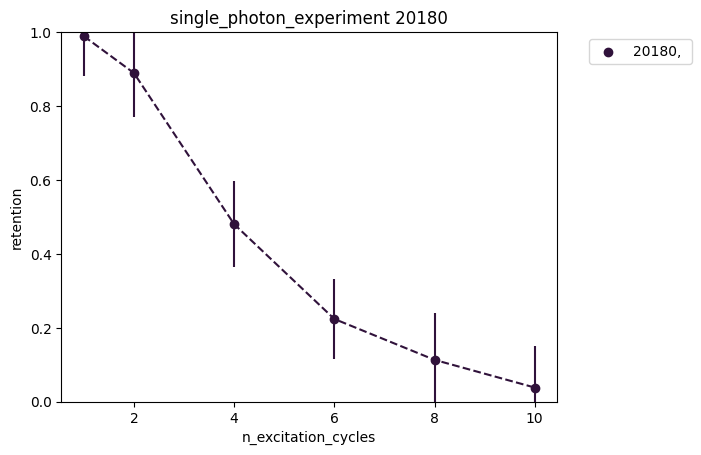

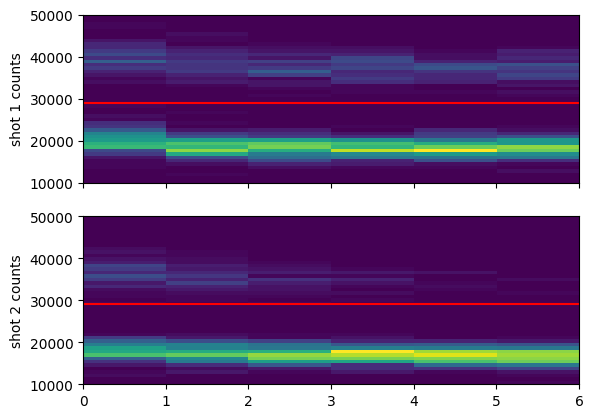

10

In [59]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 29000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    3: '' # setpoint scan
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT
n_excitation_cycles

In [60]:
# excitation cycles
print(retention)
print(scan_sequence1)
print(n_measurements)
print(loading)

[0.98863636 0.88888889 0.48       0.22352941 0.11290323 0.03797468]
[ 1  2  4  6  8 10]
300
[0.29333333 0.24       0.25       0.28333333 0.20666667 0.26333333]


## 2024.12.08

In [23]:
fnames = get_files_by_criteria(date_filters=["2024-12-07"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 9 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-07\12\000020116-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-07\13\000020118-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-07\13\000020124-GeneralVariableScan_single_photon_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-07\20\000020129-GeneralVariableScan_single_photon_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-07\20\000020135-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 5 (C:\Networking Experiment\artiq codes\

experiment: single_photon_experiment
override: {'dummy_variable':4}


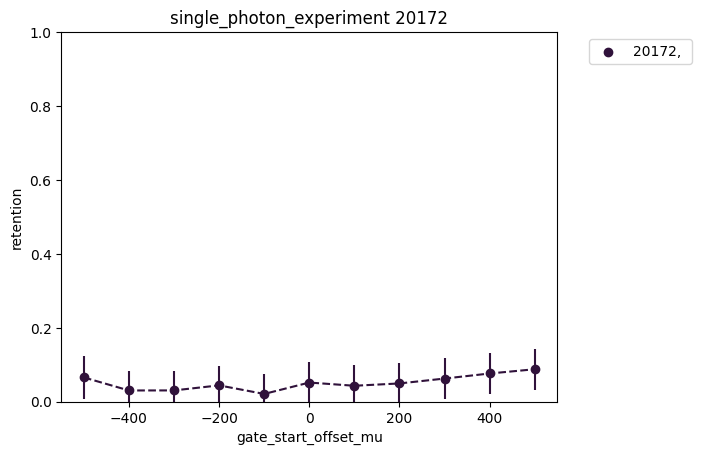

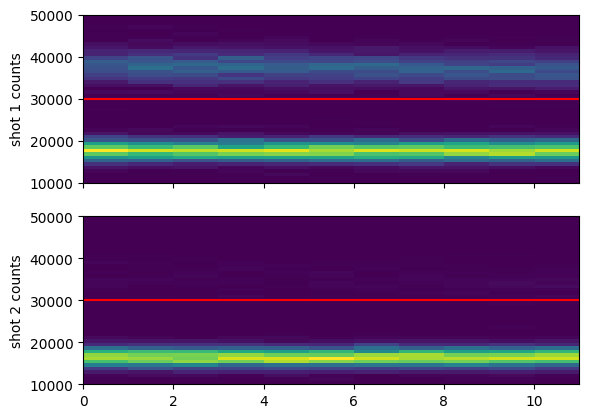

10

In [6]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 7: '', # setpoint scan
    8: '' # gate start scan
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT
n_excitation_cycles

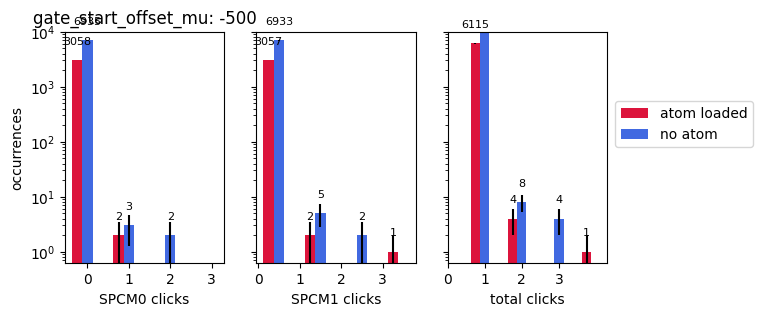

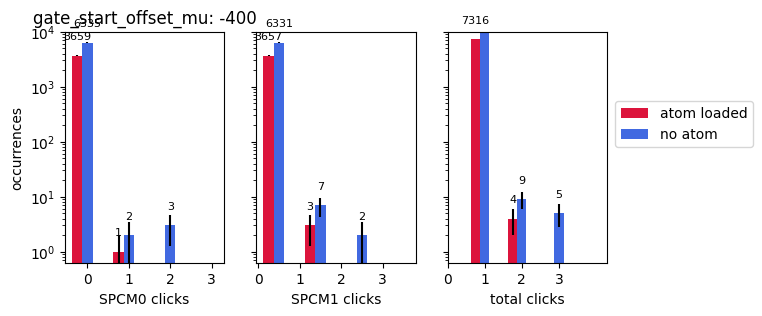

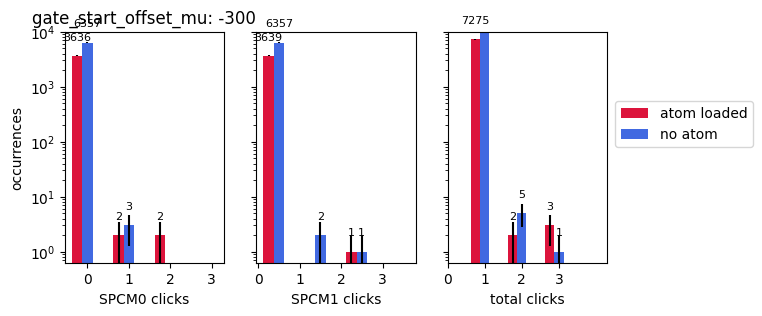

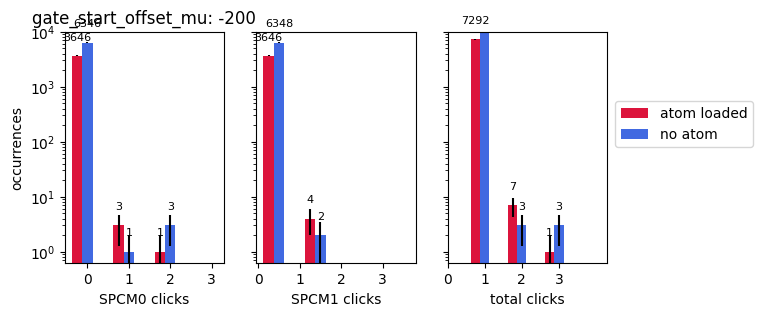

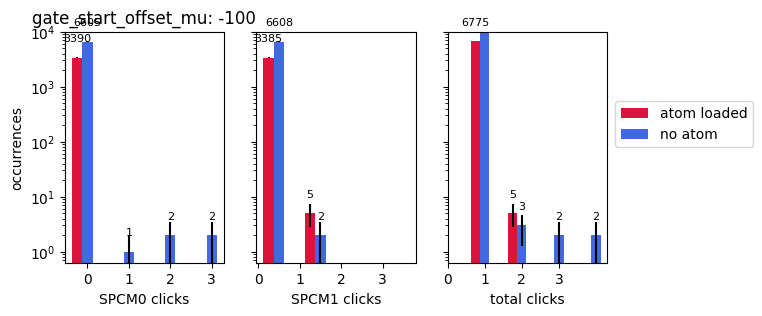

...

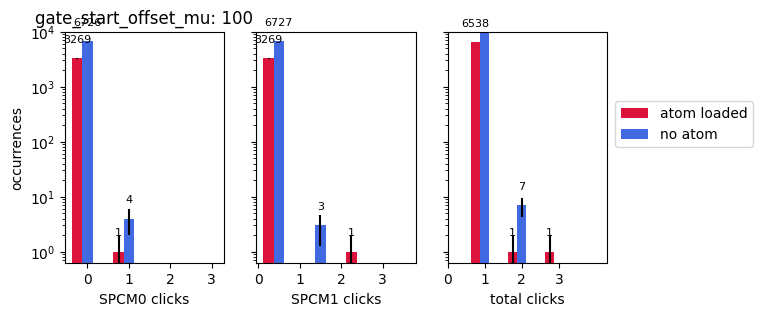

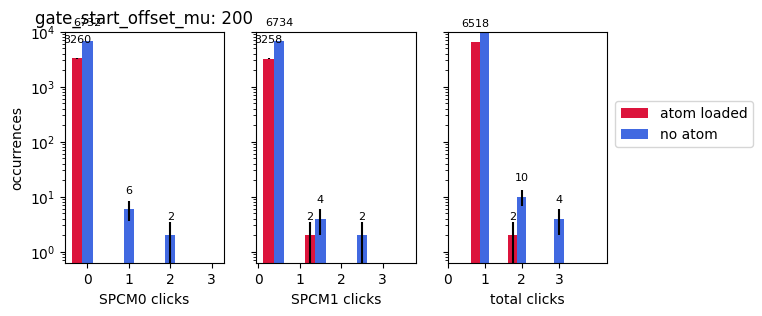

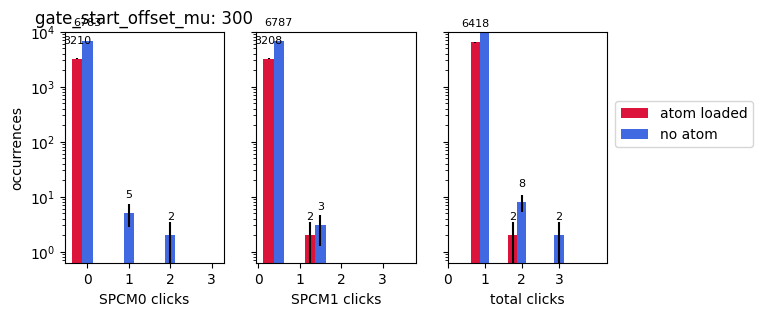

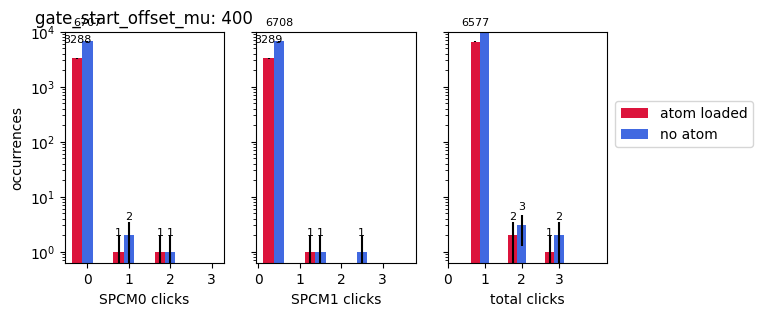

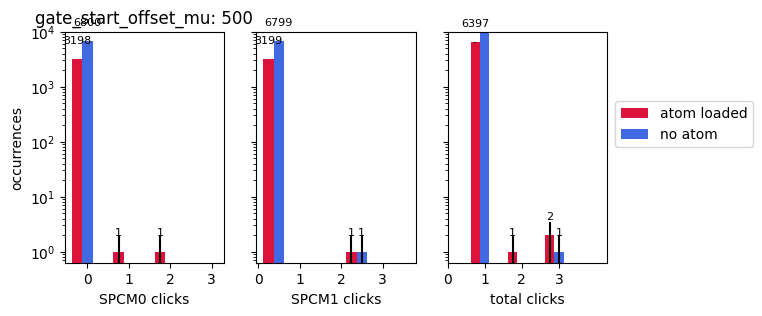

In [75]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()

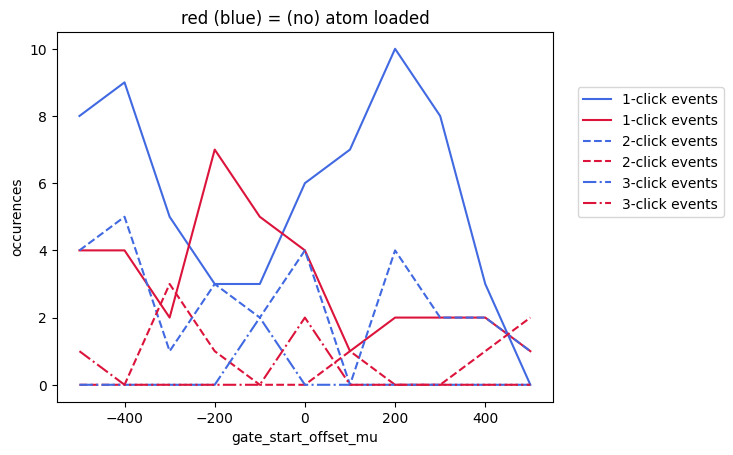

atom loading fraction: 0.34


Text(0.5, 0, 'gate_start_offset_mu')

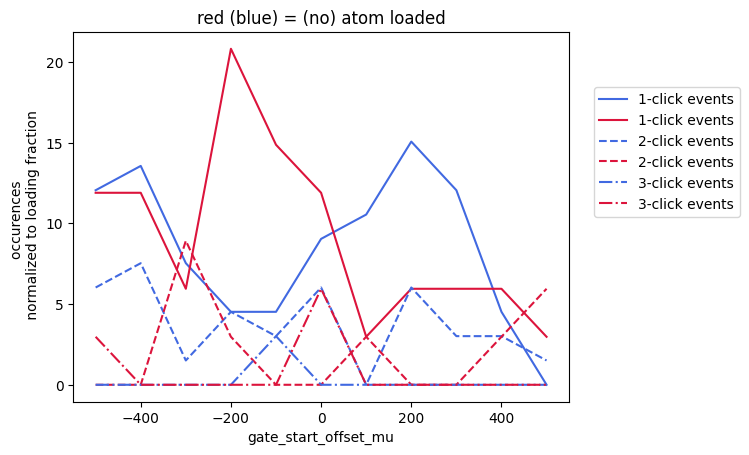

In [76]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

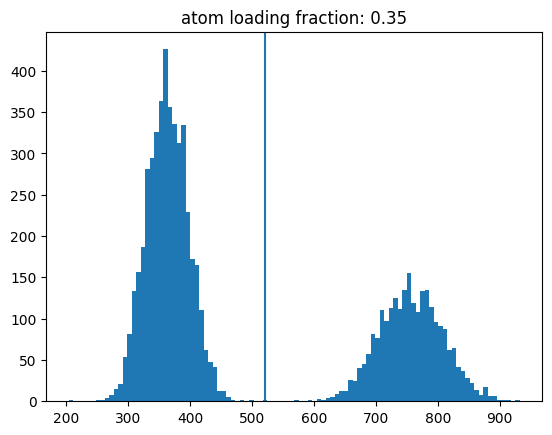

In [73]:
plt.hist(photocounts,bins=100)
thresh = threshold_otsu(photocounts)
plt.axvline(thresh)
plt.title(f"atom loading fraction: {loading:.2f}")
plt.show()

## 2024.12.06

In [59]:
fnames = get_files_by_criteria(date_filters=["2024-12-06"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 10 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\11\000020090-GeneralVariableScan_single_photon_scan_over_n_excitation_cycles.h5) scanned over n_excitation_cycles
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\11\000020094-GeneralVariableScan_single_photon_scan_over_t_recooling.h5) scanned over t_recooling
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\13\000020096-GeneralVariableScan_single_photon_scan_over_n_excitation_cycles.h5) scanned over n_excitation_cycles
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\14\000020099-GeneralVariableScan_single_photon_scan_over_t_recooling.h5) scanned over t_recooling
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\14\000020100-GeneralVariableScan_single_photon_scan_over_t_recooling.h5) scanned over t_recooling
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\1

### scan of excitation power (set point)

In [51]:
i = 2

f = h5py.File(os.path.join(resultcs, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 35000*t_SPCM_first_shot

experiment: single_photon_experiment
Pumping light off? False


In [5]:
fnames = get_files_by_criteria(date_filters=["2024-12-06"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 10 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\11\000020090-GeneralVariableScan_single_photon_scan_over_n_excitation_cycles.h5) scanned over n_excitation_cycles
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\11\000020094-GeneralVariableScan_single_photon_scan_over_t_recooling.h5) scanned over t_recooling
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\13\000020096-GeneralVariableScan_single_photon_scan_over_n_excitation_cycles.h5) scanned over n_excitation_cycles
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\14\000020099-GeneralVariableScan_single_photon_scan_over_t_recooling.h5) scanned over t_recooling
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\14\000020100-GeneralVariableScan_single_photon_scan_over_t_recooling.h5) scanned over t_recooling
file 5 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-06\1

### scan over start of SPCM gate in the excitation phase

experiment: single_photon_experiment
override: {'dummy_variable':4}


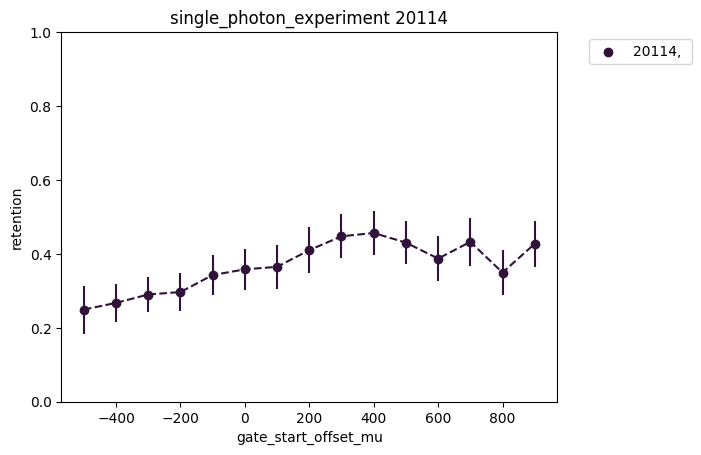

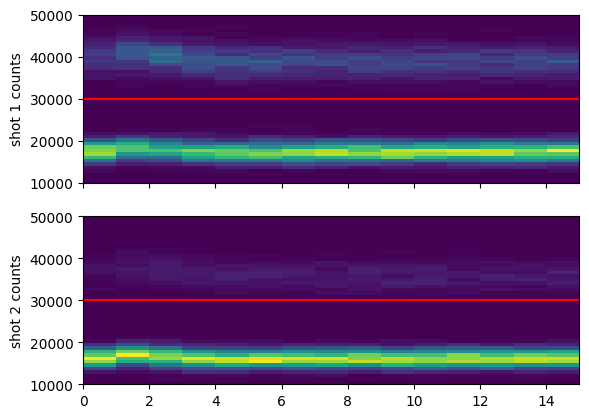

NameError: name 'average_over_measurement' is not defined

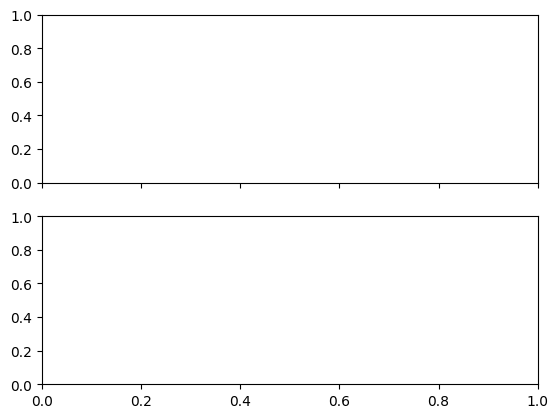

In [60]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = True

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    9: '',
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()


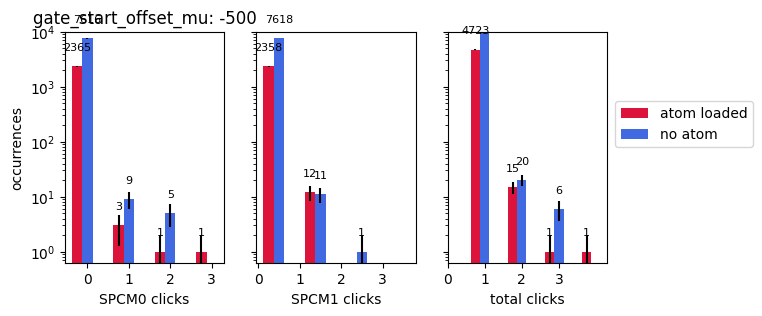

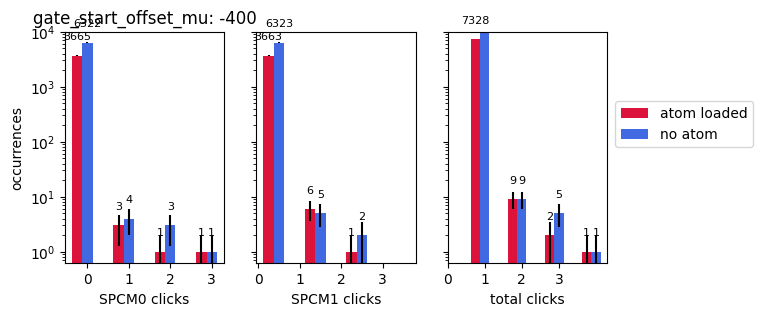

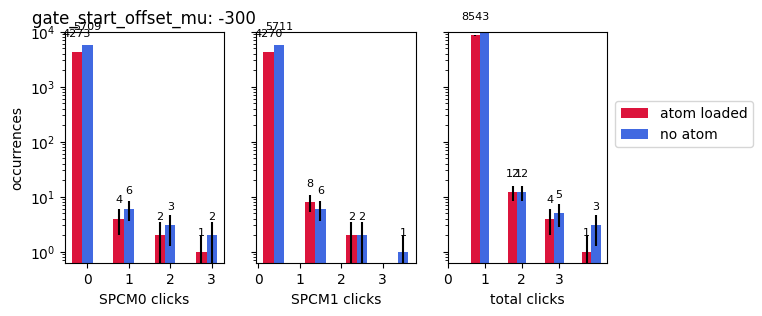

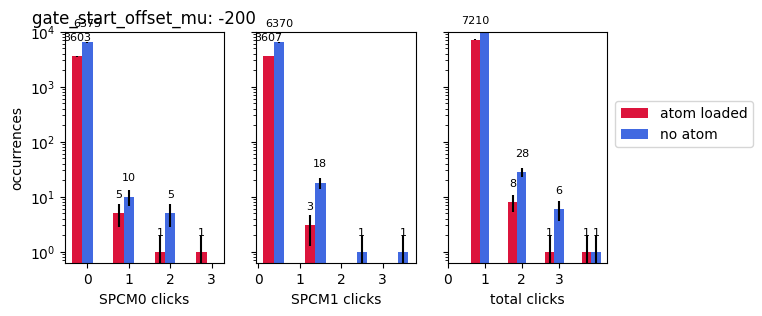

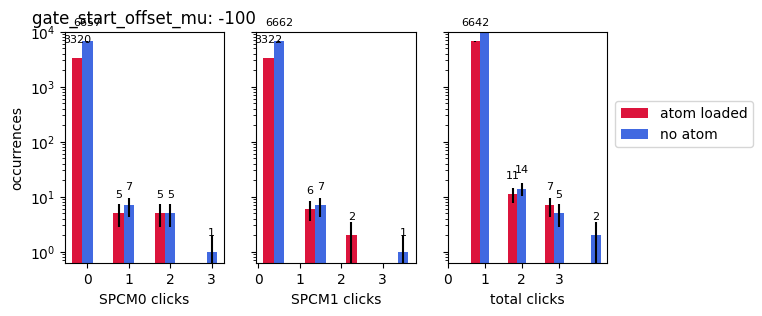

...

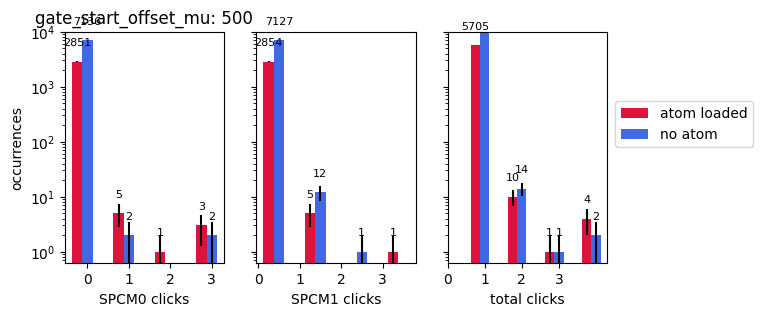

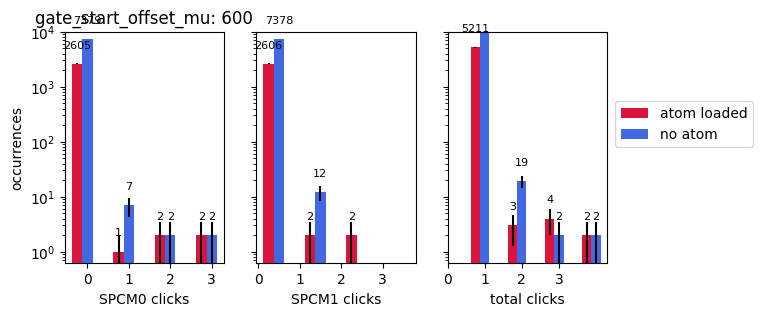

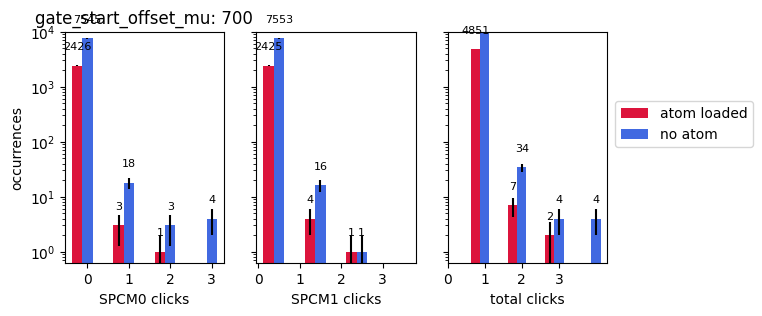

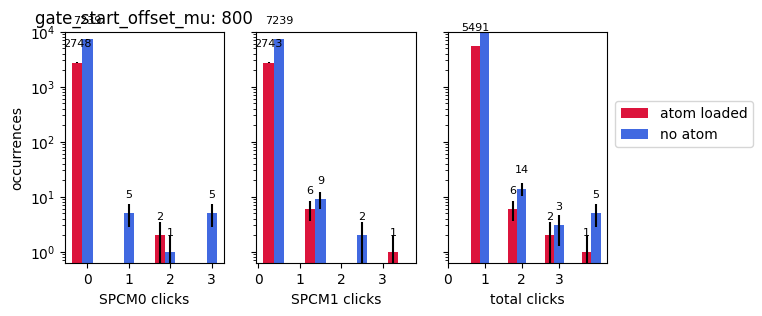

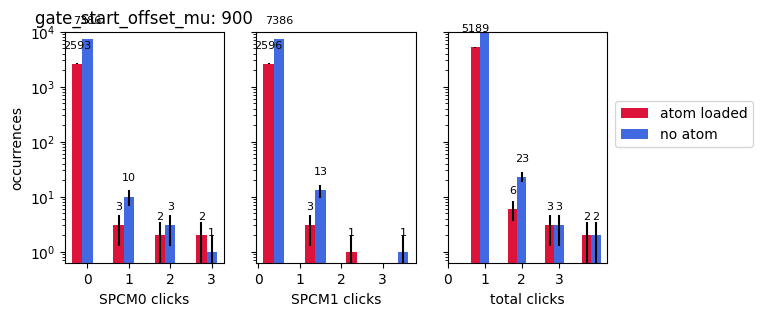

In [24]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"{scan_variable1_name}: {val}" for val in scan_sequence1]
use_titles = True

binned_data_with_atom = []
binned_data_no_atom = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][n_measurements*n_excitation_cycles*i:(n_measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*n_measurements:(i+1)*n_measurements] # only from SPCM 0

    # SPCM 0
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    # SPCM 1
    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.

    # data from both SPCMs combined
    total_mean_photons_per_cycle_with_atom = np.concatenate((mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom))
    total_mean_photons_per_cycle_no_atom = np.concatenate((mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom))
    
    fig,axes = plt.subplots(ncols=3,figsize=(7,3),sharey=True)

    # iterate over the data from the two SPCMs so we can fill in a subplot for each one
    data_idx = 0
    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom, total_mean_photons_per_cycle_with_atom],
                                           [mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom, total_mean_photons_per_cycle_no_atom]):
        atom = 1
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

            # append the data for both SPCMs with/out an atom
            if data_idx==2:
                if atom: 
                    binned_data_with_atom.append(binned_data)
                if not atom: 
                    binned_data_no_atom.append(binned_data)
            atom -= 1
        data_idx += 1
            
    axes[0].set_ylabel('occurrences')

    for ax_n, ax in enumerate(axes):
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{ax_n} clicks')
    axes[2].set_xlabel('total clicks')
    axes[-1].legend(loc=(1.05,0.5))

    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

        
        
    # ax.legend(loc='upper left', ncols=3)

    # fig.tight_layout()
    plt.show()

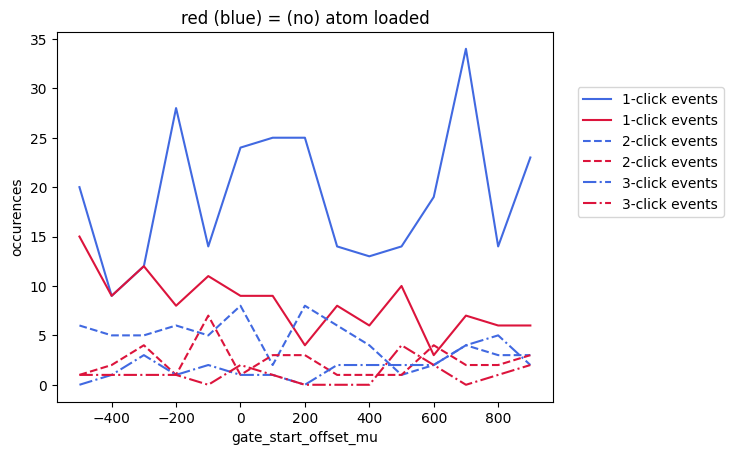

atom loading fraction: 0.30


Text(0.5, 0, 'gate_start_offset_mu')

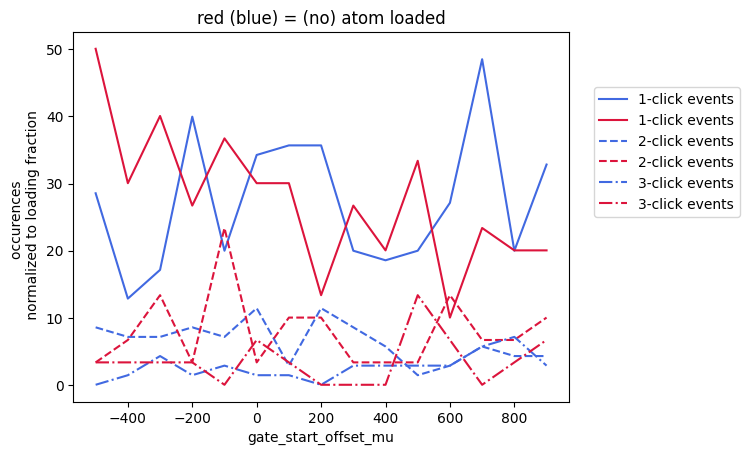

In [58]:
counts_data_no_atom = np.array(binned_data_no_atom).transpose()[1:]
counts_data_with_atom = np.array(binned_data_with_atom).transpose()[1:]

linestyles = ['-','--','-.']
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i],label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences')
plt.xlabel(scan_variable1_name)
plt.show()

# plot taking into accout the loading rate
loading = sum([p > thresh for p in photocounts])/len(photocounts)
print(f"atom loading fraction: {loading:.2f}")
for i in range(max(bins)-1):
    plt.plot(scan_sequence1, counts_data_no_atom[i]/(1-loading),label=f'{i+1}-click events',ls=linestyles[i],color='royalblue')
    plt.plot(scan_sequence1, counts_data_with_atom[i]/loading,label=f'{i+1}-click events',ls=linestyles[i],color='crimson')
plt.legend(loc=(1.05,0.5))
plt.title('red (blue) = (no) atom loaded')
plt.ylabel('occurences \n normalized to loading fraction')
plt.xlabel(scan_variable1_name)

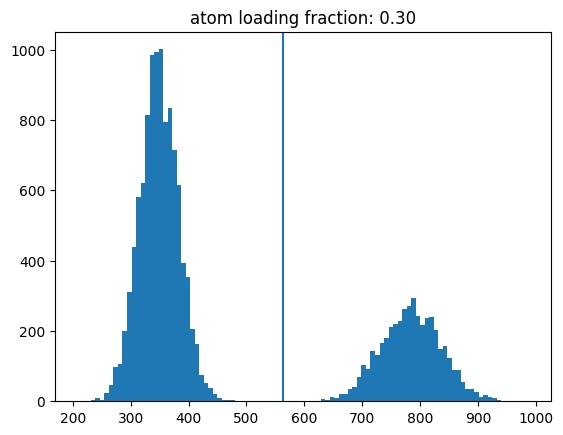

In [55]:
plt.hist(photocounts,bins=100)
thresh = threshold_otsu(photocounts)
plt.axvline(thresh)
plt.title(f"atom loading fraction: {loading:.2f}")
plt.show()

In [26]:
np.array(binned_data_no_atom).shape

(15, 4)

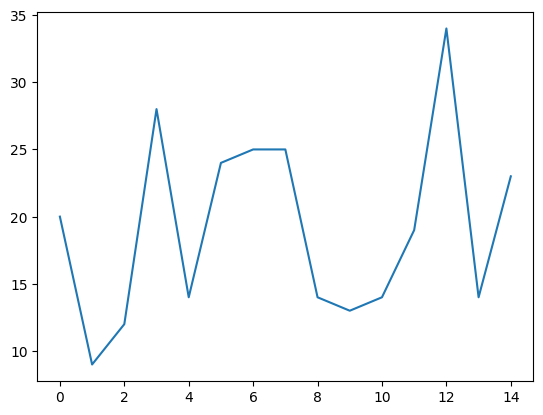

In [29]:
plt.plot(np.array(binned_data_no_atom).transpose()[1])

In [ ]:
[0., 100.*us, 500.*us, 1*ms, 3*ms, 5*ms, 10*ms]

In [63]:
n_excitation_attempts, n_excitation_cycles

(3, 10)

### scan over recooling time
Testing out a recooling phase, which is just turning on the cooling beams for a time t_recooling after each excitation attempt. if the beams are balanced and the B field is zero at the atoms (probably neither is true), we should get some improvement in the atom survival probability. Alas, we don't.

experiment: single_photon_experiment
override: {'dummy_variable':4}


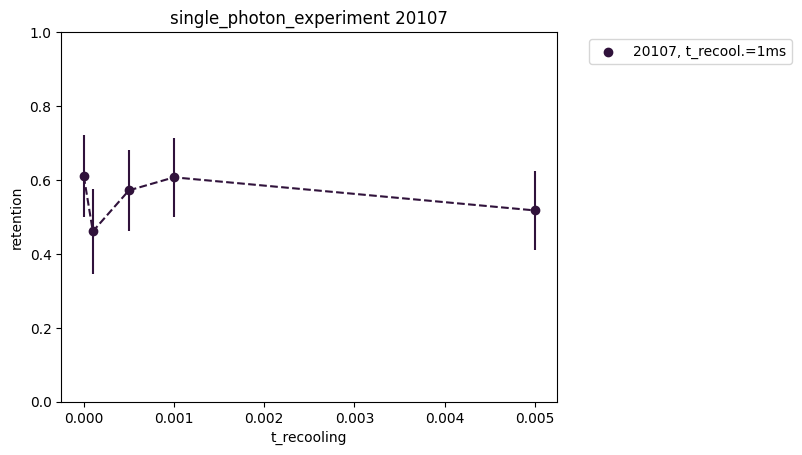

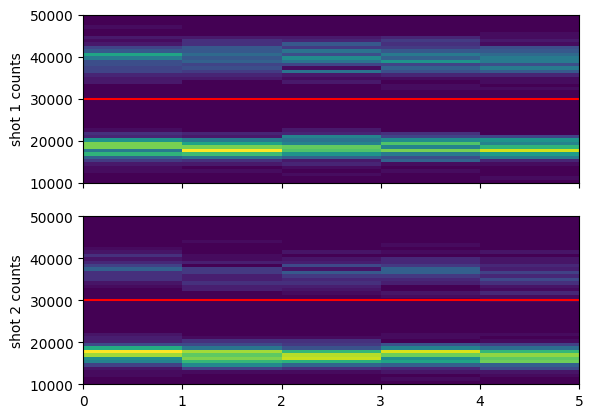

In [65]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    8: ''
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)

    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()


### scan over excitation cycle number to see how many times we can recycle the atom

experiment: single_photon_experiment
override: {'dummy_variable':4}


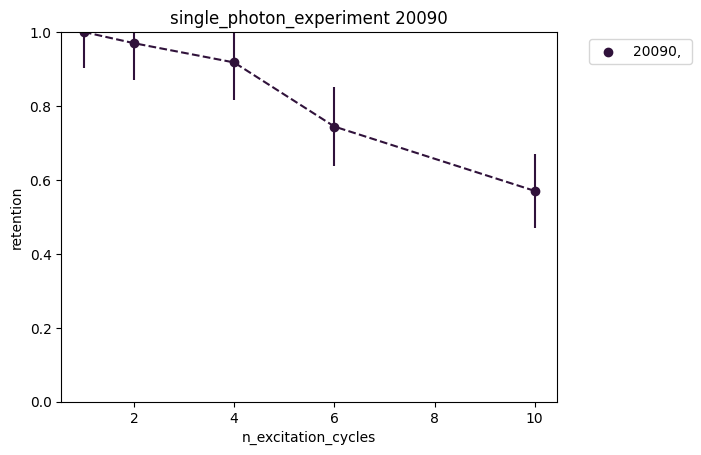

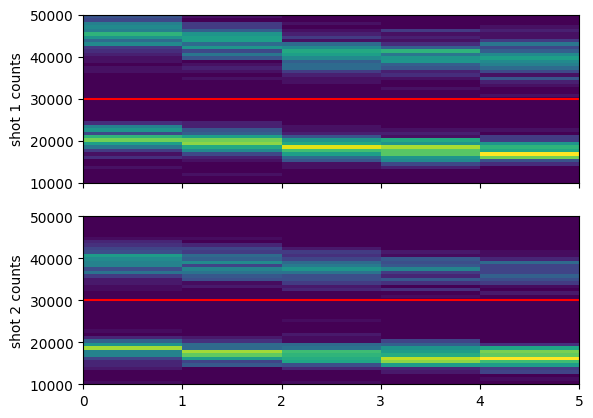

In [66]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    # 6: 'dummy variable scanned-- n_excitation_cycles=10',
    0: '',
    # 2: 't_recool.=1ms'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()


In [67]:
retention

array([1.        , 0.96969697, 0.91752577, 0.74418605, 0.57      ])

experiment: single_photon_experiment
override: {'dummy_variable':4}
experiment: single_photon_experiment
override: {'dummy_variable':4}
experiment: single_photon_experiment
override: {'dummy_variable':4}


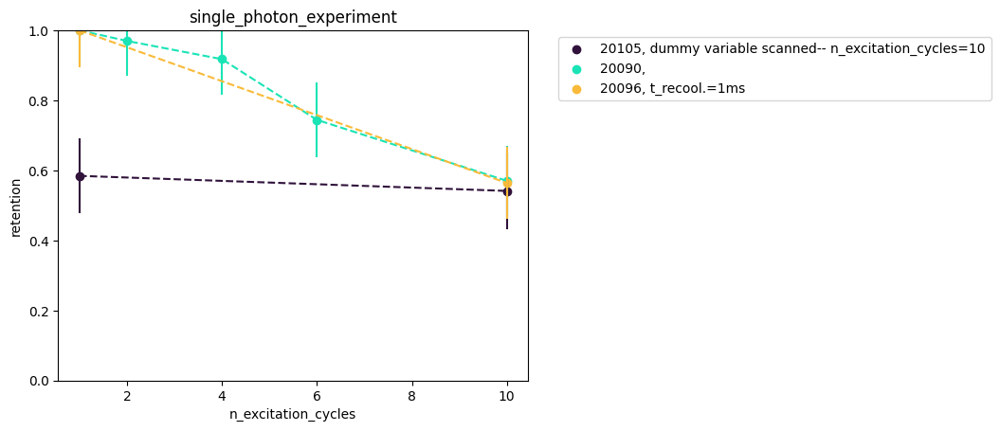

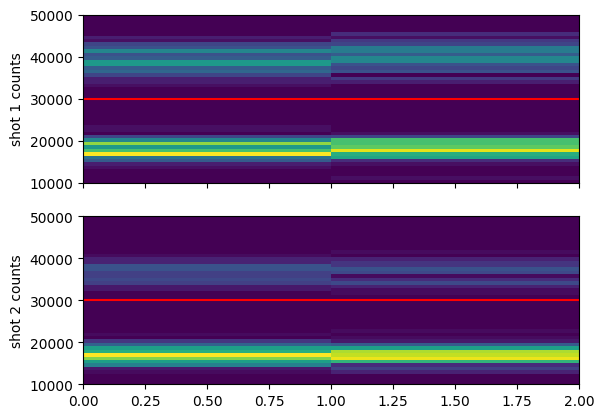

In [78]:
compare = True # compare multiple files in the same retention and loading plots
otsu_threshold = False # compute threshold using Otsu method instead doing it by eye. only work when require atom loading = False
showhist = True
showloading = False
custom_xlabel = True
merge_data = False # the datasets will be combined, and if fit=True, the new merged data will be fit. don'ttry this in 2D
fit = True

show_beam_power = False

cutoff1 = cutoff2 = 30000*0.02 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.
# cutoff1 = 600
# cutoff2 = 640 # threshold in units counts. remember, we don't measure a count rate. ignored if otsu_threshold.

file_indices = {
    6: 'dummy variable scanned-- n_excitation_cycles=10',
    0: '',
    2: 't_recool.=1ms'
} # the files to plot

legend_vars =[]
# legend_vars = ['AY_volts_OP', 'f_microwaves_dds'] # will be included in the plot legend

xform_and_label = {}

loc='best'

fit_dict = {}

if compare:
    if showloading:
        fig_ret,axes = plt.subplots(nrows=2, sharex=True)
        ax_ret, ax_ldng = axes
    else:
        fig_ret,ax_ret = plt.subplots()
ret_cmap = mpl.colormaps['turbo']
ldng_cmap = mpl.colormaps['winter']

first_shot_hists = []
second_shot_hists = []
mean1_by_iteration = []
mean2_by_iteration = []

merged_retention = np.empty([0])
merged_scan_sequence1 = np.empty([0])
merged_errs = np.empty([0])
rid_str = ''

for idx,f_item in enumerate(file_indices.items()):
    f_idx,f_comment = f_item
    f = h5py.File(os.path.join(results, fnames[f_idx]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    print("override:",override_ExperimentVariables)


    iterations = len(scan_sequence1) #int(len(photocounts)/n_measurements)

    xsteps_xform,xlabel = (xform_and_label[scan_variable1_name]['xsteps_xform'],xform_and_label[scan_variable1_name]['xlabel']) if scan_variable1_name in xform_and_label and custom_xlabel else (lambda x: x, scan_variable1_name)
    
    legend_string = ''
    for a in legend_vars:
        legend_string += f'{a}={locals()[a]}, '
    legend_string = legend_string[:-2]
    f_comment += legend_string

    retention_array, loading_rate_array, n_atoms_loaded_array = get_loading_and_retention(photocounts,photocounts2,n_measurements,iterations,cutoff1,otsu=otsu_threshold)

    ncols = len(scan_sequence2)
    nrows = len(scan_sequence1)
    shape = (len(scan_sequence2),len(scan_sequence1))
    loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
    n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
    retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2
    
    if showhist:
        first_shot_hists.append(
            [np.histogram(photocounts[i*n_measurements:(i+1)*n_measurements]/t_SPCM_first_shot,bins=np.linspace(200,1000,50)/t_SPCM_first_shot)[0]
                              for i in range(iterations)])

        second_shot_hists.append(
            [np.histogram(photocounts2[i*n_measurements:(i+1)*n_measurements]/t_SPCM_second_shot,bins=np.linspace(200,1000,50)/t_SPCM_second_shot)[0]
                                      for i in range(iterations)])

        mean1_by_iteration.append([np.mean(photocounts[i*n_measurements:(i+1)*n_measurements][photocounts[i*n_measurements:(i+1)*n_measurements] < cutoff1]/t_SPCM_first_shot) 
                              for i in range(iterations)])
        mean2_by_iteration.append([np.mean(photocounts2[i*n_measurements:(i+1)*n_measurements][photocounts2[i*n_measurements:(i+1)*n_measurements] < cutoff2]/t_SPCM_second_shot) 
                              for i in range(iterations)])
    
    # plot a retention curve vs variable 1 for each variable 2 value
    for i, retention, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        
        errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
        if not compare:
            if showloading:
                    fig_ret,axes = plt.subplots(nrows=2, sharex=True)
                    ax_ret, ax_ldng = axes
            else:
                fig_ret,ax_ret = plt.subplots()
                
        if not merge_data:
            ax_ret.scatter(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], label=str(rid)+', '+f_comment, color=ret_cmap(idx/len(file_indices)))
            ax_ret.errorbar(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0], errs[loading > 0], ls='none',color=ret_cmap(idx/len(file_indices)))
            ax_ret.set_ylim((0,1))

            if not ncols > 1 and fit and scan_variable1_name in fit_dict:
                popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
                fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
                print(fit_str)
                hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
                hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
                ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color=ret_cmap(idx/len(file_indices)),label=fit_str)
            else:
                ax_ret.plot(xsteps_xform(scan_sequence1)[loading > 0], retention[loading > 0],linestyle='--',color=ret_cmap(idx/len(file_indices)))
    
            if not showloading:
                ax_ret.set_xlabel(xlabel)
            ax_ret.set_ylabel("retention")
            #ax_ret.legend(loc=loc)
            ax_ret.legend(bbox_to_anchor=(1.05, 1), loc='upper left')      # This will show the legend outside the plot
            
        else:
            merged_retention = np.concatenate((merged_retention,retention[loading > 0]))
            merged_scan_sequence1 = np.concatenate((merged_scan_sequence1, scan_sequence1[loading > 0]))
            merged_errs = np.concatenate((merged_errs, errs[loading > 0]))
            rid_str += str(rid) + ', '
    
        if showloading:
            ax_ldng.plot(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], linestyle='--',color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.scatter(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], label=rid, color=ldng_cmap(idx/len(file_indices)))
            errs = np.array([1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded])
            ax_ldng.errorbar(xsteps_xform(scan_sequence1)[loading > 0], loading[loading > 0], errs[loading > 0], ls='none', color=ldng_cmap(idx/len(file_indices)))
            ax_ldng.set_ylim((0,1))
            ax_ldng.set_xlabel(xlabel)
            ax_ldng.set_ylabel("loading rate")

if merge_data:
    retention = merged_retention
    scan_sequence1 = merged_scan_sequence1
    errs = merged_errs

    ax_ret.scatter(xsteps_xform(scan_sequence1), retention, color='plum')
    ax_ret.errorbar(xsteps_xform(scan_sequence1), retention, errs, ls='none',color='plum')
    ax_ret.set_ylim((0,1))
    
    if not ncols > 1 and fit and scan_variable1_name in fit_dict:        
        popt, _ = curve_fit(f=fit_dict[scan_variable1_name]['model'], xdata=scan_sequence1, ydata=retention, p0=fit_dict[scan_variable1_name]['p0'], bounds=fit_dict[scan_variable1_name]['bounds'])
        hi_res_x = np.linspace(scan_sequence1[0], scan_sequence1[-1], 10*len(scan_sequence1))
        hi_res_x_xform = np.linspace(xsteps_xform(scan_sequence1)[0], xsteps_xform(scan_sequence1)[-1], 10*len(scan_sequence1))
        fit_str = "".join([f'{p}={v:.4f}, ' for p,v in zip(fit_dict[scan_variable1_name]['params'], popt)])[:-2]
        print(fit_str)
        ax_ret.plot(hi_res_x_xform, fit_dict[scan_variable1_name]['model'](hi_res_x, *popt),linestyle='--',color='violet', label=fit_str)
        ax_ret.legend()
    else:
        ax_ret.plot(xsteps_xform(scan_sequence1), retention,linestyle='--',color='violet')


if not compare or len(file_indices)==1:
    ax_ret.set_title(experiment_function+' '+str(rid))
elif merge_data:
    ax_ret.set_title(experiment_function+' '+ rid_str[:-2])
else:
    ax_ret.set_title(experiment_function)

if showhist:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    ax,ax2 = axes
    cax=ax.imshow(np.array(first_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax.set_ylabel("shot 1 counts")
    ax.axhline(cutoff1/t_SPCM_first_shot,color='red')
    ax.set_aspect('auto')
    cax2=ax2.imshow(np.array(second_shot_hists[0]).transpose(),origin='lower',extent=[0,iterations,200/t_SPCM_first_shot,1000/t_SPCM_first_shot])
    ax2.set_ylabel("shot 2 counts")
    
    ax2.axhline(cutoff2/t_SPCM_first_shot,color='red')
    ax2.set_aspect('auto')
plt.show()

# AZ_bottom_volts_MOT, AZ_top_volts_MOT, AX_volts_MOT, AY_volts_MOT


if show_beam_power:
    fig,axes = plt.subplots(nrows=2,sharex=True)
    plot_num = 0
    # PUMPING REPUMP: 
    for i in range(2): # this time include the free space beams too
        repump_power = locals()[f'PUMPING_REPUMP{i+1}_monitor']
        repump_power_mean_by_iteration = average_over_measurement(n_measurements, repump_power)
    
        axes[plot_num].plot(repump_power_mean_by_iteration[:], color=aom_colors[i], label=f'PUMPING_REPUMP{i+1}', lw=1) # dBm
        axes[plot_num].set_ylabel("a.u.")
        
    plot_num += 1

    # GRIN1 : 1
    GRIN1_D1_monitor_history = locals()['GRIN1_D1_monitor']
    GRIN1_D1_monitor_mean_by_iteration = average_over_measurement(n_measurements, GRIN1_D1_monitor_history)
    axes[plot_num].plot(GRIN1_D1_monitor_mean_by_iteration, color=aom_colors[plot_num], label='GRIN1_D1_monitor', lw=1)
    axes[plot_num].set_ylabel("a.u.")
    
    axes[-1].set_xlabel("iteration")
    
    for i,axis in enumerate(axes):
        axis.legend(loc=(1.02, 0.3-i*0.01))
    
    plt.show()


(array([ 1.,  2.,  2.,  5., 10., 12., 26., 31., 34., 32., 27., 20.,  8.,
         5.,  1.,  1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  7.,
         0.,  7.,  3., 11.,  8., 14., 14., 18., 19., 12., 10., 10., 14.,
        12., 11.,  4.,  3.,  0.,  3.,  0.,  0.,  0.,  0.,  1.]),
 array([11850., 12696., 13542., 14388., 15234., 16080., 16926., 17772.,
        18618., 19464., 20310., 21156., 22002., 22848., 23694., 24540.,
        25386., 26232., 27078., 27924., 28770., 29616., 30462., 31308.,
        32154., 33000., 33846., 34692., 35538., 36384., 37230., 38076.,
        38922., 39768., 40614., 41460., 42306., 43152., 43998., 44844.,
        45690., 46536., 47382., 48228., 49074., 49920., 50766., 51612.,
        52458., 53304., 54150.]),
 <BarContainer object of 50 artists>)

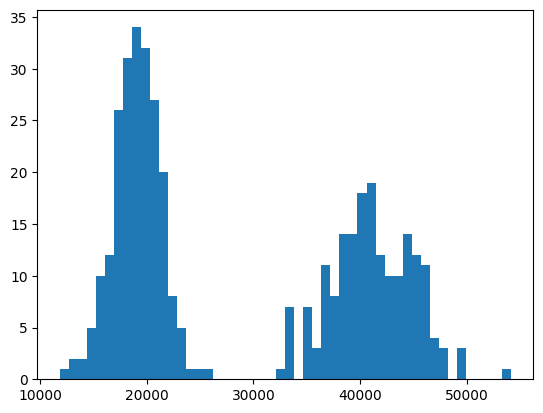

In [70]:
plt.hist(photocounts/t_SPCM_first_shot, bins=50)

### scan of excitation power (set point)

In [51]:
i = 2

f = h5py.File(os.path.join(resultcs, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 35000*t_SPCM_first_shot

experiment: single_photon_experiment
Pumping light off? False


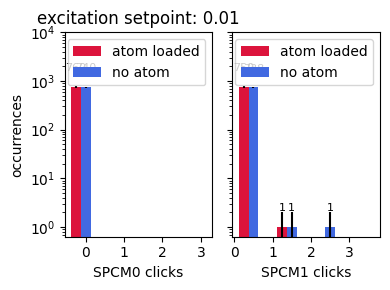

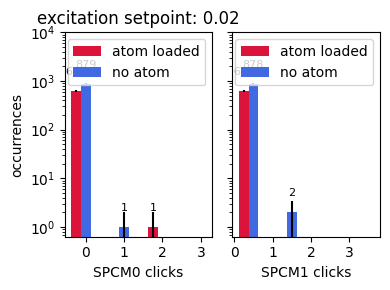

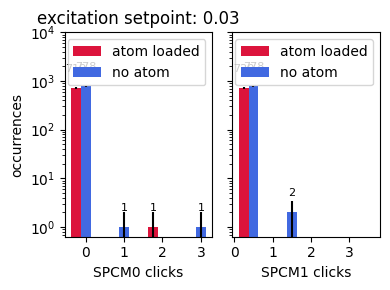

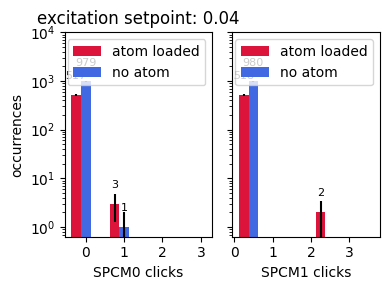

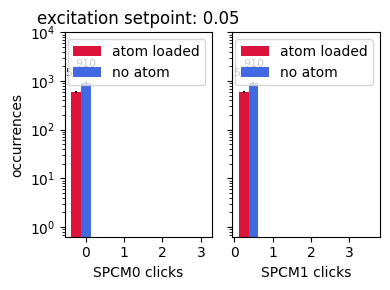

...

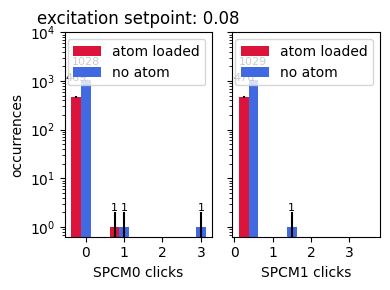

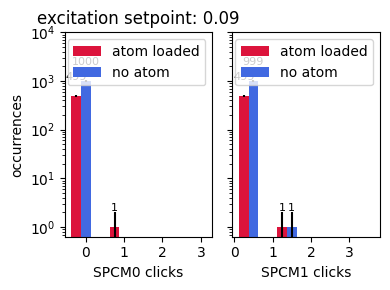

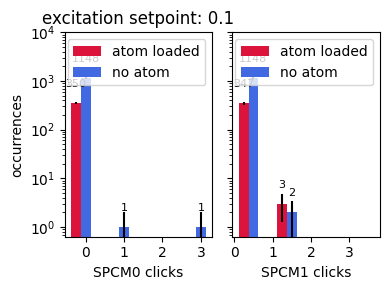

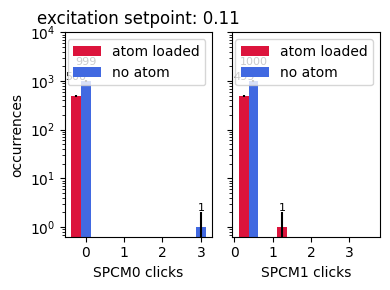

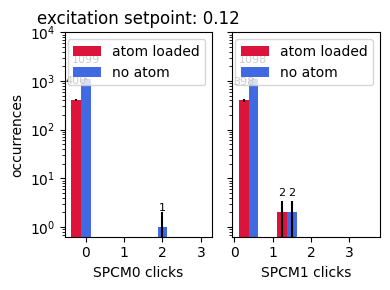

In [54]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"excitation setpoint: {sp}" for sp in scan_sequence1]
use_titles = True

mean_photons_with_atom_list = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*measurements:(i+1)*measurements] # only from SPCM 0
    
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()

    # todo: compute probability of real photon. number of times we have a photon at one or the other detector but not both, and exclude events with >1 photons.
    
    
    fig,axes = plt.subplots(ncols=2,figsize=(4,3),sharey=True)

    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom],[mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom]):
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1    

    axes[0].set_ylabel('occurrences')
    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

    i = 0
    for ax in axes:
        ax.legend(loc='upper right')
        ax.set_yscale('log')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        ax.set_xlabel(f'SPCM{i} clicks')
        i += 1
        
        
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

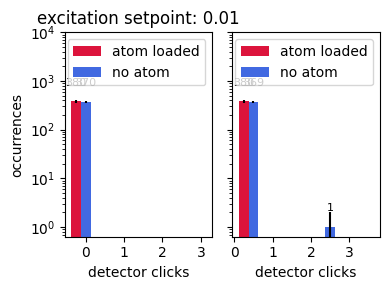

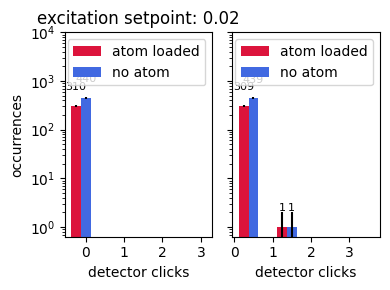

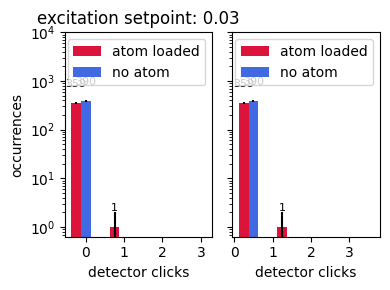

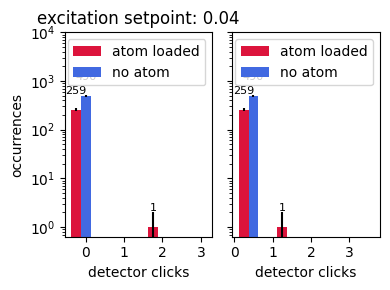

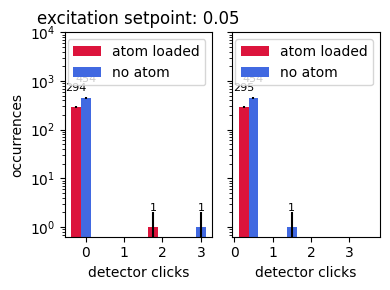

...

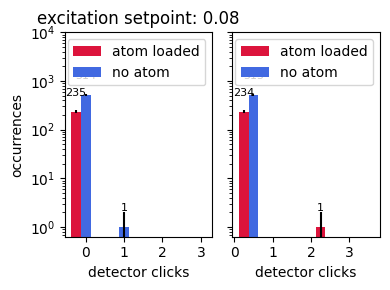

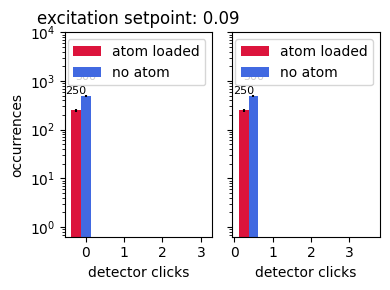

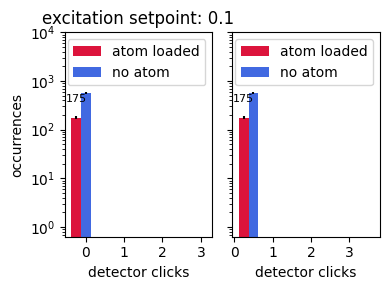

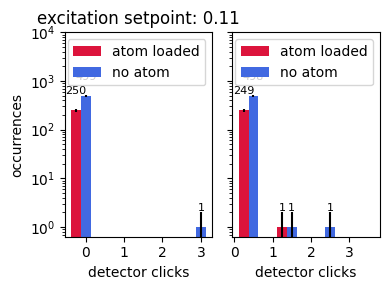

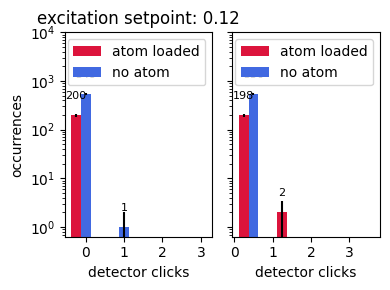

In [50]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = [f"excitation setpoint: {sp}" for sp in scan_sequence1]
use_titles = True

mean_photons_with_atom_list = []

for i, var_value in zip(range(iterations),scan_sequence1):
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    # photons are counted from SPCMs 0 and 1 for the excitation phase
    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    photons1_iteration_i = excitation_counts1[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)

    shot1 = photocounts[i*measurements:(i+1)*measurements] # only from SPCM 0
    
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    mean_photons1_per_cycle_with_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons1_per_cycle_no_atom = np.array([p for p,s in zip(photons1_iteration_i,shot1) if s <= cutoff1]).flatten()
    
    fig,axes = plt.subplots(ncols=2,figsize=(4,3),sharey=True)

    for ax, data_atom, data_no_atom in zip(axes,[mean_photons_per_cycle_with_atom, mean_photons1_per_cycle_with_atom],[mean_photons_per_cycle_no_atom, mean_photons1_per_cycle_no_atom]):
        for data, label, color in zip([data_atom, data_no_atom],barlegend,colors):
            offset = width * multiplier
            binned_data = np.histogram(data, bins=bins)[0]
            rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
            ax.bar_label(rects, padding=10, fontsize=8)
            ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
            multiplier += 1

    axes[0].set_ylabel('occurrences')
    if use_titles:
        axes[0].set_title(titles[i])
    else:
        try:
            axes[0].set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            axes[0].set_title(str(var_value)[2:-1])

    for ax in axes:
        ax.legend(loc='upper right')
        ax.set_yscale('log')
        ax.set_xlabel('detector clicks')
        ax.set_xticks(x + width, x)
        ax.set_ylim((10**(-0.2),1e4))
        
        
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

### seeing how photons from the FORT depend on the start time of ttl gate_rising

In [6]:
fnames = get_files_by_criteria(date_filters=["2024-12-04"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 4 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-04\16\000019944-GeneralVariableScan_single_photon_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-04\16\000019950-GeneralVariableScan_single_photon_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-04\16\000019954-GeneralVariableScan_single_photon_scan_over_t_microwave_pulse.h5) scanned over t_microwave_pulse
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-12-04\17\000019962-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu


In [15]:
i = 3

# f = h5py.File(os.path.join(results, "2024-12-04\\17\\000019962-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5"))
f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot

experiment: single_photon_experiment
Pumping light off? False


experiment: single_photon_experiment


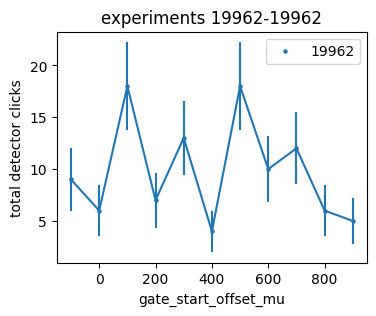

In [16]:
showhist = True
showloading = True

# scanning what time the gating starts. the gating duration is unchanged
i = 3 #
measurements = n_measurements
rids = []
fig,ax = plt.subplots(figsize=(4,3))
for i in range(3,4):
    f = h5py.File(os.path.join(results, fnames[i]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    rids.append(rid)

    counts_by_iteration = []
    
    for j, var_value in zip(range(iterations),scan_sequence1):
    
        photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*j:(measurements*n_excitation_cycles)*(j+1)].reshape(-1,n_excitation_cycles)
        shot1 = photocounts[j*measurements:(j+1)*measurements]
    
        counts_by_iteration.append(np.sum(photons_iteration_i))
        
    
    ax.scatter(scan_sequence1, counts_by_iteration,s=5,label=rid)
    ax.errorbar(scan_sequence1, counts_by_iteration, yerr=[np.sqrt(x) for x in counts_by_iteration])
    ax.legend()
    ax.set_ylabel('total detector clicks')
    ax.set_xlabel(scan_variable1_name)
    ax.set_title(f"experiments {rids[0]}-{rids[-1]}")

plt.show()


## 2024.05.08

## tuning SPCM gating
I've installed a TTL switch with ~ 10 ns and 5 ns rise and fall time respectively so we can block the SPCM output during at least part of the excitation pulse and during other parts of the excitation cycle as needed. the timing likely needs to be adjusted by about 10 ns, given that my initial alignment of the timing uses the switch output with a test voltage input as viewed alongside the trace of the excitation on the scope. Just based on cable lengths (fiber to the atom from excitation light, fiber from atom to SPCM, and cables to the scope), there is probably a 10-20 ns lag of the test signal I used for the switch compared to the excitation light.

In [338]:
fnames = get_files_by_criteria(date_filters=["2024-05-08"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
only_show_i_greater_than = 5 # everything before this was for looking at the FORT noise. see section below

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 12 files
file 6 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-08\12\000013147-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 7 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-08\16\000013176-GeneralVariableScan_single_photon_scan_over_gate_switch_offset.h5) scanned over gate_switch_offset
file 8 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-08\17\000013177-GeneralVariableScan_single_photon_scan_over_pumping_light_off.h5) scanned over pumping_light_off
file 9 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-08\17\000013178-GeneralVariableScan_single_photon_scan_over_t_excitation_pulse.h5) scanned over t_excitation_pulse
file 10 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-08\17\000013179-GeneralVariableScan_single_photon_scan_over_p_excitation.h5) scanned over p_excitation
file 11 (C:\Networking Experiment\artiq codes\artiq-master\re

In [368]:
i = 7 # shows photons from an atom at gate offset = 0??
i = 8 # pumping light off/on as a test -- looks real!
# i = 9 # shows best excitation for 120 ns
# i = 10 # no strong dependence on AOM power.... weird! also I'm getting 1 and 2 photons out just as often
# i = 11 # pumping repump blocked/unblocked. again, clear signal but nearly as likely to get 1 or 2 clicks

f = h5py.File(os.path.join(results, "2024-05-08\\16\\000013174-GeneralVariableScan.h5"))
f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot

experiment: single_photon_experiment
Pumping light off? False


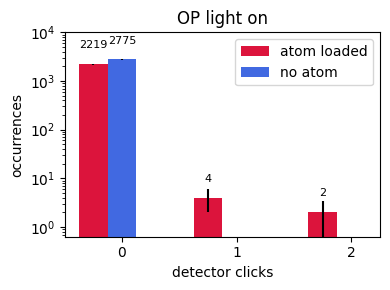

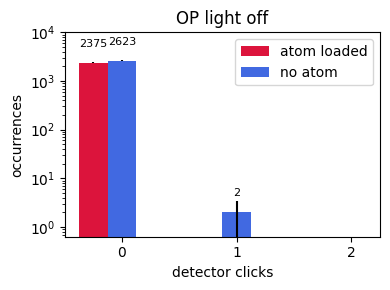

In [370]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

# units = 1
# unit_label = 'dBm'

titles = ["OP light on", "OP light off"]
use_titles = True

mean_photons_with_atom_list = []

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    shot1 = photocounts[i*measurements:(i+1)*measurements]

    # print(len(photons_iteration_i))

    # plt.hist(shot1)
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0
    
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()
    
    fig,ax = plt.subplots(figsize=(4,3))
    for data, label, color in zip([mean_photons_per_cycle_with_atom,mean_photons_per_cycle_no_atom],barlegend,colors):
        offset = width * multiplier
        binned_data = np.histogram(data, bins=bins)[0]
        rects = ax.bar(x + offset, binned_data, width, label=label, color=color)
        ax.bar_label(rects, padding=10, fontsize=8)
        ax.errorbar(x + offset, binned_data, yerr=np.sqrt(binned_data), color='k', ls='none')
        multiplier += 1
    ax.legend(loc='upper right')

    ax.set_yscale('log')
    ax.set_ylabel('occurrences')
    ax.set_xlabel('detector clicks')
    ax.set_xticks(x + width, x)
    ax.set_ylim((10**(-0.2),1e4))
    if use_titles:
        ax.set_title(titles[i])
    else:
        try:
            ax.set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
        except TypeError: # probably a string
            ax.set_title(str(var_value)[2:-1])

    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

In [343]:
var_value

b'OP repump blocked'

In [328]:
rid

13177

experiment: single_photon_experiment
experiment: single_photon_experiment
experiment: single_photon_experiment


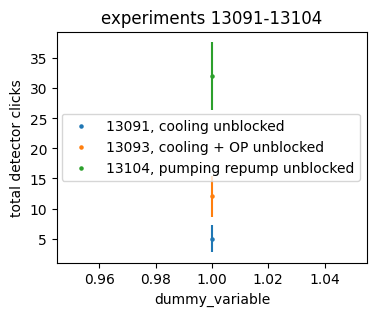

In [302]:
showhist = True
showloading = True

# scanning what time the gating starts. the gating duration is unchanged
i = 10 # cooling laser unblocked, but no atoms loaded. still using short MOT time

# the FORT is unblocked for all of the measurements below, but otherwise the beams not specified are physically blocked.
# I entered the variable names manaully because the duplicate files which I save with helpful names didn't save due to underflow errors.
# the default h5 file created by ARTIQ saves even if run() fails.
rids = []
fig,ax = plt.subplots(figsize=(4,3))
fnames_dict = {
    6:'cooling unblocked',
    '2024-05-07\\20\\000013093-GeneralVariableScan.h5':'cooling + OP unblocked',
    '2024-05-07\\20\\000013104-GeneralVariableScan.h5':'pumping repump unblocked',
    # '2024-05-07\\20\\000013105-GeneralVariableScan.h5':'everything unblocked'
}
for fname,desc in fnames_dict.items():
    if fname in list(range(len(fnames))):
        fname = fnames[i]
    f = h5py.File(os.path.join(results, fname))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    rids.append(rid)
    
    counts_by_iteration = []
    
    for j, var_value in zip(range(iterations),scan_sequence1):
    
        photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*j:(measurements*n_excitation_cycles)*(j+1)].reshape(-1,n_excitation_cycles)
        shot1 = photocounts[j*measurements:(j+1)*measurements]
    
        counts_by_iteration.append(np.sum(photons_iteration_i))
        
    
    ax.scatter(scan_sequence1, counts_by_iteration,s=5,label=str(rid)+', '+desc)
    ax.errorbar(scan_sequence1, counts_by_iteration, yerr=[np.sqrt(x) for x in counts_by_iteration])
ax.legend()
ax.set_ylabel('total detector clicks')
ax.set_xlabel(scan_variable1_name)
ax.set_title(f"experiments {rids[0]}-{rids[-1]}")

plt.show()

In [293]:
len(photons_iteration_i)

953

In [282]:
counts_by_iteration

[0, 0]

### seeing how photons from the FORT depend on the start time of ttl gate_rising
Below it can be seen that if the ttl gate_rising call is pushed 700 mu into the future compared to what we were doing previously, there are no photons detected. note that I physically blocked all other beams.

In [280]:
fnames = get_files_by_criteria(date_filters=["2024-05-07"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 10 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\13\000013061-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\14\000013066-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\15\000013081-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\16\000013083-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\16\000013084-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 5 (C:\Networkin

## 2024.05.07

## tracking down noise
measurements yesterday suggested that the majority of counts come from the FORT. we want to mitigate these counts as much as possible by proper tuning of the experiment (making sure the FORT is all the way off when we start counting, e.g.), but we can also implement switching of the SPCM output with a fast switch. the SPCM gating latency is not short enough for this purpose. 

in the experiments below that investigate counts, I have reduced the MOT loading time to 10 ms so we can improve the data rate.

### checking counts from other lasers
Now that the noise from the FORT should be negligible, what about the other beams?

In [300]:
fnames = get_files_by_criteria(date_filters=["2024-05-07"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
only_show_i_greater_than = 9 # everything before this was for looking at the FORT noise. see section below

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 10 files


experiment: single_photon_experiment
experiment: single_photon_experiment
experiment: single_photon_experiment


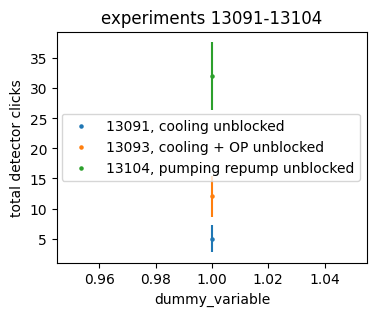

In [302]:
showhist = True
showloading = True

# scanning what time the gating starts. the gating duration is unchanged
i = 10 # cooling laser unblocked, but no atoms loaded. still using short MOT time

# the FORT is unblocked for all of the measurements below, but otherwise the beams not specified are physically blocked.
# I entered the variable names manaully because the duplicate files which I save with helpful names didn't save due to underflow errors.
# the default h5 file created by ARTIQ saves even if run() fails.
rids = []
fig,ax = plt.subplots(figsize=(4,3))
fnames_dict = {
    '2024-05-07\\19\\000013091-GeneralVariableScan.h5':'cooling unblocked',
    '2024-05-07\\20\\000013093-GeneralVariableScan.h5':'cooling + OP unblocked',
    '2024-05-07\\20\\000013104-GeneralVariableScan.h5':'pumping repump unblocked',
    # '2024-05-07\\20\\000013105-GeneralVariableScan.h5':'everything unblocked'
}
for fname,desc in fnames_dict.items():
    if fname in list(range(len(fnames))):
        fname = fnames[i]
    f = h5py.File(os.path.join(results, fname))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    rids.append(rid)
    
    counts_by_iteration = []
    
    for j, var_value in zip(range(iterations),scan_sequence1):
    
        photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*j:(measurements*n_excitation_cycles)*(j+1)].reshape(-1,n_excitation_cycles)
        shot1 = photocounts[j*measurements:(j+1)*measurements]
    
        counts_by_iteration.append(np.sum(photons_iteration_i))
        
    
    ax.scatter(scan_sequence1, counts_by_iteration,s=5,label=str(rid)+', '+desc)
    ax.errorbar(scan_sequence1, counts_by_iteration, yerr=[np.sqrt(x) for x in counts_by_iteration])
ax.legend()
ax.set_ylabel('total detector clicks')
ax.set_xlabel(scan_variable1_name)
ax.set_title(f"experiments {rids[0]}-{rids[-1]}")

plt.show()

In [293]:
len(photons_iteration_i)

953

In [282]:
counts_by_iteration

[0, 0]

### seeing how photons from the FORT depend on the start time of ttl gate_rising
Below it can be seen that if the ttl gate_rising call is pushed 700 mu into the future compared to what we were doing previously, there are no photons detected. note that I physically blocked all other beams.

In [280]:
fnames = get_files_by_criteria(date_filters=["2024-05-07"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 10 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\13\000013061-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\14\000013066-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\15\000013081-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\16\000013083-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-07\16\000013084-GeneralVariableScan_single_photon_scan_over_gate_start_offset_mu.h5) scanned over gate_start_offset_mu
file 5 (C:\Networkin

experiment: single_photon_experiment
experiment: single_photon_experiment
experiment: single_photon_experiment
experiment: single_photon_experiment
experiment: single_photon_experiment
experiment: single_photon_experiment
experiment: single_photon_experiment
experiment: single_photon_experiment


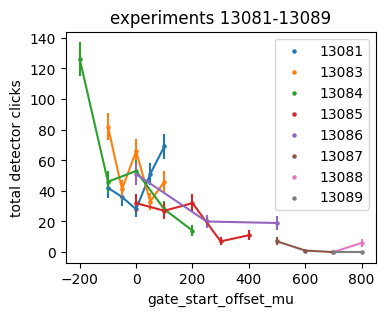

In [281]:
showhist = True
showloading = True

# scanning what time the gating starts. the gating duration is unchanged
i = 2 #
"""the cooling, D1, pumping repump, MOT repump, and excitation are all physically blocked, 
leaving only the FORT on. I disabled feedback to the AOMs except the FORT for this and set the MOT loading to 10 ms; 
see ARTIQ code manual."""
i = 3 # identical to above.
i = 4 # twice the scan range, otherwise identical to above.
i = 5 # scan range is positive, going to farther out times in the future
i = 9 # I pushed the time the FORT comes back at the end of an excitation cycle into the future

rids = []
fig,ax = plt.subplots(figsize=(4,3))
for i in range(2,10):
    f = h5py.File(os.path.join(results, fnames[i]))
    rid = f['rid'][()]
    h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
    print("experiment:",experiment_function)
    rids.append(rid)

    counts_by_iteration = []
    
    for j, var_value in zip(range(iterations),scan_sequence1):
    
        photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*j:(measurements*n_excitation_cycles)*(j+1)].reshape(-1,n_excitation_cycles)
        shot1 = photocounts[j*measurements:(j+1)*measurements]
    
        counts_by_iteration.append(np.sum(photons_iteration_i))
        
    
    ax.scatter(scan_sequence1, counts_by_iteration,s=5,label=rid)
    ax.errorbar(scan_sequence1, counts_by_iteration, yerr=[np.sqrt(x) for x in counts_by_iteration])
    ax.legend()
    ax.set_ylabel('total detector clicks')
    ax.set_xlabel(scan_variable1_name)
    ax.set_title(f"experiments {rids[0]}-{rids[-1]}")

plt.show()


In [282]:
counts_by_iteration

[0, 0]

In [270]:
(n_measurements*n_excitation_cycles*n_excitation_attempts*(t_excitation_pulse + 100e-9))*280

1.5750000000000002

In [260]:
[1/np.sqrt(x) for x in counts_by_iteration]

[0.14002800840280097, 0.22360679774997896, 0.22941573387056174]

1000


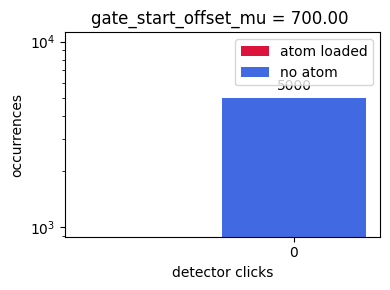

1000


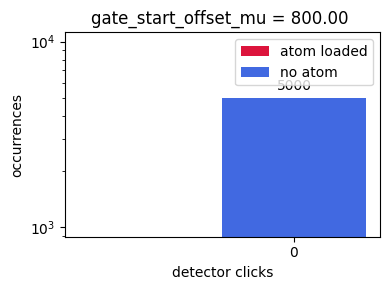

In [283]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1 #1e-9
unit_label = ''#'ns'

mean_photons_with_atom_list = []

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    shot1 = photocounts[i*measurements:(i+1)*measurements]

    print(len(photons_iteration_i))
    # print(len(photons_iteration_i))

    # plt.hist(shot1)
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0
    
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()
    
    fig,ax = plt.subplots(figsize=(4,3))
    for data, label, color in zip([mean_photons_per_cycle_with_atom,mean_photons_per_cycle_no_atom],barlegend,colors):
        offset = width * multiplier
        rects = ax.bar(x + offset, np.histogram(data, bins=bins)[0], width, label=label, color=color)
        ax.bar_label(rects, padding=3)
        multiplier += 1
    ax.legend(loc='upper right')

    ax.set_yscale('log')
    ax.set_ylabel('occurrences')
    ax.set_xlabel('detector clicks')
    ax.set_xticks(x + width, x)
    ax.set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

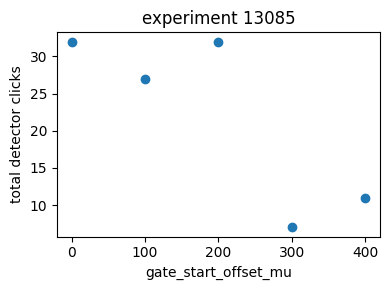

In [249]:
counts_by_iteration = []

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    shot1 = photocounts[i*measurements:(i+1)*measurements]

    counts_by_iteration.append(np.sum(photons_iteration_i))
    
fig,ax = plt.subplots(figsize=(4,3))
ax.scatter(scan_sequence1, counts_by_iteration)

ax.set_ylabel('total detector clicks')
ax.set_xlabel(scan_variable1_name)
ax.set_title(f"experiment {rid}")
# ax.legend(loc='upper left', ncols=3)

fig.tight_layout()
plt.show()

## 2024.05.06

## continued search for single photons, background measurement
scroll down for histogram of detector clicks with and without an atom loaded. 

in order to measure the background, I've unlocked the cooling laser (see experiment 13001) and run the single_photon_experiment with 5 and 5 excitation cycles and attempts.

to-do: check that the AOM rise time for 1st order is accurately represented by the 0th order dip I'm measuring. Akbar got a pulse < 50 ns.

In [213]:
fnames = get_files_by_criteria(date_filters=["2024-05-06"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

skipping C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-06\11\000013003-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5, which is corrupt
found 7 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-06\10\000013001-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-06\10\000013002-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-06\12\000013004-GeneralVariableScan_single_photon_scan_over_t_excitation_pulse.h5) scanned over t_excitation_pulse
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-06\14\000013006-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-06\14\000

experiment: single_photon_experiment
Pumping light off? False


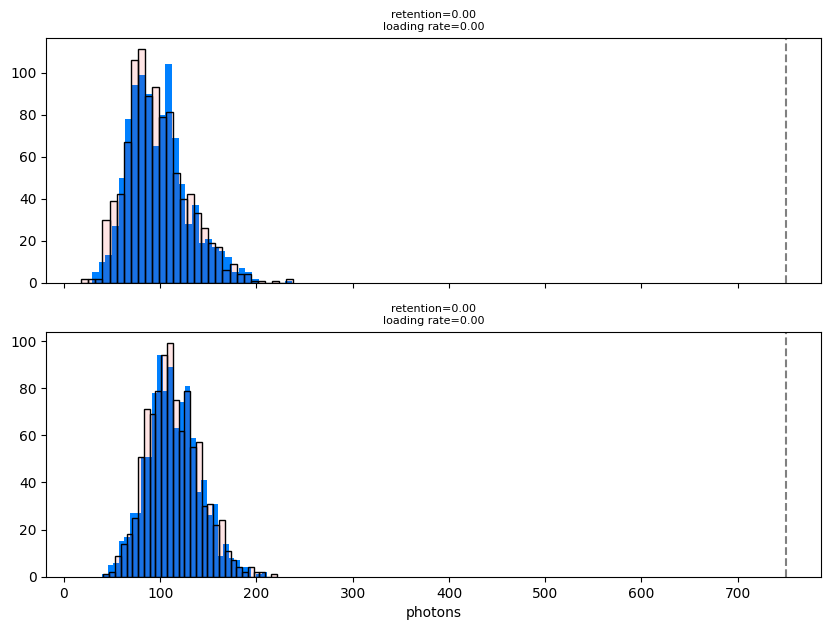

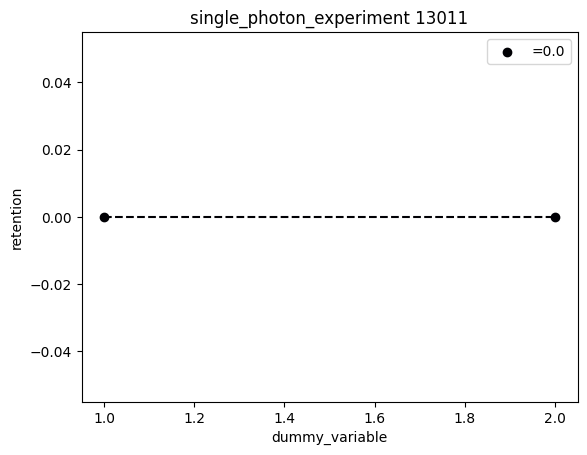

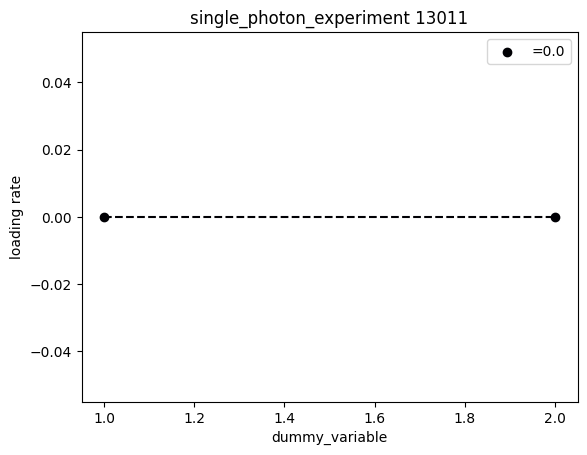

In [214]:
showhist = True
showloading = True

i = 0 # cooling laser unlocked to measure background with no atoms
i = 1 # cooling laser locked, same experiment as above
i = 2 # same experiment, excitation light physically blocked
i = 3 # repump physically blocked
i = 4 # cooling physically blocked
i = 5 # D1 OP light blocked
i = 6 # FORT blocked

f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    for i, ax in enumerate(axes.flat):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

1000


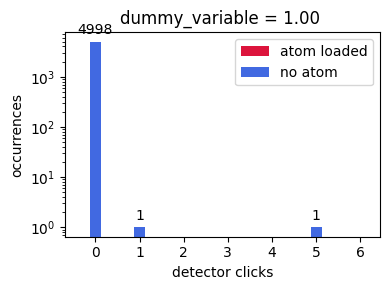

1000


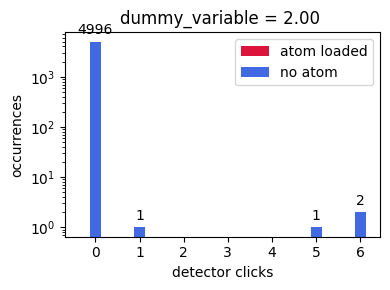

In [215]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1 #1e-9
unit_label = ''#'ns'

mean_photons_with_atom_list = []

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    shot1 = photocounts[i*measurements:(i+1)*measurements]

    print(len(photons_iteration_i))
    # print(len(photons_iteration_i))

    # plt.hist(shot1)
    
    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0
    
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()
    
    fig,ax = plt.subplots(figsize=(4,3))
    for data, label, color in zip([mean_photons_per_cycle_with_atom,mean_photons_per_cycle_no_atom],barlegend,colors):
        offset = width * multiplier
        rects = ax.bar(x + offset, np.histogram(data, bins=bins)[0], width, label=label, color=color)
        ax.bar_label(rects, padding=3)
        multiplier += 1
    ax.legend(loc='upper right')

    ax.set_yscale('log')
    ax.set_ylabel('occurrences')
    ax.set_xlabel('detector clicks')
    ax.set_xticks(x + width, x)
    ax.set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

1000


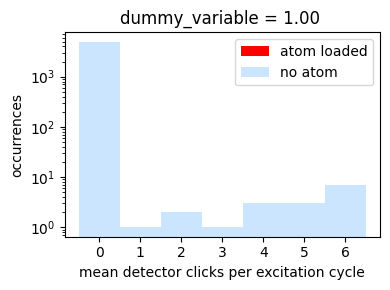

1000


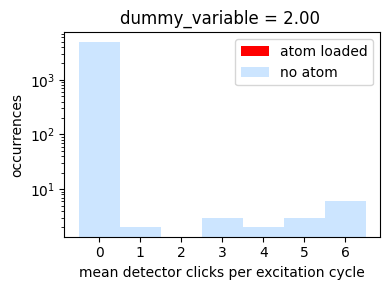

In [201]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))

xlabels = [str(x) for x in range(max_counts)]
barlegend = ["atom loaded","no atom"]
colors = [(1.0, 0.0, 0.0, 1), (.0, 0.5, 1, .2)]
x = np.arange(len(xlabels))  # the label locations

mean_photons_with_atom_list = []

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:(measurements*n_excitation_cycles)*(i+1)].reshape(-1,n_excitation_cycles)
    print(len(photons_iteration_i))
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()
    # print(len(mean_photons_per_excitation_with_atom)+len(mean_photons_per_excitation_no_atom))
    
    # mean_photons_with_atom_list.append(mean_photons_per_excitation_with_atom)

    fig,ax = plt.subplots(figsize=(4,3))
    for data, label, color in zip(
        [mean_photons_per_cycle_with_atom,mean_photons_per_cycle_no_atom],barlegend,colors):
        rects = ax.hist(data, bins=bins, label=label, facecolor=color)
    ax.legend(loc='upper right')

    ax.set_yscale('log')
    ax.set_ylabel('occurrences')
    ax.set_xlabel('mean detector clicks per excitation cycle')
    ax.set_xticks(x+0.5, x)
    ax.set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

## 2024.05.04

## continued search for single photons
scroll down for histogram of detector clicks with and without an atom loaded. 

I realized that in my code from yesterday, each element in excitation_counts was the number of detector clicks over all excitation cycles in a given measurement. In other words, if I'm doing n_excitation_cycles and n_excitation_attempts within one of those, then the number of clicks reported is the number counted over the whole n_excitation_cycles and n_excitation_attempts, and I should have been dividing by that number. Now, my code has the excitation counts for a single excitation_cycle, i.e. the counts after a series of n_excitation_attempts. I still need to divide by that number.

In [136]:
fnames = get_files_by_criteria(date_filters=["2024-05-04"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 3 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-04\09\000012967-GeneralVariableScan_single_photon_scan_over_t_excitation_pulse.h5) scanned over t_excitation_pulse
file 1 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-04\10\000012977-GeneralVariableScan_single_photon_scan_over_t_excitation_pulse.h5) scanned over t_excitation_pulse
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-04\11\000012978-GeneralVariableScan_single_photon_scan_over_t_excitation_pulse.h5) scanned over t_excitation_pulse


experiment: single_photon_experiment
Pumping light off? False


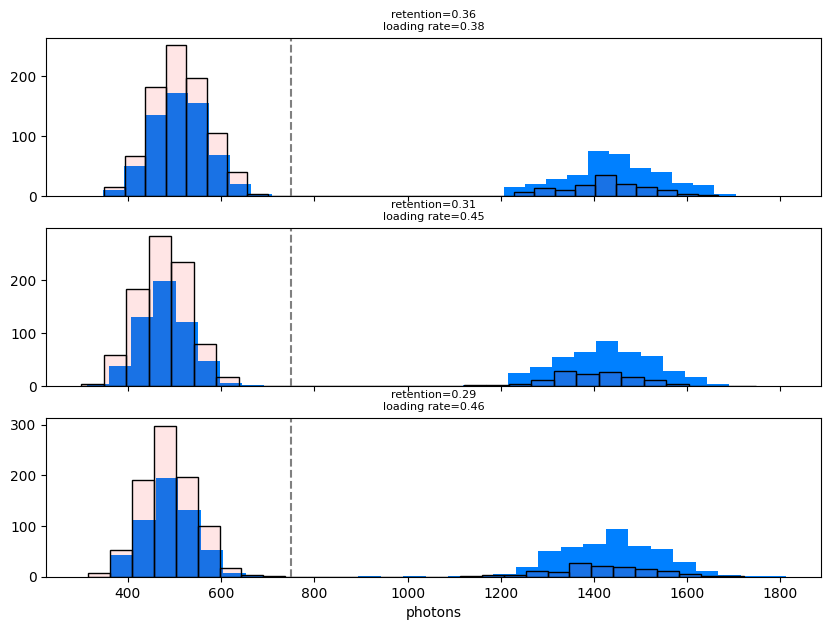

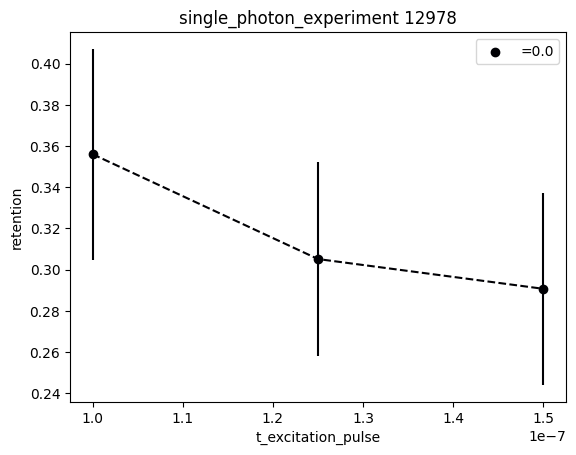

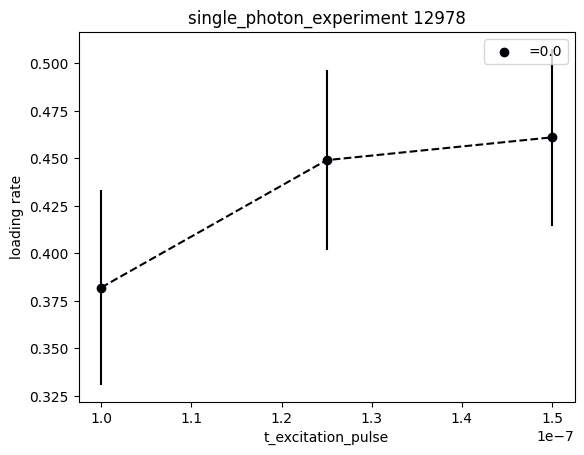

In [103]:
showhist = True
showloading = True

i = 2 # scan over excitation pulse time

f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    for i, ax in enumerate(axes.flat):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

In [107]:
excitation_counts[1:][:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [115]:
np.arange(10).reshape(-1,2).flatten()

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

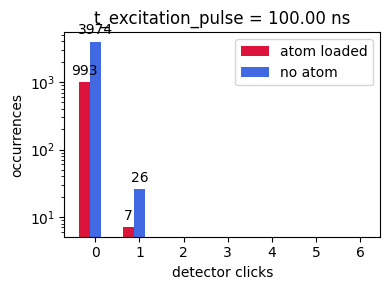

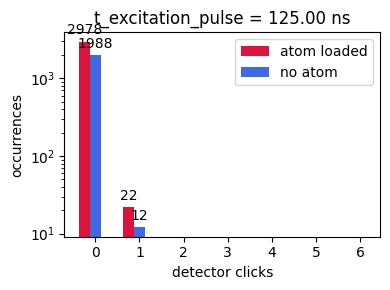

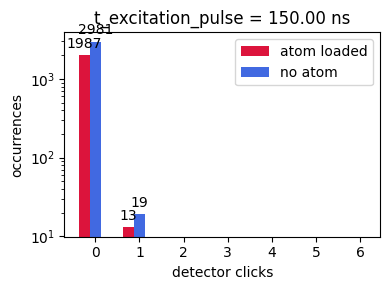

In [138]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))
units = 1e-9
unit_label = 'ns'

mean_photons_with_atom_list = []

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:measurements*n_excitation_cycles*(i+1)].reshape(n_excitation_cycles,-1)
    shot1 = photocounts[i*measurements:(i+1)*measurements]

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0
    
    mean_photons_per_excitation_with_atom = np.array([p/n_excitation_attempts for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_excitation_no_atom = np.array([p/n_excitation_attempts for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()

    mean_photons_with_atom_list.append(mean_photons_per_excitation_with_atom)
    
    fig,ax = plt.subplots(figsize=(4,3))
    for data, label, color in zip([mean_photons_per_excitation_with_atom,mean_photons_per_excitation_no_atom],barlegend,colors):
        offset = width * multiplier
        rects = ax.bar(x + offset, np.histogram(data, bins=bins)[0], width, label=label, color=color)
        ax.bar_label(rects, padding=3)
        multiplier += 1
    ax.legend(loc='upper right')
    # ax.bar(x, np.histogram(photons_iteration_i, bins=bins)[0])

    ax.set_yscale('log')
    ax.set_ylabel('occurrences')
    ax.set_xlabel('detector clicks')
    ax.set_xticks(x + width, x)
    ax.set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

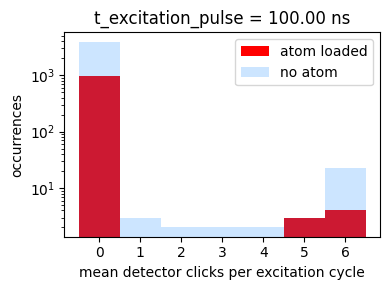

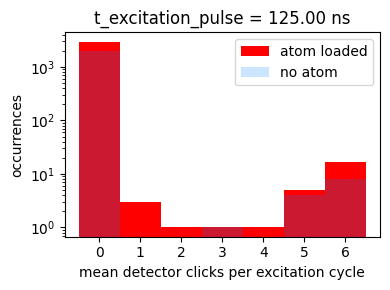

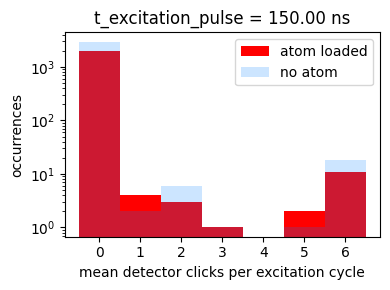

In [158]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))

xlabels = [str(x) for x in range(max_counts)]
barlegend = ["atom loaded","no atom"]
colors = [(1.0, 0.0, 0.0, 1), (.0, 0.5, 1, .2)]
x = np.arange(len(xlabels))  # the label locations

mean_photons_with_atom_list = []

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[1:][measurements*n_excitation_cycles*i:measurements*n_excitation_cycles*(i+1)].reshape(n_excitation_cycles,-1)
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    
    mean_photons_per_cycle_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1]).flatten()
    mean_photons_per_cycle_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1]).flatten()
    # print(len(mean_photons_per_excitation_with_atom)+len(mean_photons_per_excitation_no_atom))
    
    mean_photons_with_atom_list.append(mean_photons_per_excitation_with_atom)

    fig,ax = plt.subplots(figsize=(4,3))
    for data, label, color in zip(
        [mean_photons_per_cycle_with_atom,mean_photons_per_cycle_no_atom],barlegend,colors):
        rects = ax.hist(data, bins=bins, label=label, facecolor=color)
    ax.legend(loc='upper right')

    ax.set_yscale('log')
    ax.set_ylabel('occurrences')
    ax.set_xlabel('mean detector clicks per excitation cycle')
    ax.set_xticks(x+0.5, x)
    ax.set_title(f"{scan_variable1_name} = {var_value/units:.2f} "+unit_label)
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

In [152]:
mean_photons_per_cycle_with_atom

array([0, 0, 0, ..., 0, 0, 0])

In [131]:
for i in range(len(scan_sequence1)):
    print(f"mean photons per excitation with {scan_variable1_name} = {scan_sequence1[i]}")
    print(set(mean_photons_with_atom_list[i]))

mean photons per excitation with t_excitation_pulse = 1.0000000000000001e-07
{0.0, 1.2, 1.0}
mean photons per excitation with t_excitation_pulse = 1.2500000000000002e-07
{0.0, 1.2, 0.2, 1.0, 0.4, 0.8, 0.6}
mean photons per excitation with t_excitation_pulse = 1.5000000000000002e-07
{0.0, 1.2, 0.2, 1.0, 0.4, 0.6}


## 2024.05.03

## second search for single photons
scroll down for histogram of detector clicks with and without an atom loaded. 

we realized today that the excitation light was being completely blocked by the polarizer in the chamber, as the light had been erroneously aligned to the slow axis of the fiber (possibly the fiber splice was 90 deg off), while it needed to be aligned to the fast axis. This was fixed, and the last experiment from today is an AOM power scan after this fix. 

In [97]:
# fnames = get_files_by_criteria(date_filters=["2024-05-02"], # only find files from these date directories
fnames = get_files_by_criteria(date_filters=["2024-05-03"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
# only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 5 files
file 0 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-03\11\000012949-GeneralVariableScan_single_photon_scan_over_p_excitation.h5) scanned over p_excitation
oops... something wrong with C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-03\13\000012951-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5
file 2 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-03\14\000012953-GeneralVariableScan_single_photon_scan_over_dummy_variable.h5) scanned over dummy_variable
file 3 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-03\15\000012958-GeneralVariableScan_single_photon_scan_over_t_excitation_pulse.h5) scanned over t_excitation_pulse
file 4 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-03\17\000012966-GeneralVariableScan_single_photon_scan_over_p_excitation.h5) scanned over p_excitation


experiment: single_photon_experiment
Pumping light off? False


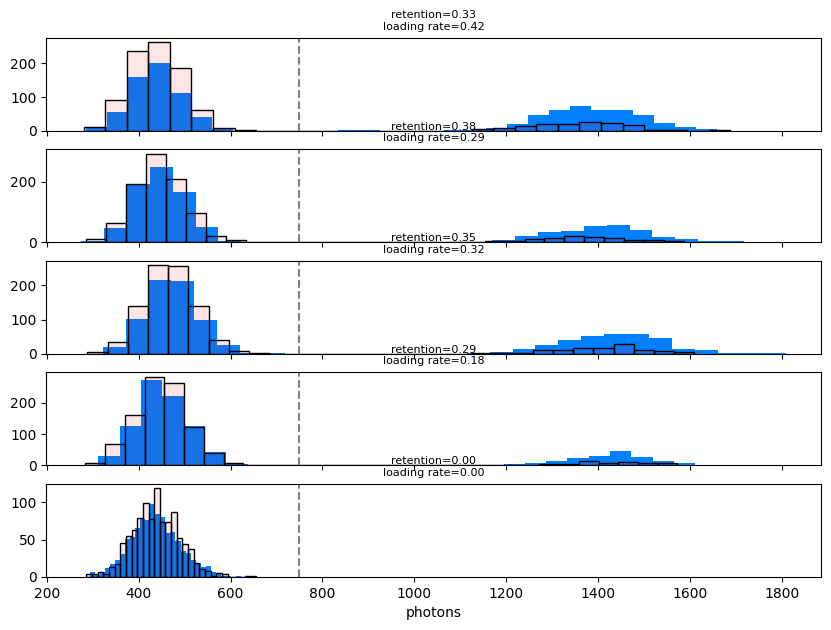

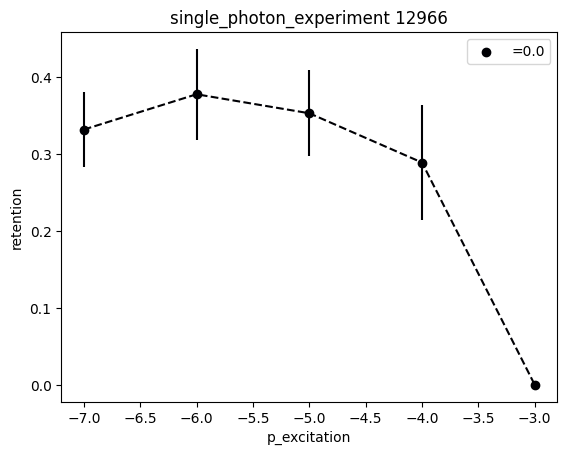

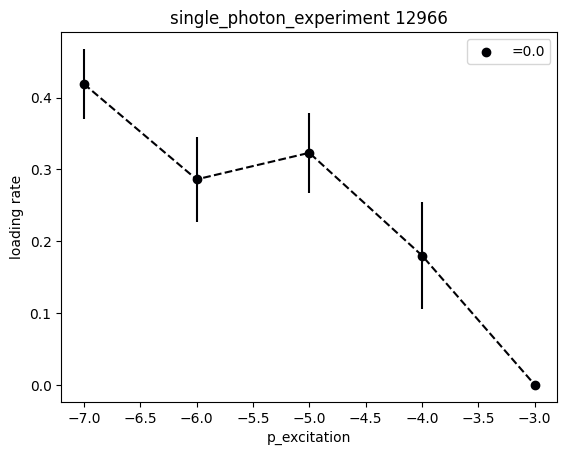

In [98]:
showhist = True
showloading = True

i = 9 # from 2024-05-02. doesn't show any sign of real single photons
i = 0 # scan over AOM power after sending slightly more power to excitation setup
i = 4 # scan over AOM power after correcting alignment to fiber axis of GRIN1


f = h5py.File(os.path.join(results, fnames[i]))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    for i, ax in enumerate(axes.flat):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

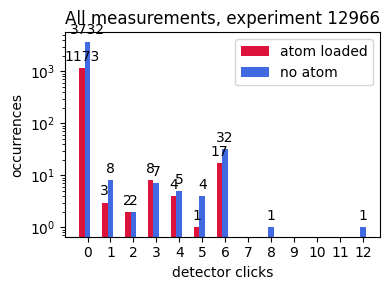

In [99]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))

photons = excitation_counts
shot1 = photocounts

xlabels = [str(x) for x in range(max_counts)]
barlegend = ["atom loaded","no atom"]
colors = ['crimson','royalblue']
x = np.arange(len(xlabels))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

photons_with_atom = np.array([p for p,s in zip(photons,shot1) if s > cutoff1])
photons_no_atom = np.array([p for p,s in zip(photons,shot1) if s <= cutoff1])

fig,ax = plt.subplots(figsize=(4,3))
for data, label, color in zip([photons_with_atom,photons_no_atom],barlegend,colors):
    offset = width * multiplier
    rects = ax.bar(x + offset, np.histogram(data, bins=bins)[0], width, label=label, color=color)
    ax.bar_label(rects, padding=3)
    multiplier += 1
ax.legend(loc='upper right')
# ax.bar(x, np.histogram(photons_iteration_i, bins=bins)[0])

ax.set_yscale('log')
ax.set_ylabel('occurrences')
ax.set_xlabel('detector clicks')
ax.set_xticks(x + width, x)
ax.set_title(f"All measurements, experiment {rid}")
# ax.legend(loc='upper left', ncols=3)

fig.tight_layout()
plt.show()

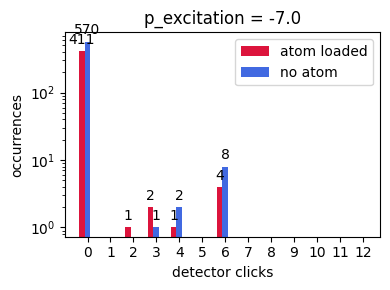

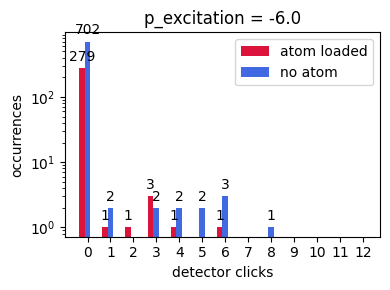

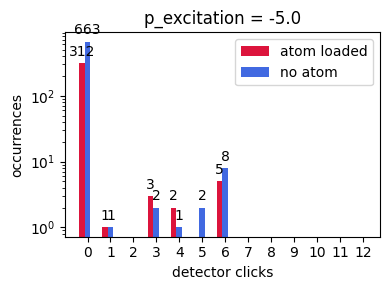

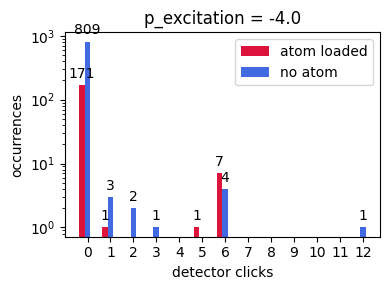

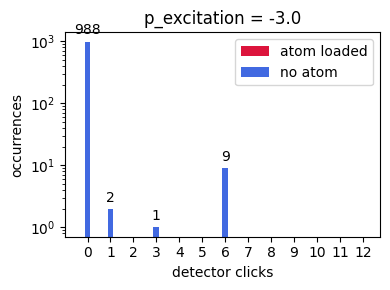

In [100]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[measurements*i:measurements*(i+1)]
    shot1 = photocounts[i*measurements:(i+1)*measurements]

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0
    
    photons_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1])
    photons_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1])

    fig,ax = plt.subplots(figsize=(4,3))
    for data, label, color in zip([photons_with_atom,photons_no_atom],barlegend,colors):
        offset = width * multiplier
        rects = ax.bar(x + offset, np.histogram(data, bins=bins)[0], width, label=label, color=color)
        ax.bar_label(rects, padding=3)
        multiplier += 1
    ax.legend(loc='upper right')
    # ax.bar(x, np.histogram(photons_iteration_i, bins=bins)[0])

    ax.set_yscale('log')
    ax.set_ylabel('occurrences')
    ax.set_xlabel('detector clicks')
    ax.set_xticks(x + width, x)
    ax.set_title(f"{scan_variable1_name} = {var_value}")
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()

## 2024.05.02

## first search for single photons
scroll down for histogram of detector clicks with and without an atom loaded. no sign of real photons yet.

In [81]:
fnames = get_files_by_criteria(date_filters=["2024-05-01"], # only find files from these date directories
                               name_filters=["single_photon", "GeneralVariableScan"], # only find files containing all these strings
                               condition=lambda filename: True, # use this to filter by experiment parameters, like this: lambda filename: np.bool_(h5py.File(filename)['datasets']['set_current_coil_volts_at_finish'])
                               start_dir=results,
                               include_path=True, # only return the name of the file, not the full path
                               print_filenames=True
)

only_show_i_greater_than = -1
only_show_i_greater_than = 14 # everything before this was just for debugging the pulse timing

print(f"found {len(fnames)} files")
for i,f in enumerate(fnames):
    if i > only_show_i_greater_than:
        try:
            ds = h5py.File(os.path.join(results, f))['datasets']
            scan_str = str_from_h5(ds['scan_variable1_name'])
            if str_from_h5(ds['scan_variable2_name']) != '':
                scan_str += ", " +str_from_h5(ds['scan_variable2_name'])
            print(f"file {i} ({f}) scanned over "+scan_str)
        except:
            print(f"oops... something wrong with {f}")

found 16 files
file 15 (C:\Networking Experiment\artiq codes\artiq-master\results\2024-05-01\16\000012830-GeneralVariableScan_single_photon_scan_over_p_excitation.h5) scanned over p_excitation


experiment: single_photon_experiment
Pumping light off? False


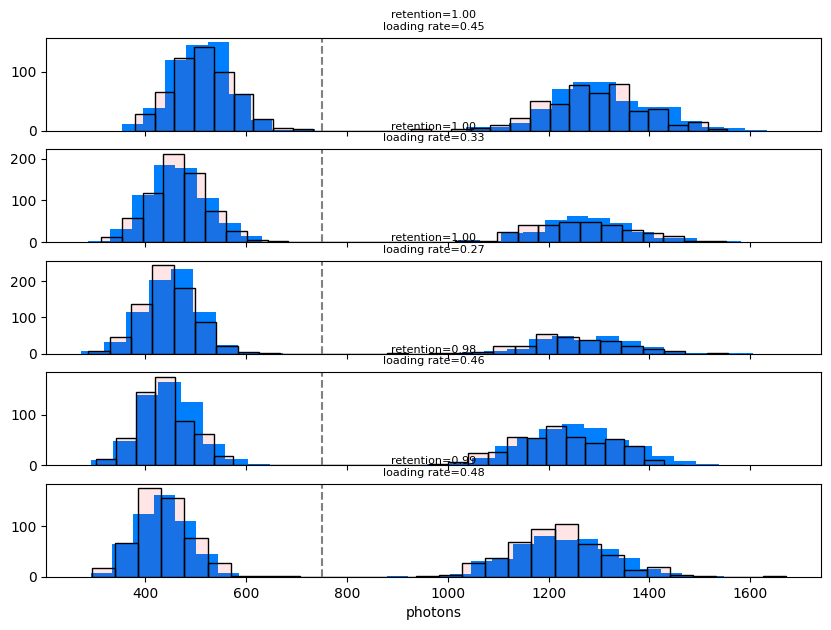

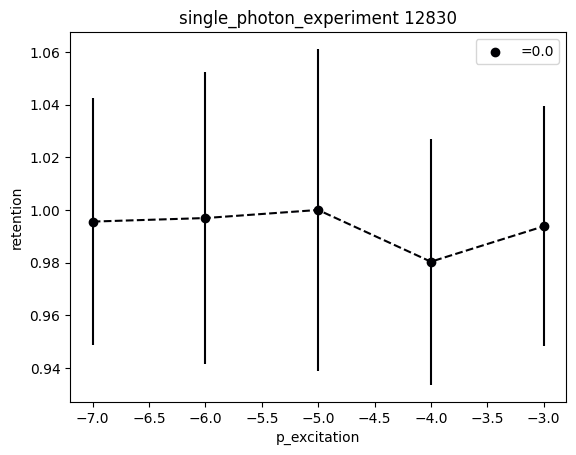

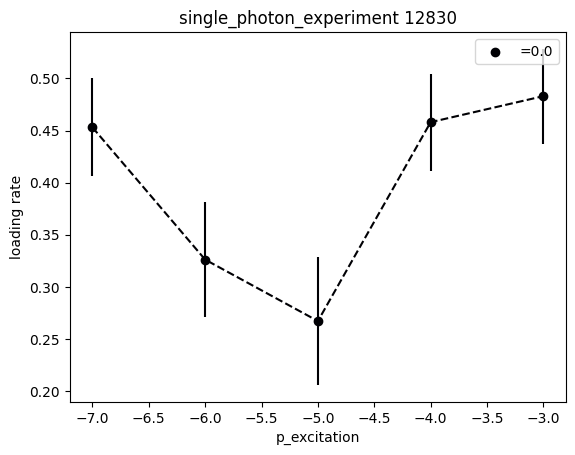

In [82]:
showhist = True
showloading = True

fname = fnames[15]

f = h5py.File(os.path.join(results, fname))
rid = f['rid'][()]
h5_archive_and_datasets_to_locals(f, parent_locals=locals(), quiet=True)
print("experiment:",experiment_function)
if t_FORT_drop > 0:
    print(f"ATTENTION: retention may be low because of {t_FORT_drop/us} us FORT drop")
scan_is_2D = True if scan_variable2_name != '' else False
iterations = len(scan_sequence1)*len(scan_sequence2)

# print("MOT AOMs on the whole time?", control_experiment)
# print("Blow-away light off?", blowaway_light_off)
print("Pumping light off?", pumping_light_off)
# plot histogram for each iteration (iteration = experiment sequence with a particular gap time between shots)
# cutoff1 = single_atom_counts_per_s*t_SPCM_first_shot
# cutoff2 = single_atom_counts_per_s*t_SPCM_second_shot

cutoff1=cutoff2 = 50000*t_SPCM_first_shot
# units = None

retention_array = np.zeros(iterations)
loading_rate_array = np.zeros(iterations)
n_atoms_loaded_array = np.zeros(iterations)

ncols = len(scan_sequence2)
nrows = len(scan_sequence1)

measurements = n_measurements #if not control_experiment else n_measurements//2

for i in range(iterations):
    shot1 = photocounts[i*measurements:(i+1)*measurements]
    shot2 = photocounts2[i*measurements:(i+1)*measurements]
    
    atoms_loaded = [x > cutoff1 for x in shot1]
    n_atoms_loaded = sum(atoms_loaded)
    atoms_retained = [x > cutoff2 and y for x,y in zip(shot2, atoms_loaded)]
    retention_fraction = 0 if not n_atoms_loaded > 0 else sum(atoms_retained)/sum(atoms_loaded)
    retention_array[i] = retention_fraction
    loading_rate_array[i] = n_atoms_loaded/n_measurements
    n_atoms_loaded_array[i] = n_atoms_loaded

shape = (len(scan_sequence2),len(scan_sequence1))
loading_rate_raveled = np.reshape(loading_rate_array,shape,order='F') # rows have constant variable2
n_atoms_loaded_raveled = np.reshape(n_atoms_loaded_array,shape,order='F') # rows have constant variable2
retention_raveled = np.reshape(retention_array,shape,order='F') # rows have constant variable2

if showhist:
    fig,axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(10,7),sharex=True)
    for i, ax in enumerate(axes.flat):
        shot1 = photocounts[i*measurements:(i+1)*measurements]
        shot2 = photocounts2[i*measurements:(i+1)*measurements]
        ax.hist(shot1,bins=30, facecolor=(0.0, 0.5, 1, 1),label='shot 1')
        ax.hist(shot2,bins=30, facecolor=(1.0, 0.0, 0.0, 0.1),label='shot 2', edgecolor=(0, 0, 0, 1), linestyle='-')
        ax.set_title(f"retention={retention_array[i]:.2f}\nloading rate={loading_rate_array[i]:.2f}",fontsize=8)
        ax.axvline(cutoff1,color='grey',linestyle='--')
        # ax.set_ylabel("occurences")
    ax.set_xlabel("photons")
    plt.show()

# plot a retention curve vs variable 1 for each variable 2 value
cmap = mpl.colormaps['inferno']
for i, retention, n_loaded, var2 in zip(range(len(scan_sequence2)),retention_raveled, n_atoms_loaded_raveled, scan_sequence2):
    plt.plot(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),linestyle='--')
    plt.scatter(scan_sequence1, retention,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
    errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
    plt.errorbar(scan_sequence1, retention, errs, ls='none',color=cmap(i/len(scan_sequence2)))

    plt.xlabel(scan_variable1_name)
    plt.ylabel("retention")
    plt.legend()
    plt.title(experiment_function+f' {rid}')
    plt.show()

if showloading:
    for i, loading, n_loaded, var2 in zip(range(len(scan_sequence2)),loading_rate_raveled, n_atoms_loaded_raveled, scan_sequence2):
        plt.plot(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),linestyle='--')
        plt.scatter(scan_sequence1, loading,color=cmap(i/len(scan_sequence2)),label=scan_variable2_name+"="+str(var2))
        errs = [1/np.sqrt(n) if n > 0 else np.inf for n in n_loaded]
        plt.errorbar(scan_sequence1, loading, errs, ls='none',color=cmap(i/len(scan_sequence2)))

        plt.xlabel(scan_variable1_name)
        plt.ylabel("loading rate")
        plt.legend()
        plt.title(experiment_function+f' {rid}')
        plt.show()

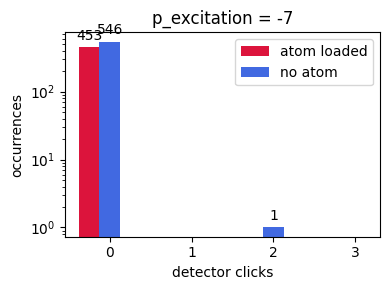

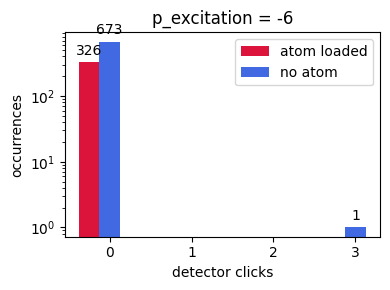

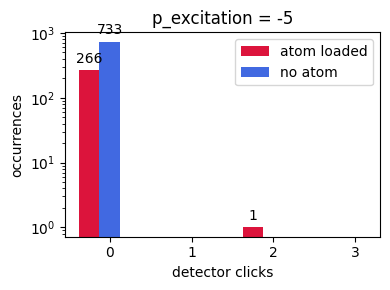

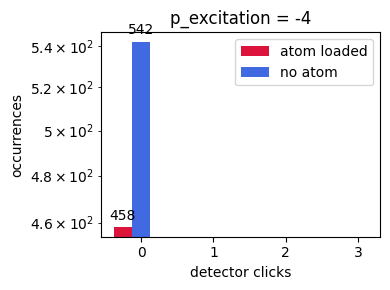

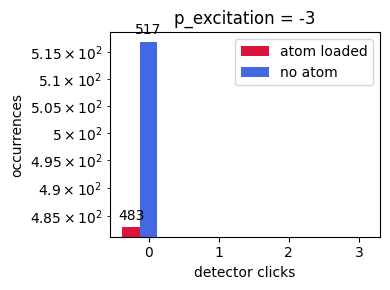

In [84]:
max_counts = max(excitation_counts)+1
bins = list(np.array(list(range(max_counts+1))))

for i, var_value in zip(range(iterations),scan_sequence1):

    photons_iteration_i = excitation_counts[measurements*i:measurements*(i+1)]
    shot1 = photocounts[i*measurements:(i+1)*measurements]

    xlabels = [str(x) for x in range(max_counts)]
    barlegend = ["atom loaded","no atom"]
    colors = ['crimson','royalblue']
    x = np.arange(len(xlabels))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0
    
    photons_with_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s > cutoff1])
    photons_no_atom = np.array([p for p,s in zip(photons_iteration_i,shot1) if s <= cutoff1])

    fig,ax = plt.subplots(figsize=(4,3))
    for data, label, color in zip([photons_with_atom,photons_no_atom],barlegend,colors):
        offset = width * multiplier
        rects = ax.bar(x + offset, np.histogram(data, bins=bins)[0], width, label=label, color=color)
        ax.bar_label(rects, padding=3)
        multiplier += 1
    ax.legend(loc='upper right')
    # ax.bar(x, np.histogram(photons_iteration_i, bins=bins)[0])

    ax.set_yscale('log')
    ax.set_ylabel('occurrences')
    ax.set_xlabel('detector clicks')
    ax.set_xticks(x + width, x)
    ax.set_title(f"{scan_variable1_name} = {var_value}")
    # ax.legend(loc='upper left', ncols=3)

    fig.tight_layout()
    plt.show()